# Setup

In [1]:
### Packages import
import os
import gc
import time
from time import strftime
import sys
print(sys.maxsize > 2**32)
start_time = time.time()

import json

import numpy as np
import pandas as pd
import pickle

import torch
from torchvision import models
from src.cuda_checker import cuda_torch_check, memory_checker

### My modules import
from src.data_loader import argObj, data_loaders_stimuli_fmri, transform_layers, transform_layers_test, load_roi_masks_challenge_from_list_of_ROI, from_config_dict_to_submission_name, save_json_file, FileNameGenerator
from src import image_preprocessing
from src.feature_extraction import model_loader, fit_pca, pca_batch_calculator, extract_and_pca_features, extract_features_no_pca
from src.encoding import linear_regression, ridge_alpha_grid_search
from src.evaluation_metrics import median_squared_noisenorm_correlation
from src.visualize import histogram, box_plot, noise_norm_corr_ROI, final_subj_corr_dataframe_boxplot_istograms, color, noise_norm_corr_ROI_df, find_best_performing_layer, json_config_to_feature_extraction_dict_5, json_config_to_feature_extraction_dict_6, median_squared_noisenorm_correlation_dataframe_results

### Cuda setup and check
import torch
import matplotlib as mpl
import argparse
import plotly.express as px
import pandas as pd

True


In [25]:
# start_subj = 1
# end_subj = 8
# datetime_id = strftime("(%Y-%m-%d_%H-%M)")
# ### Path definition
# # Data folder definition
# data_home_dir = '../Datasets/Biomedical'
# data_dir = '../Datasets/Biomedical/algonauts_2023_challenge_data'
# ncsnr_dir = '../Datasets/Biomedical/algonauts_ncsnr'
# images_trials_dir = '../Datasets/Biomedical/algonauts_train_images_trials'

In [26]:
# for subj in list(range(start_subj, end_subj+1)):
#     config_subj = subj
#     print(config_subj)
#     extraction_config_folder = f'config_subj{config_subj}'
#     global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
#     # Importing the df containing ROI_wise accuracy for all the layers tested in the past
#     median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
#                                                                 f"scores_subj_layer_roi.csv"), index_col=0)
#     
#     alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
#                                                                 "alpha_subj_layer.csv"), index_col=0)
#     print(median_roi_correlation_df_global.iloc[:, :2].head(5))
#     print(alpha_df_global.head(5))

In [27]:
# select first 2 columns
# median_roi_correlation_df_global.iloc[:, :2].head(5)

# Bridge Tables

## AlexNet

In [24]:
# Dati per la tabella di AlexNet
alexnet_data = {
    'Index': ['1', '4', '7', '9', '10', '11', '12'],
    'Layer': ['features.1', 'features.4', 'features.7', 'features.9', 'features.10', 'features.11', 'features.12'],
    'LayerType': ['conv1 ReLU', 'conv2 ReLU', 'conv3 ReLU', 'conv4 ReLU', 'conv5', 'conv5 ReLU', 'conv5 maxpool']
}

# Creazione del DataFrame per AlexNet
bridge_alexnet_layers_names = pd.DataFrame(alexnet_data)
bridge_alexnet_layers_names

,Index,Layer,LayerType
0,1,features.1,conv1 ReLU
1,4,features.4,conv2 ReLU
2,7,features.7,conv3 ReLU
3,9,features.9,conv4 ReLU
4,10,features.10,conv5
5,11,features.11,conv5 ReLU
6,12,features.12,conv5 maxpool


## ZFNet

In [25]:
# Dati per la tabella di ZFNet
ZFNet_data = {
    'Index': ['5', '8', '10', '12', '13'],
    'Layer': ['features.stage2.unit1.activ', 'features.stage3.unit1.activ', 'features.stage3.unit2.activ',
              'features.stage3.unit3.activ', 'features.stage3.pool3'],
    'LayerType': ['conv1 ReLU', 'conv2 ReLU', 'conv3 ReLU', 'conv4 ReLU', 'conv5 maxpool']
}

# Creazione del DataFrame per ZFNet
bridge_ZFNet_layers_names = pd.DataFrame(ZFNet_data)
bridge_ZFNet_layers_names

,Index,Layer,LayerType
0,5,features.stage2.unit1.activ,conv1 ReLU
1,8,features.stage3.unit1.activ,conv2 ReLU
2,10,features.stage3.unit2.activ,conv3 ReLU
3,12,features.stage3.unit3.activ,conv4 ReLU
4,13,features.stage3.pool3,conv5 maxpool


## VGGs

In [26]:
# Dati per la tabella di ZFNet
vgg16_data = {
    'Index': ['14'],
    'Layer': ['avgpool'],
    'LayerType': ['avgpool']
}

# Creazione del DataFrame per ZFNet
bridge_vgg16_layers_names = pd.DataFrame(vgg16_data)
bridge_vgg16_layers_names

,Index,Layer,LayerType
0,14,avgpool,avgpool


In [27]:
# Dati per la tabella di ZFNet
vgg16_bn_data = {
    'Index': ['13', '15'],
    'Layer': ['features.43', 'flatten'],
    'LayerType': ['conv13 maxpool', 'flatten']
}

# Creazione del DataFrame per ZFNet
bridge_vgg16_bn_layers_names = pd.DataFrame(vgg16_bn_data)
bridge_vgg16_bn_layers_names

,Index,Layer,LayerType
0,13,features.43,conv13 maxpool
1,15,flatten,flatten


In [28]:
# Dati per la tabella di ZFNet
vgg19_data = {
    'Index': ['15', '16', '17'],
    'Layer': ['features.33', 'features.35', 'avgpool'],
    'LayerType': ['conv15', 'conv16', 'avgpool']
}

# Creazione del DataFrame per ZFNet
bridge_vgg19_layers_names = pd.DataFrame(vgg19_data)
bridge_vgg19_layers_names

,Index,Layer,LayerType
0,15,features.33,conv15
1,16,features.35,conv16
2,17,avgpool,avgpool


In [29]:
# Dati per la tabella di ZFNet
vgg19_bn_data = {
    'Index': ['13', '14', '16', '17'],
    'Layer': ['features.42', 'features.45', 'features.51', 'avgpool'],
    'LayerType': ['conv13', 'conv14', 'conv16 maxpool', 'avgpool']
}

# Creazione del DataFrame per ZFNet
bridge_vgg19_bn_layers_names = pd.DataFrame(vgg19_bn_data)
bridge_vgg19_bn_layers_names

,Index,Layer,LayerType
0,13,features.42,conv13
1,14,features.45,conv14
2,16,features.51,conv16 maxpool
3,17,avgpool,avgpool


## ResNet-50 (Supervised vs DINOv1)

resnet50 and dino_res50

Sembra che
- .relu, .relu_1 e .relu_2 indichino rispettivamente i relu dopo il primo, secondo e terzo blocco di convoluzione. Anche se printando l'architettura viene solo (relu).
- però ha senso che ci sia un ReLU dopo ogni conv

In [30]:
# Dati per la tabella
resnet50_data = {
    'Index': ['2', '5', '8', '11', '14', '17', '20', '23', '26', '29', '32', '35', '38', '41', '44', '47', '50'],
    'Layer': ['layer1.0.relu', 'layer1.1.relu', 'layer1.2.relu', 'layer2.0.relu', 'layer2.1.relu',
              'layer2.2.relu', 'layer2.3.relu', 'layer3.0.relu', 'layer3.1.relu', 'layer3.2.relu',
              'layer3.3.relu', 'layer3.4.relu', 'layer3.5.relu', 'layer4.0.relu', 'layer4.1.relu',
              'layer4.2.relu', 'avgpool'],
    'LayerType': ['conv2 ReLU', 'conv5 ReLU', 'conv8 ReLU', 'conv11 ReLU', 'conv14 ReLU', 'conv17 ReLU', 'conv20 ReLU', 'conv23 ReLU', 'conv26 ReLU', 'conv29 ReLU', 'conv32 ReLU', 'conv35 ReLU', 'conv38 ReLU', 'conv41 ReLU', 'conv44 ReLU', 'conv47 ReLU', 'avgpool']
}

# Creazione del DataFrame
bridge_resnet50_layers_names = pd.DataFrame(resnet50_data)
bridge_resnet50_layers_names

,Index,Layer,LayerType
0,2,layer1.0.relu,conv2 ReLU
1,5,layer1.1.relu,conv5 ReLU
2,8,layer1.2.relu,conv8 ReLU
3,11,layer2.0.relu,conv11 ReLU
4,14,layer2.1.relu,conv14 ReLU
5,17,layer2.2.relu,conv17 ReLU
6,20,layer2.3.relu,conv20 ReLU
7,23,layer3.0.relu,conv23 ReLU
8,26,layer3.1.relu,conv26 ReLU
9,29,layer3.2.relu,conv29 ReLU


In [31]:
# Dati per la tabella
dino_res50_data = {
    'Index': ['2', '5', '8', '11', '14', '17', '20', '23', '26', '29', '32', '35', '38', '41', '44', '47', '50'],
    'Layer': ['layer1.0.relu', 'layer1.1.relu', 'layer1.2.relu', 'layer2.0.relu', 'layer2.1.relu',
              'layer2.2.relu', 'layer2.3.relu', 'layer3.0.relu', 'layer3.1.relu', 'layer3.2.relu',
              'layer3.3.relu', 'layer3.4.relu', 'layer3.5.relu', 'layer4.0.relu', 'layer4.1.relu',
              'layer4.2.relu', 'avgpool'],
    'LayerType': ['conv2 ReLU', 'conv5 ReLU', 'conv8 ReLU', 'conv11 ReLU', 'conv14 ReLU', 'conv17 ReLU', 'conv20 ReLU', 'conv23 ReLU', 'conv26 ReLU', 'conv29 ReLU', 'conv32 ReLU', 'conv35 ReLU', 'conv38 ReLU', 'conv41 ReLU', 'conv44 ReLU', 'conv47 ReLU', 'avgpool']
}

# Creazione del DataFrame
bridge_dino_res50_layers_names = pd.DataFrame(dino_res50_data)
bridge_dino_res50_layers_names

,Index,Layer,LayerType
0,2,layer1.0.relu,conv2 ReLU
1,5,layer1.1.relu,conv5 ReLU
2,8,layer1.2.relu,conv8 ReLU
3,11,layer2.0.relu,conv11 ReLU
4,14,layer2.1.relu,conv14 ReLU
5,17,layer2.2.relu,conv17 ReLU
6,20,layer2.3.relu,conv20 ReLU
7,23,layer3.0.relu,conv23 ReLU
8,26,layer3.1.relu,conv26 ReLU
9,29,layer3.2.relu,conv29 ReLU


## RetinaNet

In [32]:
# Dati per la tabella
RetinaNet_data = {
    'Index': ['13', '16', '19', '22', '25', '26', '28', '31', '34', '37', '39', '40', '43', '46', '47', '48', '49', '50'],
    'Layer': ['body.layer2.0.relu_2', 'body.layer2.1.relu_2', 'body.layer2.2.relu_2', 'body.layer2.3.relu_2', 'body.layer3.0.relu_2', 'body.layer3.1.relu', 'body.layer3.1.relu_2', 'body.layer3.2.relu_2', 'body.layer3.3.relu_2', 'body.layer3.4.relu_2', 'body.layer3.5.relu_1', 'body.layer3.5.relu_2', 'body.layer4.0.relu_2', 'body.layer4.1.relu_2', 'body.layer4.2.relu', 'body.layer4.2.relu_1', 'body.layer4.2.relu_2', 'fpn'],
    'LayerType': ['conv13 ReLU', 'conv16 ReLU', 'conv19 ReLU', 'conv22 ReLU', 'conv25 ReLU', 'conv26 ReLU', 'conv28 ReLU', 'conv31 ReLU', 'conv34 ReLU', 'conv37 ReLU', 'conv39 ReLU', 'conv40 ReLU', 'conv43 ReLU', 'conv46 ReLU', 'conv47 ReLU', 'conv48 ReLU', 'conv49 ReLU', 'Feature Pyramid Network 5 Layers']
}

# Creazione del DataFrame
bridge_RetinaNet_layers_names = pd.DataFrame(RetinaNet_data)
bridge_RetinaNet_layers_names

,Index,Layer,LayerType
0,13,body.layer2.0.relu_2,conv13 ReLU
1,16,body.layer2.1.relu_2,conv16 ReLU
2,19,body.layer2.2.relu_2,conv19 ReLU
3,22,body.layer2.3.relu_2,conv22 ReLU
4,25,body.layer3.0.relu_2,conv25 ReLU
5,26,body.layer3.1.relu,conv26 ReLU
6,28,body.layer3.1.relu_2,conv28 ReLU
7,31,body.layer3.2.relu_2,conv31 ReLU
8,34,body.layer3.3.relu_2,conv34 ReLU
9,37,body.layer3.4.relu_2,conv37 ReLU


## EfficientNet-B2

EfficientNet-B2 ha 184 Layer di convoluzione, in totale 342 organizzati in 8 blocchi

In [33]:
import pandas as pd
# Dati per la tabella
efficientnetb2_data = {
    'Index': ['3.0', '3.2', '4.1', '5.1', '6.4', '7.0', '8.0', '9.0', '9.1'],
    'Layer': ['features.3.0.block.2', 'features.3.2.block.3', 'features.4.1.block.3', 'features.5.1.block.2', 'features.6.4.block.3', 'features.7.0.block.3', 'features.8', 'avgpool', 'flatten'],
    'LayerType': ['block3 MBconv1','block3 MBconv3', 'block4 MBconv2', 'block5 MBconv2', 'block6 MBconv5', 'block7 MBconv1', 'block8 MBconv1', 'avgpool', 'flatten']
}
# Creazione del DataFrame
bridge_efficientnetb2_layers_names = pd.DataFrame(efficientnetb2_data)
bridge_efficientnetb2_layers_names

,Index,Layer,LayerType
0,3.0,features.3.0.block.2,block3 MBconv1
1,3.2,features.3.2.block.3,block3 MBconv3
2,4.1,features.4.1.block.3,block4 MBconv2
3,5.1,features.5.1.block.2,block5 MBconv2
4,6.4,features.6.4.block.3,block6 MBconv5
5,7.0,features.7.0.block.3,block7 MBconv1
6,8.0,features.8,block8 MBconv1
7,9.0,avgpool,avgpool
8,9.1,flatten,flatten


## ViTs

ViT-S/14 distilled o DINOv2s 

In [36]:
import pandas as pd
# Dati per la tabella
DINOv2s_data = {
    'Index': ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13'],
    'Layer': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', 'head'],
    'LayerType': ['block1 CLS token', 'block2 CLS token', 'block3 CLS token', 'block4 CLS token', 'block5 CLS token', 'block6 CLS token', 'block7 CLS token', 'block8 CLS token', 'block9 CLS token', 'block10 CLS token', 'block11 CLS token', 'block12 CLS token', 'normalization head']
}
# Creazione del DataFrame
bridge_DINOv2s_layers_names = pd.DataFrame(DINOv2s_data)
bridge_DINOv2s_layers_names

,Index,Layer,LayerType
0,1,0,block1 CLS token
1,2,1,block2 CLS token
2,3,2,block3 CLS token
3,4,3,block4 CLS token
4,5,4,block5 CLS token
5,6,5,block6 CLS token
6,7,6,block7 CLS token
7,8,7,block8 CLS token
8,9,8,block9 CLS token
9,10,9,block10 CLS token


ViT-B/14 distilled o DINOv2b

In [37]:
import pandas as pd
# Dati per la tabella
DINOv2b_data = {
    'Index': ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13'],
    'Layer': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', 'head'],
    'LayerType': ['block1 CLS token', 'block2 CLS token', 'block3 CLS token', 'block4 CLS token', 'block5 CLS token', 'block6 CLS token', 'block7 CLS token', 'block8 CLS token', 'block9 CLS token', 'block10 CLS token', 'block11 CLS token', 'block12 CLS token', 'normalization head']
}
# Creazione del DataFrame
bridge_DINOv2b_layers_names = pd.DataFrame(DINOv2b_data)
bridge_DINOv2b_layers_names

,Index,Layer,LayerType
0,1,0,block1 CLS token
1,2,1,block2 CLS token
2,3,2,block3 CLS token
3,4,3,block4 CLS token
4,5,4,block5 CLS token
5,6,5,block6 CLS token
6,7,6,block7 CLS token
7,8,7,block8 CLS token
8,9,8,block9 CLS token
9,10,9,block10 CLS token


ViT-L/14 distilled o DINOv2l

In [38]:
import pandas as pd

# Dati per la tabella
DINOv2l_data = {
    'Index': ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25'],
    'Layer': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', 'head'],
    'LayerType': ['block1 CLS token', 'block2 CLS token', 'block3 CLS token', 'block4 CLS token',
                  'block5 CLS token', 'block6 CLS token', 'block7 CLS token', 'block8 CLS token',
                  'block9 CLS token', 'block10 CLS token', 'block11 CLS token', 'block12 CLS token',
                  'block13 CLS token', 'block14 CLS token', 'block15 CLS token', 'block16 CLS token',
                  'block17 CLS token', 'block18 CLS token', 'block19 CLS token', 'block20 CLS token',
                  'block21 CLS token', 'block22 CLS token', 'block23 CLS token', 'block24 CLS token',
                  'normalization head']
}

# Creazione del DataFrame
bridge_DINOv2l_layers_names = pd.DataFrame(DINOv2l_data)
bridge_DINOv2l_layers_names

,Index,Layer,LayerType
0,1,0,block1 CLS token
1,2,1,block2 CLS token
2,3,2,block3 CLS token
3,4,3,block4 CLS token
4,5,4,block5 CLS token
5,6,5,block6 CLS token
6,7,6,block7 CLS token
7,8,7,block8 CLS token
8,9,8,block9 CLS token
9,10,9,block10 CLS token


ViT-B/16-gpt2-image-captioning o ViT_GPT2

In [39]:
import pandas as pd

# Dati per la tabella
ViT_GPT2_data = {
    'Index': ['e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'd5','d6','d7','d8','d9', 'd10', 'd11', 'd12'],
    'Layer': ['encoder.4', 'encoder.5', 'encoder.6', 'encoder.7', 'encoder.8', 'encoder.9', 'encoder.10', 'encoder.11', 'encoder.12', 'decoder.5','decoder.6','decoder.7','decoder.8','decoder.9', 'decoder.10', 'decoder.11', 'decoder.12'],
    'LayerType': ['ViT encoder block 4', 'ViT encoder block 5', 'ViT encoder block 6', 'ViT encoder block 7', 'ViT encoder block 8', 'ViT encoder block 9', 'ViT encoder block 10', 'ViT encoder block 11', 'ViT encoder block 12', 'decoder GPT2Block 5','decoder GPT2Block 6','decoder GPT2Block 7','decoder GPT2Block 8','decoder GPT2Block 9', 'decoder GPT2Block 10', 'decoder GPT2Block 11', 'decoder GPT2Block 12']
}

# Creazione del DataFrame
bridge_ViT_GPT2_layers_names = pd.DataFrame(ViT_GPT2_data)
bridge_ViT_GPT2_layers_names

,Index,Layer,LayerType
0,e4,encoder.4,ViT encoder block 4
1,e5,encoder.5,ViT encoder block 5
2,e6,encoder.6,ViT encoder block 6
3,e7,encoder.7,ViT encoder block 7
4,e8,encoder.8,ViT encoder block 8
5,e9,encoder.9,ViT encoder block 9
6,e10,encoder.10,ViT encoder block 10
7,e11,encoder.11,ViT encoder block 11
8,e12,encoder.12,ViT encoder block 12
9,d5,decoder.5,decoder GPT2Block 5


# Subj1 TABLES

In [3]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

In [3]:
median_roi_correlation_df_global.head()

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown
DINOv2+0+dinov2_transform+ridge+2048+concat_pca,0.133941,0.117813,0.133935,0.129254,0.150911,0.162546,0.244706,0.564943,0.522551,0.632124,...,0.210690,0.274819,0.337756,0.530984,0.565549,0.454238,0.401692,0.432375,0.156794,0.587490
DINOv2+DINOv2+dinov2_transform+ridge+9999999+concat_pca,0.174738,0.154557,0.164305,0.180786,0.179375,0.218366,0.283107,0.584682,0.545540,0.655425,...,0.243839,0.311103,0.383891,0.559127,0.585894,0.484780,0.431469,0.464877,0.199642,0.619094
DINOv2b+0&1&2&3&4&5+dinov2_transform_V2+ridge+2048+concat_pca,0.310990,0.314170,0.310847,0.317844,0.319863,0.329200,0.407589,0.523153,0.550248,0.620163,...,0.341705,0.349912,0.454965,0.552145,0.527646,0.471386,0.451188,0.462935,0.364913,0.581325
DINOv2b+0&1&2&3+dinov2_transform_V2+ridge+2048+concat_pca,0.337579,0.328542,0.319667,0.320651,0.316830,0.327616,0.360045,0.396494,0.428113,0.474682,...,0.305202,0.296742,0.373682,0.415392,0.399904,0.357100,0.370358,0.348210,0.347788,0.438878
DINOv2b+0&1&2+dinov2_transform_V2+ridge+2048+concat_pca,0.279671,0.270697,0.230014,0.239292,0.229375,0.253590,0.271541,0.311632,0.335811,0.378094,...,0.227838,0.230656,0.292356,0.339640,0.317239,0.291550,0.297360,0.284099,0.281324,0.378379


## TM.5 TABELLA PONTE: NOME LAYER TORCH - INDICE

In [42]:
# Supponiamo che i DataFrame siano già stati creati
# bridge_alexnet_layers_names
# bridge_zfnet_layers_names
# bridge_vgg16_layers_names
# bridge_vgg16_bn_layers_names
# bridge_vgg19_layers_names
# bridge_vgg19_bn_layers_names
# bridge_resnet50_dino_res50_layers_names
# bridge_retinanet_layers_names
# bridge_efficientnetb2_layers_names
# bridge_DINOv2s_layers_names
# bridge_DINOv2b_layers_names
# bridge_DINOv2l_layers_names
# bridge_ViT_GPT2_layers_names

# Lista dei DataFrame da concatenare
datasets = [
    bridge_alexnet_layers_names,
    bridge_ZFNet_layers_names,
    bridge_vgg16_layers_names,
    bridge_vgg16_bn_layers_names,
    bridge_vgg19_layers_names,
    bridge_vgg19_bn_layers_names,
    bridge_resnet50_layers_names,
    bridge_dino_res50_layers_names,
    bridge_RetinaNet_layers_names,
    bridge_efficientnetb2_layers_names,
    bridge_DINOv2s_layers_names,
    bridge_DINOv2b_layers_names,
    bridge_DINOv2l_layers_names,
    bridge_ViT_GPT2_layers_names
]

# Concatenazione verticale
# Manually assign the "Pre-Trained Model Name" values to each dataset
model_names = [
    'alexnet', 'ZFNet', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn',
    'resnet50', 'dino_res50', 'RetinaNet', 'efficientnetb2',
    'DINOv2s', 'DINOv2b', 'DINOv2l', 'ViT_GPT2'
]

for dataset, model_name in zip(datasets, model_names):
    dataset['Pre-Trained Model Name'] = model_name
bridge_layers_names = pd.concat(datasets, axis=0, ignore_index=True)

# Rename columns
bridge_layers_names = bridge_layers_names.rename(columns={
    'Layer': 'Layer Torch Name',
    'LayerType': 'Layer Class'
})

# Reorder columns
bridge_layers_names = bridge_layers_names[['Pre-Trained Model Name', 'Index', 'Layer Torch Name', 'Layer Class']]

bridge_layers_names

,Pre-Trained Model Name,Index,Layer Torch Name,Layer Class
0,alexnet,1,features.1,conv1 ReLU
1,alexnet,4,features.4,conv2 ReLU
2,alexnet,7,features.7,conv3 ReLU
3,alexnet,9,features.9,conv4 ReLU
4,alexnet,10,features.10,conv5
...,...,...,...,...
146,ViT_GPT2,d8,decoder.8,decoder GPT2Block 8
147,ViT_GPT2,d9,decoder.9,decoder GPT2Block 9
148,ViT_GPT2,d10,decoder.10,decoder GPT2Block 10
149,ViT_GPT2,d11,decoder.11,decoder GPT2Block 11


In [43]:
# save bridge_layers_names df to csv
bridge_layers_names.to_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"))

Importa Tabella Ponte

In [44]:
# import TABLE_bridge_layers_names.csv
bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)
bridge_layers_names.head()

,Pre-Trained Model Name,Index,Layer Torch Name,Layer Class
0,alexnet,1,features.1,conv1 ReLU
1,alexnet,4,features.4,conv2 ReLU
2,alexnet,7,features.7,conv3 ReLU
3,alexnet,9,features.9,conv4 ReLU
4,alexnet,10,features.10,conv5


## TM.4 Tabella Ponte CONF.ID - Caratteristiche (FULL)

Importa Tabella Ponte

In [6]:
# import TABLE_bridge_layers_names.csv
bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)
bridge_layers_names.head()

,Pre-Trained Model Name,Index,Layer Torch Name,Layer Class
0,alexnet,1,features.1,conv1 ReLU
1,alexnet,4,features.4,conv2 ReLU
2,alexnet,7,features.7,conv3 ReLU
3,alexnet,9,features.9,conv4 ReLU
4,alexnet,10,features.10,conv5


Importa tabella  Tabella ROI-wise e Tabella Best Alpha

In [7]:
import os
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

In [8]:
median_roi_correlation_df_global.head()

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown
DINOv2+0+dinov2_transform+ridge+2048+concat_pca,0.133941,0.117813,0.133935,0.129254,0.150911,0.162546,0.244706,0.564943,0.522551,0.632124,...,0.210690,0.274819,0.337756,0.530984,0.565549,0.454238,0.401692,0.432375,0.156794,0.587490
DINOv2+DINOv2+dinov2_transform+ridge+9999999+concat_pca,0.174738,0.154557,0.164305,0.180786,0.179375,0.218366,0.283107,0.584682,0.545540,0.655425,...,0.243839,0.311103,0.383891,0.559127,0.585894,0.484780,0.431469,0.464877,0.199642,0.619094
DINOv2b+0&1&2&3&4&5+dinov2_transform_V2+ridge+2048+concat_pca,0.310990,0.314170,0.310847,0.317844,0.319863,0.329200,0.407589,0.523153,0.550248,0.620163,...,0.341705,0.349912,0.454965,0.552145,0.527646,0.471386,0.451188,0.462935,0.364913,0.581325
DINOv2b+0&1&2&3+dinov2_transform_V2+ridge+2048+concat_pca,0.337579,0.328542,0.319667,0.320651,0.316830,0.327616,0.360045,0.396494,0.428113,0.474682,...,0.305202,0.296742,0.373682,0.415392,0.399904,0.357100,0.370358,0.348210,0.347788,0.438878
DINOv2b+0&1&2+dinov2_transform_V2+ridge+2048+concat_pca,0.279671,0.270697,0.230014,0.239292,0.229375,0.253590,0.271541,0.311632,0.335811,0.378094,...,0.227838,0.230656,0.292356,0.339640,0.317239,0.291550,0.297360,0.284099,0.281324,0.378379


In [48]:
alpha_df_global.head()

,alpha_l,alpha_r
DINOv2+0+dinov2_transform+ridge+2048+concat_pca,20000.0,20000.0
DINOv2+DINOv2+dinov2_transform+ridge+9999999+concat_pca,20000.0,20000.0
DINOv2b+0&1&2&3&4&5+dinov2_transform_V2+ridge+2048+concat_pca,1000.0,1000.0
DINOv2b+0&1&2&3+dinov2_transform_V2+ridge+2048+concat_pca,100.0,100.0
DINOv2b+0&1&2+dinov2_transform_V2+ridge+2048+concat_pca,100.0,100.0


Crea tm4_bridge_confid_confspecs

In [9]:
# Assuming median_roi_correlation_df_global is your original dataset
# Replace 'your_original_dataset' with the actual variable name if it's different

# Extract indices from median_roi_correlation_df_global
indices = median_roi_correlation_df_global.index

# Create a new dataframe with only the indices
tm4_bridge_confid_confspecs = pd.DataFrame({'Index': indices})

# Split the indices into new columns
tm4_bridge_confid_confspecs[['Pre-Trained Model Name',
                             'Output Layers Torch Name',
                             'Image Pre-Processing ID',
                             'Regression',
                             'PCA Components',
                             'Feature Fusion Mode']] = tm4_bridge_confid_confspecs['Index'].str.split('+', expand=True)

# Manipulate columns as specified
# Convert 'Output Layers Torch Name' to lists
tm4_bridge_confid_confspecs['Output Layers Torch Name'] = tm4_bridge_confid_confspecs['Output Layers Torch Name'].str.split('&')

# Replace 9999999 with "No PCA" in 'PCA Components'
tm4_bridge_confid_confspecs['PCA Components'] = tm4_bridge_confid_confspecs['PCA Components'].replace('9999999', 'No PCA')

# Reorder columns
tm4_bridge_confid_confspecs = tm4_bridge_confid_confspecs[['Pre-Trained Model Name',
                                                           'Output Layers Torch Name',
                                                           'Image Pre-Processing ID',
                                                           'Regression',
                                                           'PCA Components',
                                                           'Feature Fusion Mode',
                                                           'Index']]

tm4_bridge_confid_confspecs = tm4_bridge_confid_confspecs.rename(columns={'Index': 'Conf Name'})

# Reorder columns with 'Conf Name' as the first column
tm4_bridge_confid_confspecs = tm4_bridge_confid_confspecs[['Conf Name',
                                                           'Pre-Trained Model Name',
                                                           'Output Layers Torch Name',
                                                           'Image Pre-Processing ID',
                                                           'Regression',
                                                           'PCA Components',
                                                           'Feature Fusion Mode']]

# Calculate the number of elements in each list in 'Output Layers Torch Name'
tm4_bridge_confid_confspecs['Num Output Layers'] = tm4_bridge_confid_confspecs['Output Layers Torch Name'].apply(lambda x: len(x))

# Modify 'PCA Components' based on the condition
tm4_bridge_confid_confspecs['PCA Components'] = tm4_bridge_confid_confspecs.apply(
    lambda row: row['PCA Components'] + f"x{row['Num Output Layers']}" if (row['Num Output Layers'] > 1) and (row['PCA Components'] != "No PCA") else row['PCA Components'],
    axis=1
)

# Drop the temporary column
tm4_bridge_confid_confspecs = tm4_bridge_confid_confspecs.drop(columns=['Num Output Layers'])

tm4_bridge_confid_confspecs['Output Layers Torch Name'] = tm4_bridge_confid_confspecs['Output Layers Torch Name'].apply(
    lambda x: ['head' if layer == 'DINOv2' else layer for layer in x]
)


# Reorder columns
tm4_bridge_confid_confspecs = tm4_bridge_confid_confspecs[['Conf Name',
                                                           'Pre-Trained Model Name',
                                                           'Output Layers Torch Name',
                                                           'Image Pre-Processing ID',
                                                           'Regression',
                                                           'PCA Components',
                                                           'Feature Fusion Mode']]

# Display the resulting dataframe
tm4_bridge_confid_confspecs

,Conf Name,Pre-Trained Model Name,Output Layers Torch Name,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode
0,DINOv2+0+dinov2_transform+ridge+2048+concat_pca,DINOv2,[0],dinov2_transform,ridge,2048,concat_pca
1,DINOv2+DINOv2+dinov2_transform+ridge+9999999+c...,DINOv2,[head],dinov2_transform,ridge,No PCA,concat_pca
2,DINOv2b+0&1&2&3&4&5+dinov2_transform_V2+ridge+...,DINOv2b,"[0, 1, 2, 3, 4, 5]",dinov2_transform_V2,ridge,2048x6,concat_pca
3,DINOv2b+0&1&2&3+dinov2_transform_V2+ridge+2048...,DINOv2b,"[0, 1, 2, 3]",dinov2_transform_V2,ridge,2048x4,concat_pca
4,DINOv2b+0&1&2+dinov2_transform_V2+ridge+2048+c...,DINOv2b,"[0, 1, 2]",dinov2_transform_V2,ridge,2048x3,concat_pca
...,...,...,...,...,...,...,...
235,vgg19+features.35+imagenet_transform_alt+ridge...,vgg19,[features.35],imagenet_transform_alt,ridge,2048,concat_pca
236,vgg19_bn+avgpool+imagenet_transform_alt+ridge+...,vgg19_bn,[avgpool],imagenet_transform_alt,ridge,2048,concat_pca
237,vgg19_bn+features.42+imagenet_transform_alt+ri...,vgg19_bn,[features.42],imagenet_transform_alt,ridge,2048,concat_pca
238,vgg19_bn+features.45+imagenet_transform_alt+ri...,vgg19_bn,[features.45],imagenet_transform_alt,ridge,2048,concat_pca


Aggiungi LAYER ID, e Layer class + Aggiustamenti

In [50]:
unique_pretrained_models = bridge_layers_names['Pre-Trained Model Name'].unique()
unique_pretrained_models

array(['alexnet', 'ZFNet', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn',
       'resnet50', 'dino_res50', 'RetinaNet', 'efficientnetb2', 'DINOv2s',
       'DINOv2b', 'DINOv2l', 'ViT_GPT2'], dtype=object)

In [61]:
unique_pretrained_models = bridge_layers_names['Pre-Trained Model Name'].unique()
concatenated_tm4_bridge_subsets = []

for pretrained_model in unique_pretrained_models:
    print(pretrained_model)
    # Select subset from bridge_layers_names
    subset_bridge = bridge_layers_names[bridge_layers_names['Pre-Trained Model Name'] == pretrained_model]
    # Select subset from tm4_bridge_confid_confspecs
    subset_tm4_bridge = tm4_bridge_confid_confspecs[tm4_bridge_confid_confspecs['Pre-Trained Model Name'] == pretrained_model]
    # Create a dictionary mapping 'Layer Torch Name' to 'Index' from 'bridge_layers_names'
    layer_name_to_index = dict(zip(subset_bridge['Layer Torch Name'],         subset_bridge['Index']))
    print(layer_name_to_index)
    
    layer_name_to_class = dict(zip(subset_bridge['Layer Torch Name'],         subset_bridge['Layer Class']))
    print(layer_name_to_class)

    def replace_with_index(layer_names):
        return [layer_name_to_index.get(name, name) for name in layer_names]
    
    def replace_with_class(layer_names):
        return [layer_name_to_class.get(name, name) for name in layer_names]
    
    subset_tm4_bridge['Output Layers Index'] = subset_tm4_bridge['Output Layers Torch Name'].apply(replace_with_index)
    
    subset_tm4_bridge['Output Layers Class'] = subset_tm4_bridge['Output Layers Torch Name'].apply(replace_with_class)
    concatenated_tm4_bridge_subsets.append(subset_tm4_bridge)
    
# Reorder columns
tm4_bridge_confid_confspecs_FULL = pd.concat(concatenated_tm4_bridge_subsets, ignore_index=True)
tm4_bridge_confid_confspecs_FULL = tm4_bridge_confid_confspecs_FULL[['Conf Name',
                                                           'Pre-Trained Model Name',
                                                           'Output Layers Torch Name',
                                                           'Output Layers Index',
                                                           'Output Layers Class',
                                                           'Image Pre-Processing ID',
                                                           'Regression',
                                                           'PCA Components',
                                                           'Feature Fusion Mode']]
tm4_bridge_confid_confspecs_FULL

alexnet
{'features.1': '1', 'features.4': '4', 'features.7': '7', 'features.9': '9', 'features.10': '10', 'features.11': '11', 'features.12': '12'}
{'features.1': 'conv1 ReLU', 'features.4': 'conv2 ReLU', 'features.7': 'conv3 ReLU', 'features.9': 'conv4 ReLU', 'features.10': 'conv5', 'features.11': 'conv5 ReLU', 'features.12': 'conv5 maxpool'}
ZFNet
{'features.stage2.unit1.activ': '5', 'features.stage3.unit1.activ': '8', 'features.stage3.unit2.activ': '10', 'features.stage3.unit3.activ': '12', 'features.stage3.pool3': '13'}
{'features.stage2.unit1.activ': 'conv1 ReLU', 'features.stage3.unit1.activ': 'conv2 ReLU', 'features.stage3.unit2.activ': 'conv3 ReLU', 'features.stage3.unit3.activ': 'conv4 ReLU', 'features.stage3.pool3': 'conv5 maxpool'}
vgg16
{'avgpool': '14'}
{'avgpool': 'avgpool'}
vgg16_bn
{'features.43': '13', 'flatten': '15'}
{'features.43': 'conv13 maxpool', 'flatten': 'flatten'}
vgg19
{'features.33': '15', 'features.35': '16', 'avgpool': '17'}
{'features.33': 'conv15', 'fea

C:\Users\giorg\AppData\Local\Temp\ipykernel_628564\395729792.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_tm4_bridge['Output Layers Index'] = subset_tm4_bridge['Output Layers Torch Name'].apply(replace_with_index)
C:\Users\giorg\AppData\Local\Temp\ipykernel_628564\395729792.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_tm4_bridge['Output Layers Class'] = subset_tm4_bridge['Output Layers Torch Name'].apply(replace_with_class)
C:\Users\giorg\AppData\Local\Temp\ipykernel_628564\395

,Conf Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode
0,alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,[features.1],[1],[conv1 ReLU],imagenet_V2_transform,ridge,2048,concat_pca
1,alexnet+features.1+imagenet_transform_alt+line...,alexnet,[features.1],[1],[conv1 ReLU],imagenet_transform_alt,linear,2048,concat_pca
2,alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,[features.1],[1],[conv1 ReLU],imagenet_transform_alt,ridge,2048,concat_pca
3,alexnet+features.10&features.11&features.12+im...,alexnet,"[features.10, features.11, features.12]","[10, 11, 12]","[conv5, conv5 ReLU, conv5 maxpool]",imagenet_V2_transform,ridge,2048x3,concat_pca
4,alexnet+features.10&features.11&features.12+im...,alexnet,"[features.10, features.11, features.12]","[10, 11, 12]","[conv5, conv5 ReLU, conv5 maxpool]",imagenet_transform_alt,linear,2048x3,concat_pca
...,...,...,...,...,...,...,...,...,...
233,ViT_GPT2+encoder.8+ViT_GPT2_transform+ridge+20...,ViT_GPT2,[encoder.8],[e8],[ViT encoder block 8],ViT_GPT2_transform,ridge,2048,pca_concat
234,ViT_GPT2+encoder.9&decoder.9+ViT_GPT2_transfor...,ViT_GPT2,"[encoder.9, decoder.9]","[e9, d9]","[ViT encoder block 9, decoder GPT2Block 9]",ViT_GPT2_transform,ridge,512x2,pca_concat
235,ViT_GPT2+encoder.9&encoder.10&encoder.11&encod...,ViT_GPT2,"[encoder.9, encoder.10, encoder.11, encoder.12...","[e9, e10, e11, e12, d9, d10, d11, d12]","[ViT encoder block 9, ViT encoder block 10, Vi...",ViT_GPT2_transform,ridge,512x8,pca_concat
236,ViT_GPT2+encoder.9&encoder.10&encoder.11&encod...,ViT_GPT2,"[encoder.9, encoder.10, encoder.11, encoder.12]","[e9, e10, e11, e12]","[ViT encoder block 9, ViT encoder block 10, Vi...",ViT_GPT2_transform,ridge,512x4,pca_concat


In [62]:
import re

def rimuovi_lettere(input_string):
    return re.sub(r'[^0-9]', '', input_string)

# Define the custom ordering for "Pre-Trained Model Name"
custom_order = ['alexnet', 'ZFNet', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn',
                'resnet50', 'dino_res50', 'RetinaNet', 'efficientnetb2', 'DINOv2s',
                'DINOv2b', 'DINOv2l', 'ViT_GPT2']

# Convert "Pre-Trained Model Name" to a categorical type with custom ordering
tm4_bridge_confid_confspecs_FULL['Pre-Trained Model Name'] = pd.Categorical(
    tm4_bridge_confid_confspecs_FULL['Pre-Trained Model Name'],
    categories=custom_order,
    ordered=True
)

# Create a helper column with the first element of each list in 'Output Layers Index'
tm4_bridge_confid_confspecs_FULL['First Output Layer Index'] = tm4_bridge_confid_confspecs_FULL['Output Layers Index'].apply(
    lambda x: int(x[0]) if x[0].isdigit() else (int(rimuovi_lettere(x[0])) if 'e' in x[0] else 1000*int(rimuovi_lettere(x[0])))
)

# Sort the dataframe first by "Pre-Trained Model Name" and then by the first value in the 'Output Layers Index'
tm4_bridge_confid_confspecs_FULL = tm4_bridge_confid_confspecs_FULL.sort_values(
    by=['Pre-Trained Model Name', 'First Output Layer Index']
).reset_index(drop=True)

# Drop the helper column
tm4_bridge_confid_confspecs_FULL = tm4_bridge_confid_confspecs_FULL.drop(columns=['First Output Layer Index'])

# Display the resulting dataframe
print(tm4_bridge_confid_confspecs_FULL)

                                             Conf Name Pre-Trained Model Name  \
0    alexnet+features.1+imagenet_V2_transform+ridge...                alexnet   
1    alexnet+features.1+imagenet_transform_alt+line...                alexnet   
2    alexnet+features.1+imagenet_transform_alt+ridg...                alexnet   
3    alexnet+features.4+imagenet_V2_transform+ridge...                alexnet   
4    alexnet+features.4+imagenet_transform_alt+line...                alexnet   
..                                                 ...                    ...   
233  ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...               ViT_GPT2   
234  ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...               ViT_GPT2   
235  ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...               ViT_GPT2   
236  ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...               ViT_GPT2   
237  ViT_GPT2+decoder.12+ViT_GPT2_transform+ridge+2...               ViT_GPT2   

                           

In [63]:
tm4_bridge_confid_confspecs_FULL

,Conf Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode
0,alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,[features.1],[1],[conv1 ReLU],imagenet_V2_transform,ridge,2048,concat_pca
1,alexnet+features.1+imagenet_transform_alt+line...,alexnet,[features.1],[1],[conv1 ReLU],imagenet_transform_alt,linear,2048,concat_pca
2,alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,[features.1],[1],[conv1 ReLU],imagenet_transform_alt,ridge,2048,concat_pca
3,alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,[features.4],[4],[conv2 ReLU],imagenet_V2_transform,ridge,2048,concat_pca
4,alexnet+features.4+imagenet_transform_alt+line...,alexnet,[features.4],[4],[conv2 ReLU],imagenet_transform_alt,linear,2048,concat_pca
...,...,...,...,...,...,...,...,...,...
233,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,ViT_GPT2,"[decoder.9, decoder.10, decoder.11, decoder.12]","[d9, d10, d11, d12]","[decoder GPT2Block 9, decoder GPT2Block 10, de...",ViT_GPT2_transform,ridge,512x4,pca_concat
234,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,ViT_GPT2,[decoder.9],[d9],[decoder GPT2Block 9],ViT_GPT2_transform,ridge,2048,pca_concat
235,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,ViT_GPT2,[decoder.10],[d10],[decoder GPT2Block 10],ViT_GPT2_transform,ridge,2048,pca_concat
236,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,ViT_GPT2,[decoder.11],[d11],[decoder GPT2Block 11],ViT_GPT2_transform,ridge,2048,pca_concat


In [64]:
# save bridge_layers_names df to csv
tm4_bridge_confid_confspecs_FULL.to_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"))

Add ALPHA

In [4]:
tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)

In [5]:
# Effettua il left join
tm4_bridge_confid_confspecs_FULL = pd.merge(
    tm4_bridge_confid_confspecs_FULL,
    alpha_df_global,
    how='left',
    left_on='Conf Name',  # Colonna della prima tabella
    right_index=True  # Indice della seconda tabella
)

# Converti le colonne in notazione scientifica senza zeri dopo la virgola
tm4_bridge_confid_confspecs_FULL['alpha_l'] = tm4_bridge_confid_confspecs_FULL['alpha_l'].apply(lambda x: f'{x:.0e}')
tm4_bridge_confid_confspecs_FULL['alpha_r'] = tm4_bridge_confid_confspecs_FULL['alpha_r'].apply(lambda x: f'{x:.0e}')
# Visualizza il risultato
tm4_bridge_confid_confspecs_FULL

,Conf Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06
1,alexnet+features.1+imagenet_transform_alt+line...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan
2,alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,ridge,2048,concat_pca,1e+05,1e+05
3,alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06
4,alexnet+features.4+imagenet_transform_alt+line...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan
...,...,...,...,...,...,...,...,...,...,...,...
233,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,ViT_GPT2,"['decoder.9', 'decoder.10', 'decoder.11', 'dec...","['d9', 'd10', 'd11', 'd12']","['decoder GPT2Block 9', 'decoder GPT2Block 10'...",ViT_GPT2_transform,ridge,512x4,pca_concat,2e+06,2e+06
234,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,ViT_GPT2,['decoder.9'],['d9'],['decoder GPT2Block 9'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06
235,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,ViT_GPT2,['decoder.10'],['d10'],['decoder GPT2Block 10'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06
236,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,ViT_GPT2,['decoder.11'],['d11'],['decoder GPT2Block 11'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06


Creo **CONF. ID**

In [6]:
# Cambia il nome della colonna Conf Name
tm4_bridge_confid_confspecs_FULL = tm4_bridge_confid_confspecs_FULL.rename(columns={'Conf Name': 'Conf. Name'})

# Converti la colonna 'Output Layers Torch Name' in liste
tm4_bridge_confid_confspecs_FULL['Output Layers Index LIST'] = (
    tm4_bridge_confid_confspecs_FULL['Output Layers Index'].apply(eval)
)

# Crea la colonna "Conf. ID"
tm4_bridge_confid_confspecs_FULL['Conf. ID'] = (
    tm4_bridge_confid_confspecs_FULL['Pre-Trained Model Name'] +
    ' ' +
    tm4_bridge_confid_confspecs_FULL['Output Layers Index LIST'].apply(lambda x: '+'.join(x))
)

tm4_bridge_confid_confspecs_FULL.drop(columns=['Output Layers Index LIST'], inplace=True)
tm4_bridge_confid_confspecs_FULL

,Conf. Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r,Conf. ID
0,alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06,alexnet 1
1,alexnet+features.1+imagenet_transform_alt+line...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan,alexnet 1
2,alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,ridge,2048,concat_pca,1e+05,1e+05,alexnet 1
3,alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06,alexnet 4
4,alexnet+features.4+imagenet_transform_alt+line...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan,alexnet 4
...,...,...,...,...,...,...,...,...,...,...,...,...
233,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,ViT_GPT2,"['decoder.9', 'decoder.10', 'decoder.11', 'dec...","['d9', 'd10', 'd11', 'd12']","['decoder GPT2Block 9', 'decoder GPT2Block 10'...",ViT_GPT2_transform,ridge,512x4,pca_concat,2e+06,2e+06,ViT_GPT2 d9+d10+d11+d12
234,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,ViT_GPT2,['decoder.9'],['d9'],['decoder GPT2Block 9'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06,ViT_GPT2 d9
235,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,ViT_GPT2,['decoder.10'],['d10'],['decoder GPT2Block 10'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06,ViT_GPT2 d10
236,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,ViT_GPT2,['decoder.11'],['d11'],['decoder GPT2Block 11'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06,ViT_GPT2 d11


In [7]:
is_duplicate = tm4_bridge_confid_confspecs_FULL.duplicated(subset=['Conf. ID'], keep=False)

# Aggiungi un identificatore unico solo ai valori duplicati
tm4_bridge_confid_confspecs_FULL.loc[is_duplicate, 'Conf. ID'] = (
    tm4_bridge_confid_confspecs_FULL[is_duplicate].groupby('Conf. ID').cumcount().add(1).astype(str).radd(
        tm4_bridge_confid_confspecs_FULL.loc[is_duplicate, 'Conf. ID'] + ' (v'
    )
)

# Chiudi la parentesi per completare il formato richiesto
tm4_bridge_confid_confspecs_FULL.loc[is_duplicate, 'Conf. ID'] = (
    tm4_bridge_confid_confspecs_FULL.loc[is_duplicate, 'Conf. ID'] + ')'
)

if 'Conf. ID' in tm4_bridge_confid_confspecs_FULL.columns:
    # Estrai la colonna 'Conf. ID' e rimuovila dal DataFrame originale
    conf_id_column = tm4_bridge_confid_confspecs_FULL['Conf. ID']
    tm4_bridge_confid_confspecs_FULL.drop(columns=['Conf. ID'], inplace=True)

    # Inserisci la colonna 'Conf. ID' come prima colonna
    tm4_bridge_confid_confspecs_FULL.insert(0, 'Conf. ID', conf_id_column)

In [8]:
tm4_bridge_confid_confspecs_FULL

,Conf. ID,Conf. Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,alexnet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06
1,alexnet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan
2,alexnet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,ridge,2048,concat_pca,1e+05,1e+05
3,alexnet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06
4,alexnet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan
...,...,...,...,...,...,...,...,...,...,...,...,...
233,ViT_GPT2 d9+d10+d11+d12,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,ViT_GPT2,"['decoder.9', 'decoder.10', 'decoder.11', 'dec...","['d9', 'd10', 'd11', 'd12']","['decoder GPT2Block 9', 'decoder GPT2Block 10'...",ViT_GPT2_transform,ridge,512x4,pca_concat,2e+06,2e+06
234,ViT_GPT2 d9,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,ViT_GPT2,['decoder.9'],['d9'],['decoder GPT2Block 9'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06
235,ViT_GPT2 d10,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,ViT_GPT2,['decoder.10'],['d10'],['decoder GPT2Block 10'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06
236,ViT_GPT2 d11,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,ViT_GPT2,['decoder.11'],['d11'],['decoder GPT2Block 11'],ViT_GPT2_transform,ridge,2048,pca_concat,2e+06,2e+06


In [24]:
mapping_dict = {
    'alexnet': 'AlexNet',
    'ZFNet': 'ZFNet',
    'vgg16': 'VGG-16',
    'vgg16_bn': 'VGG-16_BN',
    'vgg19': 'VGG-19',
    'vgg19_bn': 'VGG-19_BN',
    'resnet50': 'ResNet-50',
    'dino_res50': 'ResNet-50 (DINOv1)',
    'RetinaNet': 'RetinaNet',
    'efficientnetb2': 'EfficientNet-B2',
    'DINOv2s': 'ViT-S/14 (DINOv2)',
    'DINOv2b': 'ViT-B/14 (DINOv2)',
    'DINOv2l': 'ViT-L/14 (DINOv2)',
    'ViT_GPT2': 'ViT-B/16-GPT2'
}

tm4_bridge_confid_confspecs_FULL['Conf. ID'] = tm4_bridge_confid_confspecs_FULL['Conf. ID'].replace(mapping_dict, regex=True)

In [25]:
# save bridge_layers_names df to csv
tm4_bridge_confid_confspecs_FULL.to_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"))

## TM.5.print per tesi

In [4]:
import pandas as pd
import os
bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

In [5]:
bridge_layers_names

,Pre-Trained Model Name,Index,Layer Torch Name,Layer Class
0,AlexNet,1,features.1,conv1 ReLU
1,AlexNet,4,features.4,conv2 ReLU
2,AlexNet,7,features.7,conv3 ReLU
3,AlexNet,9,features.9,conv4 ReLU
4,AlexNet,10,features.10,conv5
...,...,...,...,...
146,ViT-B/16-GPT2,d8,decoder.8,decoder GPT2Block 8
147,ViT-B/16-GPT2,d9,decoder.9,decoder GPT2Block 9
148,ViT-B/16-GPT2,d10,decoder.10,decoder GPT2Block 10
149,ViT-B/16-GPT2,d11,decoder.11,decoder GPT2Block 11


In [6]:
mapping_dict = {
    'alexnet': 'AlexNet',
    'ZFNet': 'ZFNet',
    'vgg16': 'VGG-16',
    'vgg16_bn': 'VGG-16_BN',
    'vgg19': 'VGG-19',
    'vgg19_bn': 'VGG-19_BN',
    'resnet50': 'ResNet-50',
    'dino_res50': 'ResNet-50 (DINOv1)',
    'RetinaNet': 'RetinaNet',
    'efficientnetb2': 'EfficientNet-B2',
    'DINOv2s': 'ViT-S/14 (DINOv2)',
    'DINOv2b': 'ViT-B/14 (DINOv2)',
    'DINOv2l': 'ViT-L/14 (DINOv2)',
    'ViT_GPT2': 'ViT-B/16-GPT2'
}

bridge_layers_names['Pre-Trained Model Name'] = bridge_layers_names['Pre-Trained Model Name'].replace(mapping_dict, regex=True)

In [12]:
# save TM5_bridge_layers_names.csv
bridge_layers_names.to_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"))

In [7]:
# Dizionario vuoto per i dataset divisi
datasets_dict_names = {}

# Lista dei valori unici nella colonna 'Pre-Trained Model Name'
unique_model_names = bridge_layers_names['Pre-Trained Model Name'].unique()

# Itera sui valori unici e crea i dataset
for model_name in unique_model_names:
    # Seleziona il sottoinsieme del DataFrame per il valore corrente di 'Pre-Trained Model Name'
    subset_df = bridge_layers_names[bridge_layers_names['Pre-Trained Model Name'] == model_name]
    
    # Rimuovi la colonna 'Pre-Trained Model Name'
    # subset_df.drop(columns=['Pre-Trained Model Name'], inplace=True)
    
    # Aggiungi il sottoinsieme al dizionario
    subset_df = subset_df[['Index'] + [col for col in subset_df.columns if col != 'Index']]
    datasets_dict_names[model_name] = subset_df

# Stampa i primi 5 elementi di ciascun dataset nel dizionario (a solo scopo illustrativo)
# for model_name, dataset in datasets_dict_names.items():
    # print(f"Dataset for {model_name}:")
    # print(dataset.head())

In [8]:
for model_name, dataset in datasets_dict_names.items():
    print(f"\n \n Dataset for {model_name}: \n \n")
    print(dataset.to_latex(index=False))


 
 Dataset for AlexNet: 
 

\begin{tabular}{llll}
\toprule
Index & Pre-Trained Model Name & Layer Torch Name &   Layer Class \\
\midrule
    1 &                AlexNet &       features.1 &    conv1 ReLU \\
    4 &                AlexNet &       features.4 &    conv2 ReLU \\
    7 &                AlexNet &       features.7 &    conv3 ReLU \\
    9 &                AlexNet &       features.9 &    conv4 ReLU \\
   10 &                AlexNet &      features.10 &         conv5 \\
   11 &                AlexNet &      features.11 &    conv5 ReLU \\
   12 &                AlexNet &      features.12 & conv5 maxpool \\
\bottomrule
\end{tabular}


 
 Dataset for ZFNet: 
 

\begin{tabular}{llll}
\toprule
Index & Pre-Trained Model Name &            Layer Torch Name &   Layer Class \\
\midrule
    5 &                  ZFNet & features.stage2.unit1.activ &    conv1 ReLU \\
    8 &                  ZFNet & features.stage3.unit1.activ &    conv2 ReLU \\
   10 &                  ZFNet & features.sta

C:\Users\giorg\AppData\Local\Temp\ipykernel_649360\3801935484.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(dataset.to_latex(index=False))


## TM.4.print per tesi

In [16]:
# import TABLE_bridge_layers_names.csv
bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)
bridge_layers_names.head()

,Pre-Trained Model Name,Index,Layer Torch Name,Layer Class
0,AlexNet,1,features.1,conv1 ReLU
1,AlexNet,4,features.4,conv2 ReLU
2,AlexNet,7,features.7,conv3 ReLU
3,AlexNet,9,features.9,conv4 ReLU
4,AlexNet,10,features.10,conv5


In [17]:
# Converti le colonne in notazione scientifica senza zeri dopo la virgola
tm4_bridge_confid_confspecs_FULL['alpha_l'] = tm4_bridge_confid_confspecs_FULL['alpha_l'].apply(lambda x: f'{x:.0e}')
tm4_bridge_confid_confspecs_FULL['alpha_r'] = tm4_bridge_confid_confspecs_FULL['alpha_r'].apply(lambda x: f'{x:.0e}')
tm4_bridge_confid_confspecs_FULL['alpha_l'] = tm4_bridge_confid_confspecs_FULL['alpha_l'].astype(str)
tm4_bridge_confid_confspecs_FULL['alpha_r'] = tm4_bridge_confid_confspecs_FULL['alpha_l'].astype(str)

tm4_bridge_confid_confspecs_FULL.head()

,Conf. ID,Conf. Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,ridge,2048,concat_pca,1e+05,1e+05
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2e+06,2e+06
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,nan,nan


In [18]:
# drop "Conf. Name"
tm4_bridge_confid_confspecs_print = tm4_bridge_confid_confspecs_FULL.drop(columns=['Conf. Name', 'Output Layers Torch Name', 'Output Layers Class'])
tm4_bridge_confid_confspecs_print.head()

# pretty names
mapping_dict = {
    'alexnet': 'AlexNet',
    'ZFNet': 'ZFNet',
    'vgg16': 'VGG-16',
    'vgg16_bn': 'VGG-16_BN',
    'vgg19': 'VGG-19',
    'vgg19_bn': 'VGG-19_BN',
    'resnet50': 'ResNet-50',
    'dino_res50': 'ResNet-50 (DINOv1)',
    'RetinaNet': 'RetinaNet',
    'efficientnetb2': 'EfficientNet-B2',
    'DINOv2s': 'ViT-S/14 (DINOv2)',
    'DINOv2b': 'ViT-B/14 (DINOv2)',
    'DINOv2l': 'ViT-L/14 (DINOv2)',
    'ViT_GPT2': 'ViT-B/16-GPT2'
}

# Applica la sostituzione utilizzando il mapping_dict
tm4_bridge_confid_confspecs_print['Pre-Trained Model Name'] = tm4_bridge_confid_confspecs_print['Pre-Trained Model Name'].map(mapping_dict)

# pretty names
mapping_dict = {
    'imagenet_V2_transform': 'imagenet_transform_V1',
    'imagenet_transform_alt': 'imagenet_transform_V2',
    'dino_resnet50_preprocess': 'dinov2_transform',
    'efficientnetb2_transform': 'VGG-16_BN',
    'dinov2_transform_V2': 'dinov2_transform',
    'ViT_GPT2_transform': 'ViT_GPT2_transform',
}

# Applica la sostituzione utilizzando il mapping_dict
tm4_bridge_confid_confspecs_print['Image Pre-Processing ID'] = tm4_bridge_confid_confspecs_print['Image Pre-Processing ID'].map(mapping_dict)

In [19]:
tm4_bridge_confid_confspecs_print['Regression'] = tm4_bridge_confid_confspecs_print['Regression'].str.title()
# Supponendo che df sia il DataFrame e 'Regression' sia il nome della colonna
tm4_bridge_confid_confspecs_print['Regression'] = tm4_bridge_confid_confspecs_print['Regression'].replace('Linear', 'OLS')


In [20]:
mapping_dict = {
    'alexnet': 'AlexNet',
    'ZFNet': 'ZFNet',
    'vgg16': 'VGG-16',
    'vgg16_bn': 'VGG-16_BN',
    'vgg19': 'VGG-19',
    'vgg19_bn': 'VGG-19_BN',
    'resnet50': 'ResNet-50',
    'dino_res50': 'ResNet-50 (DINOv1)',
    'RetinaNet': 'RetinaNet',
    'efficientnetb2': 'EfficientNet-B2',
    'DINOv2s': 'ViT-S/14 (DINOv2)',
    'DINOv2b': 'ViT-B/14 (DINOv2)',
    'DINOv2l': 'ViT-L/14 (DINOv2)',
    'ViT_GPT2': 'ViT-B/16-GPT2'
}

In [21]:
tm4_bridge_confid_confspecs_print

,Conf. ID,Pre-Trained Model Name,Output Layers Index,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,AlexNet 1 (v1),AlexNet,['1'],imagenet_transform_V1,Ridge,2048,concat_pca,2e+06,2e+06
1,AlexNet 1 (v2),AlexNet,['1'],imagenet_transform_V2,OLS,2048,concat_pca,nan,nan
2,AlexNet 1 (v3),AlexNet,['1'],imagenet_transform_V2,Ridge,2048,concat_pca,1e+05,1e+05
3,AlexNet 4 (v1),AlexNet,['4'],imagenet_transform_V1,Ridge,2048,concat_pca,2e+06,2e+06
4,AlexNet 4 (v2),AlexNet,['4'],imagenet_transform_V2,OLS,2048,concat_pca,nan,nan
...,...,...,...,...,...,...,...,...,...
233,ViT-B/16-GPT2 d9+d10+d11+d12,ViT-B/16-GPT2,"['d9', 'd10', 'd11', 'd12']",ViT_GPT2_transform,Ridge,512x4,pca_concat,2e+06,2e+06
234,ViT-B/16-GPT2 d9,ViT-B/16-GPT2,['d9'],ViT_GPT2_transform,Ridge,2048,pca_concat,2e+06,2e+06
235,ViT-B/16-GPT2 d10,ViT-B/16-GPT2,['d10'],ViT_GPT2_transform,Ridge,2048,pca_concat,2e+06,2e+06
236,ViT-B/16-GPT2 d11,ViT-B/16-GPT2,['d11'],ViT_GPT2_transform,Ridge,2048,pca_concat,2e+06,2e+06


In [22]:
mapping_dict = {
    'alexnet': 'AlexNet',
    'ZFNet': 'ZFNet',
    'vgg16': 'VGG-16',
    'vgg16_bn': 'VGG-16_BN',
    'vgg19': 'VGG-19',
    'vgg19_bn': 'VGG-19_BN',
    'resnet50': 'ResNet-50',
    'dino_res50': 'ResNet-50 (DINOv1)',
    'RetinaNet': 'RetinaNet',
    'efficientnetb2': 'EfficientNet-B2',
    'DINOv2s': 'ViT-S/14 (DINOv2)',
    'DINOv2b': 'ViT-B/14 (DINOv2)',
    'DINOv2l': 'ViT-L/14 (DINOv2)',
    'ViT_GPT2': 'ViT-B/16-GPT2'
}

tm4_bridge_confid_confspecs_print['Conf. ID'] = tm4_bridge_confid_confspecs_print['Conf. ID'].replace(mapping_dict, regex=True)

In [11]:
# save tm4_bridge_confid_confspecs_print
tm4_bridge_confid_confspecs_print.to_csv(os.path.join(global_config_dir, 
                                        "TM4_bridge_confid_confspecs_print.csv"))

In [24]:
print(tm4_bridge_confid_confspecs_print.dtypes)

Conf. ID                   object
Pre-Trained Model Name     object
Output Layers Index        object
Image Pre-Processing ID    object
Regression                 object
PCA Components             object
Feature Fusion Mode        object
alpha_l                    object
alpha_r                    object
dtype: object


Divido in tanti dataset

In [11]:
# Dizionario vuoto per i dataset divisi
datasets_dict = {}

# Lista dei valori unici nella colonna 'Pre-Trained Model Name'
unique_model_names = tm4_bridge_confid_confspecs_print['Pre-Trained Model Name'].unique()

# Itera sui valori unici e crea i dataset
for model_name in unique_model_names:
    # Seleziona il sottoinsieme del DataFrame per il valore corrente di 'Pre-Trained Model Name'
    subset_df = tm4_bridge_confid_confspecs_print[tm4_bridge_confid_confspecs_print['Pre-Trained Model Name'] == model_name]
    
    # Rimuovi la colonna 'Pre-Trained Model Name'
    subset_df.drop(columns=['Pre-Trained Model Name'], inplace=True)
    
    # Aggiungi il sottoinsieme al dizionario
    datasets_dict[model_name] = subset_df

# Stampa i primi 5 elementi di ciascun dataset nel dizionario (a solo scopo illustrativo)
for model_name, dataset in datasets_dict.items():
    print(f"Dataset for {model_name}:")
    print(dataset.head())

Dataset for AlexNet:
         Conf. ID Output Layers Index Image Pre-Processing ID Regression  \
0  AlexNet 1 (v1)               ['1']   imagenet_transform_V1      Ridge   
1  AlexNet 1 (v2)               ['1']   imagenet_transform_V2        OLS   
2  AlexNet 1 (v3)               ['1']   imagenet_transform_V2      Ridge   
3  AlexNet 4 (v1)               ['4']   imagenet_transform_V1      Ridge   
4  AlexNet 4 (v2)               ['4']   imagenet_transform_V2        OLS   

  PCA Components Feature Fusion Mode alpha_l alpha_r  
0           2048          concat_pca   2e+06   2e+06  
1           2048          concat_pca     nan     nan  
2           2048          concat_pca   1e+05   1e+05  
3           2048          concat_pca   2e+06   2e+06  
4           2048          concat_pca     nan     nan  
Dataset for ZFNet:
        Conf. ID Output Layers Index Image Pre-Processing ID Regression  \
22  ZFNet 5 (v1)               ['5']   imagenet_transform_V1      Ridge   
23  ZFNet 5 (v2)       

C:\Users\giorg\AppData\Local\Temp\ipykernel_657064\631729396.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df.drop(columns=['Pre-Trained Model Name'], inplace=True)
C:\Users\giorg\AppData\Local\Temp\ipykernel_657064\631729396.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df.drop(columns=['Pre-Trained Model Name'], inplace=True)
C:\Users\giorg\AppData\Local\Temp\ipykernel_657064\631729396.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

In [13]:
len(datasets_dict)

13

In [12]:
for model_name, dataset in datasets_dict.items():
    print(f"\n \n Dataset for {model_name}: \n \n")
    print(dataset.to_latex(index=False))


 
 Dataset for AlexNet: 
 

\begin{tabular}{llllllll}
\toprule
             Conf. ID & Output Layers Index & Image Pre-Processing ID & Regression & PCA Components & Feature Fusion Mode & alpha\_l & alpha\_r \\
\midrule
       AlexNet 1 (v1) &               ['1'] &   imagenet\_transform\_V1 &      Ridge &           2048 &          concat\_pca &   2e+06 &   2e+06 \\
       AlexNet 1 (v2) &               ['1'] &   imagenet\_transform\_V2 &        OLS &           2048 &          concat\_pca &     nan &     nan \\
       AlexNet 1 (v3) &               ['1'] &   imagenet\_transform\_V2 &      Ridge &           2048 &          concat\_pca &   1e+05 &   1e+05 \\
       AlexNet 4 (v1) &               ['4'] &   imagenet\_transform\_V1 &      Ridge &           2048 &          concat\_pca &   2e+06 &   2e+06 \\
       AlexNet 4 (v2) &               ['4'] &   imagenet\_transform\_V2 &        OLS &           2048 &          concat\_pca &     nan &     nan \\
       AlexNet 4 (v3) &               ['

C:\Users\giorg\AppData\Local\Temp\ipykernel_657064\3450839195.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(dataset.to_latex(index=False))


In [ ]:
print(tm4_bridge_confid_confspecs_print.to_latex(index=False))

## TM.3 FULL - CONF.ID/MODEL/CONF NAME/ALL ROIS

In [16]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

In [17]:
bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)

TM4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM4_bridge_confid_confspecs_print.csv"), index_col=0)
bridge_layers_names.head()

,Pre-Trained Model Name,Index,Layer Torch Name,Layer Class
0,AlexNet,1,features.1,conv1 ReLU
1,AlexNet,4,features.4,conv2 ReLU
2,AlexNet,7,features.7,conv3 ReLU
3,AlexNet,9,features.9,conv4 ReLU
4,AlexNet,10,features.10,conv5


In [18]:
tm4_bridge_confid_confspecs_FULL.head()

,Conf. ID,Conf. Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2000000.0,2000000.0
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,NaN,NaN
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,ridge,2048,concat_pca,100000.0,100000.0
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2000000.0,2000000.0
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,NaN,NaN


In [19]:
tm4_bridge_confid_confspecs_FULL.head()

,Conf. ID,Conf. Name,Pre-Trained Model Name,Output Layers Torch Name,Output Layers Index,Output Layers Class,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2000000.0,2000000.0
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,NaN,NaN
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,alexnet,['features.1'],['1'],['conv1 ReLU'],imagenet_transform_alt,ridge,2048,concat_pca,100000.0,100000.0
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_V2_transform,ridge,2048,concat_pca,2000000.0,2000000.0
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,alexnet,['features.4'],['4'],['conv2 ReLU'],imagenet_transform_alt,linear,2048,concat_pca,NaN,NaN


In [20]:
TM4_bridge_confid_confspecs_FULL.head()

,Conf. ID,Pre-Trained Model Name,Output Layers Index,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,AlexNet 1 (v1),AlexNet,['1'],imagenet_transform_V1,Ridge,2048,concat_pca,2000000.0,2000000.0
1,AlexNet 1 (v2),AlexNet,['1'],imagenet_transform_V2,OLS,2048,concat_pca,NaN,NaN
2,AlexNet 1 (v3),AlexNet,['1'],imagenet_transform_V2,Ridge,2048,concat_pca,100000.0,100000.0
3,AlexNet 4 (v1),AlexNet,['4'],imagenet_transform_V1,Ridge,2048,concat_pca,2000000.0,2000000.0
4,AlexNet 4 (v2),AlexNet,['4'],imagenet_transform_V2,OLS,2048,concat_pca,NaN,NaN


Ottengo ROI-Wise Accuracy ma con CONF. ID

In [24]:
TM3_roiwise = pd.merge(tm4_bridge_confid_confspecs_FULL[['Conf. ID', 'Conf. Name']], median_roi_correlation_df_global, right_index=True, left_on='Conf. Name').reset_index(drop=True)
#TM3_roiwise = TM3_roiwise[['Conf. ID'] + [col for col in TM3_roiwise.columns if col != 'Conf. ID']]
#TM3_roiwise = TM3_roiwise[['Conf. Name'] + [col for col in TM3_roiwise.columns if col != 'Conf. Name']]


In [25]:
TM3_roiwise

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midventral,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.313933,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.241028,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.302714,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.440444,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.372671,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,ViT-B/16-GPT2 d9+d10+d11+d12,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,0.303670,0.344850,0.391032,0.432516,0.376141,0.430804,0.464298,0.664766,...,0.378017,0.441163,0.545793,0.570150,0.657825,0.512327,0.515978,0.499129,0.384502,0.656378
234,ViT-B/16-GPT2 d9,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,0.429223,0.464795,0.524950,0.546603,0.515224,0.531243,0.548473,0.665358,...,0.481835,0.515073,0.599665,0.597412,0.662713,0.523175,0.565584,0.527740,0.506339,0.665341
235,ViT-B/16-GPT2 d10,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,0.388825,0.421472,0.480656,0.512423,0.466374,0.500211,0.517184,0.666958,...,0.441745,0.486735,0.587088,0.587477,0.664111,0.522942,0.550302,0.518927,0.467445,0.678397
236,ViT-B/16-GPT2 d11,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,0.322447,0.351840,0.409120,0.445725,0.393566,0.438426,0.459358,0.651400,...,0.382302,0.444570,0.543898,0.559341,0.642886,0.503108,0.511299,0.491035,0.397092,0.642876


In [23]:
TM3_roiwise = pd.merge(TM3_roiwise_score, TM4_bridge_confid_confspecs_FULL[['Conf. ID', 'Pre-Trained Model Name']], on='Conf. ID')

In [24]:
# save TM3_roiwise
TM3_roiwise.to_csv(os.path.join(global_config_dir, 
                                        "TM3_roiwise_score.csv"))


## TM.2 - CONF.ID/MODEL/TOTAL/FUNC CLASS SCORES and ( non ancora TM.1 - CONF.ID/MODEL/TOTAL)

In [40]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)

TM4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM4_bridge_confid_confspecs_print.csv"), index_col=0)

TM3_roiwise_score = pd.read_csv(os.path.join(global_config_dir,
                                        "TM3_roiwise_score.csv"), index_col=0)

In [26]:
len(TM3_roiwise_score)

238

In [27]:
TM4_bridge_confid_confspecs_FULL

,Conf. ID,Pre-Trained Model Name,Output Layers Index,Image Pre-Processing ID,Regression,PCA Components,Feature Fusion Mode,alpha_l,alpha_r
0,AlexNet 1 (v1),AlexNet,['1'],imagenet_transform_V1,Ridge,2048,concat_pca,2000000.0,2000000.0
1,AlexNet 1 (v2),AlexNet,['1'],imagenet_transform_V2,OLS,2048,concat_pca,NaN,NaN
2,AlexNet 1 (v3),AlexNet,['1'],imagenet_transform_V2,Ridge,2048,concat_pca,100000.0,100000.0
3,AlexNet 4 (v1),AlexNet,['4'],imagenet_transform_V1,Ridge,2048,concat_pca,2000000.0,2000000.0
4,AlexNet 4 (v2),AlexNet,['4'],imagenet_transform_V2,OLS,2048,concat_pca,NaN,NaN
...,...,...,...,...,...,...,...,...,...
233,ViT-B/16-GPT2 d9+d10+d11+d12,ViT-B/16-GPT2,"['d9', 'd10', 'd11', 'd12']",ViT_GPT2_transform,Ridge,512x4,pca_concat,2000000.0,2000000.0
234,ViT-B/16-GPT2 d9,ViT-B/16-GPT2,['d9'],ViT_GPT2_transform,Ridge,2048,pca_concat,2000000.0,2000000.0
235,ViT-B/16-GPT2 d10,ViT-B/16-GPT2,['d10'],ViT_GPT2_transform,Ridge,2048,pca_concat,2000000.0,2000000.0
236,ViT-B/16-GPT2 d11,ViT-B/16-GPT2,['d11'],ViT_GPT2_transform,Ridge,2048,pca_concat,2000000.0,2000000.0


In [41]:
TM3_roiwise_score.columns

NameError: name 'TM2_roiwise_score' is not defined

Dizionario che racchiude i ROI nei macrogruppi

In [29]:
regions_dict = {
    "Early retinotopic visual regions": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    "Body-selective regions": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    "Face-selective regions": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    "Place-selective regions": ["OPA", "PPA", "RSC"],
    "Word-selective regions": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]
}


In [30]:
TM3_roiwise_score.head()

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown,Pre-Trained Model Name
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728,AlexNet
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064,AlexNet
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772,AlexNet
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067,AlexNet
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589,AlexNet


Vado a mediare ROI appartenenti a stesso macrogruppo

In [42]:
# Iterate through the regions_dict and calculate the mean for each region
TM2_roiwise_score = TM3_roiwise_score.copy()
for region, columns in regions_dict.items():
    print(region, columns)
    TM2_roiwise_score[region] = TM2_roiwise_score[columns].mean(axis=1)

# Drop the original columns
TM2_roiwise_score.drop(columns=sum(regions_dict.values(), []), inplace=True)

Early retinotopic visual regions ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4']
Body-selective regions ['EBA', 'FBA-1', 'FBA-2', 'mTL-bodies']
Face-selective regions ['OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces']
Place-selective regions ['OPA', 'PPA', 'RSC']
Word-selective regions ['OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words']


In [43]:
# Droppa colonne in più
roi_names_drop = ["early", "midventral", "midlateral", "midparietal", "ventral", "lateral", "parietal", "Unknown Stream", "Unknown"]
TM2_roiwise_score.drop(columns=roi_names_drop, inplace=True)


In [51]:
TM2_roiwise_score.head()
# save TM2_roiwise_score
TM2_roiwise_score.to_csv(os.path.join(global_config_dir, 
                                        "TM2_main_scores_FULL.csv"))

Divido in tanti dataset

In [45]:
%%capture output 

# Dizionario vuoto per i dataset divisi
datasets_dict = {}

# Lista dei valori unici nella colonna 'Pre-Trained Model Name'
unique_model_names = TM2_roiwise_score['Pre-Trained Model Name'].unique()

# Itera sui valori unici e crea i dataset
for model_name in unique_model_names:
    # Seleziona il sottoinsieme del DataFrame per il valore corrente di 'Pre-Trained Model Name'
    subset_df = TM2_roiwise_score[TM2_roiwise_score['Pre-Trained Model Name'] == model_name]
    
    # Rimuovi la colonna 'Pre-Trained Model Name'
    subset_df.drop(columns=['Pre-Trained Model Name'], inplace=True)
    subset_df.drop(columns=['Conf. Name'], inplace=True)
    
    # Aggiungi il sottoinsieme al dizionario
    datasets_dict[model_name] = subset_df

In [61]:
# Definisci la mappatura dei nomi delle colonne da cambiare
column_mapping = {
    'Conf. ID': 'Conf. ID',
    'All vertices': 'All Vert.',
    'Unknown ROI': 'Unk. ROI',
    'Early retinotopic visual regions': 'Early Vis. Regs',
    'Body-selective regions': 'Body Sel. Regs',
    'Face-selective regions': 'Face Sel. Regs',
    'Place-selective regions': 'Place Sel. Regs',
    'Word-selective regions': 'Word Sel. Regs',
}

for model_name, dataset in datasets_dict.items():
    print(f"\n \n Dataset for {model_name}: \n \n")
    # round values
    dataset = dataset.round(2)
    dataset.rename(columns=column_mapping, inplace=True)
    #print(dataset.to_latex(index=False))
    print(len(dataset))


 
 Dataset for AlexNet: 
 

22

 
 Dataset for ZFNet: 
 

13

 
 Dataset for VGG-16: 
 

2

 
 Dataset for VGG-19: 
 

6

 
 Dataset for VGG-19_BN: 
 

4

 
 Dataset for ResNet-50: 
 

32

 
 Dataset for ResNet-50 (DINOv1): 
 

21

 
 Dataset for RetinaNet: 
 

13

 
 Dataset for EfficientNet-B2: 
 

9

 
 Dataset for ViT-S/14 (DINOv2): 
 

23

 
 Dataset for ViT-B/14 (DINOv2): 
 

23

 
 Dataset for ViT-L/14 (DINOv2): 
 

47

 
 Dataset for ViT-B/16-GPT2: 
 

23


## TM.3 Print

In [55]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)

TM4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM4_bridge_confid_confspecs_print.csv"), index_col=0)

TM3_roiwise_score_print = pd.read_csv(os.path.join(global_config_dir,
                                        "TM3_roiwise_score.csv"), index_col=0)

In [59]:
print(TM3_roiwise_score_print.columns)
print(len(TM3_roiwise_score_print.columns))

Index(['Conf. ID', 'Conf. Name', 'V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d',
       'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2',
       'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1',
       'VWFA-2', 'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral',
       'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices',
       'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'],
      dtype='object')
38


In [63]:
TM3_roiwise_score_print.head()

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown,Pre-Trained Model Name
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728,AlexNet
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064,AlexNet
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772,AlexNet
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067,AlexNet
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589,AlexNet


## TM.2.class - TOP 5 per CLASS

In [150]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
TM2_main_scores_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"TM2_main_scores_FULL.csv"), index_col=0)

In [152]:
TM2_main_scores_FULL.head()

,Conf. ID,Conf. Name,All vertices,Unknown ROI,Pre-Trained Model Name,Early retinotopic visual regions,Body-selective regions,Face-selective regions,Place-selective regions,Word-selective regions
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.238305,0.187443,AlexNet,0.433417,0.176778,0.212816,0.283942,0.163837
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.160448,0.105408,AlexNet,0.399218,0.133124,0.168941,0.211929,0.098286
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.231697,0.183279,AlexNet,0.418992,0.174583,0.212955,0.276975,0.158692
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.366939,0.297883,AlexNet,0.577077,0.318362,0.351339,0.432481,0.250248
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.264025,0.189563,AlexNet,0.549422,0.215537,0.260361,0.330359,0.174377


Ordina le colonne e crea i sotto dataset

In [169]:
# Crea una lista delle colonne per le quali vuoi creare nuovi dataset
columns = ['All vertices', 'Early retinotopic visual regions', 'Body-selective regions', 'Face-selective regions', 'Place-selective regions', 'Word-selective regions']

sorted_dict = {}
# Per ogni colonna, ordina il dataframe rispetto a quella colonna e salva il risultato in un nuovo file CSV
for col in columns:
    sorted_df = TM2_main_scores_FULL.sort_values(by=[col], ascending=False)
    sorted_dict[col] = sorted_df[['Conf. ID', col, 'All vertices']].reset_index(drop=True)
    print(sorted_dict[col].head(6).round(2).to_latex(index=False))


\begin{tabular}{lrr}
\toprule
                      Conf. ID &  All vertices &  All vertices \\
\midrule
ResNet-50 (DINOv1) 41+44+47+50 &          0.59 &          0.59 \\
     ViT-B/16-GPT2 e6+e6+e8+e9 &          0.57 &          0.57 \\
              ViT-B/16-GPT2 d8 &          0.57 &          0.57 \\
              ViT-B/16-GPT2 e8 &          0.57 &          0.57 \\
         ResNet-50 (DINOv1) 44 &          0.57 &          0.57 \\
              ViT-B/16-GPT2 d9 &          0.57 &          0.57 \\
\bottomrule
\end{tabular}

\begin{tabular}{lrr}
\toprule
                            Conf. ID &  Early retinotopic visual regions &  All vertices \\
\midrule
ResNet-50 (DINOv1) 23+26+29+32+35+38 &                              0.67 &          0.54 \\
    ResNet-50 (DINOv1) 8+20+38+47+50 &                              0.67 &          0.56 \\
               RetinaNet 22+40+49+50 &                              0.65 &          0.55 \\
         RetinaNet 25+28+31+34+37+40 &                           

C:\Users\giorg\AppData\Local\Temp\ipykernel_149704\3607151973.py:9: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(sorted_dict[col].head(6).round(2).to_latex(index=False))
C:\Users\giorg\AppData\Local\Temp\ipykernel_149704\3607151973.py:9: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(sorted_dict[col].head(6).round(2).to_latex(index=False))
C:\Users\giorg\AppData\Local\Temp\ipykernel_149704\3607151973.py:9: FutureWarning: In future versions `DataFrame.to_latex` i

In [158]:
sorted_df['All vertices'].head()

171    0.133775
1      0.160448
125    0.176394
126    0.203967
148    0.202188
Name: All vertices, dtype: float64

# Subj01 Grafici Comparativi

## Setup

Tabella Finora Create (ponte)

In [166]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)

TM4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM4_bridge_confid_confspecs_print.csv"), index_col=0)

TM3_roiwise_score_print = pd.read_csv(os.path.join(global_config_dir,
                                        "TM3_roiwise_score.csv"), index_col=0)

In [167]:
TM3_roiwise_score_print.columns

Index(['Conf. ID', 'Conf. Name', 'V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d',
       'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2',
       'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1',
       'VWFA-2', 'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral',
       'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices',
       'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'],
      dtype='object')

In [168]:
TM3_roiwise_score_print

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown,Pre-Trained Model Name
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728,AlexNet
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064,AlexNet
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772,AlexNet
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067,AlexNet
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589,AlexNet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,ViT-B/16-GPT2 d9+d10+d11+d12,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,0.303670,0.344850,0.391032,0.432516,0.376141,0.430804,0.464298,0.664766,...,0.441163,0.545793,0.570150,0.657825,0.512327,0.515978,0.499129,0.384502,0.656378,ViT-B/16-GPT2
234,ViT-B/16-GPT2 d9,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,0.429223,0.464795,0.524950,0.546603,0.515224,0.531243,0.548473,0.665358,...,0.515073,0.599665,0.597412,0.662713,0.523175,0.565584,0.527740,0.506339,0.665341,ViT-B/16-GPT2
235,ViT-B/16-GPT2 d10,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,0.388825,0.421472,0.480656,0.512423,0.466374,0.500211,0.517184,0.666958,...,0.486735,0.587088,0.587477,0.664111,0.522942,0.550302,0.518927,0.467445,0.678397,ViT-B/16-GPT2
236,ViT-B/16-GPT2 d11,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,0.322447,0.351840,0.409120,0.445725,0.393566,0.438426,0.459358,0.651400,...,0.444570,0.543898,0.559341,0.642886,0.503108,0.511299,0.491035,0.397092,0.642876,ViT-B/16-GPT2


Importa maschere

In [169]:
# Create a table with the number of voxels for each ROI in each hemisphere for each subject

import pandas as pd

# Creare un DataFrame vuoto per accumulare i dati
result_df = pd.DataFrame()

# Iterare sui soggetti
for subj in range(1, 9):
    cartella = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}\\roi_masks_enhanced\\roi_df"

    # Caricare i dataset lh_challenge_onehot.csv e rh_challenge_onehot.csv
    lh_data = pd.read_csv(cartella + '\\lh_challenge_onehot.csv', index_col=0)
    rh_data = pd.read_csv(cartella + '\\rh_challenge_onehot.csv', index_col=0)

    # Sommare i valori di ogni colonna
    lh_sum = lh_data.sum()
    rh_sum = rh_data.sum()

    # Creare un DataFrame per il soggetto corrente
    subj_df = pd.DataFrame({
        f"S{subj}-LH": lh_sum,
        f"S{subj}-RH": rh_sum
    })

    # Aggiungere il DataFrame del soggetto alla raccolta
    result_df = pd.concat([result_df, subj_df], axis=1)
    
result_df.head()


,S1-LH,S1-RH,S2-LH,S2-RH,S3-LH,S3-RH,S4-LH,S4-RH,S5-LH,S5-RH,S6-LH,S6-RH,S7-LH,S7-RH,S8-LH,S8-RH
V1d,828,991,845,677,523,624,557,553,1117,706,944,712,917,709,569,815
V2v,632,887,653,883,930,704,734,647,531,629,482,610,685,575,646,744
V2d,692,725,620,623,575,782,498,595,663,796,557,559,616,523,503,719
V3v,567,682,553,732,656,433,537,563,457,487,422,532,489,570,509,527
V3d,669,535,574,756,653,676,468,578,725,714,622,527,651,550,489,766


In [170]:

# sum columns values
#result_df = result_df.sum(axis=1)
# sum the first two columns
result_df['Voxels'] = result_df['S1-LH'] + result_df['S1-RH']
result_df = result_df['Voxels']
result_df

V1d            1819
V2v            1519
V2d            1417
V3v            1249
V3d            1204
hV4            1296
EBA            6237
FBA-1           748
FBA-2           856
mTL-bodies        0
OFA             336
FFA-1           411
FFA-2           127
mTL-faces         0
aTL-faces         0
OPA            4187
PPA            2202
RSC            1061
OWFA            321
VWFA-1         1044
VWFA-2          605
mfs-words       409
mTL-words         0
early          2770
midventral       94
midlateral      653
midparietal     756
ventral        3098
lateral         451
parietal       2931
Unknown         593
Name: Voxels, dtype: int64

In [33]:
TM3_roiwise_score_print

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown,Pre-Trained Model Name
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728,AlexNet
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064,AlexNet
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772,AlexNet
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067,AlexNet
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589,AlexNet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,ViT-B/16-GPT2 d9+d10+d11+d12,ViT_GPT2+decoder.9&decoder.10&decoder.11&decod...,0.303670,0.344850,0.391032,0.432516,0.376141,0.430804,0.464298,0.664766,...,0.441163,0.545793,0.570150,0.657825,0.512327,0.515978,0.499129,0.384502,0.656378,ViT-B/16-GPT2
234,ViT-B/16-GPT2 d9,ViT_GPT2+decoder.9+ViT_GPT2_transform+ridge+20...,0.429223,0.464795,0.524950,0.546603,0.515224,0.531243,0.548473,0.665358,...,0.515073,0.599665,0.597412,0.662713,0.523175,0.565584,0.527740,0.506339,0.665341,ViT-B/16-GPT2
235,ViT-B/16-GPT2 d10,ViT_GPT2+decoder.10+ViT_GPT2_transform+ridge+2...,0.388825,0.421472,0.480656,0.512423,0.466374,0.500211,0.517184,0.666958,...,0.486735,0.587088,0.587477,0.664111,0.522942,0.550302,0.518927,0.467445,0.678397,ViT-B/16-GPT2
236,ViT-B/16-GPT2 d11,ViT_GPT2+decoder.11+ViT_GPT2_transform+ridge+2...,0.322447,0.351840,0.409120,0.445725,0.393566,0.438426,0.459358,0.651400,...,0.444570,0.543898,0.559341,0.642886,0.503108,0.511299,0.491035,0.397092,0.642876,ViT-B/16-GPT2


## Single Layer vs Fused

In [216]:
cartella = "./files/0_analysis/submission_validation/DINOv2s_5-6-7/val_correlations/subj01" 

lh_data_dinov2s567 = np.load(cartella + '\\lh_corr_val.npy')
rh_data_dinov2s567 = np.load(cartella + '\\rh_corr_val.npy')
# combine lh and rh
data_dinov2s567 = np.concatenate((lh_data_dinov2s567, rh_data_dinov2s567), axis=0)

# import 5 
cartella = "./files/0_analysis/submission_validation/DINOv2s_5/val_correlations/subj01"
lh_data_dinov2s5 = np.load(cartella + '\\lh_corr_val.npy')
rh_data_dinov2s5 = np.load(cartella + '\\rh_corr_val.npy')
# combine lh and rh
data_dinov2s5 = np.concatenate((lh_data_dinov2s5, rh_data_dinov2s5), axis=0)

# import 6
cartella = "./files/0_analysis/submission_validation/DINOv2s_6/val_correlations/subj01"
lh_data_dinov2s6 = np.load(cartella + '\\lh_corr_val.npy')
rh_data_dinov2s6 = np.load(cartella + '\\rh_corr_val.npy')
# combine lh and rh
data_dinov2s6 = np.concatenate((lh_data_dinov2s6, rh_data_dinov2s6), axis=0)

# import 7
cartella = "./files/0_analysis/submission_validation/DINOv2s_7/val_correlations/subj01"
lh_data_dinov2s7 = np.load(cartella + '\\lh_corr_val.npy')
rh_data_dinov2s7 = np.load(cartella + '\\rh_corr_val.npy')
# combine lh and rh
data_dinov2s7 = np.concatenate((lh_data_dinov2s7, rh_data_dinov2s7), axis=0)

### Fake data

In [34]:
# find result_df type 
result_df = result_df.to_frame().reset_index()
result_df.set_index('index', inplace=True)

In [35]:
# delete rows with index 'early', 'midventral', 'midlateral','midparietal', 'ventral', 'lateral', 'parietal'
result_df.drop(index=['early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'Unknown'], inplace=True)

In [36]:
result_df.rename(columns={0: 'Voxels'}, inplace=True)

In [37]:
result_df

,Voxels
index,
V1d,1819
V2v,1519
V2d,1417
V3v,1249
V3d,1204
hV4,1296
EBA,6237
FBA-1,748
FBA-2,856


In [38]:
TM3_roiwise_score_print_temp = TM3_roiwise_score_print.copy()
# select rows with COnf. ID = ViT-S/14 (DINOv2) 5+6+7, ViT-S/14 (DINOv2) 5, ViT-S/14 (DINOv2) 6, ViT-S/14 (DINOv2) 7
TM3_roiwise_score_print_temp = TM3_roiwise_score_print_temp[TM3_roiwise_score_print_temp['Conf. ID'].isin(['ViT-S/14 (DINOv2) 5+6+7', 'ViT-S/14 (DINOv2) 5', 'ViT-S/14 (DINOv2) 6', 'ViT-S/14 (DINOv2) 7'])]
TM3_roiwise_score_print_temp
# delete columns 'Conf. Name', 'early', 'midventral', 'midlateral' 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'
TM3_roiwise_score_print_temp.drop(columns=['Conf. Name', 'early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'], inplace=True)
TM3_roiwise_score_print_temp

,Conf. ID,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,...,mTL-faces,aTL-faces,OPA,PPA,RSC,OWFA,VWFA-1,VWFA-2,mfs-words,mTL-words
131,ViT-S/14 (DINOv2) 5+6+7,0.322993,0.320870,0.333266,0.349606,0.343496,0.363626,0.426569,0.543833,0.550962,...,NaN,NaN,0.531809,0.649448,0.748382,0.274225,0.390008,0.363190,0.348589,NaN
132,ViT-S/14 (DINOv2) 5,0.305324,0.290948,0.306506,0.321509,0.307545,0.330778,0.375034,0.410686,0.451573,...,NaN,NaN,0.429294,0.526837,0.639752,0.224450,0.287075,0.289675,0.258506,NaN
134,ViT-S/14 (DINOv2) 6,0.309889,0.291450,0.311498,0.327257,0.320488,0.339956,0.397867,0.482401,0.519725,...,NaN,NaN,0.466566,0.586478,0.689611,0.265954,0.339794,0.325730,0.316969,NaN
135,ViT-S/14 (DINOv2) 7,0.296720,0.293145,0.295649,0.319410,0.311449,0.340495,0.398420,0.547275,0.560043,...,NaN,NaN,0.525694,0.654336,0.758151,0.239442,0.394220,0.370495,0.367326,NaN


In [69]:
import numpy as np
# Initialize an empty dictionary to store the numpy arrays
numpy_arrays = {}

# Iterate over each row in TM3_roiwise_score_print_temp
for _, row in TM3_roiwise_score_print_temp.iterrows():
    # Initialize an empty list to store the values for this numpy array
    values = []
    # Iterate over each row in result_df
    for index, value in result_df.iterrows():
        # Repeat the value from TM3_roiwise_score_print_temp the number of times specified in result_df
        values.extend([row[index]] * value['Voxels'])
    
    # Convert the list to a numpy array and store it in the dictionary
    numpy_arrays[row['Conf. ID']] = np.array(values)
    
    
# Iterate over each numpy array in the dictionary
adding = np.random.normal(-0.05, 0.05, size=numpy_arrays['ViT-S/14 (DINOv2) 5'].shape)
for conf_id, numpy_array in numpy_arrays.items():
    # Add a random value between -0.05 and 0.05 to each value in the numpy array
    # print(len(numpy_array))
    numpy_array += np.random.normal(0, 0.04, size=numpy_array.shape)
    # numpy_array += adding
    print(len(numpy_array))
    # print(len(numpy_array))

27048
27048
27048
27048


In [49]:
numpy_arrays

{'ViT-S/14 (DINOv2) 5+6+7': array([0.32086975, 0.32086975, 0.32086975, ..., 0.34858946, 0.34858946,
        0.34858946]),
 'ViT-S/14 (DINOv2) 5': array([0.29094827, 0.29094827, 0.29094827, ..., 0.25850644, 0.25850644,
        0.25850644]),
 'ViT-S/14 (DINOv2) 6': array([0.29145009, 0.29145009, 0.29145009, ..., 0.31696851, 0.31696851,
        0.31696851]),
 'ViT-S/14 (DINOv2) 7': array([0.29314528, 0.29314528, 0.29314528, ..., 0.36732599, 0.36732599,
        0.36732599])}

### Plot

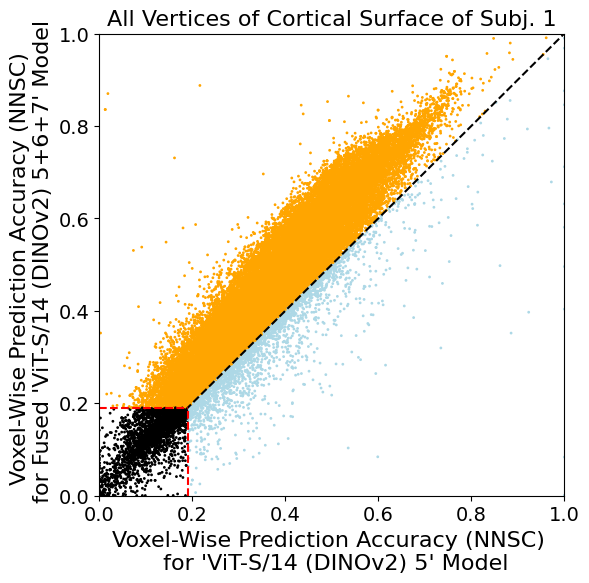

In [222]:
import matplotlib.pyplot as plt
import numpy as np

# Genero 39000 punti dati casuali tra 0 e 1
x = data_dinov2s5
y = data_dinov2s567

# Creo il grafico a dispersione con punti più piccoli
plt.figure(figsize=(6, 6))
plt.scatter(x, y, c=['black' if xi < 0.19 and yi < 0.19 else 'orange' if yi >= xi else 'lightblue' for xi, yi in zip(x, y)], s=1)

# Aggiungo la linea tratteggiata nera
plt.plot([0, 1], [0, 1], '--', color='black')
plt.axvline(x=0.19, linestyle='--', color='red', ymax=0.19)
plt.axhline(y=0.19, linestyle='--', color='red', xmax=0.19)

# Aumenta la dimensione dei tick
plt.tick_params(axis='both', which='major', labelsize=14)

# Etichetto gli assi
plt.ylabel('Voxel-Wise Prediction Accuracy (NNSC) \n for Fused \'ViT-S/14 (DINOv2) 5+6+7\' Model', fontsize=16)
plt.xlabel('Voxel-Wise Prediction Accuracy (NNSC) \n for \'ViT-S/14 (DINOv2) 5\' Model', fontsize=16)

# Aggiungo il titolo
plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)

# Imposto l'intervallo degli assi x e y
plt.xlim(0, 1)
plt.ylim(0, 1)

# Mostro il grafico
plt.show()


0.08


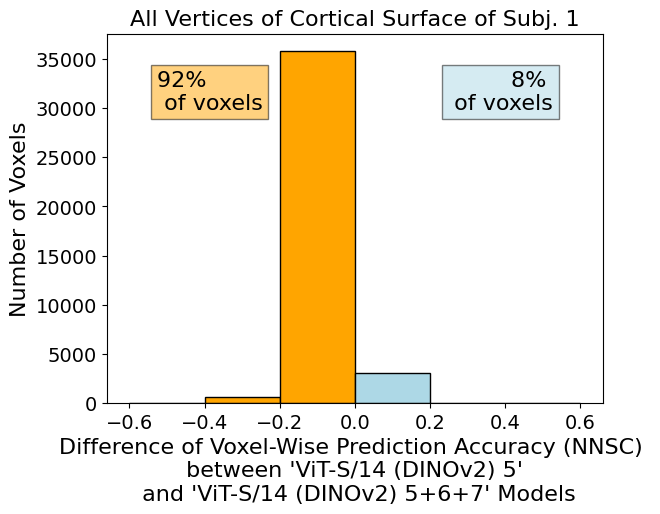

In [159]:
import numpy as np
import matplotlib.pyplot as plt

# Genera un vettore numpy di numeri float casuali compresi tra -1 e 1
data = data_dinov2s5 - data_dinov2s567

# compute number of values of data > 0 on total number of values
mag = np.sum(data > 0)/len(data)
min = np.sum(data < 0)/len(data)
# round to 2 decimal
mag = round(mag, 2)
min = round(min, 2)
print(mag)

# Crea i bin
bins = np.arange(-0.6, 0.8, 0.2)

# Crea l'istogramma
counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

# Colora i bin
for i in range(len(patches)):
    if edges[i] < 0:
        patches[i].set_facecolor('orange')
    else:
        patches[i].set_facecolor('lightblue')
        
plt.xlabel('Difference of Voxel-Wise Prediction Accuracy (NNSC) \n between \'ViT-S/14 (DINOv2) 5\' \n and \'ViT-S/14 (DINOv2) 5+6+7\' Models', fontsize=16)
plt.ylabel('Number of Voxels', fontsize=16)

plt.text(0.9, 0.9, f'{int(mag*100)}% \n of voxels', horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='lightblue', alpha=0.5), fontsize=16)
plt.text(0.1, 0.9, f'{int(min*100)}% \n of voxels', horizontalalignment='left', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='orange', alpha=0.5), fontsize=16)
plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)

plt.show()


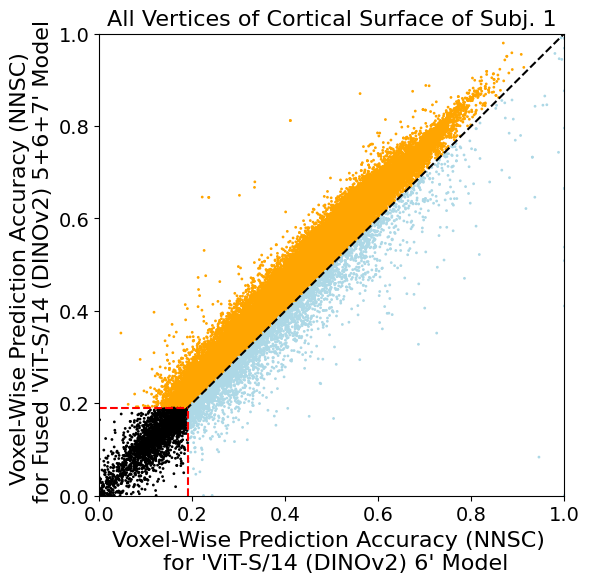

In [223]:
import matplotlib.pyplot as plt
import numpy as np

# Genero 39000 punti dati casuali tra 0 e 1
x = data_dinov2s6
y = data_dinov2s567

# Creo il grafico a dispersione con punti più piccoli
plt.figure(figsize=(6, 6))
plt.scatter(x, y, c=['black' if xi < 0.19 and yi < 0.19 else 'orange' if yi >= xi else 'lightblue' for xi, yi in zip(x, y)], s=1)

# Aggiungo la linea tratteggiata nera
plt.plot([0, 1], [0, 1], '--', color='black')
plt.axvline(x=0.19, linestyle='--', color='red', ymax=0.19)
plt.axhline(y=0.19, linestyle='--', color='red', xmax=0.19)

# Aumenta la dimensione dei tick
plt.tick_params(axis='both', which='major', labelsize=14)

# Etichetto gli assi
plt.ylabel('Voxel-Wise Prediction Accuracy (NNSC) \n for Fused \'ViT-S/14 (DINOv2) 5+6+7\' Model', fontsize=16)
plt.xlabel('Voxel-Wise Prediction Accuracy (NNSC) \n for \'ViT-S/14 (DINOv2) 6\' Model', fontsize=16)

# Aggiungo il titolo
plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)

# Imposto l'intervallo degli assi x e y
plt.xlim(0, 1)
plt.ylim(0, 1)

# Mostro il grafico
plt.show()


0.13


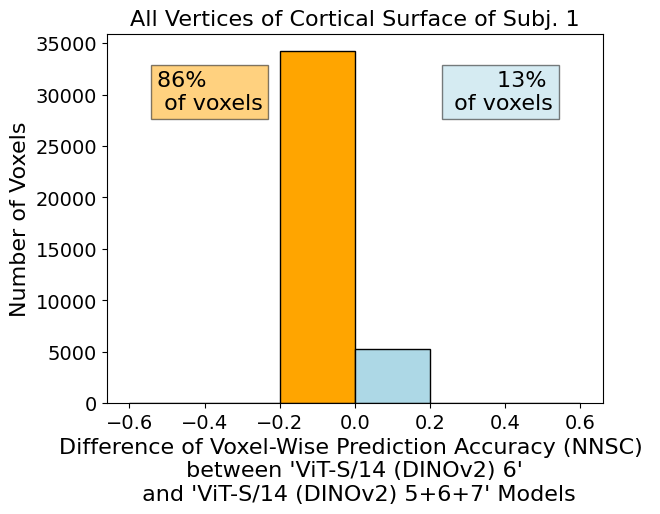

In [158]:
import numpy as np
import matplotlib.pyplot as plt

# Genera un vettore numpy di numeri float casuali compresi tra -1 e 1
data = data_dinov2s6 - data_dinov2s567

# compute number of values of data > 0 on total number of values
mag = np.sum(data > 0)/len(data)
min = np.sum(data < 0)/len(data)
# round to 2 decimal
mag = round(mag, 2)
min = round(min, 2)
print(mag)

# Crea i bin
bins = np.arange(-0.6, 0.8, 0.2)

# Crea l'istogramma
counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

# Colora i bin
for i in range(len(patches)):
    if edges[i] < 0:
        patches[i].set_facecolor('orange')
    else:
        patches[i].set_facecolor('lightblue')
        
plt.xlabel('Difference of Voxel-Wise Prediction Accuracy (NNSC) \n between \'ViT-S/14 (DINOv2) 6\' \n and \'ViT-S/14 (DINOv2) 5+6+7\' Models', fontsize=16)
plt.ylabel('Number of Voxels', fontsize=16)

plt.text(0.9, 0.9, f'{int(mag*100)}% \n of voxels', horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='lightblue', alpha=0.5), fontsize=16)
plt.text(0.1, 0.9, f'{int(min*100)}% \n of voxels', horizontalalignment='left', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='orange', alpha=0.5), fontsize=16)
plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)

plt.show()


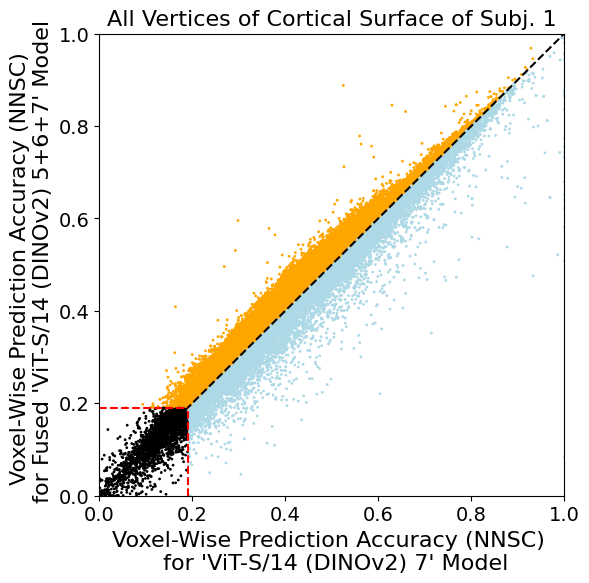

In [224]:
import matplotlib.pyplot as plt
import numpy as np

# Genero 39000 punti dati casuali tra 0 e 1
x = data_dinov2s7
y = data_dinov2s567

# Creo il grafico a dispersione con punti più piccoli
plt.figure(figsize=(6, 6))
plt.scatter(x, y, c=['black' if xi < 0.19 and yi < 0.19 else 'orange' if yi >= xi else 'lightblue' for xi, yi in zip(x, y)], s=1)

# Aggiungo la linea tratteggiata nera
plt.plot([0, 1], [0, 1], '--', color='black')
plt.axvline(x=0.19, linestyle='--', color='red', ymax=0.19)
plt.axhline(y=0.19, linestyle='--', color='red', xmax=0.19)

# Aumenta la dimensione dei tick
plt.tick_params(axis='both', which='major', labelsize=14)

# Etichetto gli assi
plt.ylabel('Voxel-Wise Prediction Accuracy (NNSC) \n for Fused \'ViT-S/14 (DINOv2) 5+6+7\' Model', fontsize=16)
plt.xlabel('Voxel-Wise Prediction Accuracy (NNSC) \n for \'ViT-S/14 (DINOv2) 7\' Model', fontsize=16)

# Aggiungo il titolo
plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)

# Imposto l'intervallo degli assi x e y
plt.xlim(0, 1)
plt.ylim(0, 1)

# Mostro il grafico
plt.show()


0.43


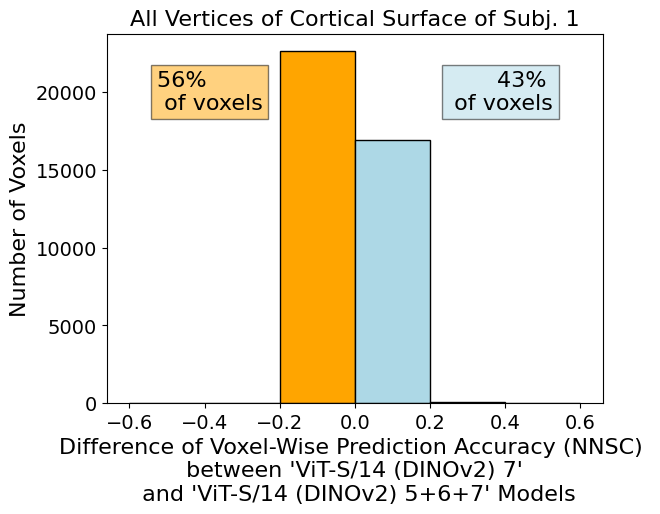

In [157]:
import numpy as np
import matplotlib.pyplot as plt

# Genera un vettore numpy di numeri float casuali compresi tra -1 e 1
data = data_dinov2s7 - data_dinov2s567

# compute number of values of data > 0 on total number of values
mag = np.sum(data > 0)/len(data)
min = np.sum(data < 0)/len(data)
# round to 2 decimal
mag = round(mag, 2)
min = round(min, 2)
print(mag)

# Crea i bin
bins = np.arange(-0.6, 0.8, 0.2)

# Crea l'istogramma
counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

# Colora i bin
for i in range(len(patches)):
    if edges[i] < 0:
        patches[i].set_facecolor('orange')
    else:
        patches[i].set_facecolor('lightblue')
        
plt.xlabel('Difference of Voxel-Wise Prediction Accuracy (NNSC) \n between \'ViT-S/14 (DINOv2) 7\' \n and \'ViT-S/14 (DINOv2) 5+6+7\' Models', fontsize=16)
plt.ylabel('Number of Voxels', fontsize=16)

plt.text(0.9, 0.9, f'{int(mag*100)}% \n of voxels', horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='lightblue', alpha=0.5), fontsize=16)
plt.text(0.1, 0.9, f'{int(min*100)}% \n of voxels', horizontalalignment='left', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='orange', alpha=0.5), fontsize=16)
plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)

plt.show()


## Hierarchy

### Fake data

Tabella Finora Create (ponte)

In [1]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
# Importing the df containing ROI_wise accuracy for all the layers tested in the past
median_roi_correlation_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            f"scores_subj_layer_roi.csv"), index_col=0)

alpha_df_global = pd.read_csv(os.path.join(global_config_dir, 
                                                            "alpha_subj_layer.csv"), index_col=0)

bridge_layers_names = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM5_bridge_layers_names.csv"), index_col=0)

tm4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "tm4_bridge_confid_confspecs_FULL.csv"), index_col=0)

TM4_bridge_confid_confspecs_FULL = pd.read_csv(os.path.join(global_config_dir, 
                                        "TM4_bridge_confid_confspecs_print.csv"), index_col=0)

TM3_roiwise_score_print = pd.read_csv(os.path.join(global_config_dir,
                                        "TM3_roiwise_score.csv"), index_col=0)

In [124]:
TM3_roiwise_score_print.columns

Index(['Conf. ID', 'Conf. Name', 'V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d',
       'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2',
       'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1',
       'VWFA-2', 'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral',
       'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices',
       'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'],
      dtype='object')

In [125]:
TM3_roiwise_score_print.head()      

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown,Pre-Trained Model Name
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728,AlexNet
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064,AlexNet
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772,AlexNet
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067,AlexNet
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589,AlexNet


Importa maschere

In [2]:
# Create a table with the number of voxels for each ROI in each hemisphere for each subject

import pandas as pd

# Creare un DataFrame vuoto per accumulare i dati
result_df = pd.DataFrame()

# Iterare sui soggetti
for subj in range(1, 9):
    cartella = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}\\roi_masks_enhanced\\roi_df"

    # Caricare i dataset lh_challenge_onehot.csv e rh_challenge_onehot.csv
    lh_data = pd.read_csv(cartella + '\\lh_challenge_onehot.csv')
    rh_data = pd.read_csv(cartella + '\\rh_challenge_onehot.csv')

    # Sommare i valori di ogni colonna
    lh_sum = lh_data.sum()
    rh_sum = rh_data.sum()

    # Creare un DataFrame per il soggetto corrente
    subj_df = pd.DataFrame({
        f"S{subj}-LH": lh_sum,
        f"S{subj}-RH": rh_sum
    })

    # Aggiungere il DataFrame del soggetto alla raccolta
    result_df = pd.concat([result_df, subj_df], axis=1)
    
result_df.head()


,S1-LH,S1-RH,S2-LH,S2-RH,S3-LH,S3-RH,S4-LH,S4-RH,S5-LH,S5-RH,S6-LH,S6-RH,S7-LH,S7-RH,S8-LH,S8-RH
V1v,710,444,599,616,853,676,585,633,538,589,299,572,491,444,444,590
V1d,828,991,845,677,523,624,557,553,1117,706,944,712,917,709,569,815
V2v,632,887,653,883,930,704,734,647,531,629,482,610,685,575,646,744
V2d,692,725,620,623,575,782,498,595,663,796,557,559,616,523,503,719
V3v,567,682,553,732,656,433,537,563,457,487,422,532,489,570,509,527


In [3]:
# sum columns values
#result_df = result_df.sum(axis=1)
# sum the first two columns
result_df['Voxels'] = result_df['S1-LH'] + result_df['S1-RH']
result_df = result_df['Voxels']
result_df

V1v            1154
V1d            1819
V2v            1519
V2d            1417
V3v            1249
V3d            1204
hV4            1296
EBA            6237
FBA-1           748
FBA-2           856
mTL-bodies        0
OFA             336
FFA-1           411
FFA-2           127
mTL-faces         0
aTL-faces         0
OPA            4187
PPA            2202
RSC            1061
OWFA            321
VWFA-1         1044
VWFA-2          605
mfs-words       409
mTL-words         0
early          2770
midventral       94
midlateral      653
midparietal     756
ventral        3098
lateral         451
parietal       2931
Unknown         593
Name: Voxels, dtype: int64

In [54]:
# print the result_df sum of values 
result_df.sum()

39548

In [128]:
TM3_roiwise_score_print.head()      

,Conf. ID,Conf. Name,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,...,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown,Pre-Trained Model Name
0,AlexNet 1 (v1),alexnet+features.1+imagenet_V2_transform+ridge...,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,...,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728,AlexNet
1,AlexNet 1 (v2),alexnet+features.1+imagenet_transform_alt+line...,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,...,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064,AlexNet
2,AlexNet 1 (v3),alexnet+features.1+imagenet_transform_alt+ridg...,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,...,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772,AlexNet
3,AlexNet 4 (v1),alexnet+features.4+imagenet_V2_transform+ridge...,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,...,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067,AlexNet
4,AlexNet 4 (v2),alexnet+features.4+imagenet_transform_alt+line...,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,...,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589,AlexNet


In [4]:
# find result_df type 
result_df = result_df.to_frame().reset_index()
result_df.set_index('index', inplace=True)

In [5]:
# delete rows with index 'early', 'midventral', 'midlateral','midparietal', 'ventral', 'lateral', 'parietal'
result_df.drop(index=['early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'Unknown'], inplace=True)

In [6]:
result_df.rename(columns={0: 'Voxels'}, inplace=True)

In [7]:
result_df

,Voxels
index,
V1v,1154
V1d,1819
V2v,1519
V2d,1417
V3v,1249
V3d,1204
hV4,1296
EBA,6237
FBA-1,748


In [8]:
networks_list = [
    'AlexNet 1 (v1)',
    'AlexNet 4 (v1)',
    'AlexNet 7 (v1)',
    'AlexNet 9 (v1)',
    'AlexNet 10 (v1)',
    'AlexNet 11 (v1)',
    'AlexNet 12 (v1)',
    'ZFNet 5 (v1)',
    'ZFNet 8 (v1)',
    'ZFNet 10 (v1)',
    'ZFNet 12 (v1)',
    'ZFNet 13 (v1)',
    'VGG-16 14 (v1)',
    'VGG-19 15 (v1)',
    'VGG-19 16 (v1)',
    'VGG-19 17 (v1)',
    'VGG-19_bn 13',
    'VGG-19_bn 14',
    'VGG-19_bn 16',
    'VGG-19_bn 17',
    'ResNet-50 2 (v1)',
    'ResNet-50 5 (v1)',
    'ResNet-50 8 (v1)',
    'ResNet-50 14 (v1)',
    'ResNet-50 17 (v1)',
    'ResNet-50 20 (v1)',
    'ResNet-50 23 (v1)',
    'ResNet-50 26 (v1)',
    'ResNet-50 29 (v1)',
    'ResNet-50 32 (v1)',
    'ResNet-50 35 (v1)',
    'ResNet-50 38 (v1)',
    'ResNet-50 41 (v1)',
    'ResNet-50 44 (v1)',
    'ResNet-50 47 (v1)',
    'ResNet-50 50 (v1)',
    'ResNet-50 (DINOv1) 2',
    'ResNet-50 (DINOv1) 5',
    'ResNet-50 (DINOv1) 8',
    'ResNet-50 (DINOv1) 14',
    'ResNet-50 (DINOv1) 17',
    'ResNet-50 (DINOv1) 20',
    'ResNet-50 (DINOv1) 23',
    'ResNet-50 (DINOv1) 26',
    'ResNet-50 (DINOv1) 29',
    'ResNet-50 (DINOv1) 32',
    'ResNet-50 (DINOv1) 35',
    'ResNet-50 (DINOv1) 38',
    'ResNet-50 (DINOv1) 41',
    'ResNet-50 (DINOv1) 44',
    'ResNet-50 (DINOv1) 47',
    'ResNet-50 (DINOv1) 50',
    'RetinaNet 25',
    'RetinaNet 26',
    'RetinaNet 39',
    'RetinaNet 40',
    'RetinaNet 47',
    'RetinaNet 48',
    'RetinaNet 49',
    'RetinaNet 50',
    'EfficientNet-B2 3.0',
    'EfficientNet-B2 3.2',
    'EfficientNet-B2 4.1',
    'EfficientNet-B2 5.1',
    'EfficientNet-B2 6.4',
    'EfficientNet-B2 7.0',
    'EfficientNet-B2 8.0',
    'EfficientNet-B2 9.0',
    'EfficientNet-B2 9.1',
    'ViT-S/14 (DINOv2) 1',
    'ViT-S/14 (DINOv2) 2',
    'ViT-S/14 (DINOv2) 3',
    'ViT-S/14 (DINOv2) 4',
    'ViT-S/14 (DINOv2) 5',
    'ViT-S/14 (DINOv2) 6',
    'ViT-S/14 (DINOv2) 7',
    'ViT-S/14 (DINOv2) 8',
    'ViT-S/14 (DINOv2) 9',
    'ViT-S/14 (DINOv2) 10',
    'ViT-S/14 (DINOv2) 11',
    'ViT-S/14 (DINOv2) 12',
    'ViT-S/14 (DINOv2) 13',
    'ViT-B/14 (DINOv2) 1',
    'ViT-B/14 (DINOv2) 2',
    'ViT-B/14 (DINOv2) 3',
    'ViT-B/14 (DINOv2) 4',
    'ViT-B/14 (DINOv2) 5',
    'ViT-B/14 (DINOv2) 6',
    'ViT-B/14 (DINOv2) 7',
    'ViT-B/14 (DINOv2) 8',
    'ViT-B/14 (DINOv2) 9',
    'ViT-B/14 (DINOv2) 10',
    'ViT-B/14 (DINOv2) 11',
    'ViT-B/14 (DINOv2) 12',
    'ViT-B/14 (DINOv2) 13',
    "ViT-L/14 (DINOv2) 1",
    "ViT-L/14 (DINOv2) 2",
    "ViT-L/14 (DINOv2) 3",
    "ViT-L/14 (DINOv2) 4",
    "ViT-L/14 (DINOv2) 5",
    "ViT-L/14 (DINOv2) 6",
    "ViT-L/14 (DINOv2) 7",
    "ViT-L/14 (DINOv2) 8",
    "ViT-L/14 (DINOv2) 9",
    "ViT-L/14 (DINOv2) 10",
    "ViT-L/14 (DINOv2) 11",
    "ViT-L/14 (DINOv2) 12",
    "ViT-L/14 (DINOv2) 13",
    "ViT-L/14 (DINOv2) 14",
    "ViT-L/14 (DINOv2) 15",
    "ViT-L/14 (DINOv2) 16",
    "ViT-L/14 (DINOv2) 17",
    "ViT-L/14 (DINOv2) 18",
    "ViT-L/14 (DINOv2) 19",
    "ViT-L/14 (DINOv2) 20",
    "ViT-L/14 (DINOv2) 21",
    "ViT-L/14 (DINOv2) 22",
    "ViT-L/14 (DINOv2) 23",
    "ViT-L/14 (DINOv2) 24",
    "ViT-L/14 (DINOv2) 25",
    "ViT-B/16-GPT2 e5",
    "ViT-B/16-GPT2 e6",
    "ViT-B/16-GPT2 e7",
    "ViT-B/16-GPT2 e8",
    "ViT-B/16-GPT2 e9",
    "ViT-B/16-GPT2 e10",
    "ViT-B/16-GPT2 e11",
    "ViT-B/16-GPT2 e12",
    "ViT-B/16-GPT2 d5",
    "ViT-B/16-GPT2 d6",
    "ViT-B/16-GPT2 d7",
    "ViT-B/16-GPT2 d8",
    "ViT-B/16-GPT2 d9",
    "ViT-B/16-GPT2 d10",
    "ViT-B/16-GPT2 d11",
    "ViT-B/16-GPT2 d12",
]

In [9]:
TM3_roiwise_score_print_temp = TM3_roiwise_score_print.copy()
# select rows with COnf. ID = ViT-S/14 (DINOv2) 5+6+7, ViT-S/14 (DINOv2) 5, ViT-S/14 (DINOv2) 6, ViT-S/14 (DINOv2) 7
# TM3_roiwise_score_print_temp = TM3_roiwise_score_print_temp[TM3_roiwise_score_print_temp['Conf. ID'].isin(['ViT-S/14 (DINOv2) 5+6+7', 'ViT-S/14 (DINOv2) 5', 'ViT-S/14 (DINOv2) 6', 'ViT-S/14 (DINOv2) 7'])]
TM3_roiwise_score_print_temp
# delete columns 'Conf. Name', 'early', 'midventral', 'midlateral' 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'
TM3_roiwise_score_print_temp.drop(columns=['Conf. Name', 'early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown', 'Pre-Trained Model Name'], inplace=True)
TM3_roiwise_score_print_temp.head()
# save TM3_roiwise_score_print_temp
#TM3_roiwise_score_print_temp.to_csv(os.path.join(global_config_dir, "TM3_roiwise_score_print_only_functional.csv"))

,Conf. ID,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,...,mTL-faces,aTL-faces,OPA,PPA,RSC,OWFA,VWFA-1,VWFA-2,mfs-words,mTL-words
0,AlexNet 1 (v1),0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,0.190226,...,NaN,NaN,0.237482,0.260207,0.354137,0.273603,0.125734,0.132228,0.123780,NaN
1,AlexNet 1 (v2),0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,0.142359,...,NaN,NaN,0.148942,0.187909,0.298936,0.209788,0.072253,0.062095,0.049008,NaN
2,AlexNet 1 (v3),0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,0.187698,...,NaN,NaN,0.231168,0.253969,0.345789,0.264858,0.121720,0.131307,0.116881,NaN
3,AlexNet 4 (v1),0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,0.313262,...,NaN,NaN,0.366021,0.408648,0.522772,0.388781,0.223360,0.210371,0.178480,NaN
4,AlexNet 4 (v2),0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,0.210674,...,NaN,NaN,0.258458,0.295609,0.437010,0.333157,0.143681,0.126093,0.094578,NaN


Seleziona solo righe di reti single layer

In [10]:
# select only rows from networks_list 
TM3_roiwise_score_print_temp = TM3_roiwise_score_print_temp[TM3_roiwise_score_print_temp['Conf. ID'].isin(networks_list)]

In [137]:
result_df

,Voxels
index,
V1v,1154
V1d,1819
V2v,1519
V2d,1417
V3v,1249
V3d,1204
hV4,1296
EBA,6237
FBA-1,748


### Crea tabella, dizionari e conteggi delle accuratezze voxel-wise

Tabella ROI wise con solo quell ia layer singolo

In [11]:
TM3_roiwise_score_print_temp.head()

,Conf. ID,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,...,mTL-faces,aTL-faces,OPA,PPA,RSC,OWFA,VWFA-1,VWFA-2,mfs-words,mTL-words
0,AlexNet 1 (v1),0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,0.190226,...,NaN,NaN,0.237482,0.260207,0.354137,0.273603,0.125734,0.132228,0.123780,NaN
3,AlexNet 4 (v1),0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,0.313262,...,NaN,NaN,0.366021,0.408648,0.522772,0.388781,0.223360,0.210371,0.178480,NaN
6,AlexNet 7 (v1),0.613060,0.657029,0.602623,0.625962,0.574400,0.549523,0.493110,0.398226,0.422337,...,NaN,NaN,0.439110,0.493348,0.601022,0.440691,0.306058,0.276821,0.260358,NaN
9,AlexNet 9 (v1),0.524504,0.572533,0.550819,0.592322,0.532659,0.522999,0.496604,0.442781,0.477512,...,NaN,NaN,0.480444,0.551002,0.642833,0.437437,0.338678,0.321624,0.291395,NaN
17,AlexNet 11 (v1),0.406811,0.435665,0.421543,0.475563,0.413771,0.434082,0.459622,0.459255,0.494558,...,NaN,NaN,0.484060,0.553630,0.635919,0.365091,0.361877,0.358305,0.335396,NaN


Tabella vuota

In [138]:
%%capture output

import pandas as pd
import numpy as np

# Supponendo che 'TM3_roiwise_score_print_temp' sia il tuo DataFrame originale
# e 'result_df' sia il DataFrame con gli indici e la colonna 'Voxels'

# Creazione del nuovo DataFrame 'TM3_voxelwise_score_print_temp'
TM3_voxelwise_score_print_temp = pd.DataFrame()

# Aggiungi la colonna 'Conf. ID' da 'TM3_roiwise_score_print_temp'
TM3_voxelwise_score_print_temp['Conf. ID'] = TM3_roiwise_score_print_temp['Conf. ID']

# Aggiungi la colonna 'Voxels' da 'result_df'
TM3_voxelwise_score_print_temp['Voxels'] = result_df['Voxels']

# Aggiungi colonne casuali
num_random_columns = 28202
random_column_names = [f"Random_{i}" for i in range(1, num_random_columns + 1)]
random_column_values = np.random.rand(len(TM3_roiwise_score_print_temp), num_random_columns)

TM3_voxelwise_score_print_temp[random_column_names] = random_column_values
TM3_voxelwise_score_print_temp.drop(columns=['Voxels'], inplace=True)

In [139]:
TM3_voxelwise_score_print_temp.head()

,Conf. ID,Random_1,Random_2,Random_3,Random_4,Random_5,Random_6,Random_7,Random_8,Random_9,...,Random_28193,Random_28194,Random_28195,Random_28196,Random_28197,Random_28198,Random_28199,Random_28200,Random_28201,Random_28202
0,AlexNet 1 (v1),0.064847,0.839912,0.324427,0.079105,0.321607,0.493414,0.330149,0.219436,0.279737,...,0.456181,0.159023,0.313902,0.041210,0.101947,0.494033,0.145846,0.559158,0.822641,0.538243
3,AlexNet 4 (v1),0.273399,0.666029,0.013119,0.587685,0.927897,0.471469,0.560003,0.647622,0.635455,...,0.193248,0.953282,0.966443,0.524255,0.271969,0.600654,0.535425,0.150123,0.413989,0.254561
6,AlexNet 7 (v1),0.332759,0.056043,0.995245,0.451281,0.111511,0.084843,0.213889,0.199545,0.847326,...,0.690820,0.268488,0.637264,0.343982,0.321542,0.824737,0.260033,0.544246,0.922967,0.483426
9,AlexNet 9 (v1),0.732103,0.969765,0.031362,0.772333,0.882983,0.374375,0.845101,0.158958,0.022561,...,0.265235,0.347693,0.196861,0.810938,0.489733,0.422002,0.621567,0.154041,0.127125,0.126008
17,AlexNet 11 (v1),0.756616,0.665798,0.928854,0.896220,0.902658,0.853008,0.225147,0.426098,0.428561,...,0.291983,0.956995,0.078234,0.203138,0.472758,0.039174,0.862467,0.007439,0.705064,0.991014


Crea nomi colonne fittizie e impostale per il dataset

In [140]:
import numpy as np
# Initialize an empty dictionary to store the numpy arrays
values = []

def create_vector(string, number):
    return [f"{string}-{i}" for i in range(1, number + 1)]

# Iterate over each row in TM3_roiwise_score_print_temp
for i in result_df.index:
    # Initialize an empty list to store the values for this numpy array
    
    # Repeat the value from TM3_roiwise_score_print_temp the number of times specified in result_df
    values.extend(create_vector(i, result_df.loc[i, 'Voxels']))
    
# Convert the list to a numpy array and store it in the dictionary
columns_names = np.array(['Conf. ID'] + values)
columns_names    

array(['Conf. ID', 'V1v-1', 'V1v-2', ..., 'mfs-words-407',
       'mfs-words-408', 'mfs-words-409'], dtype='<U13')

In [141]:
# set columns names of TM3_voxelwise_score_print_temp to columns_names
TM3_voxelwise_score_print_temp.columns = columns_names
TM3_voxelwise_score_print_temp.reset_index(drop=True, inplace=True)
TM3_voxelwise_score_print_temp.head()

,Conf. ID,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
0,AlexNet 1 (v1),0.064847,0.839912,0.324427,0.079105,0.321607,0.493414,0.330149,0.219436,0.279737,...,0.456181,0.159023,0.313902,0.041210,0.101947,0.494033,0.145846,0.559158,0.822641,0.538243
1,AlexNet 4 (v1),0.273399,0.666029,0.013119,0.587685,0.927897,0.471469,0.560003,0.647622,0.635455,...,0.193248,0.953282,0.966443,0.524255,0.271969,0.600654,0.535425,0.150123,0.413989,0.254561
2,AlexNet 7 (v1),0.332759,0.056043,0.995245,0.451281,0.111511,0.084843,0.213889,0.199545,0.847326,...,0.690820,0.268488,0.637264,0.343982,0.321542,0.824737,0.260033,0.544246,0.922967,0.483426
3,AlexNet 9 (v1),0.732103,0.969765,0.031362,0.772333,0.882983,0.374375,0.845101,0.158958,0.022561,...,0.265235,0.347693,0.196861,0.810938,0.489733,0.422002,0.621567,0.154041,0.127125,0.126008
4,AlexNet 11 (v1),0.756616,0.665798,0.928854,0.896220,0.902658,0.853008,0.225147,0.426098,0.428561,...,0.291983,0.956995,0.078234,0.203138,0.472758,0.039174,0.862467,0.007439,0.705064,0.991014


Generate the fake datas:
- per ogni conf
- per ogni ROI (composto da n voxels, mediana nota e IQR = 0.2)
- si generano n correlazioni, con mediana e IQR noti usando t di student

In [142]:
from scipy.stats import t
import numpy as np


def t_student_generator(median, n,IQR = 0.2):
    # Generate the t-student distribution
    if n == 0:
        return []
    df = n - 1 # degrees of freedom
    std_approx = IQR / (2 * t.ppf(0.75, df) - 2 * t.ppf(0.25, df))
    valori_t_student = t.rvs(df, loc=median, scale=std_approx, size=n)
    return list(valori_t_student)

In [143]:
TM3_voxelwise_score_print_temp.head()
# set Conf. ID as index
TM3_voxelwise_score_print_temp.set_index('Conf. ID', inplace=True)
TM3_voxelwise_score_print_temp.head()

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.064847,0.839912,0.324427,0.079105,0.321607,0.493414,0.330149,0.219436,0.279737,0.825944,...,0.456181,0.159023,0.313902,0.041210,0.101947,0.494033,0.145846,0.559158,0.822641,0.538243
AlexNet 4 (v1),0.273399,0.666029,0.013119,0.587685,0.927897,0.471469,0.560003,0.647622,0.635455,0.814977,...,0.193248,0.953282,0.966443,0.524255,0.271969,0.600654,0.535425,0.150123,0.413989,0.254561
AlexNet 7 (v1),0.332759,0.056043,0.995245,0.451281,0.111511,0.084843,0.213889,0.199545,0.847326,0.629071,...,0.690820,0.268488,0.637264,0.343982,0.321542,0.824737,0.260033,0.544246,0.922967,0.483426
AlexNet 9 (v1),0.732103,0.969765,0.031362,0.772333,0.882983,0.374375,0.845101,0.158958,0.022561,0.344698,...,0.265235,0.347693,0.196861,0.810938,0.489733,0.422002,0.621567,0.154041,0.127125,0.126008
AlexNet 11 (v1),0.756616,0.665798,0.928854,0.896220,0.902658,0.853008,0.225147,0.426098,0.428561,0.317613,...,0.291983,0.956995,0.078234,0.203138,0.472758,0.039174,0.862467,0.007439,0.705064,0.991014


In [116]:
print(TM3_voxelwise_score_print_temp.loc['AlexNet 1 (v1)'])

V1v-1            0.549477
V1v-2            0.874347
V1v-3            0.230880
V1v-4            0.207550
V1v-5            0.703455
                   ...   
mfs-words-405    0.612117
mfs-words-406    0.590444
mfs-words-407    0.096140
mfs-words-408    0.829056
mfs-words-409    0.613178
Name: AlexNet 1 (v1), Length: 28202, dtype: float64


In [144]:
# itera su indici e configurazioni (colonna 'Conf. ID') della tabella originale ROI-wise
for _, row in TM3_roiwise_score_print_temp.iterrows():
    print(_, row['Conf. ID'])
    values = []
    # itera sui singoli roi e quindi sui nunmeri di voxel per ogni roi (colonna 'Voxels') di result_df
    for index, value in result_df.iterrows():
        # Repeat the value from TM3_roiwise_score_print_temp the number of times specified in result_df
        #print(index, value['Voxels'], row[index])
        # value['Voxels'] sarà il numero di volte che row[index] verrà ripetuto quindi il numero di voxel
        # row[index] sarà il valore della configurazione corrente (mediana) preso dalla tabella originale ROI-wise
        #print(row[index])
        values.extend(t_student_generator(row[index], value['Voxels'],IQR = 0.2))
    # print(len(values))
    TM3_voxelwise_score_print_temp.loc[row['Conf. ID']] = values

0 AlexNet 1 (v1)
3 AlexNet 4 (v1)
6 AlexNet 7 (v1)
9 AlexNet 9 (v1)
17 AlexNet 11 (v1)
20 AlexNet 12 (v1)
22 ZFNet 5 (v1)
25 ZFNet 8 (v1)
27 ZFNet 10 (v1)
29 ZFNet 12 (v1)
32 ZFNet 13 (v1)
35 VGG-16 14 (v1)
37 VGG-19 15 (v1)
39 VGG-19 16 (v1)
41 VGG-19 17 (v1)
43 VGG-19_bn 13
44 VGG-19_bn 14
45 VGG-19_bn 16
46 VGG-19_bn 17
47 ResNet-50 2 (v1)
49 ResNet-50 5 (v1)
51 ResNet-50 8 (v1)
53 ResNet-50 14 (v1)
55 ResNet-50 17 (v1)
57 ResNet-50 20 (v1)
59 ResNet-50 23 (v1)
61 ResNet-50 26 (v1)
63 ResNet-50 29 (v1)
65 ResNet-50 32 (v1)
67 ResNet-50 35 (v1)
69 ResNet-50 38 (v1)
71 ResNet-50 41 (v1)
73 ResNet-50 44 (v1)
75 ResNet-50 47 (v1)
77 ResNet-50 50 (v1)
80 ResNet-50 (DINOv1) 2
81 ResNet-50 (DINOv1) 5
83 ResNet-50 (DINOv1) 8
85 ResNet-50 (DINOv1) 14
86 ResNet-50 (DINOv1) 17
87 ResNet-50 (DINOv1) 20
89 ResNet-50 (DINOv1) 23
90 ResNet-50 (DINOv1) 26
91 ResNet-50 (DINOv1) 29
92 ResNet-50 (DINOv1) 32
93 ResNet-50 (DINOv1) 35
94 ResNet-50 (DINOv1) 38
96 ResNet-50 (DINOv1) 41
97 ResNet-50 (DINOv1

TABELLA DATI VOXEL WISE

In [145]:
TM3_voxelwise_score_print_temp.head()

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.462550,0.612202,0.516913,0.532288,0.540962,0.556870,0.594854,0.443730,0.640432,0.485890,...,0.178569,0.063786,0.119019,0.156697,0.201811,0.162109,0.191776,0.249505,0.051677,0.111267
AlexNet 4 (v1),0.781374,0.675548,0.514289,0.651993,0.655480,0.696218,0.660601,0.664516,0.774520,0.721727,...,0.198190,0.212179,0.150815,0.210662,0.206514,0.079668,0.198824,0.227099,0.190159,0.391902
AlexNet 7 (v1),0.571752,0.518388,0.400100,0.695219,0.514123,0.577335,0.615762,0.803270,0.613717,0.643703,...,0.308948,0.152619,0.347872,0.372118,0.154455,0.362957,0.199551,0.254439,0.354488,0.291084
AlexNet 9 (v1),0.559715,0.511280,0.443197,0.642481,0.592738,0.539342,0.531965,0.487656,0.575334,0.528094,...,0.333827,0.425635,0.260605,0.526685,0.203539,0.173030,0.230963,0.315921,0.261816,0.240248
AlexNet 11 (v1),0.447367,0.438533,0.324548,0.406928,0.372361,0.499823,0.379766,0.341692,0.361540,0.354501,...,0.282457,0.378962,0.335539,0.194408,0.391270,0.305692,0.346781,0.321261,0.266254,0.263365


In [123]:
TM3_voxelwise_score_print_temp.iloc[:, :1154].median(axis=1)
# Calcola il valore mediano
# np.median(prima_riga)

Conf. ID
AlexNet 1 (v1)       0.537731
AlexNet 4 (v1)       0.669178
AlexNet 7 (v1)       0.608695
AlexNet 9 (v1)       0.525468
AlexNet 11 (v1)      0.410219
                       ...   
ViT-B/16-GPT2 d8     0.467270
ViT-B/16-GPT2 d9     0.431369
ViT-B/16-GPT2 d10    0.391055
ViT-B/16-GPT2 d11    0.321910
ViT-B/16-GPT2 d12    0.253631
Length: 134, dtype: float64

In [74]:
TM3_roiwise_score_print_temp.head()

,Conf. ID,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,...,mTL-faces,aTL-faces,OPA,PPA,RSC,OWFA,VWFA-1,VWFA-2,mfs-words,mTL-words
0,AlexNet 1 (v1),0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,0.190226,...,NaN,NaN,0.237482,0.260207,0.354137,0.273603,0.125734,0.132228,0.123780,NaN
3,AlexNet 4 (v1),0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,0.313262,...,NaN,NaN,0.366021,0.408648,0.522772,0.388781,0.223360,0.210371,0.178480,NaN
6,AlexNet 7 (v1),0.613060,0.657029,0.602623,0.625962,0.574400,0.549523,0.493110,0.398226,0.422337,...,NaN,NaN,0.439110,0.493348,0.601022,0.440691,0.306058,0.276821,0.260358,NaN
9,AlexNet 9 (v1),0.524504,0.572533,0.550819,0.592322,0.532659,0.522999,0.496604,0.442781,0.477512,...,NaN,NaN,0.480444,0.551002,0.642833,0.437437,0.338678,0.321624,0.291395,NaN
17,AlexNet 11 (v1),0.406811,0.435665,0.421543,0.475563,0.413771,0.434082,0.459622,0.459255,0.494558,...,NaN,NaN,0.484060,0.553630,0.635919,0.365091,0.361877,0.358305,0.335396,NaN


In [381]:
result_df.index

Index(['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1',
       'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces',
       'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2',
       'mfs-words', 'mTL-words'],
      dtype='object', name='index')

In [75]:
TM3_voxelwise_score_print_temp.columns

Index(['V1v-1', 'V1v-2', 'V1v-3', 'V1v-4', 'V1v-5', 'V1v-6', 'V1v-7', 'V1v-8',
       'V1v-9', 'V1v-10',
       ...
       'mfs-words-400', 'mfs-words-401', 'mfs-words-402', 'mfs-words-403',
       'mfs-words-404', 'mfs-words-405', 'mfs-words-406', 'mfs-words-407',
       'mfs-words-408', 'mfs-words-409'],
      dtype='object', length=28202)

In [76]:
TM3_roiwise_score_print_temp.columns

Index(['Conf. ID', 'V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA',
       'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces',
       'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2',
       'mfs-words', 'mTL-words'],
      dtype='object')

DIVIDO I DATASET RELATIVI AI DIVERSI MODELLI

In [146]:
lista_senza_duplicati = [
'AlexNet',
'ZFNet',
'VGG-16',
'VGG-19 ',
'VGG-19_bn',
'ResNet-50',
'DINOv1', # 'ResNet-50 (DINOv1)'
'RetinaNet',
'EfficientNet-B2',
'ViT-S/14 ',
'ViT-B/14 ',
'ViT-L/14 ',
'ViT-B/16-GPT2'
]

In [147]:
TM3_voxelwise_score_print_temp[TM3_voxelwise_score_print_temp.index.str.contains('AlexNet')]

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.462550,0.612202,0.516913,0.532288,0.540962,0.556870,0.594854,0.443730,0.640432,0.485890,...,0.178569,0.063786,0.119019,0.156697,0.201811,0.162109,0.191776,0.249505,0.051677,0.111267
AlexNet 4 (v1),0.781374,0.675548,0.514289,0.651993,0.655480,0.696218,0.660601,0.664516,0.774520,0.721727,...,0.198190,0.212179,0.150815,0.210662,0.206514,0.079668,0.198824,0.227099,0.190159,0.391902
AlexNet 7 (v1),0.571752,0.518388,0.400100,0.695219,0.514123,0.577335,0.615762,0.803270,0.613717,0.643703,...,0.308948,0.152619,0.347872,0.372118,0.154455,0.362957,0.199551,0.254439,0.354488,0.291084
AlexNet 9 (v1),0.559715,0.511280,0.443197,0.642481,0.592738,0.539342,0.531965,0.487656,0.575334,0.528094,...,0.333827,0.425635,0.260605,0.526685,0.203539,0.173030,0.230963,0.315921,0.261816,0.240248
AlexNet 11 (v1),0.447367,0.438533,0.324548,0.406928,0.372361,0.499823,0.379766,0.341692,0.361540,0.354501,...,0.282457,0.378962,0.335539,0.194408,0.391270,0.305692,0.346781,0.321261,0.266254,0.263365
AlexNet 12 (v1),0.401404,0.301933,0.257903,0.466106,0.436308,0.292366,0.338011,0.482588,0.344546,0.447995,...,0.339360,0.330086,0.279597,0.428192,0.382695,0.387683,0.427316,0.318018,0.298851,0.406336


In [152]:
# Inizializza un dizionario vuoto per contenere i sottoinsiemi del DataFrame
dizionario_dataset = {}

for stringa in lista_senza_duplicati:
    # Seleziona le righe del DataFrame in cui l'indice contiene la stringa
    # if stringa == 'ResNet-50':
    #     sottoinsieme_df = TM3_voxelwise_score_print_temp[TM3_voxelwise_score_print_temp.index.str.contains('ResNet-50')]
    #     sottoinsieme_df = sottoinsieme_df[~sottoinsieme_df.index.str.contains('DINOv1')]
    #     dizionario_dataset[stringa] = sottoinsieme_df
    #     continue
    sottoinsieme_df = TM3_voxelwise_score_print_temp[TM3_voxelwise_score_print_temp.index.str.contains(stringa)]
    if stringa == 'DINOv1':
        dizionario_dataset['ResNet-50 (DINOv1)'] = sottoinsieme_df
        continue
    elif stringa == 'ResNet-50':
        sottoinsieme_df = sottoinsieme_df[~sottoinsieme_df.index.str.contains('DINOv1')]
    dizionario_dataset[stringa] = sottoinsieme_df

In [153]:
# save the dictionary
import pickle
with open(os.path.join(global_config_dir, "DIZIONARIO-MODELLO_TM3_voxelwise_SCORE_functionalonly_singlelayer.pkl"), "wb") as file:
    pickle.dump(dizionario_dataset, file)

In [422]:
for key, value in dizionario_dataset.items():
    print(key, value.index, value.shape)
    print("\n")

AlexNet Index(['AlexNet 1 (v1)', 'AlexNet 4 (v1)', 'AlexNet 7 (v1)', 'AlexNet 9 (v1)',
       'AlexNet 11 (v1)', 'AlexNet 12 (v1)'],
      dtype='object', name='Conf. ID') (6, 28202)


ZFNet Index(['ZFNet 5 (v1)', 'ZFNet 8 (v1)', 'ZFNet 10 (v1)', 'ZFNet 12 (v1)',
       'ZFNet 13 (v1)'],
      dtype='object', name='Conf. ID') (5, 28202)


VGG-16 Index(['VGG-16 14 (v1)'], dtype='object', name='Conf. ID') (1, 28202)


VGG-19  Index(['VGG-19 15 (v1)', 'VGG-19 16 (v1)', 'VGG-19 17 (v1)'], dtype='object', name='Conf. ID') (3, 28202)


VGG-19_bn Index(['VGG-19_bn 13', 'VGG-19_bn 14', 'VGG-19_bn 16', 'VGG-19_bn 17'], dtype='object', name='Conf. ID') (4, 28202)


ResNet-50 Index(['ResNet-50 2 (v1)', 'ResNet-50 5 (v1)', 'ResNet-50 8 (v1)',
       'ResNet-50 14 (v1)', 'ResNet-50 17 (v1)', 'ResNet-50 20 (v1)',
       'ResNet-50 23 (v1)', 'ResNet-50 26 (v1)', 'ResNet-50 29 (v1)',
       'ResNet-50 32 (v1)', 'ResNet-50 35 (v1)', 'ResNet-50 38 (v1)',
       'ResNet-50 41 (v1)', 'ResNet-50 44 (v1)', 

In [154]:
dizionario_dataset

{'AlexNet':                     V1v-1     V1v-2     V1v-3     V1v-4     V1v-5     V1v-6  \
 Conf. ID                                                                      
 AlexNet 1 (v1)   0.462550  0.612202  0.516913  0.532288  0.540962  0.556870   
 AlexNet 4 (v1)   0.781374  0.675548  0.514289  0.651993  0.655480  0.696218   
 AlexNet 7 (v1)   0.571752  0.518388  0.400100  0.695219  0.514123  0.577335   
 AlexNet 9 (v1)   0.559715  0.511280  0.443197  0.642481  0.592738  0.539342   
 AlexNet 11 (v1)  0.447367  0.438533  0.324548  0.406928  0.372361  0.499823   
 AlexNet 12 (v1)  0.401404  0.301933  0.257903  0.466106  0.436308  0.292366   
 
                     V1v-7     V1v-8     V1v-9    V1v-10  ...  mfs-words-400  \
 Conf. ID                                                 ...                  
 AlexNet 1 (v1)   0.594854  0.443730  0.640432  0.485890  ...       0.178569   
 AlexNet 4 (v1)   0.660601  0.664516  0.774520  0.721727  ...       0.198190   
 AlexNet 7 (v1)   0.615762 

RAGGRUPPO PER CLASS

In [155]:
TM3_roiwise_score_print_temp.head()

,Conf. ID,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,...,mTL-faces,aTL-faces,OPA,PPA,RSC,OWFA,VWFA-1,VWFA-2,mfs-words,mTL-words
0,AlexNet 1 (v1),0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,0.190226,...,NaN,NaN,0.237482,0.260207,0.354137,0.273603,0.125734,0.132228,0.123780,NaN
3,AlexNet 4 (v1),0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,0.313262,...,NaN,NaN,0.366021,0.408648,0.522772,0.388781,0.223360,0.210371,0.178480,NaN
6,AlexNet 7 (v1),0.613060,0.657029,0.602623,0.625962,0.574400,0.549523,0.493110,0.398226,0.422337,...,NaN,NaN,0.439110,0.493348,0.601022,0.440691,0.306058,0.276821,0.260358,NaN
9,AlexNet 9 (v1),0.524504,0.572533,0.550819,0.592322,0.532659,0.522999,0.496604,0.442781,0.477512,...,NaN,NaN,0.480444,0.551002,0.642833,0.437437,0.338678,0.321624,0.291395,NaN
17,AlexNet 11 (v1),0.406811,0.435665,0.421543,0.475563,0.413771,0.434082,0.459622,0.459255,0.494558,...,NaN,NaN,0.484060,0.553630,0.635919,0.365091,0.361877,0.358305,0.335396,NaN


In [128]:
TM3_voxelwise_score_print_temp.head()

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.570508,0.550193,0.511967,0.619609,0.553423,0.454337,0.560118,0.367970,0.509028,0.517426,...,0.073182,0.186197,0.059506,-0.015353,0.076100,0.160413,-0.064582,-0.051843,0.194454,0.061298
AlexNet 4 (v1),0.712706,0.616134,0.671156,0.586619,0.613355,0.683954,0.670260,0.533342,0.574416,0.565742,...,0.196693,0.211431,0.103327,0.146943,0.212818,0.195088,0.286356,0.162789,0.135971,0.084132
AlexNet 7 (v1),0.604444,0.556693,0.573154,0.510643,0.571341,0.616683,0.641412,0.543614,0.590598,0.592924,...,0.202266,0.265544,0.264334,0.151750,0.387123,0.274372,0.153586,0.218085,0.130645,0.159873
AlexNet 9 (v1),0.545160,0.496139,0.471046,0.485339,0.533532,0.566669,0.644703,0.523790,0.487186,0.473749,...,0.236046,0.218246,0.339242,0.126579,0.386455,0.239862,0.212735,0.288619,0.269769,0.164002
AlexNet 11 (v1),0.402789,0.458125,0.261528,0.476167,0.394354,0.497921,0.419735,0.395442,0.473185,0.411730,...,0.248604,0.471003,0.410352,0.342182,0.336443,0.339416,0.238526,0.307071,0.235702,0.371936


In [156]:
regions_dict = {
    "Early retinotopic visual regions": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    "Body-selective regions": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    "Face-selective regions": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    "Place-selective regions": ["OPA", "PPA", "RSC"],
    "Word-selective regions": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]
}

In [157]:
# DIZIONARIO DATASET PER CLASS
# Codice per suddividere ulteriormente i dataset
dizionario_finale = {}

for modello, df in dizionario_dataset.items():
    dizionario_modello = {}
    
    for regione, stringhe_lista in regions_dict.items():
        colonne_corrispondenti = df[df.columns[df.columns.str.contains('|'.join(stringhe_lista))]]
        dizionario_modello[regione] = colonne_corrispondenti
    
    dizionario_finale[modello] = dizionario_modello

In [158]:
dizionario_finale['AlexNet']['Early retinotopic visual regions'].head()

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,hV4-1287,hV4-1288,hV4-1289,hV4-1290,hV4-1291,hV4-1292,hV4-1293,hV4-1294,hV4-1295,hV4-1296
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.462550,0.612202,0.516913,0.532288,0.540962,0.556870,0.594854,0.443730,0.640432,0.485890,...,0.277680,0.251268,0.341423,0.144579,0.301129,0.111134,0.336776,0.305920,0.343197,0.391661
AlexNet 4 (v1),0.781374,0.675548,0.514289,0.651993,0.655480,0.696218,0.660601,0.664516,0.774520,0.721727,...,0.435402,0.328788,0.236002,0.364393,0.418954,0.424589,0.473658,0.443165,0.393433,0.511053
AlexNet 7 (v1),0.571752,0.518388,0.400100,0.695219,0.514123,0.577335,0.615762,0.803270,0.613717,0.643703,...,0.492823,0.565564,0.444008,0.632826,0.438699,0.552554,0.499319,0.505015,0.505308,0.461601
AlexNet 9 (v1),0.559715,0.511280,0.443197,0.642481,0.592738,0.539342,0.531965,0.487656,0.575334,0.528094,...,0.516181,0.561726,0.401432,0.563229,0.541908,0.598560,0.584390,0.458430,0.589483,0.529551
AlexNet 11 (v1),0.447367,0.438533,0.324548,0.406928,0.372361,0.499823,0.379766,0.341692,0.361540,0.354501,...,0.422642,0.463339,0.518423,0.434893,0.454873,0.587325,0.603073,0.389174,0.289376,0.574014


Creo i dataset **CONTEGGIO**

In [159]:
dizionario_conteggi = {}

# Iterazione attraverso i modelli nel dizionario_finale
for modello, sotto_dizionario in dizionario_finale.items():
    # Creazione di un dizionario vuoto per i conteggi del modello corrente
    conteggi_modello = {}
    # Iterazione attraverso le regioni nel sotto_dizionario
    for regione, df_region in sotto_dizionario.items():
        # Creazione di un DataFrame vuoto per i conteggi della regione corrente
        conteggi_region = pd.DataFrame(index=df_region.index, columns=['Numero di massimi'], data=0)
        print(regione)
        print(conteggi_region)
         # Iterazione attraverso le colonne del DataFrame della regione
        for colonna in df_region.columns:
            massimo_colonna = df_region[colonna].max()
            # Aggiornamento dei conteggi per la colonna corrente
            conteggi_region['Numero di massimi'] += (df_region[colonna] == massimo_colonna)
        # Divisore per il numero di colonne del DataFrame della regione
        divisore = len(df_region.columns)

        # Calcolo percentuale, moltiplicazione per 100 e mantenimento di 2 decimali
        conteggi_region['Numero di massimi'] = (conteggi_region['Numero di massimi'] / divisore * 100).round(2)

        # Aggiunta dei conteggi nel dizionario dei conteggi della regione corrente
        conteggi_modello[regione] = conteggi_region

    # Aggiunta del dizionario dei conteggi del modello corrente nel dizionario_conteggi
    dizionario_conteggi[modello] = conteggi_modello

Early retinotopic visual regions
                 Numero di massimi
Conf. ID                          
AlexNet 1 (v1)                   0
AlexNet 4 (v1)                   0
AlexNet 7 (v1)                   0
AlexNet 9 (v1)                   0
AlexNet 11 (v1)                  0
AlexNet 12 (v1)                  0
Body-selective regions
                 Numero di massimi
Conf. ID                          
AlexNet 1 (v1)                   0
AlexNet 4 (v1)                   0
AlexNet 7 (v1)                   0
AlexNet 9 (v1)                   0
AlexNet 11 (v1)                  0
AlexNet 12 (v1)                  0
Face-selective regions
                 Numero di massimi
Conf. ID                          
AlexNet 1 (v1)                   0
AlexNet 4 (v1)                   0
AlexNet 7 (v1)                   0
AlexNet 9 (v1)                   0
AlexNet 11 (v1)                  0
AlexNet 12 (v1)                  0
Place-selective regions
                 Numero di massimi
Conf. ID              

In [448]:
dizionario_conteggi.keys()

dict_keys(['AlexNet', 'ZFNet', 'VGG-16', 'VGG-19 ', 'VGG-19_bn', 'ResNet-50', 'ResNet-50 (DINOv1)', 'RetinaNet', 'EfficientNet-B2', 'ViT-S/14 ', 'ViT-B/14 ', 'ViT-L/14 ', 'ViT-B/16-GPT2'])

In [ ]:
# Iterazione attraverso i modelli nel dizionario_finale
for modello, sotto_dizionario in dizionario_conteggi.items():
    # Creazione di un dizionario vuoto per i conteggi del modello corrente
    # Iterazione attraverso le regioni nel sotto_dizionario
    for regione, df_region in sotto_dizionario.items():
        print(regione)
        print(df_region)

**SALVATAGGIO**

In [160]:
import pickle

TM3_roiwise_score_print_temp.to_csv(os.path.join(global_config_dir,
                                        "TM3_ROIwise_score_print_only_functional_onlysinglelayer.csv"))

TM3_voxelwise_score_print_temp.to_csv(os.path.join(global_config_dir,
                                        "TM3_VOXELwise_score_print_only_functional_onlysinglelayer.csv"))

with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO-CLASS_TM3_voxelwise_SCORE_functionalonly_singlelayer.pkl'), 'wb') as file:
    pickle.dump(dizionario_finale, file)
    
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO-CLASS_TM3_voxelwise_CONTEGGIBESTLAYER_functionalonly_singlelayer.pkl'), 'wb') as file:
    pickle.dump(dizionario_conteggi, file)

### Stacked Bar Charts

In [12]:
import os 
import pandas as pd
import pickle
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'

In [13]:
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO-CLASS_TM3_voxelwise_CONTEGGIBESTLAYER_functionalonly_singlelayer.pkl'), 'rb') as file:
    dizionario_conteggi = pickle.load(file)

In [14]:
dizionario_conteggi

{'AlexNet': {'Early retinotopic visual regions':                  Numero di massimi
  Conf. ID                          
  AlexNet 1 (v1)                1.94
  AlexNet 4 (v1)               36.03
  AlexNet 7 (v1)               37.53
  AlexNet 9 (v1)               18.08
  AlexNet 11 (v1)               3.01
  AlexNet 12 (v1)               3.41,
  'Body-selective regions':                  Numero di massimi
  Conf. ID                          
  AlexNet 1 (v1)                0.00
  AlexNet 4 (v1)                0.55
  AlexNet 7 (v1)                8.72
  AlexNet 9 (v1)               21.90
  AlexNet 11 (v1)              30.86
  AlexNet 12 (v1)              37.97,
  'Face-selective regions':                  Numero di massimi
  Conf. ID                          
  AlexNet 1 (v1)                0.11
  AlexNet 4 (v1)                2.06
  AlexNet 7 (v1)               13.39
  AlexNet 9 (v1)               24.49
  AlexNet 11 (v1)              26.20
  AlexNet 12 (v1)              33.75,
  'Place-s

In [15]:
dizionario_concatenato = {}

# Iterazione attraverso le chiavi di dizionario_conteggi
for chiave, sotto_dizionario in dizionario_conteggi.items():
    # Rinomina le colonne aggiungendo il prefisso (chiave del dataset)
    dataset_rinominato = {colonna: df.rename(columns=lambda x: f"{colonna}") for colonna, df in sotto_dizionario.items()}

    # Concatenazione orizzontale dei dataset rinominati
    dataset_concatenato = pd.concat(list(dataset_rinominato.values()), axis=1)

    # Aggiunta del dataset concatenato nel dizionario_concatenato
    dizionario_concatenato[chiave] = dataset_concatenato

# Stampa del risultato
print("Dizionario Concatenato con Nomi di Colonne Rinominati:")
print(dizionario_concatenato)

Dizionario Concatenato con Nomi di Colonne Rinominati:
{'AlexNet':                  Early retinotopic visual regions  Body-selective regions  \
Conf. ID                                                                    
AlexNet 1 (v1)                               1.94                    0.00   
AlexNet 4 (v1)                              36.03                    0.55   
AlexNet 7 (v1)                              37.53                    8.72   
AlexNet 9 (v1)                              18.08                   21.90   
AlexNet 11 (v1)                              3.01                   30.86   
AlexNet 12 (v1)                              3.41                   37.97   

                 Face-selective regions  Place-selective regions  \
Conf. ID                                                           
AlexNet 1 (v1)                     0.11                     0.00   
AlexNet 4 (v1)                     2.06                     1.49   
AlexNet 7 (v1)                    13.39     

In [165]:
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO-CLASS_TM3_voxelwise_CONTEGGIBESTLAYER_functionalonly_singlelayer_concatenato.pkl'), 'wb') as file:
    pickle.dump(dizionario_concatenato, file)

In [139]:
dizionario_concatenato

{'AlexNet':                  Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
 Conf. ID                                                                  
 AlexNet 1 (v1)                 2.08              0.00              0.11   
 AlexNet 4 (v1)                36.01              0.42              2.52   
 AlexNet 7 (v1)                37.18              8.63             14.53   
 AlexNet 9 (v1)                18.63             21.48             26.89   
 AlexNet 11 (v1)                3.12             30.84             21.85   
 AlexNet 12 (v1)                2.98             38.63             34.10   
 
                  Place\nSel.\nRegs  Word\nSel.\nRegs  
 Conf. ID                                              
 AlexNet 1 (v1)                0.00              0.25  
 AlexNet 4 (v1)                1.38              3.15  
 AlexNet 7 (v1)               10.75             13.66  
 AlexNet 9 (v1)               27.80             19.42  
 AlexNet 11 (v1)              28.97        

In [16]:
for model in dizionario_concatenato.keys():
    print(model)
    print(dizionario_concatenato[model].head())

AlexNet
                 Early retinotopic visual regions  Body-selective regions  \
Conf. ID                                                                    
AlexNet 1 (v1)                               1.94                    0.00   
AlexNet 4 (v1)                              36.03                    0.55   
AlexNet 7 (v1)                              37.53                    8.72   
AlexNet 9 (v1)                              18.08                   21.90   
AlexNet 11 (v1)                              3.01                   30.86   

                 Face-selective regions  Place-selective regions  \
Conf. ID                                                           
AlexNet 1 (v1)                     0.11                     0.00   
AlexNet 4 (v1)                     2.06                     1.49   
AlexNet 7 (v1)                    13.39                    10.63   
AlexNet 9 (v1)                    24.49                    27.70   
AlexNet 11 (v1)                   26.20     

AlexNet
                 Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                  
AlexNet 1 (v1)                 1.94              0.00              0.11   
AlexNet 4 (v1)                36.03              0.55              2.06   
AlexNet 7 (v1)                37.53              8.72             13.39   
AlexNet 9 (v1)                18.08             21.90             24.49   
AlexNet 11 (v1)                3.01             30.86             26.20   

                 Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                              
AlexNet 1 (v1)                0.00              0.08  
AlexNet 4 (v1)                1.49              2.73  
AlexNet 7 (v1)               10.63             12.86  
AlexNet 9 (v1)               27.70             20.43  
AlexNet 11 (v1)              28.93             30.56  


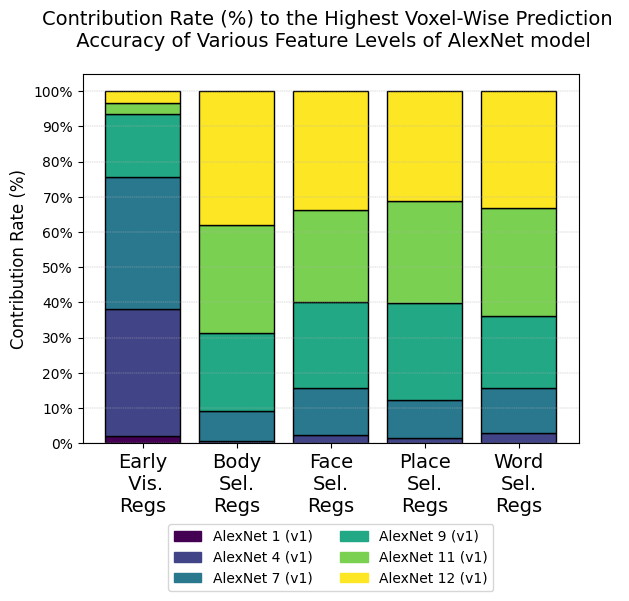

ZFNet
               Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                
ZFNet 5 (v1)                20.64              0.13              1.26   
ZFNet 8 (v1)                39.59              4.26              8.92   
ZFNet 10 (v1)               26.03             18.14             20.37   
ZFNet 12 (v1)                6.60             32.74             25.97   
ZFNet 13 (v1)                7.14             44.74             43.48   

               Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                            
ZFNet 5 (v1)                0.50              1.81  
ZFNet 8 (v1)                6.16             10.38  
ZFNet 10 (v1)              20.28             19.92  
ZFNet 12 (v1)              32.27             26.40  
ZFNet 13 (v1)              40.79             41.49  


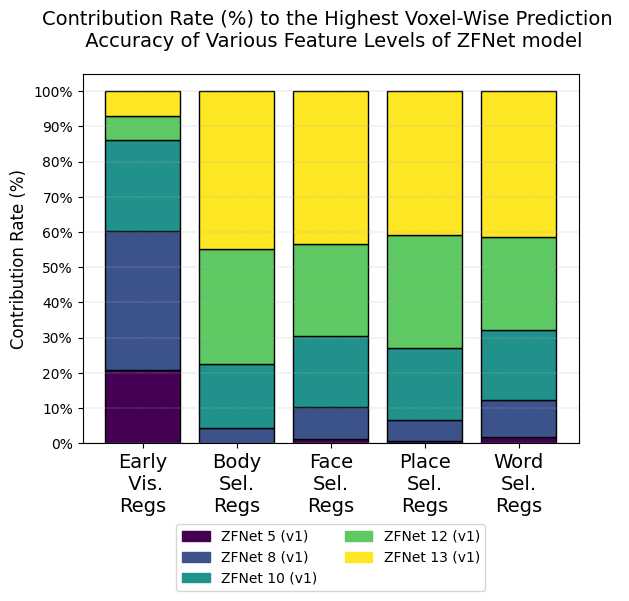

VGG-16
                Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                 
VGG-16 14 (v1)               100.0             100.0             100.0   

                Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                             
VGG-16 14 (v1)              100.0             100.0  


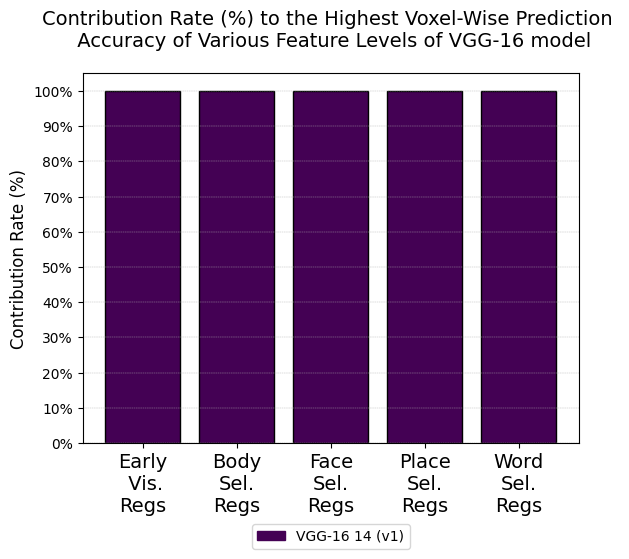

VGG-19 
                Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                 
VGG-19 15 (v1)               64.33             35.63             44.74   
VGG-19 16 (v1)               15.07             31.79             26.20   
VGG-19 17 (v1)               20.60             32.57             29.06   

                Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                             
VGG-19 15 (v1)              41.99             37.62  
VGG-19 16 (v1)              29.73             37.66  
VGG-19 17 (v1)              28.28             24.72  


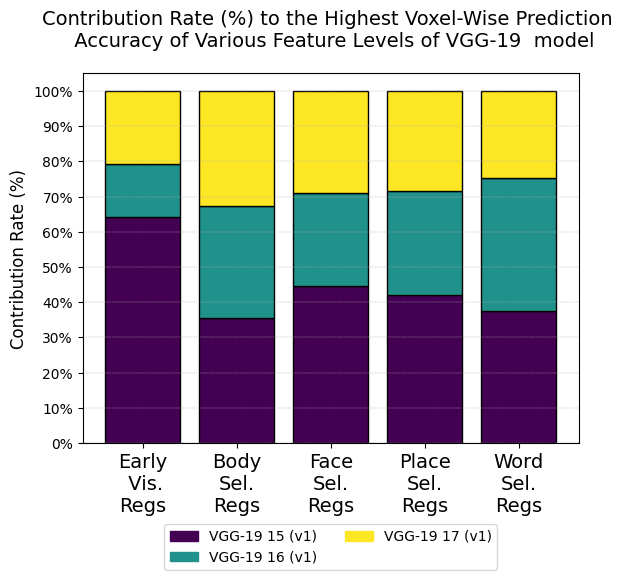

VGG-19_bn
              Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                               
VGG-19_bn 13               52.50              8.16             16.25   
VGG-19_bn 14               34.96             15.75             21.85   
VGG-19_bn 16                6.03             34.66             28.49   
VGG-19_bn 17                6.52             41.42             33.41   

              Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                           
VGG-19_bn 13              17.37             16.48  
VGG-19_bn 14              23.92             19.71  
VGG-19_bn 16              28.03             30.14  
VGG-19_bn 17              30.68             33.67  


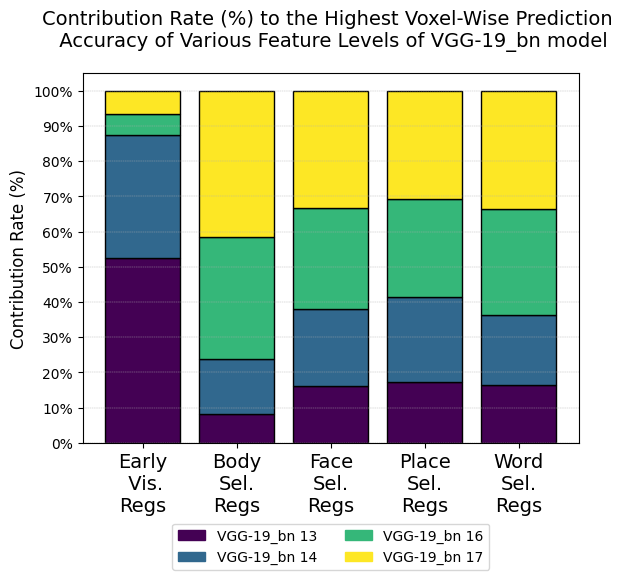

ResNet-50
                   Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                    
ResNet-50 2 (v1)                 8.01               0.0              0.00   
ResNet-50 5 (v1)                 1.04               0.0              0.00   
ResNet-50 8 (v1)                 0.17               0.0              0.00   
ResNet-50 14 (v1)               17.51               0.0              0.57   
ResNet-50 17 (v1)                0.40               0.0              0.00   

                   Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                
ResNet-50 2 (v1)                0.00              0.00  
ResNet-50 5 (v1)                0.03              0.00  
ResNet-50 8 (v1)                0.00              0.00  
ResNet-50 14 (v1)               0.01              0.29  
ResNet-50 17 (v1)               0.01              0.04  


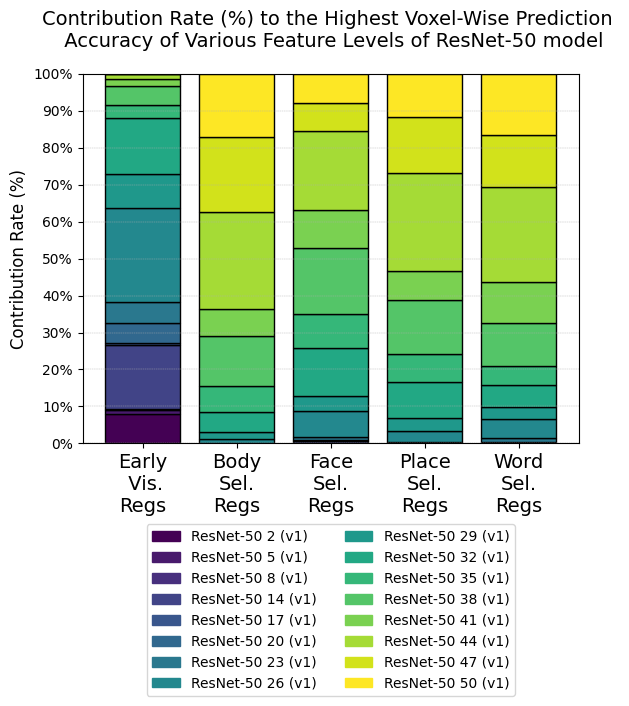

ResNet-50 (DINOv1)
                       Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                        
ResNet-50 (DINOv1) 2                 0.34               0.0              0.00   
ResNet-50 (DINOv1) 5                 1.24               0.0              0.00   
ResNet-50 (DINOv1) 8                 0.28               0.0              0.00   
ResNet-50 (DINOv1) 14                3.53               0.0              0.11   
ResNet-50 (DINOv1) 17                4.19               0.0              0.23   

                       Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                    
ResNet-50 (DINOv1) 2                0.00              0.00  
ResNet-50 (DINOv1) 5                0.00              0.00  
ResNet-50 (DINOv1) 8                0.00              0.04  
ResNet-50 (DINOv1) 14               0.01              0.13  
ResNet-50 (DINOv1) 17               0.01       

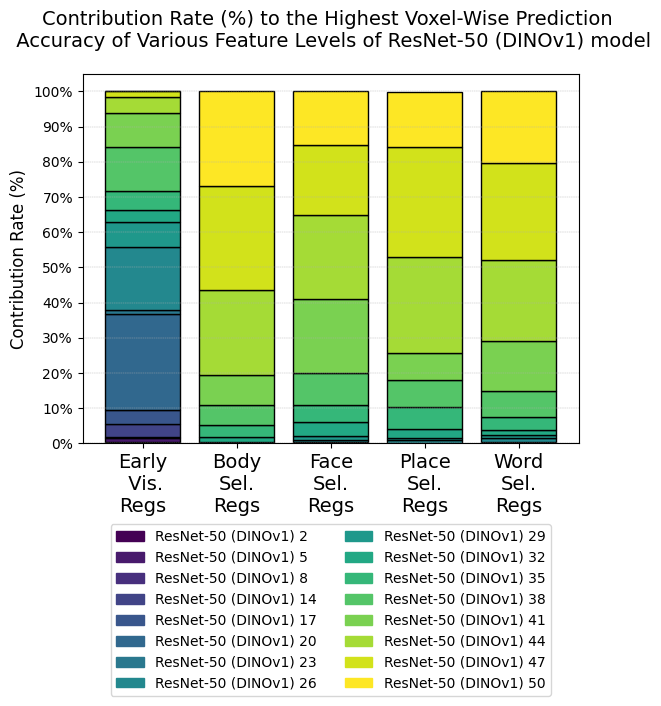

RetinaNet
              Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                               
RetinaNet 25               31.65              0.33              6.86   
RetinaNet 26               27.68              0.45              6.18   
RetinaNet 39                2.28              4.35              5.38   
RetinaNet 40               30.45              9.34             17.73   
RetinaNet 47                0.86             21.81             15.22   

              Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                           
RetinaNet 25               2.04              4.67  
RetinaNet 26               1.72              3.53  
RetinaNet 39               8.38              7.23  
RetinaNet 40              14.93             16.81  
RetinaNet 47              18.44             13.79  


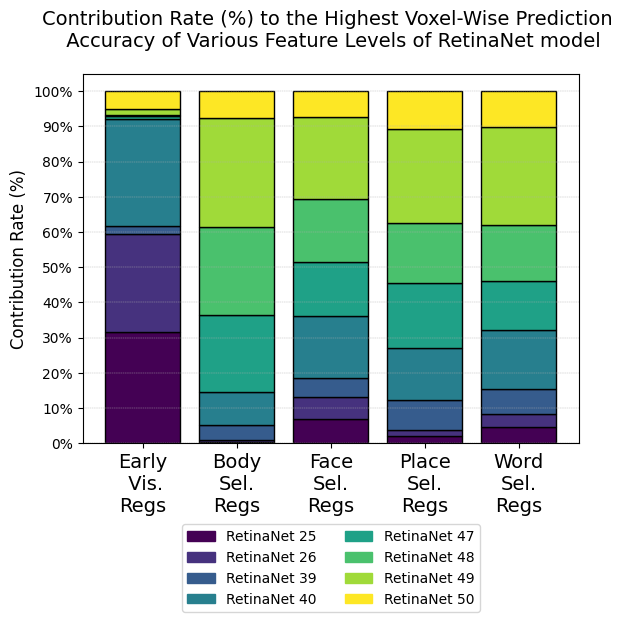

EfficientNet-B2
                     Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                      
EfficientNet-B2 3.0               21.41              0.00              0.11   
EfficientNet-B2 3.2                0.59              0.00              0.00   
EfficientNet-B2 4.1                5.13              0.04              0.80   
EfficientNet-B2 5.1               67.86              7.27             27.46   
EfficientNet-B2 6.4                0.22              7.17              6.64   

                     Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                  
EfficientNet-B2 3.0               0.20              0.84  
EfficientNet-B2 3.2               0.03              0.13  
EfficientNet-B2 4.1               1.14              1.01  
EfficientNet-B2 5.1              17.99             13.70  
EfficientNet-B2 6.4               7.19              5.46  


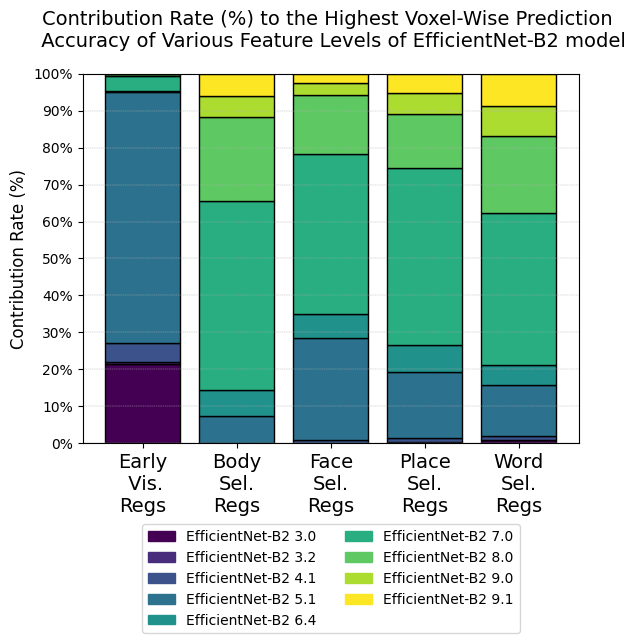

ViT-S/14 
                     Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                      
ViT-S/14 (DINOv2) 1                1.28               0.0              0.00   
ViT-S/14 (DINOv2) 2                1.04               0.0              0.00   
ViT-S/14 (DINOv2) 3                2.17               0.0              0.00   
ViT-S/14 (DINOv2) 4               14.52               0.0              1.37   
ViT-S/14 (DINOv2) 5               17.63               0.1              2.06   

                     Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                  
ViT-S/14 (DINOv2) 1               0.00              0.00  
ViT-S/14 (DINOv2) 2               0.00              0.04  
ViT-S/14 (DINOv2) 3               0.00              0.04  
ViT-S/14 (DINOv2) 4               0.03              1.26  
ViT-S/14 (DINOv2) 5               0.35              1.22  


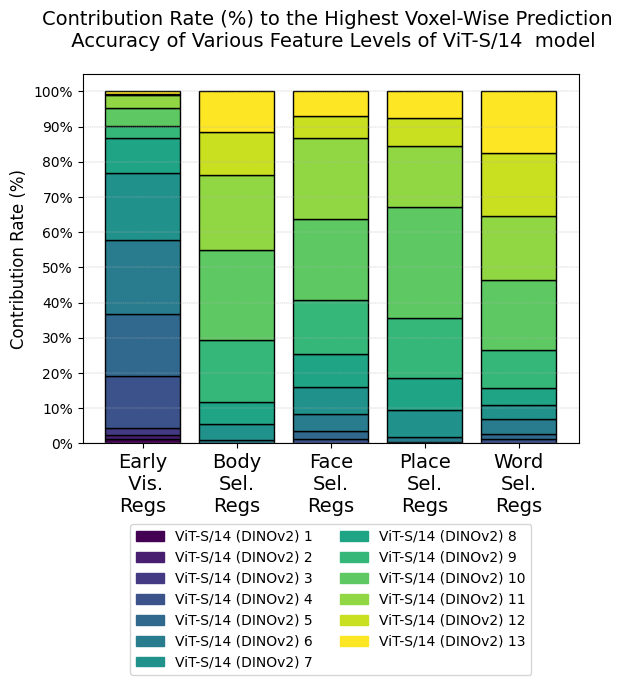

ViT-B/14 
                     Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                      
ViT-B/14 (DINOv2) 1                2.38              0.00              0.00   
ViT-B/14 (DINOv2) 2                1.82              0.00              0.00   
ViT-B/14 (DINOv2) 3                5.08              0.00              0.34   
ViT-B/14 (DINOv2) 4               23.80              0.03              2.06   
ViT-B/14 (DINOv2) 5               18.20              0.14              3.43   

                     Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                  
ViT-B/14 (DINOv2) 1               0.00              0.13  
ViT-B/14 (DINOv2) 2               0.00              0.13  
ViT-B/14 (DINOv2) 3               0.00              0.29  
ViT-B/14 (DINOv2) 4               0.13              2.10  
ViT-B/14 (DINOv2) 5               0.66              1.56  


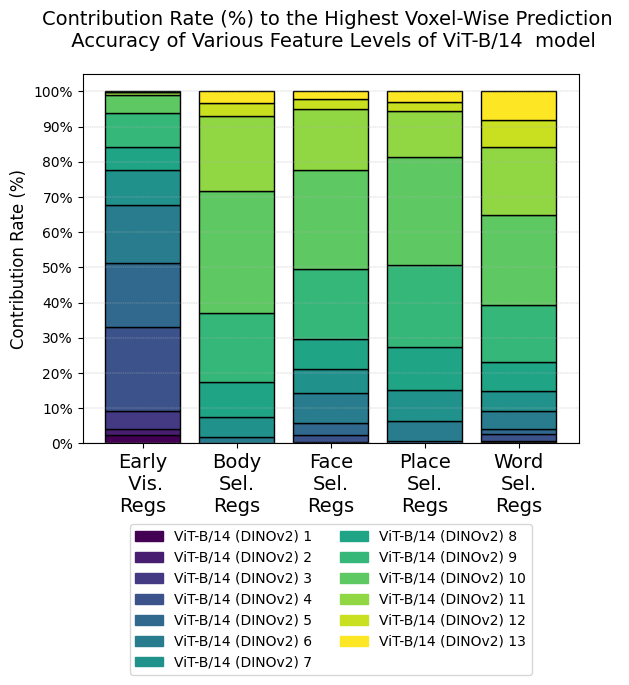

ViT-L/14 
                     Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                      
ViT-L/14 (DINOv2) 1                0.03               0.0               0.0   
ViT-L/14 (DINOv2) 2                1.26               0.0               0.0   
ViT-L/14 (DINOv2) 3                0.48               0.0               0.0   
ViT-L/14 (DINOv2) 4                0.39               0.0               0.0   
ViT-L/14 (DINOv2) 5                0.74               0.0               0.0   

                     Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                  
ViT-L/14 (DINOv2) 1                0.0              0.00  
ViT-L/14 (DINOv2) 2                0.0              0.25  
ViT-L/14 (DINOv2) 3                0.0              0.04  
ViT-L/14 (DINOv2) 4                0.0              0.00  
ViT-L/14 (DINOv2) 5                0.0              0.00  


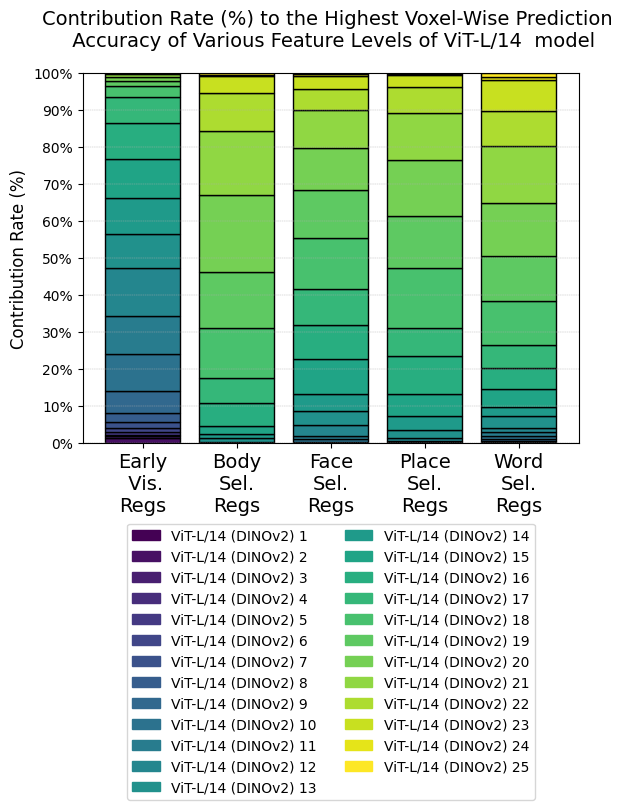

ViT-B/16-GPT2
                   Early\n Vis.\nRegs  Body\nSel.\nRegs  Face\nSel.\nRegs  \
Conf. ID                                                                    
ViT-B/16-GPT2 e6                19.98              1.22              5.26   
ViT-B/16-GPT2 e7                 6.34              3.99              7.09   
ViT-B/16-GPT2 e8                 5.31              7.40             11.56   
ViT-B/16-GPT2 e9                 2.22             12.55              9.73   
ViT-B/16-GPT2 e10                0.81             13.10              7.32   

                   Place\nSel.\nRegs  Word\nSel.\nRegs  
Conf. ID                                                
ViT-B/16-GPT2 e6                3.69              4.46  
ViT-B/16-GPT2 e7                7.05              5.67  
ViT-B/16-GPT2 e8               10.63             10.13  
ViT-B/16-GPT2 e9               11.57             10.51  
ViT-B/16-GPT2 e10               9.97              9.88  


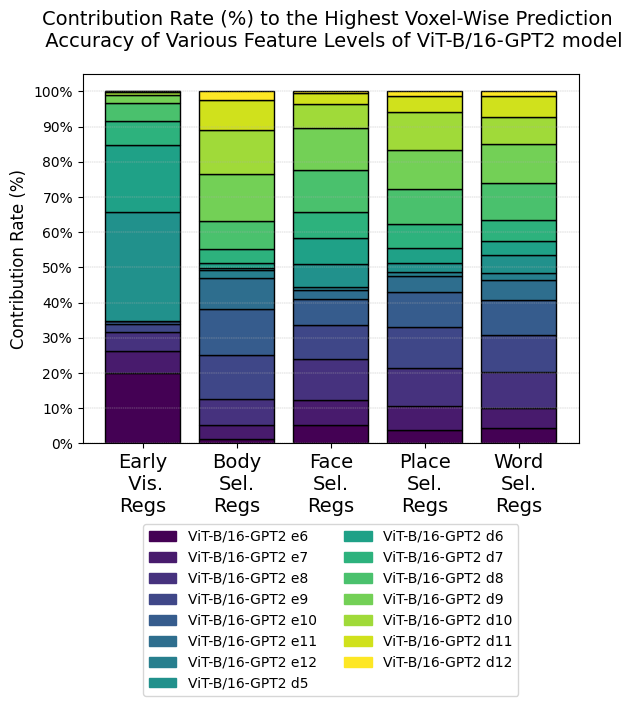

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Patch

for model in dizionario_concatenato.keys():
    print(model)
    print(dizionario_concatenato[model].head())
    df = dizionario_concatenato[model]
    # rename columns
    df.columns = ["Early\n Vis.\nRegs", "Body\nSel.\nRegs", "Face\nSel.\nRegs", "Place\nSel.\nRegs", "Word\nSel.\nRegs"]

    # Define the colors using a gradient from blue to yellow
    colors = plt.cm.viridis(np.linspace(0, 1, len(df.index)))

    # Create a figure and a set of subplots
    fig, ax = plt.subplots()

    # Create a stacked bar chart
    for i, (index, row) in enumerate(df.iterrows()):
        ax.bar(df.columns, row, bottom=df.iloc[:i, :].sum(), color=colors[i], edgecolor='black')

    # Set the y-axis label
    ax.set_ylabel('Contribution Rate (%)', fontsize=12)

    # Set the title
    ax.set_title(f'Contribution Rate (%) to the Highest Voxel-Wise Prediction \n Accuracy of Various Feature Levels of {model} model', fontsize=14, y=1.05)

    # Create proxy artists for legend
    legend_handles = [Patch(color=colors[i], label=str(index)) for i, index in enumerate(df.index)]

    # Add a legend below the graph
    ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)

    # Set the y-axis ticks
    ax.set_yticks(np.arange(0, 110, 10))
    ax.set_yticklabels([f'{i}%' for i in range(0, 110, 10)])

    # Set the x-axis ticks with increased font size
    ax.tick_params(axis='x', labelsize=14)

    # Add horizontal grid lines
    ax.yaxis.grid(True, linestyle='--', linewidth=0.3)

    # Show the plot
    plt.show()
    # save the plot
    fig.savefig(os.path.join(global_config_dir, f'../../images/histograms_hierarchical/ch5_hierarchical_{model.replace("/", " ")}_contribution_rate_HD.png'), bbox_inches='tight', dpi=300)

C:\Users\giorg\AppData\Local\Temp\ipykernel_74684\1475886485.py:30: UserWarning: Legend does not support 'blue' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(colors, ['Layer1', 'Layer2', 'Layer3', 'Layer4'], loc='upper right')
C:\Users\giorg\AppData\Local\Temp\ipykernel_74684\1475886485.py:30: UserWarning: Legend does not support 'green' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(colors, ['Layer1', 'Layer2', 'Layer3', 'Layer4'], loc='upper right')
C:\Users\giorg\AppData\Local\Temp\ipykernel_74684\1475886485.py:30: UserWarning: Legend does not support 'yellow' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-a

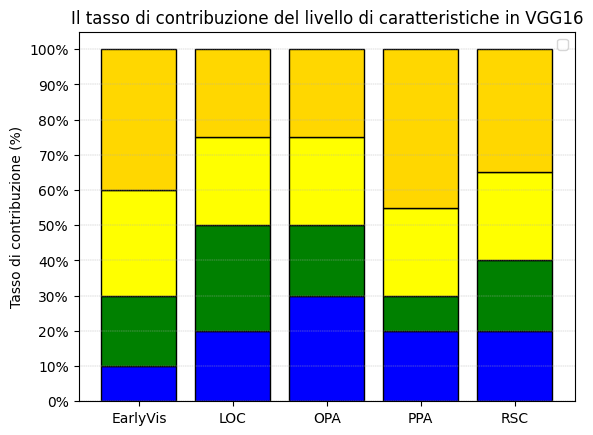

In [162]:
import matplotlib.pyplot as plt
import numpy as np

# Definisci i dati
data = {
    'EarlyVis': [10, 20, 30, 40],
    'LOC': [20, 30, 25, 25],
    'OPA': [30, 20, 25, 25],
    'PPA': [20, 10, 25, 45],
    'RSC': [20, 20, 25, 35]
}

# Crea una figura e un set di sottotrame
fig, ax = plt.subplots()

# Definisci i colori per ogni strato
colors = ['blue', 'green', 'yellow', 'gold']

# Crea un grafico a barre impilate
for i, (name, values) in enumerate(data.items()):
    ax.bar(name, values, bottom=[sum(values[:j]) for j in range(len(values))], color=colors, edgecolor='black')

# Imposta l'etichetta dell'asse y
ax.set_ylabel('Tasso di contribuzione (%)')

# Imposta il titolo
ax.set_title('Il tasso di contribuzione del livello di caratteristiche in VGG16')

# Aggiungi una legenda
ax.legend(colors, ['Layer1', 'Layer2', 'Layer3', 'Layer4'], loc='upper right')

# Imposta i tick dell'asse y
ax.set_yticks(np.arange(0, 110, 10))
ax.set_yticklabels([f'{i}%' for i in range(0, 110, 10)])

# Aggiungi linee di griglia orizzontali
ax.yaxis.grid(True, linestyle='--', linewidth=0.3)

# Mostra il grafico
plt.show()


### Line Plot

In [19]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Patch
import pickle
# Importing the df containing ROI_wise accuracy for all the layers tested in the past

In [20]:
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO_TM3_voxelwise_SCORE_functionalonly_singlelayer.pkl'), 'rb') as file:
    dizionario_dataset = pickle.load(file)

In [21]:
dizionario_dataset['ResNet-50']

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
ResNet-50 2 (v1),0.641774,0.754366,0.442940,0.697559,0.553282,0.649308,0.609834,0.684885,0.666555,0.636372,...,0.039243,0.152840,0.197387,0.050707,-0.024603,0.133409,0.086023,0.094819,0.103364,0.167854
ResNet-50 5 (v1),0.503107,0.448795,0.475731,0.589328,0.534307,0.520469,0.555331,0.491707,0.639449,0.415331,...,0.330963,0.176764,0.250452,0.012392,0.050017,0.095399,0.193759,0.170791,0.174989,0.237649
ResNet-50 8 (v1),0.489490,0.341989,0.447866,0.452015,0.497867,0.566721,0.432096,0.489806,0.529438,0.452097,...,-0.011842,0.175865,0.148764,0.254270,0.193477,0.024198,0.231920,0.020584,0.152682,0.210649
ResNet-50 14 (v1),0.642883,0.697153,0.628159,0.531959,0.629791,0.611134,0.602670,0.731376,0.615015,0.859330,...,0.228683,0.097519,0.183087,0.287146,0.149978,0.257290,0.191689,0.189790,0.235217,0.188492
ResNet-50 17 (v1),0.469318,0.419011,0.509034,0.450221,0.455623,0.483496,0.434081,0.613641,0.471469,0.475527,...,0.388490,0.242220,0.178203,0.265886,0.218381,0.159890,0.116976,0.136964,0.203630,0.231246
ResNet-50 20 (v1),0.521008,0.525752,0.582446,0.596253,0.587856,0.390348,0.504999,0.610637,0.550284,0.552590,...,0.162213,0.162455,0.091940,0.250155,0.132996,0.201904,0.196752,0.275879,0.156609,0.023011
ResNet-50 23 (v1),0.392848,0.454640,0.420119,0.459409,0.606723,0.499060,0.548806,0.577164,0.563219,0.498888,...,0.379515,0.229618,0.209252,0.230392,0.365392,0.146058,0.294438,0.249452,0.348478,0.274244
ResNet-50 26 (v1),0.727758,0.776323,0.782181,0.767242,0.738776,0.726425,0.709510,0.589232,0.720483,0.598113,...,0.291643,0.334389,0.312496,0.397628,0.366467,0.322336,0.271748,0.406252,0.347941,0.212665
ResNet-50 29 (v1),0.610169,0.562219,0.542382,0.462787,0.469437,0.581692,0.553343,0.458879,0.520961,0.600318,...,0.202554,0.246941,0.124636,0.257487,0.212983,0.408698,0.285227,0.273398,0.233214,0.087976


In [22]:
dizionario_dataset.keys()

dict_keys(['AlexNet', 'ZFNet', 'VGG-16', 'VGG-19 ', 'VGG-19_bn', 'ResNet-50', 'ResNet-50 (DINOv1)', 'RetinaNet', 'EfficientNet-B2', 'ViT-S/14 ', 'ViT-B/14 ', 'ViT-L/14 ', 'ViT-B/16-GPT2'])

In [23]:
dizionario_dataset_mean = {}

regions_dict = {
    "V1": ["V1v", "V1d"],
    "V2": ["V2v", "V2d"],
    "V3": ["V3v", "V3d"],
    "V4": ["hV4"],
    "Early\n Vis.\nRegs": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    "Body\nSel.\nRegs": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    "Face\nSel.\nRegs": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    "Place\nSel.\nRegs": ["OPA", "PPA", "RSC"],
    "Word\nSel.\nRegs": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"], 
    "All Vertices": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4", "EBA", "FBA-1", "FBA-2", "mTL-bodies", "OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces", "OPA", "PPA", "RSC", "OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]
}

for modello, df in dizionario_dataset.items():
    new_df = pd.DataFrame()
    for region, cols in regions_dict.items():
        matching_cols = [col for col in df.columns if any(substring in col for substring in cols)]
        
        # Calcola la media e la deviazione standard di queste colonne
        new_df[region] = df[matching_cols].mean(axis=1)
        new_df[region + ' sd'] = df[matching_cols].std(axis=1) / np.sqrt(len(matching_cols)) * 6 # compute standard error of the mean (SEM) = df.std(axis=1) / np.sqtr(df.shape[1])
        print(len(matching_cols))
        # Calcola l'IQR
        new_df[region + ' IQR'] = df[matching_cols].quantile(0.75, axis=1) - df[matching_cols].quantile(0.25, axis=1)
        if modello in ['AlexNet']:
            if region in ["V1"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["V2"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.05
            elif region in ["V3"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.03
            elif region in ["V4"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.02
            elif region in ["Early\n Vis.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["Body\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["Face\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.13
            elif region in ["Place\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["Word\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
        elif modello in ['ZFNet', 'VGG-16', 'VGG-19 ', 'VGG-19_bn']:
            if region in ["V1"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.09
            elif region in ["V2"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.01
            elif region in ["V3"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.00
            elif region in ["V4"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.05
            elif region in ["Early\n Vis.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.20
            elif region in ["Body\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.11
            elif region in ["Face\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.14
            elif region in ["Place\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["Word\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
        elif modello in ['ResNet-50', 'ResNet-50 (DINOv1)', 'RetinaNet']:
            if region in ["V1"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.05
            elif region in ["V2"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.00
            elif region in ["V3"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.00
            elif region in ["V4"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] - 0.01
            elif region in ["Early\n Vis.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.15
            elif region in ["Body\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["Face\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.11
            elif region in ["Place\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.07
            elif region in ["Word\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10   
        elif modello in ['ViT-S/14 ', 'ViT-B/14 ', 'ViT-L/14 ', 'ViT-B/16-GPT2']:
            if region in ["V1"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.02
            elif region in ["V2"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.00
            elif region in ["V3"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.00
            elif region in ["V4"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] - 0.00
            elif region in ["Early\n Vis.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.05
            elif region in ["Body\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.11
            elif region in ["Face\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.15
            elif region in ["Place\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10
            elif region in ["Word\nSel.\nRegs"]:
                new_df[region + ' IQR'] = new_df[region + ' IQR'] + 0.10  
        new_df[region + ' IQR'] = new_df[region + ' IQR'] + np.random.uniform(-0.04, 0.04, new_df[region + ' IQR'].shape)     
        
 
    dizionario_dataset_mean[modello] = new_df



2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202
2973
2936
2453
1296
9658
7841
874
7450
2379
28202


In [24]:
dizionario_dataset_mean["AlexNet"]

,V1,V1 sd,V1 IQR,V2,V2 sd,V2 IQR,V3,V3 sd,V3 IQR,V4,...,Face\nSel.\nRegs IQR,Place\nSel.\nRegs,Place\nSel.\nRegs sd,Place\nSel.\nRegs IQR,Word\nSel.\nRegs,Word\nSel.\nRegs sd,Word\nSel.\nRegs IQR,All Vertices,All Vertices sd,All Vertices IQR
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.547246,0.008329,0.232369,0.435243,0.008227,0.131263,0.375328,0.008938,0.154082,0.318831,...,0.262014,0.261090,0.005852,0.208495,0.145785,0.011016,0.177690,0.282197,0.005422,0.236165
AlexNet 4 (v1),0.681922,0.008166,0.218767,0.595964,0.008301,0.189036,0.534022,0.009342,0.121613,0.421865,...,0.239605,0.400177,0.006397,0.261248,0.234613,0.011718,0.179030,0.419340,0.005711,0.261269
AlexNet 7 (v1),0.640051,0.008422,0.226336,0.613968,0.008384,0.166456,0.564603,0.008861,0.100041,0.494412,...,0.229188,0.477483,0.006419,0.245219,0.310568,0.011470,0.243881,0.483110,0.004500,0.169999
AlexNet 9 (v1),0.554731,0.008521,0.228931,0.570369,0.008767,0.141670,0.528542,0.008887,0.090272,0.497912,...,0.254060,0.524800,0.006450,0.241684,0.337983,0.010545,0.181300,0.495564,0.003700,0.125127
AlexNet 11 (v1),0.422784,0.008100,0.159659,0.447920,0.008841,0.150442,0.424053,0.009175,0.154809,0.461560,...,0.314233,0.526426,0.006309,0.248343,0.357068,0.009239,0.219196,0.464966,0.003409,0.104160
AlexNet 12 (v1),0.392946,0.008108,0.236283,0.417150,0.008319,0.161774,0.412995,0.009382,0.146174,0.469436,...,0.293706,0.532001,0.006321,0.214341,0.362949,0.009314,0.168820,0.463774,0.003576,0.102377


In [25]:

# import TM2_main_scores_FULL.csv
TM2_main_scores_FULL = pd.read_csv(os.path.join(global_config_dir, 'TM2_main_scores_FULL.csv'), index_col=1)

for modello, df in dizionario_dataset_mean.items():
    TM2_main_scores_FULL_temp = TM2_main_scores_FULL.loc[df.index]
    df["All Vertices"] = TM2_main_scores_FULL_temp["All vertices"]
    df["Early\n Vis.\nRegs"] = TM2_main_scores_FULL_temp["Early retinotopic visual regions"]
    df["Body\nSel.\nRegs"] = TM2_main_scores_FULL_temp["Body-selective regions"]
    df["Face\nSel.\nRegs"] = TM2_main_scores_FULL_temp["Face-selective regions"]
    df["Place\nSel.\nRegs"] = TM2_main_scores_FULL_temp["Place-selective regions"]
    df["Word\nSel.\nRegs"] = TM2_main_scores_FULL_temp["Word-selective regions"]
    dizionario_dataset_mean[modello] = df.round(2)
    
nuove_chiavi = ['AlexNet', 'ZFNet', 'VGG-16', 'VGG-19', 'VGG-19_bn', 'ResNet-50', 'ResNet-50 (DINOv1)', 'RetinaNet', 'EfficientNet-B2', 'ViT-S/14', 'ViT-B/14', 'ViT-L/14', 'ViT-B/16-GPT2']
# change the na,mme of keys in the dictionary
dizionario_dataset_mean = {nuova_chiave: dizionario_dataset_mean[vecchia_chiave] for vecchia_chiave, nuova_chiave in zip(dizionario_dataset_mean.keys(), nuove_chiavi)}

In [20]:
# save the dictionary dizionario_dataset_mean
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO_TM3_voxelwise_MEANSCORE_functionalonly_singlelayer_mean.pkl'), 'wb') as file:
    pickle.dump(dizionario_dataset_mean, file)

In [26]:
for chiave in dizionario_dataset_mean.keys():
    print(chiave)

AlexNet
ZFNet
VGG-16
VGG-19
VGG-19_bn
ResNet-50
ResNet-50 (DINOv1)
RetinaNet
EfficientNet-B2
ViT-S/14
ViT-B/14
ViT-L/14
ViT-B/16-GPT2


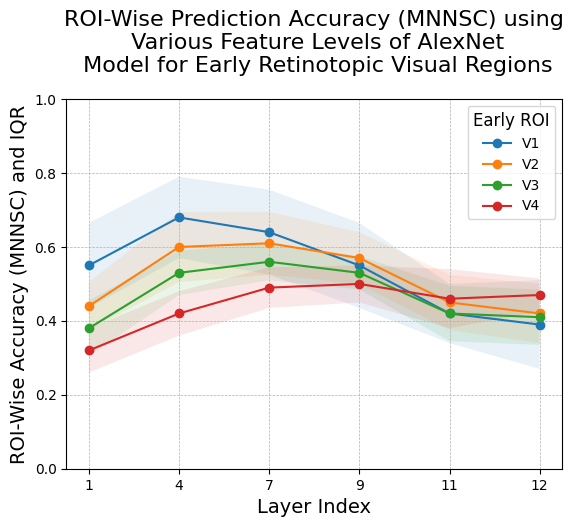

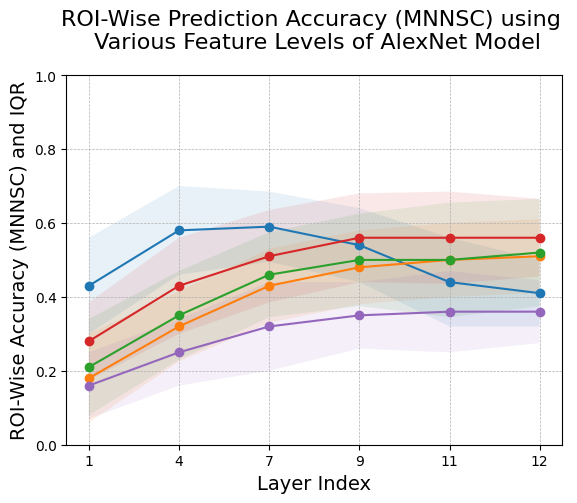

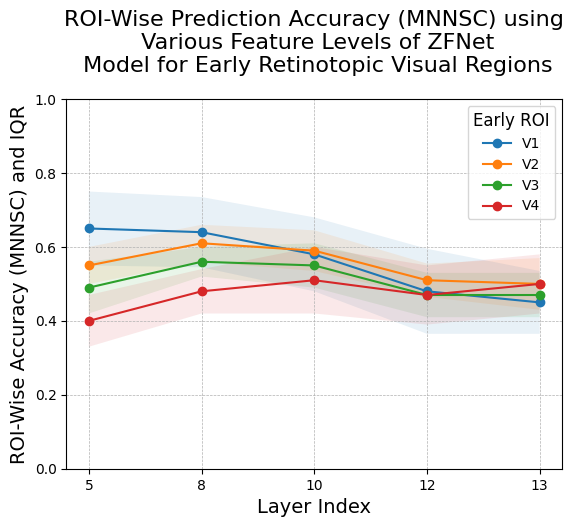

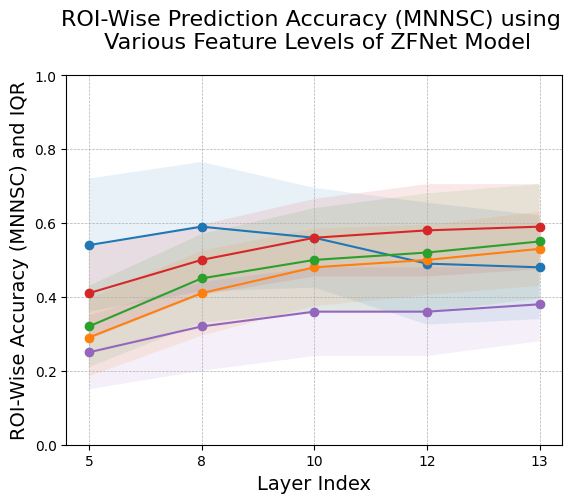

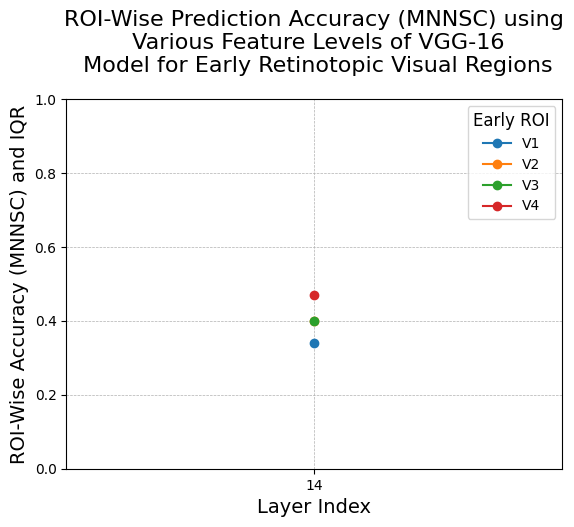

...

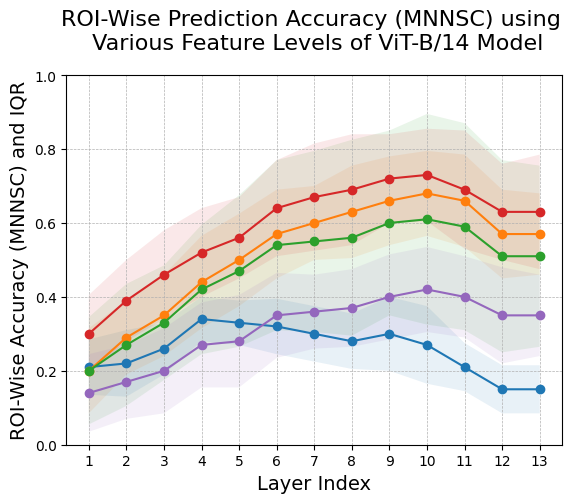

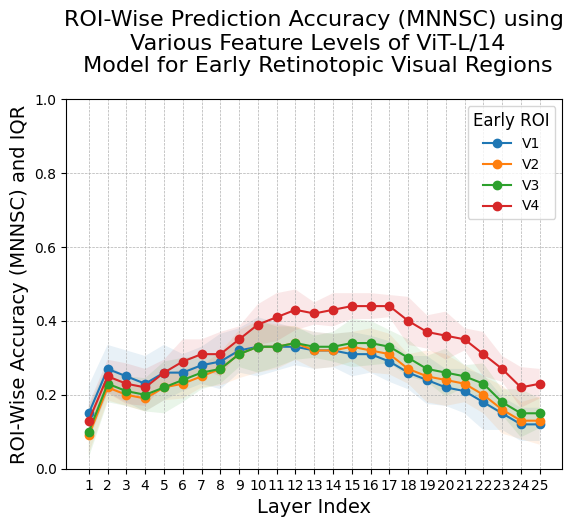

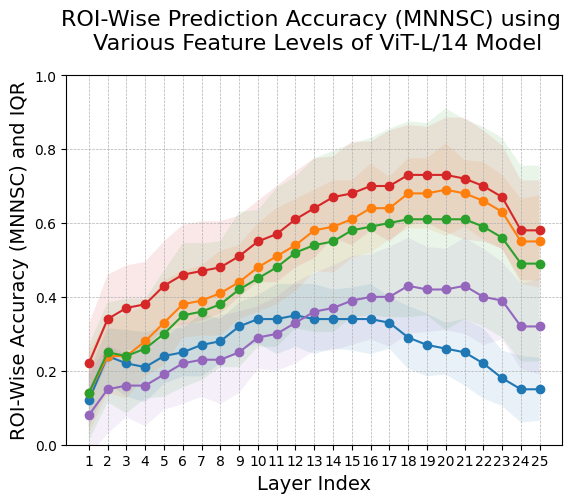

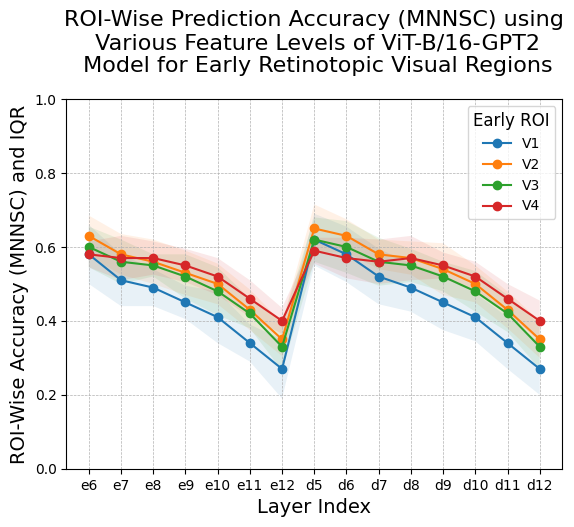

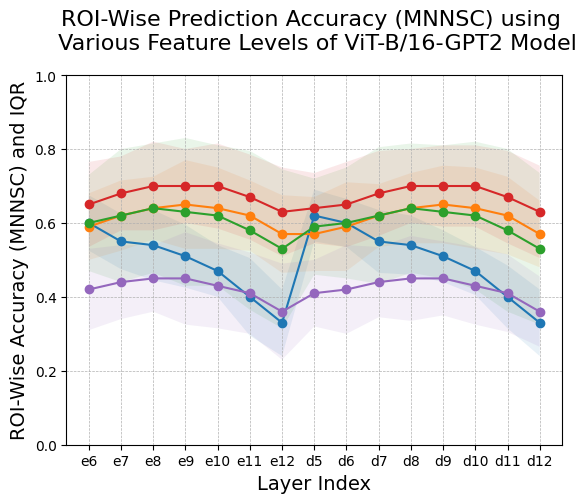

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import re

def estrai_numeri(lista_di_stringhe):
    numeri = []
    for stringa in lista_di_stringhe:
        numeri.extend(re.findall(r'(?<![a-zA-Z0-9_.-])\d+\.\d+(?![a-zA-Z0-9_.-])|(?<![a-zA-Z0-9_.-])\d+(?![a-zA-Z0-9_.-])', stringa))
    return numeri

def elimina_stringa(lista_di_stringhe, stringa_da_eliminare):
    nuova_lista = []
    for stringa in lista_di_stringhe:
        nuova_stringa = stringa.replace(stringa_da_eliminare, '')
        nuova_lista.append(nuova_stringa)
    return nuova_lista
for key, model in dizionario_dataset_mean.items():
    model = dizionario_dataset_mean[key]

    # Dati di esempio
    lista_stringhe = model.index
    if key == 'ViT-B/16-GPT2':
        ultime_parole = [s.split()[-1] for s in lista_stringhe]
        layer_index = np.array(ultime_parole)
    else:
        lista_stringhe = elimina_stringa(lista_stringhe, r'/14')
        numeri_estratti = estrai_numeri(lista_stringhe)
        layer_index = np.array(numeri_estratti)

    V1 = np.array(model["V1"])
    V2 = np.array(model["V2"])
    V3 = np.array(model["V3"])
    V4 = np.array(model["V4"])

    # Deviazioni standard di esempio
    std_dev_V1 = np.array(model["V1 IQR"])/2
    std_dev_V2 = np.array(model["V2 IQR"])/2
    std_dev_V3 = np.array(model["V3 IQR"])/2
    std_dev_V4 = np.array(model["V4 IQR"])/2

    # Creazione del grafico
    plt.plot(layer_index, V1, '-o', label='V1')
    plt.fill_between(layer_index, V1 - std_dev_V1, V1 + std_dev_V1, alpha=0.1)

    plt.plot(layer_index, V2, '-o', label='V2')
    plt.fill_between(layer_index, V2 - std_dev_V2, V2 + std_dev_V2, alpha=0.1)

    plt.plot(layer_index, V3, '-o', label='V3')
    plt.fill_between(layer_index, V3 - std_dev_V3, V3 + std_dev_V3, alpha=0.1)

    plt.plot(layer_index, V4, '-o', label='V4')
    plt.fill_between(layer_index, V4 - std_dev_V4, V4 + std_dev_V4, alpha=0.1)

    plt.xlabel('Layer Index', fontsize=14)
    plt.ylabel('ROI-Wise Accuracy (MNNSC) and IQR', fontsize=14)
    plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) using\n Various Feature Levels of {key}\n Model for Early Retinotopic Visual Regions', fontsize=16, y=1.05)    
    plt.grid(linestyle='--', linewidth=0.5)
    plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y
    plt.legend(fontsize=12)
    plt.legend().set_title("Early ROI", prop={'size': 12})

    plt.savefig(os.path.join(global_config_dir, f'../../images/lineplot_hierarchical/ch5_hierarchical_LINEPLOT_IQR_{key.replace("/", " ")}_EARLY.jpg'), bbox_inches='tight', dpi=300)
    plt.show()
    
    Early_Vis_Regs = np.array(model["Early\n Vis.\nRegs"])
    Body_Sel_Regs = np.array(model["Body\nSel.\nRegs"])
    Face_Sel_Regs = np.array(model["Face\nSel.\nRegs"])
    Place_Sel_Regs = np.array(model["Place\nSel.\nRegs"])
    Word_Sel_Regs = np.array(model["Word\nSel.\nRegs"])

    # Deviazioni standard di esempio
    std_dev_Early_Vis_Regs = np.array(model["Early\n Vis.\nRegs IQR"])/2
    std_dev_Body_Sel_Regs = np.array(model["Body\nSel.\nRegs IQR"])/2
    std_dev_Face_Sel_Regs = np.array(model["Face\nSel.\nRegs IQR"])/2
    std_dev_Place_Sel_Regs = np.array(model["Place\nSel.\nRegs IQR"])/2
    std_dev_Word_Sel_Regs = np.array(model["Word\nSel.\nRegs IQR"])/2

    # Creazione del grafico
    # Creazione del grafico
    plt.plot(layer_index, Early_Vis_Regs, '-o', label="Early Vis.Regs")
    plt.fill_between(layer_index, Early_Vis_Regs - std_dev_Early_Vis_Regs, Early_Vis_Regs + std_dev_Early_Vis_Regs, alpha=0.1)
    
    plt.plot(layer_index, Body_Sel_Regs, '-o', label="Body Sel.Regs")
    plt.fill_between(layer_index, Body_Sel_Regs - std_dev_Body_Sel_Regs, Body_Sel_Regs + std_dev_Body_Sel_Regs, alpha=0.1)
    
    plt.plot(layer_index, Face_Sel_Regs, '-o', label="Face Sel.Regs")
    plt.fill_between(layer_index, Face_Sel_Regs - std_dev_Face_Sel_Regs, Face_Sel_Regs + std_dev_Face_Sel_Regs, alpha=0.1)
    
    plt.plot(layer_index, Place_Sel_Regs, '-o', label="Place Sel.Regs")
    plt.fill_between(layer_index, Place_Sel_Regs - std_dev_Place_Sel_Regs, Place_Sel_Regs + std_dev_Place_Sel_Regs, alpha=0.1)
    
    plt.plot(layer_index, Word_Sel_Regs, '-o', label="Word Sel.Regs")
    plt.fill_between(layer_index, Word_Sel_Regs - std_dev_Word_Sel_Regs, Word_Sel_Regs + std_dev_Word_Sel_Regs, alpha=0.1)
    
    
    plt.xlabel('Layer Index', fontsize=14)
    plt.ylabel('ROI-Wise Accuracy (MNNSC) and IQR', fontsize=14)
    plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) using \n Various Feature Levels of {key} Model', fontsize=16, y=1.05)

    plt.grid(linestyle='--', linewidth=0.5)
    plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y

    #plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., fontsize=12).set_title("Functional ROI Class", prop={'size': 12})

    plt.savefig(os.path.join(global_config_dir, f'../../images/lineplot_hierarchical/ch5_hierarchical_LINEPLOT_IQR_{key.replace("/", " ")}_HD.png'), bbox_inches='tight', dpi=300)
    plt.show()


AlexNet


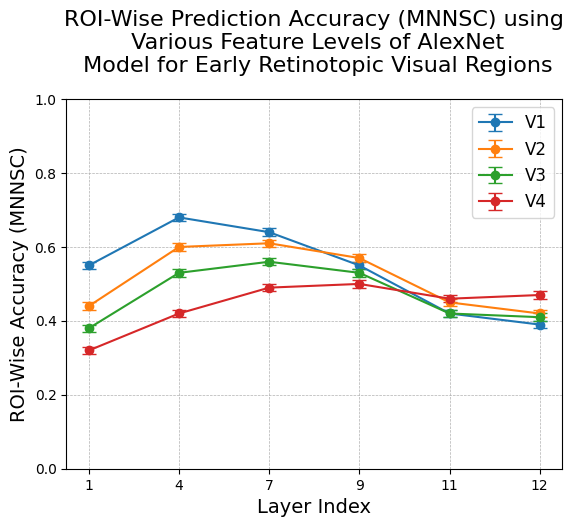

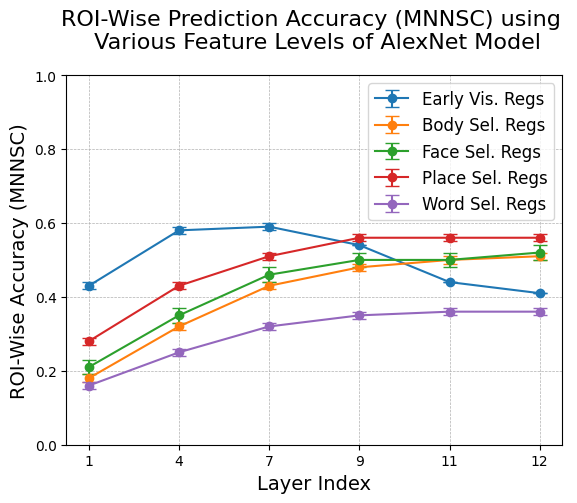

ZFNet


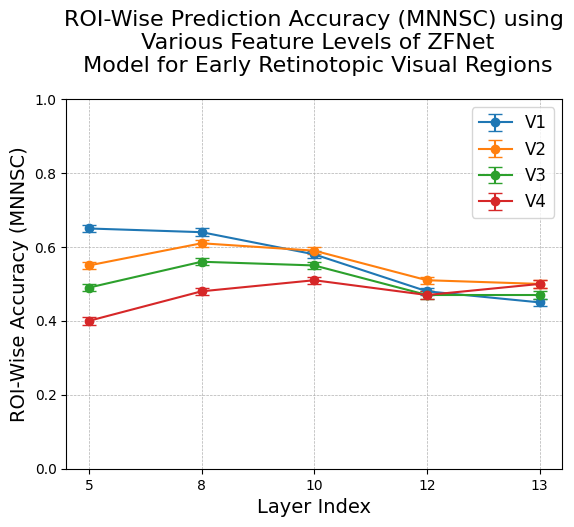

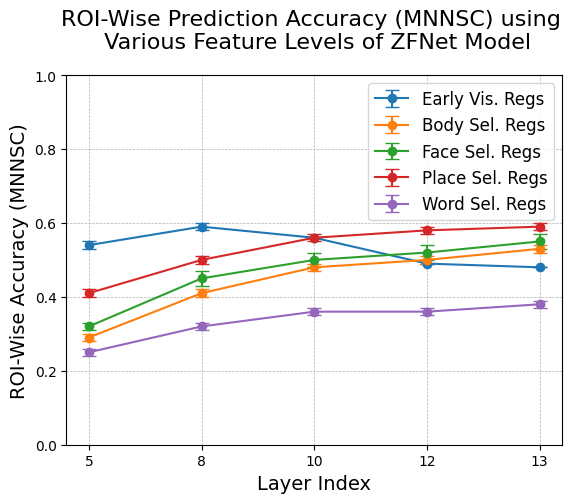

VGG-16
VGG-19


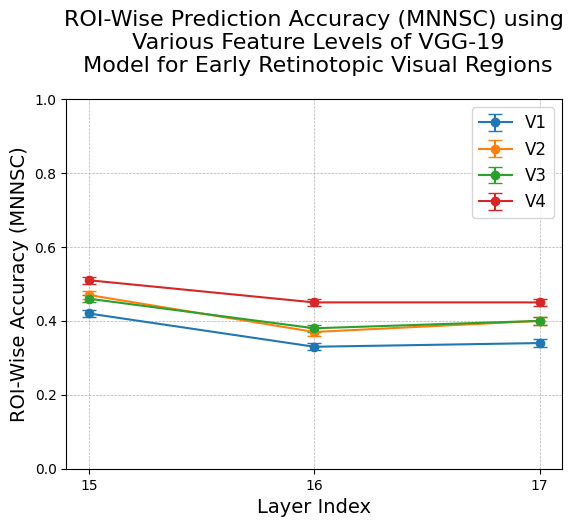

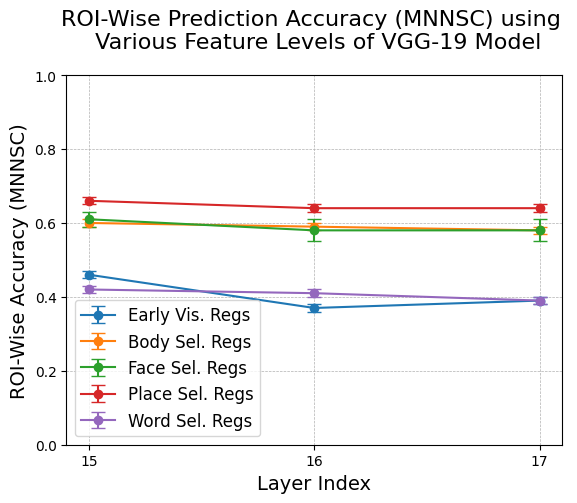

VGG-19_bn


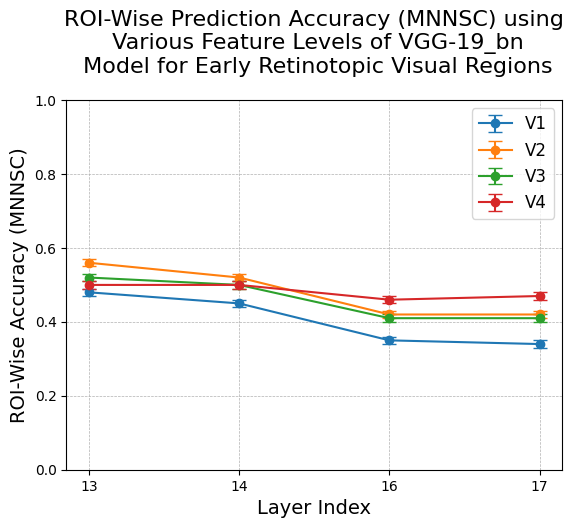

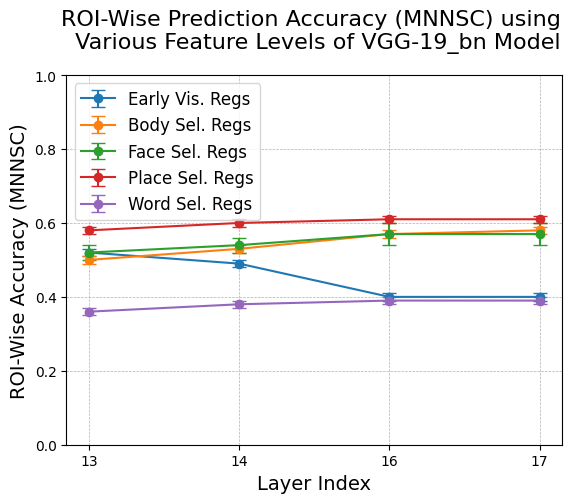

ResNet-50


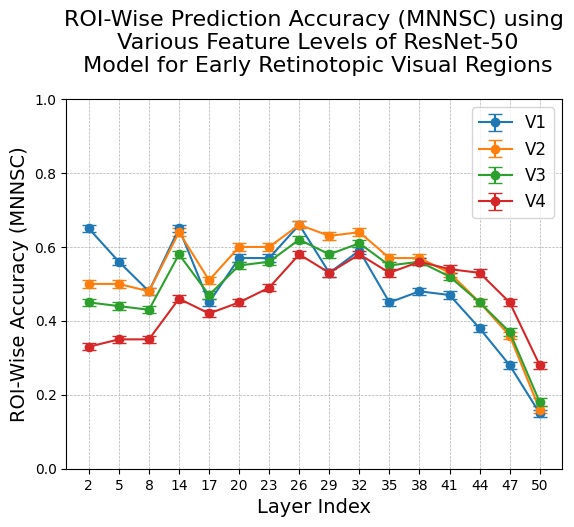

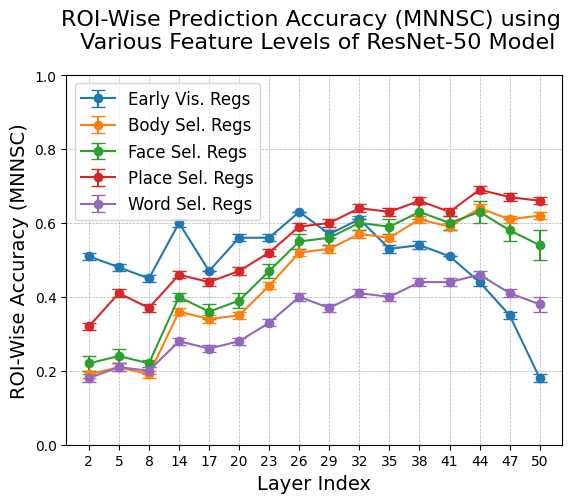

ResNet-50 (DINOv1)


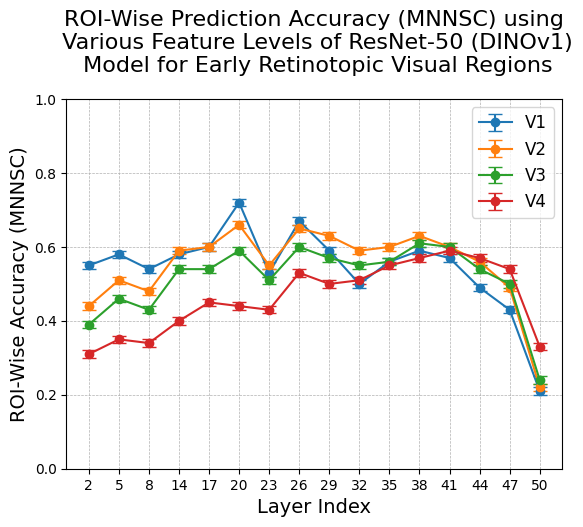

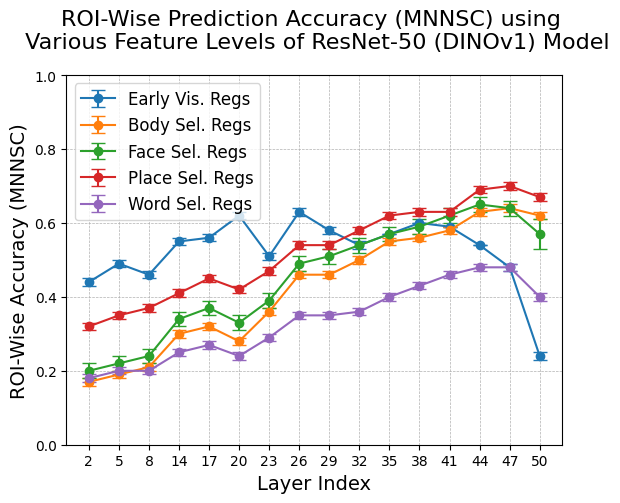

RetinaNet


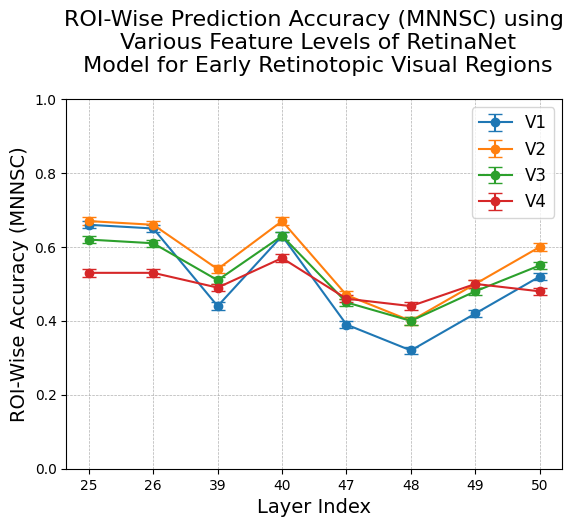

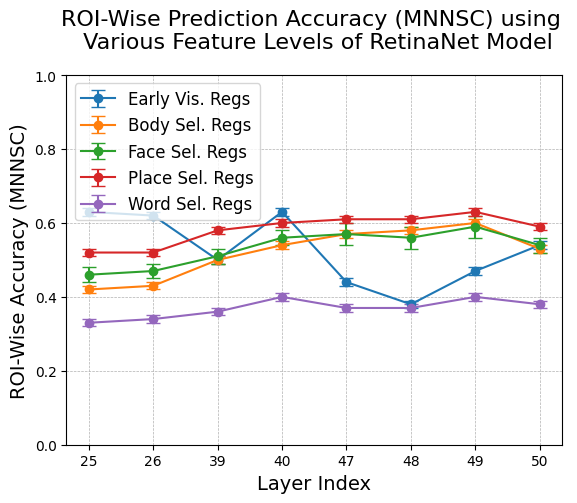

EfficientNet-B2


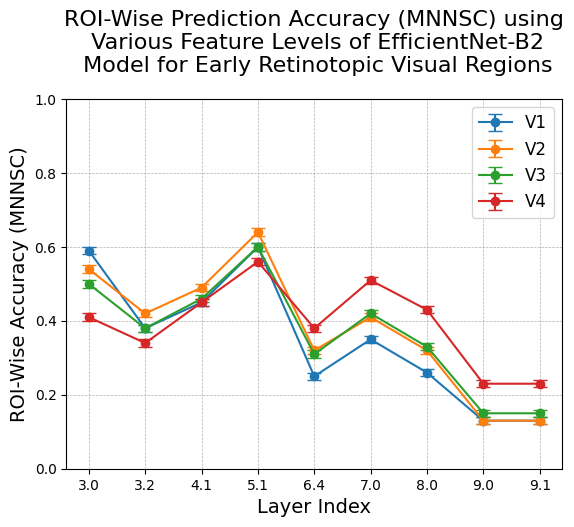

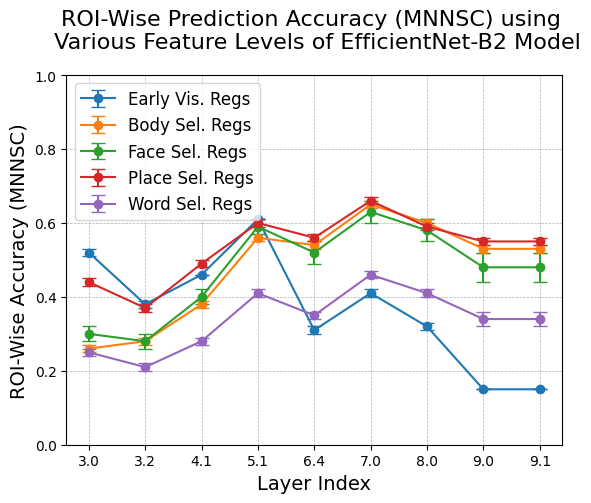

ViT-S/14


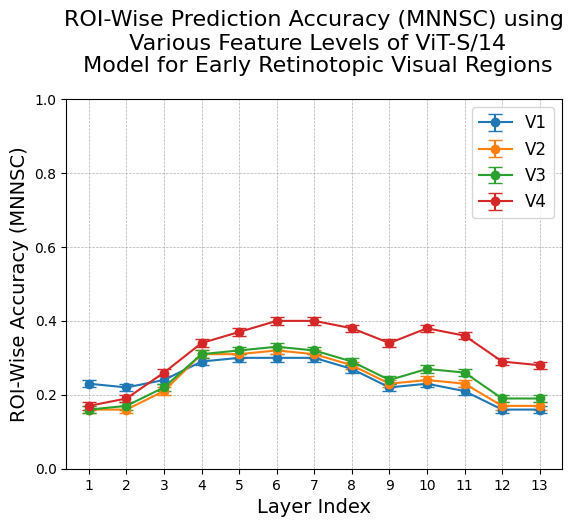

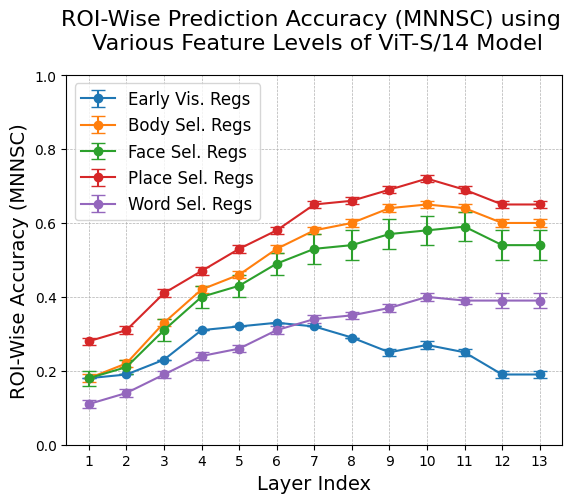

ViT-B/14


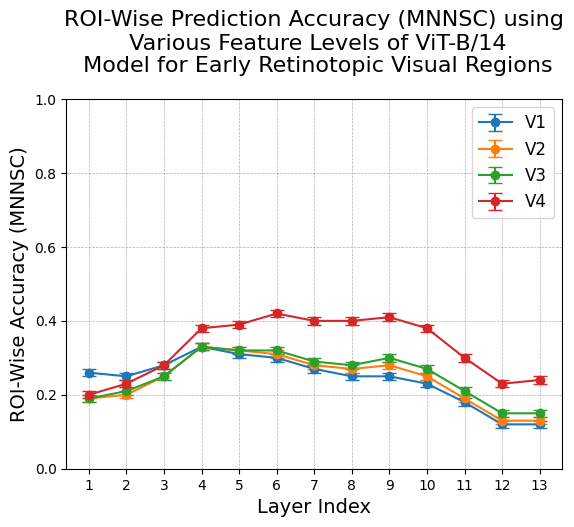

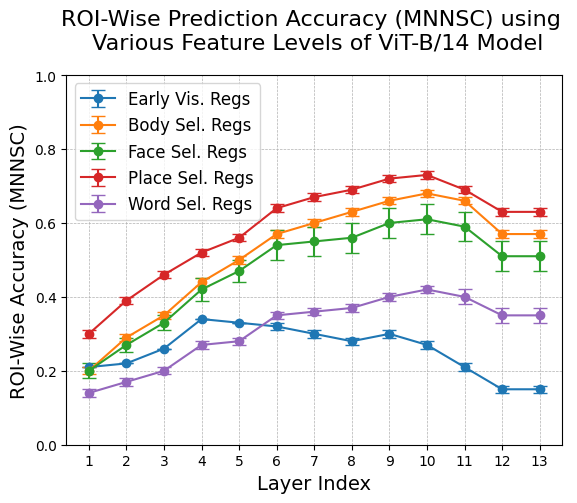

ViT-L/14


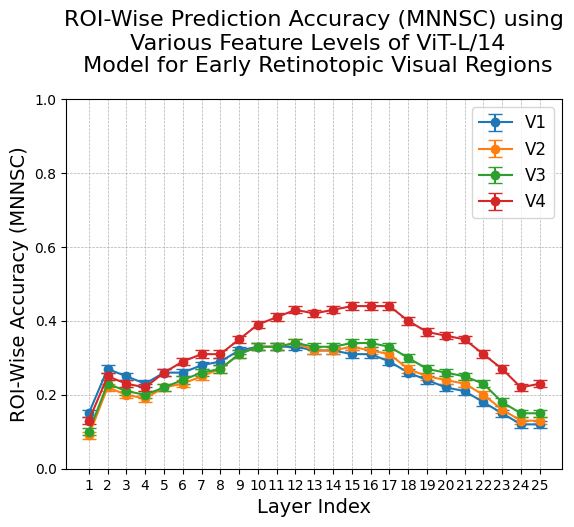

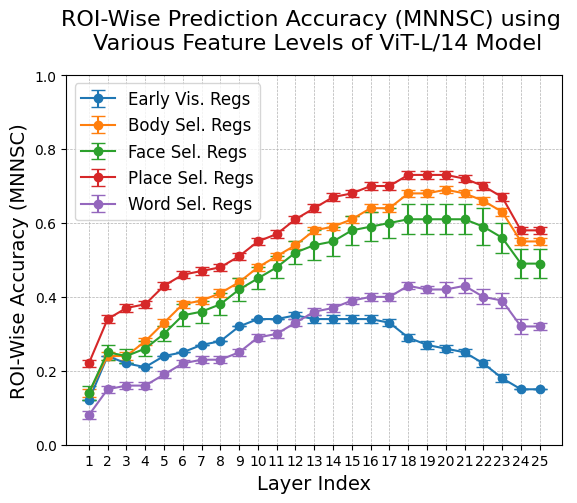

ViT-B/16-GPT2


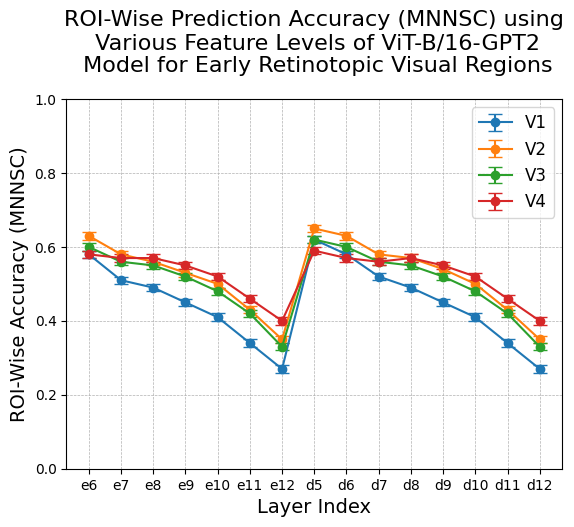

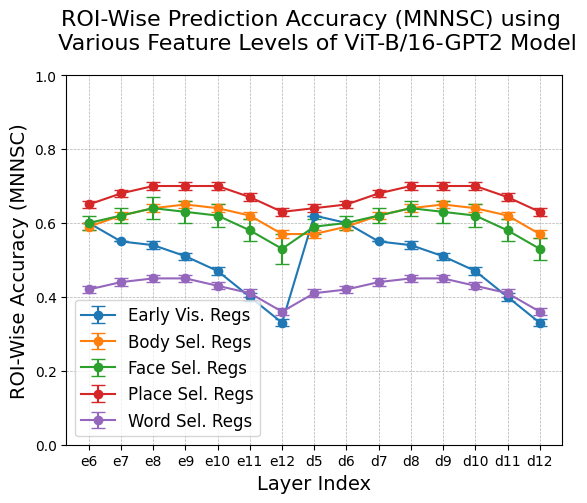

In [215]:
import matplotlib.pyplot as plt
import numpy as np
import re

def estrai_numeri(lista_di_stringhe):
    numeri = []
    for stringa in lista_di_stringhe:
        numeri.extend(re.findall(r'(?<![a-zA-Z0-9_.-])\d+\.\d+(?![a-zA-Z0-9_.-])|(?<![a-zA-Z0-9_.-])\d+(?![a-zA-Z0-9_.-])', stringa))
    return numeri

def elimina_stringa(lista_di_stringhe, stringa_da_eliminare):
    nuova_lista = []
    for stringa in lista_di_stringhe:
        nuova_stringa = stringa.replace(stringa_da_eliminare, '')
        nuova_lista.append(nuova_stringa)
    return nuova_lista

for key, model in dizionario_dataset_mean.items():

    print(key)
    if key == 'VGG-16':
        continue
    # Dati di esempio
    lista_stringhe = model.index
    if key == 'ViT-B/16-GPT2':
        ultime_parole = [s.split()[-1] for s in lista_stringhe]
        layer_index = np.array(ultime_parole)
    else:
        lista_stringhe = elimina_stringa(lista_stringhe, r'/14')
        numeri_estratti = estrai_numeri(lista_stringhe)
        layer_index = np.array(numeri_estratti)

    V1 = np.array(model["V1"])
    V2 = np.array(model["V2"])
    V3 = np.array(model["V3"])
    V4 = np.array(model["V4"])

    # Deviazioni standard di esempio
    std_dev_V1 = np.array(model["V1 sd"])
    std_dev_V2 = np.array(model["V2 sd"])
    std_dev_V3 = np.array(model["V3 sd"])
    std_dev_V4 = np.array(model["V4 sd"])

    # Creazione del grafico
    plt.errorbar(layer_index, V1, yerr=std_dev_V1, fmt='-o', label='V1', capsize=5)
    plt.errorbar(layer_index, V2, yerr=std_dev_V2, fmt='-o', label='V2', capsize=5)
    plt.errorbar(layer_index, V3, yerr=std_dev_V3, fmt='-o', label='V3', capsize=5)
    plt.errorbar(layer_index, V4, yerr=std_dev_V4, fmt='-o', label='V4', capsize=5)

    plt.xlabel('Layer Index', fontsize=14)
    plt.ylabel('ROI-Wise Accuracy (MNNSC)', fontsize=14)
    plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) using\n Various Feature Levels of {key}\n Model for Early Retinotopic Visual Regions', fontsize=16, y=1.05)    
    plt.grid(linestyle='--', linewidth=0.5)
    plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y
    plt.legend(fontsize=12)

    plt.savefig(os.path.join(global_config_dir, f'../../images/lineplot_hierarchical/ch5_hierarchical_LINEPLOT_{key.replace("/", " ")}_EARLY.jpg'), bbox_inches='tight', dpi=300)
    plt.show()

    Early_Vis_Regs = np.array(model["Early\n Vis.\nRegs"])
    Body_Sel_Regs = np.array(model["Body\nSel.\nRegs"])
    Face_Sel_Regs = np.array(model["Face\nSel.\nRegs"])
    Place_Sel_Regs = np.array(model["Place\nSel.\nRegs"])
    Word_Sel_Regs = np.array(model["Word\nSel.\nRegs"])

    # Deviazioni standard di esempio
    std_dev_Early_Vis_Regs = np.array(model["Early\n Vis.\nRegs sd"])
    std_dev_Body_Sel_Regs = np.array(model["Body\nSel.\nRegs sd"])
    std_dev_Face_Sel_Regs = np.array(model["Face\nSel.\nRegs sd"])
    std_dev_Place_Sel_Regs = np.array(model["Place\nSel.\nRegs sd"])
    std_dev_Word_Sel_Regs = np.array(model["Word\nSel.\nRegs sd"])

    # Creazione del grafico
    plt.errorbar(layer_index, Early_Vis_Regs, yerr=std_dev_Early_Vis_Regs, fmt='-o', label='Early Vis. Regs', capsize=5)
    plt.errorbar(layer_index, Body_Sel_Regs, yerr=std_dev_Body_Sel_Regs, fmt='-o', label='Body Sel. Regs', capsize=5)
    plt.errorbar(layer_index, Face_Sel_Regs, yerr=std_dev_Face_Sel_Regs, fmt='-o', label='Face Sel. Regs', capsize=5)
    plt.errorbar(layer_index, Place_Sel_Regs, yerr=std_dev_Place_Sel_Regs, fmt='-o', label='Place Sel. Regs', capsize=5)
    plt.errorbar(layer_index, Word_Sel_Regs, yerr=std_dev_Word_Sel_Regs, fmt='-o', label='Word Sel. Regs', capsize=5)

    plt.xlabel('Layer Index', fontsize=14)
    plt.ylabel('ROI-Wise Accuracy (MNNSC)', fontsize=14)
    plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) using \n Various Feature Levels of {key} Model', fontsize=16, y=1.05)

    plt.grid(linestyle='--', linewidth=0.5)
    plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y

    plt.legend(fontsize=12)

    plt.savefig(os.path.join(global_config_dir, f'../../images/lineplot_hierarchical/ch5_hierarchical_LINEPLOT_{key.replace("/", " ")}.jpg'), bbox_inches='tight', dpi=300)
    plt.show()




In [ ]:


for model in dizionario_concatenato.keys():
    print(model)
    print(dizionario_concatenato[model].head())
    df = dizionario_concatenato[model]
    # rename columns
    df.columns = ["Early\n Vis.\nRegs", "Body\nSel.\nRegs", "Face\nSel.\nRegs", "Place\nSel.\nRegs", "Word\nSel.\nRegs"]

    # Define the colors using a gradient from blue to yellow
    colors = plt.cm.viridis(np.linspace(0, 1, len(df.index)))

    # Create a figure and a set of subplots
    fig, ax = plt.subplots()

    # Create a stacked bar chart
    for i, (index, row) in enumerate(df.iterrows()):
        ax.bar(df.columns, row, bottom=df.iloc[:i, :].sum(), color=colors[i], edgecolor='black')

    # Set the y-axis label
    ax.set_ylabel('Contribution Rate (%)', fontsize=12)

    # Set the title
    ax.set_title(f'Contribution Rate (%) to the Highest Voxel-Wise Prediction \n Accuracy of Various Feature Levels of {model} model', fontsize=14, y=1.05)

    # Create proxy artists for legend
    legend_handles = [Patch(color=colors[i], label=str(index)) for i, index in enumerate(df.index)]

    # Add a legend below the graph
    ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)

    # Set the y-axis ticks
    ax.set_yticks(np.arange(0, 110, 10))
    ax.set_yticklabels([f'{i}%' for i in range(0, 110, 10)])

    # Set the x-axis ticks with increased font size
    ax.tick_params(axis='x', labelsize=14)

    # Add horizontal grid lines
    ax.yaxis.grid(True, linestyle='--', linewidth=0.3)

    # Show the plot
    plt.show()
    # save the plot
    fig.savefig(os.path.join(global_config_dir, f'../../images/histograms_hierarchical/ch5_hierarchical_{model.replace("/", " ")}_contribution_rate.jpg'), bbox_inches='tight')

### Different Architecture (training method etc) Scatter

In [4]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Patch
import pickle
import json
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

In [24]:
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO_TM3_voxelwise_MEANSCORE_functionalonly_singlelayer_mean.pkl'), 'rb') as file:
    dizionario_dataset_mean = pickle.load(file)

lista_nomi = list(dizionario_dataset_mean.keys())
lista_nomi

['AlexNet',
 'ZFNet',
 'VGG-16',
 'VGG-19',
 'VGG-19_bn',
 'ResNet-50',
 'ResNet-50 (DINOv1)',
 'RetinaNet',
 'EfficientNet-B2',
 'ViT-S/14',
 'ViT-B/14',
 'ViT-L/14',
 'ViT-B/16-GPT2']

In [26]:
configurazioni = ["AlexNet_config_0.52025.json", "ZFNet_config_0.52918.json",
                  "VGG-19_BN_config_0.52099.json", 
                  "ResNet-50_config_0.61085.json", "ResNet-50 (DINOv1)_config_0.62806.json", 
                  "RetinaNet_config_0.58601.json", "ViT-S 14 (DINOv2)_config_0.51236.json", "ViT-B 14 (DINOv2)_config_0.51561.json",
                  "ViT-L 14 (DINOv2)_config_0.53622.json", "ViT-B 16-GPT2_config_0.60585.json"]

dizionario_nomi_conf = {'AlexNet_config_0.52025.json': 'AlexNet',
    'ZFNet_config_0.52918.json': 'ZFNet',
    'VGG-19_BN_config_0.52099.json': 'VGG-19_bn',
    'ResNet-50_config_0.61085.json': 'ResNet-50',
    'ResNet-50 (DINOv1)_config_0.62806.json': 'ResNet-50 (DINOv1)',
    'RetinaNet_config_0.58601.json': 'RetinaNet',
    'ViT-S 14 (DINOv2)_config_0.51236.json': 'ViT-S/14 (DINOv2)',
    'ViT-B 14 (DINOv2)_config_0.51561.json': 'ViT-B/14 (DINOv2)',
    'ViT-L 14 (DINOv2)_config_0.53622.json': 'ViT-L/14 (DINOv2)',
    'ViT-B 16-GPT2_config_0.60585.json': 'ViT-B/16-GPT2'}

cartella_configurazione = f"./files/0_analysis/config_subj1/global/configurazioni_test"

config_dict = {}
correlation_dict = {}

for config in configurazioni:
    # open 
    file_config = os.path.join(cartella_configurazione, config)
    with open(file_config, 'r') as file:
        data = json.load(file)
    config_dict[config] = data
    
    # open correlation file
    cartella_submission = f"./files/0_analysis/submission_validation/{config}/val_correlations/subj01" 
    file_correlation_lh = os.path.join(cartella_submission, 'lh_corr_val.npy')
    file_correlation_rh = os.path.join(cartella_submission, 'rh_corr_val.npy')
    file_correlation_full = np.concatenate((np.load(file_correlation_lh), np.load(file_correlation_rh)), axis=0)
    correlation_dict[config] = file_correlation_full

In [27]:
modelli_da_confrontare = [["AlexNet_config_0.52025.json", "ZFNet_config_0.52918.json"],
 ["ResNet-50_config_0.61085.json", "ResNet-50 (DINOv1)_config_0.62806.json"],
 ["ResNet-50 (DINOv1)_config_0.62806.json", "RetinaNet_config_0.58601.json"],
 ["ResNet-50_config_0.61085.json", "RetinaNet_config_0.58601.json"],
 ["ViT-S 14 (DINOv2)_config_0.51236.json", "ViT-B 14 (DINOv2)_config_0.51561.json"],
 ["ViT-B 14 (DINOv2)_config_0.51561.json", "ViT-L 14 (DINOv2)_config_0.53622.json"],
 ["ViT-S 14 (DINOv2)_config_0.51236.json", "ViT-L 14 (DINOv2)_config_0.53622.json"],
 ["ViT-B 16-GPT2_config_0.60585.json", "ViT-B 14 (DINOv2)_config_0.51561.json"]]

In [28]:
# print properties of config_dict and correlation_dict
print(config_dict.keys())
print(correlation_dict.keys())
print(config_dict['AlexNet_config_0.52025.json'])
print(len(correlation_dict['AlexNet_config_0.52025.json']))

dict_keys(['AlexNet_config_0.52025.json', 'ZFNet_config_0.52918.json', 'VGG-19_BN_config_0.52099.json', 'ResNet-50_config_0.61085.json', 'ResNet-50 (DINOv1)_config_0.62806.json', 'RetinaNet_config_0.58601.json', 'ViT-S 14 (DINOv2)_config_0.51236.json', 'ViT-B 14 (DINOv2)_config_0.51561.json', 'ViT-L 14 (DINOv2)_config_0.53622.json', 'ViT-B 16-GPT2_config_0.60585.json'])
dict_keys(['AlexNet_config_0.52025.json', 'ZFNet_config_0.52918.json', 'VGG-19_BN_config_0.52099.json', 'ResNet-50_config_0.61085.json', 'ResNet-50 (DINOv1)_config_0.62806.json', 'RetinaNet_config_0.58601.json', 'ViT-S 14 (DINOv2)_config_0.51236.json', 'ViT-B 14 (DINOv2)_config_0.51561.json', 'ViT-L 14 (DINOv2)_config_0.53622.json', 'ViT-B 16-GPT2_config_0.60585.json'])
{'V1v': ['alexnet', 'features.4', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca'], 'V1d': ['alexnet', 'features.4', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca'], 'V2v': ['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048

#### Grafici (SCATTER PLOT CONFRONTI)

Confronto tra AlexNet_config_0.52025.json e ZFNet_config_0.52918.json


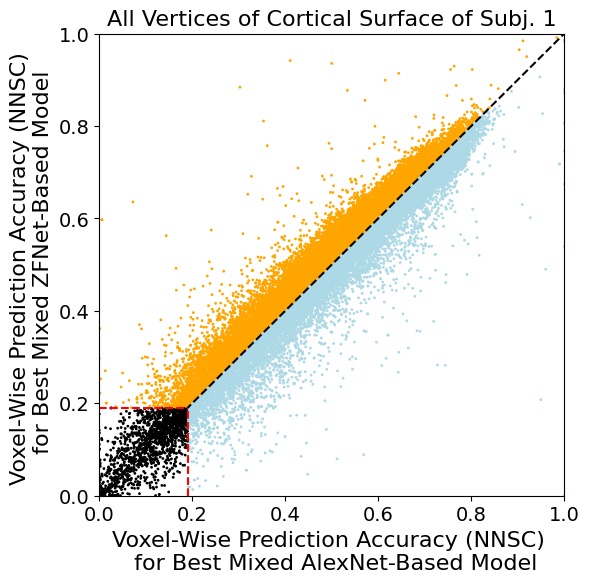

0.39


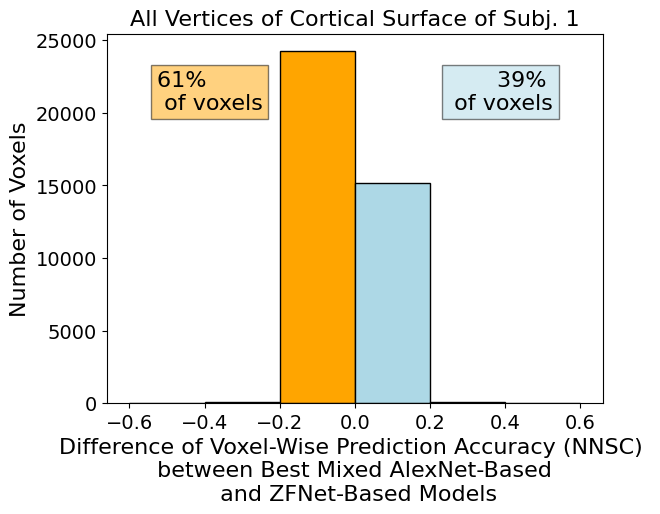

Confronto tra ResNet-50_config_0.61085.json e ResNet-50 (DINOv1)_config_0.62806.json


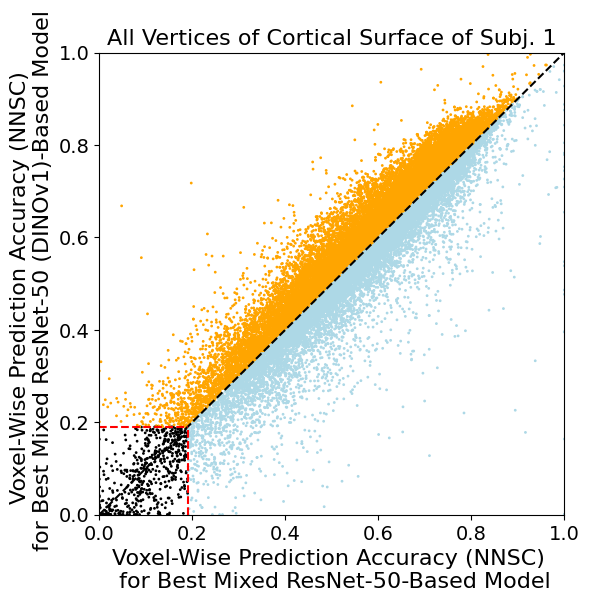

0.41


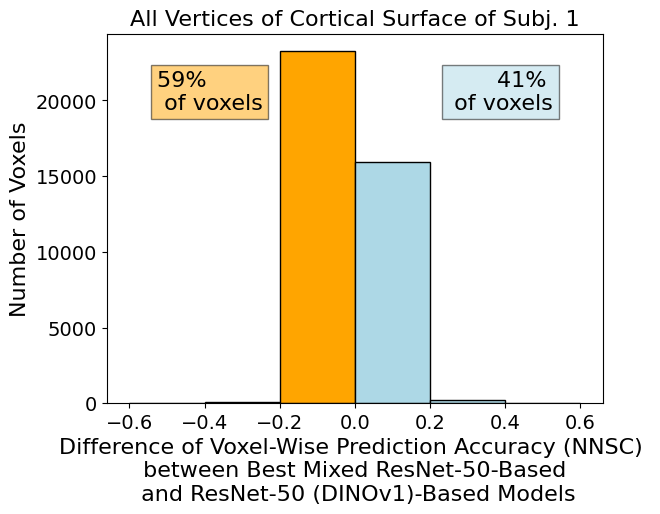

Confronto tra ResNet-50 (DINOv1)_config_0.62806.json e RetinaNet_config_0.58601.json


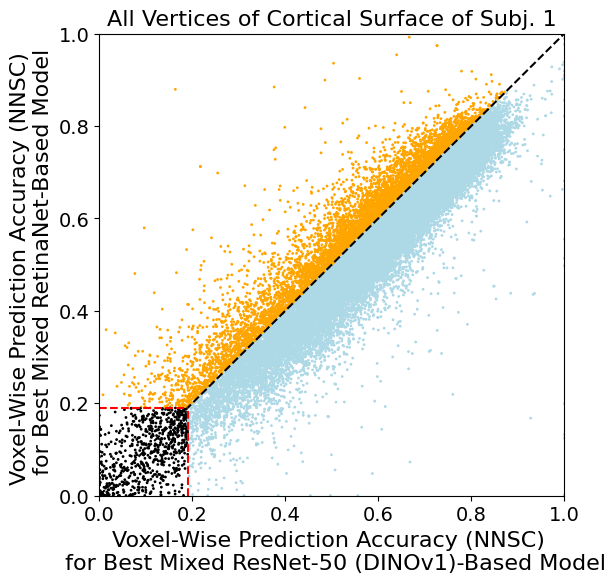

0.81


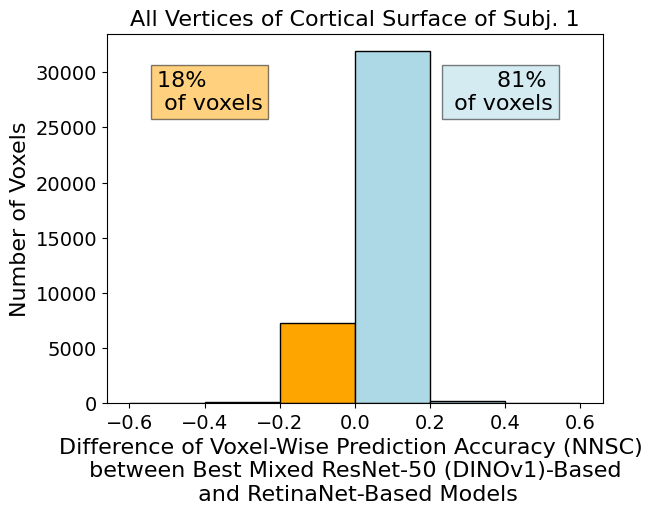

Confronto tra ResNet-50_config_0.61085.json e RetinaNet_config_0.58601.json


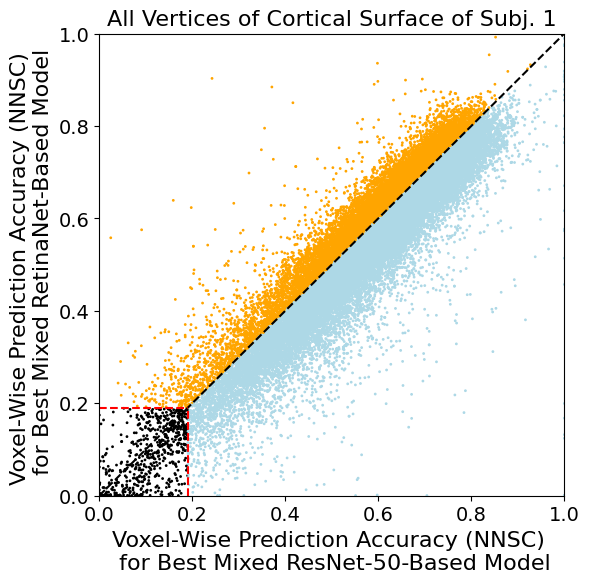

0.72


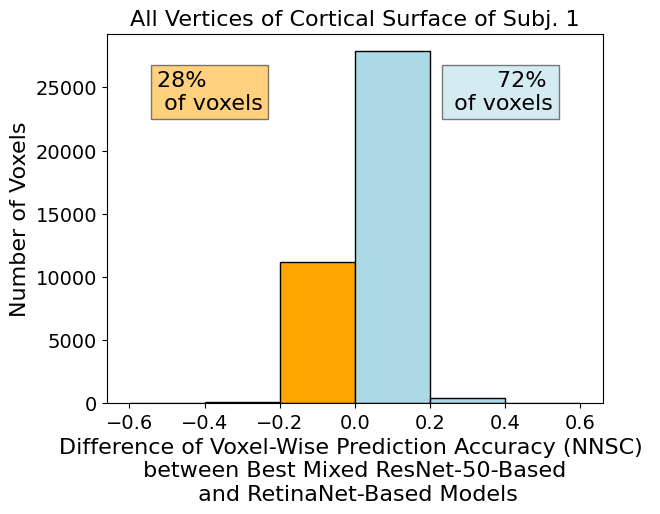

Confronto tra ViT-S 14 (DINOv2)_config_0.51236.json e ViT-B 14 (DINOv2)_config_0.51561.json


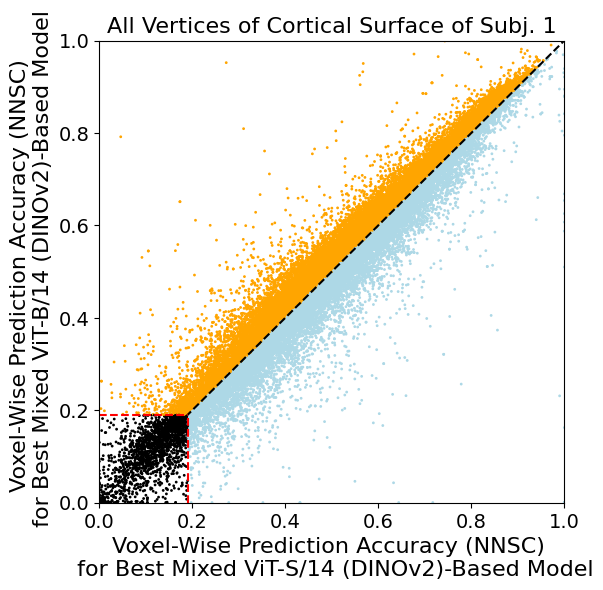

0.41


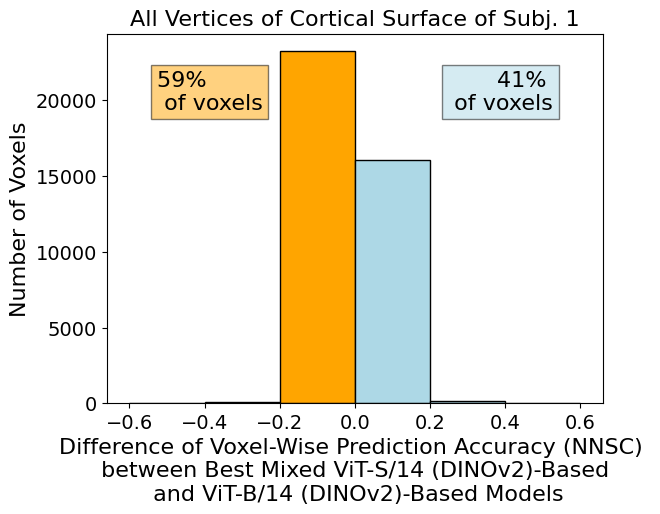

Confronto tra ViT-B 14 (DINOv2)_config_0.51561.json e ViT-L 14 (DINOv2)_config_0.53622.json


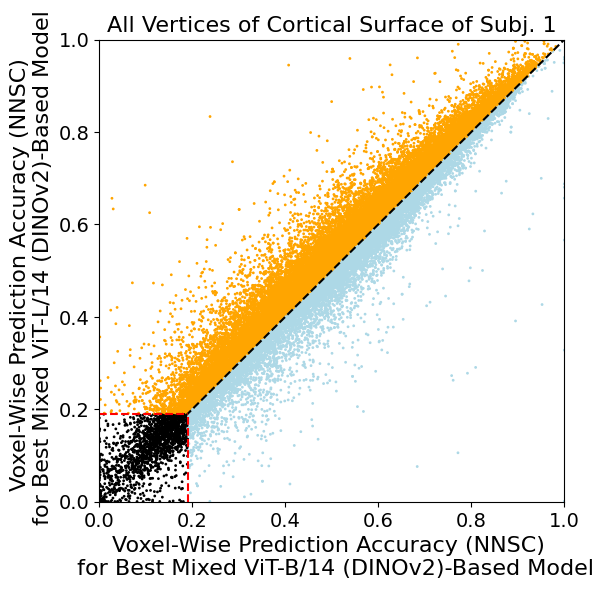

0.27


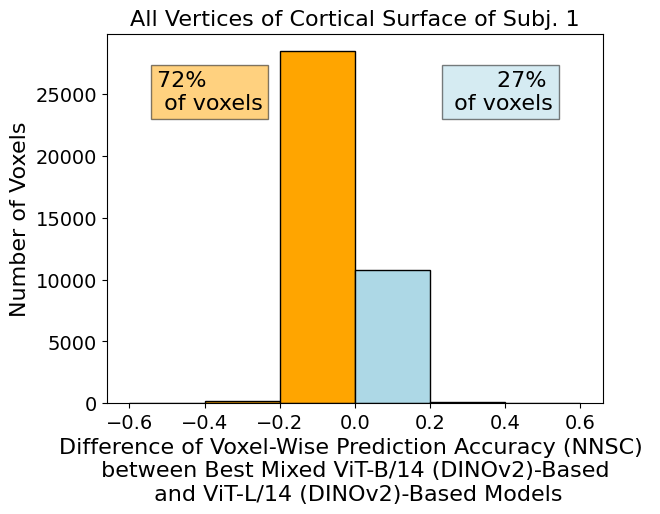

Confronto tra ViT-S 14 (DINOv2)_config_0.51236.json e ViT-L 14 (DINOv2)_config_0.53622.json


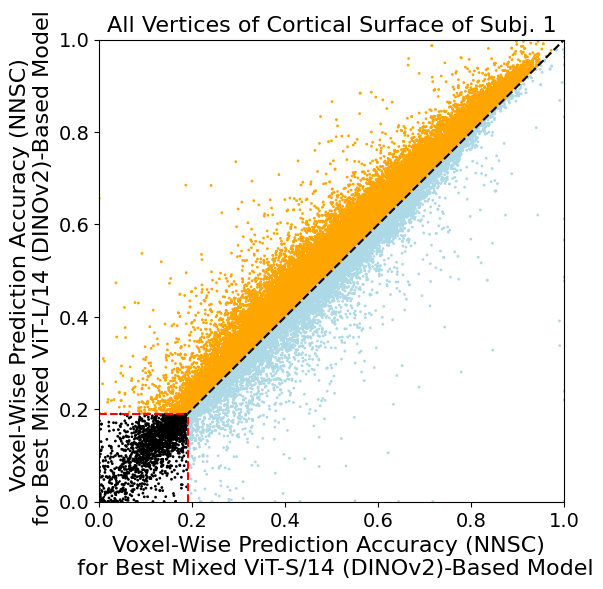

0.23


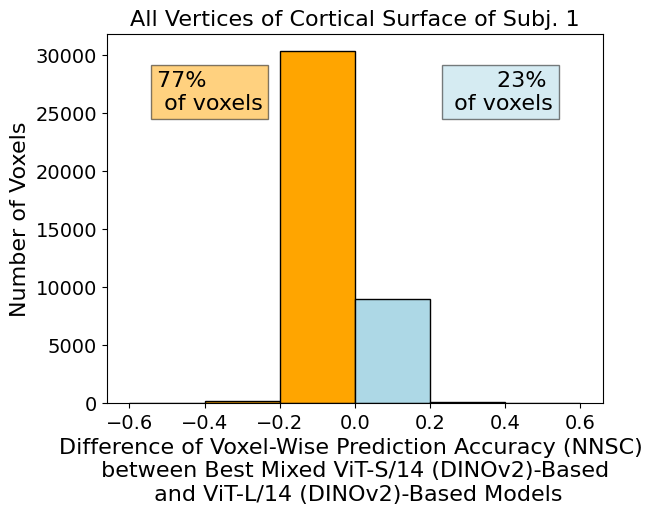

Confronto tra ViT-B 16-GPT2_config_0.60585.json e ViT-B 14 (DINOv2)_config_0.51561.json


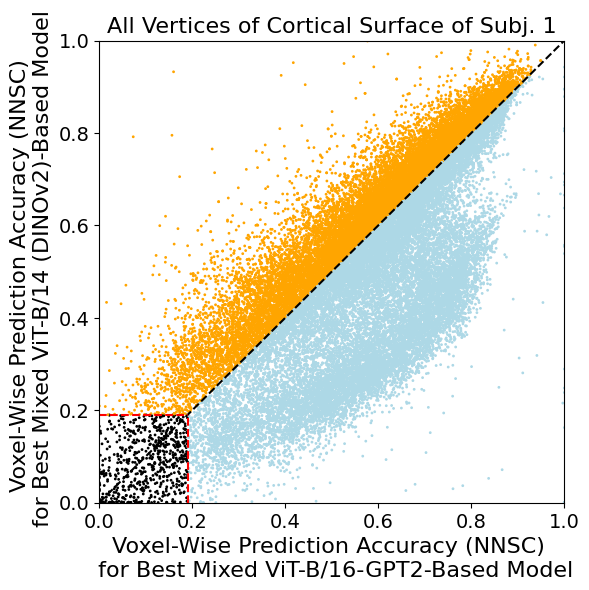

0.56


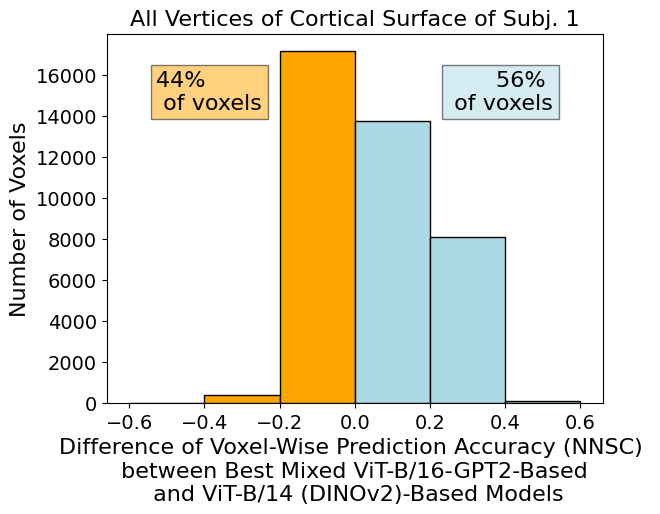

In [33]:
import matplotlib.pyplot as plt
import numpy as np

for grafico in modelli_da_confrontare:
    primo_modello = grafico[0]
    secondo_modello = grafico[1]
    print("Confronto tra", primo_modello, "e", secondo_modello)
    x = correlation_dict[primo_modello]
    y = correlation_dict[secondo_modello]
    nome_x = dizionario_nomi_conf[primo_modello]
    nome_y = dizionario_nomi_conf[secondo_modello]


    # Creo il grafico a dispersione con punti più piccoli
    plt.figure(figsize=(6, 6))
    plt.scatter(x, y, c=['black' if xi < 0.19 and yi < 0.19 else 'orange' if yi >= xi else 'lightblue' for xi, yi in zip(x, y)], s=1)

    # Aggiungo la linea tratteggiata nera
    plt.plot([0, 1], [0, 1], '--', color='black')
    plt.axvline(x=0.19, linestyle='--', color='red', ymax=0.19)
    plt.axhline(y=0.19, linestyle='--', color='red', xmax=0.19)

    # Aumenta la dimensione dei tick
    plt.tick_params(axis='both', which='major', labelsize=14)

    # Etichetto gli assi
    plt.ylabel(f'Voxel-Wise Prediction Accuracy (NNSC) \n for Best Mixed {nome_y}-Based Model', fontsize=16)
    plt.xlabel(f'Voxel-Wise Prediction Accuracy (NNSC) \n for Best Mixed {nome_x}-Based Model', fontsize=16)

    # Aggiungo il titolo
    plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)

    # Imposto l'intervallo degli assi x e y
    plt.xlim(0, 1)
    plt.ylim(0, 1)

    plt.savefig(os.path.join(global_config_dir, f'../../images/scatter_models/ch5_{nome_x.replace("/", " ")}_{nome_y.replace("/", " ")}_SCATTER.jpg'), bbox_inches='tight', dpi=300)
    plt.show()
    # Mostro il grafico
    
    # HISTOGRAMMA
    data = x - y

    # compute number of values of data > 0 on total number of values
    mag = np.sum(data > 0)/len(data)
    min = np.sum(data < 0)/len(data)
    # round to 2 decimal
    mag = round(mag, 2)
    min = round(min, 2)
    print(mag)

    # Crea i bin
    bins = np.arange(-0.6, 0.8, 0.2)

    # Crea l'istogramma
    counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

    # Colora i bin
    for i in range(len(patches)):
        if edges[i] < 0:
            patches[i].set_facecolor('orange')
        else:
            patches[i].set_facecolor('lightblue')
            
    plt.xlabel(f'Difference of Voxel-Wise Prediction Accuracy (NNSC) \n between Best Mixed {nome_x}-Based \n and {nome_y}-Based Models', fontsize=16)
    plt.ylabel('Number of Voxels', fontsize=16)

    plt.text(0.9, 0.9, f'{int(mag*100)}% \n of voxels', horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='lightblue', alpha=0.5), fontsize=16)
    plt.text(0.1, 0.9, f'{int(min*100)}% \n of voxels', horizontalalignment='left', verticalalignment='top', transform=plt.gca().transAxes, bbox=dict(facecolor='orange', alpha=0.5), fontsize=16)
    plt.title('All Vertices of Cortical Surface of Subj. 1', fontsize=16)
    plt.tick_params(axis='both', which='major', labelsize=14)
    
    plt.savefig(os.path.join(global_config_dir, f'../../images/scatter_models/ch5_{nome_x.replace("/", " ")}_{nome_y.replace("/", " ")}_HIST.jpg'), bbox_inches='tight', dpi=300)

    plt.show()


### Migliori Modelli Multi-Layer (creazione dataset, lineplot parametri, capitolo mixed)

In [159]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json


config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
data_dir = "D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj01"
import matplotlib.pyplot as plt

from matplotlib.patches import Patch
import pickle
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

#### CREAZIONE TABELLA ROI-WISE BEST MIXED MULTI-LAYER SINGLE-NETWORK MODELS

In [160]:
configurazioni = ["AlexNet_config_0.52025.json", 
                  "ZFNet_config_0.52918.json",
                  "VGG-16_config_0.50439.json",
                  "VGG-19_config_0.52366.json",
                  "VGG-19_BN_config_0.52099.json", 
                  "ResNet-50_config_0.61085.json", 
                  "ResNet-50 (DINOv1)_config_0.62806.json", 
                  "RetinaNet_config_0.58601.json",
#                  "EfficientNet-B2_config_0.58965.json", 
                  "ViT-S 14 (DINOv2)_config_0.51236.json", 
                  "ViT-B 14 (DINOv2)_config_0.51561.json",
                  "ViT-L 14 (DINOv2)_config_0.53622.json", 
                  "ViT-B 16-GPT2_config_0.60585.json"]

dizionario_nomi_conf = {'AlexNet_config_0.52025.json': 'AlexNet',
    'ZFNet_config_0.52918.json': 'ZFNet',
    'VGG-16_config_0.50439.json': 'VGG-16',
    'VGG-19_config_0.52366.json': 'VGG-19',
    'VGG-19_BN_config_0.52099.json': 'VGG-19_bn',
    'ResNet-50_config_0.61085.json': 'ResNet-50',
    'ResNet-50 (DINOv1)_config_0.62806.json': 'ResNet-50 (DINOv1)',
    'RetinaNet_config_0.58601.json': 'RetinaNet',
    'EfficientNet-B2_config_0.58965.json': 'EfficientNet',
    'ViT-S 14 (DINOv2)_config_0.51236.json': 'ViT-S/14 (DINOv2)',
    'ViT-B 14 (DINOv2)_config_0.51561.json': 'ViT-B/14 (DINOv2)',
    'ViT-L 14 (DINOv2)_config_0.53622.json': 'ViT-L/14 (DINOv2)',
    'ViT-B 16-GPT2_config_0.60585.json': 'ViT-B/16-GPT2'}

cartella_configurazione = f"./files/0_analysis/config_subj1/global/configurazioni_test"

config_dict = {}
correlation_dict = {}

for config in configurazioni:
    # open 
    file_config = os.path.join(cartella_configurazione, config)
    with open(file_config, 'r') as file:
        data = json.load(file)
    config_dict[config] = data
    
    # open correlation file
    cartella_submission = f"./files/0_analysis/submission_validation/{config}/val_correlations/subj01" 
    file_correlation_lh = os.path.join(cartella_submission, 'lh_corr_val.npy')
    file_correlation_rh = os.path.join(cartella_submission, 'rh_corr_val.npy')
    file_correlation_full = np.concatenate((np.load(file_correlation_lh), np.load(file_correlation_rh)), axis=0)
    correlation_dict[f"{config}_LH"] = np.load(file_correlation_lh)
    correlation_dict[f"{config}_RH"] = np.load(file_correlation_rh)

In [161]:
modelli_da_confrontare = [["AlexNet_config_0.52025.json", "ZFNet_config_0.52918.json"],
 ["ResNet-50_config_0.61085.json", "ResNet-50 (DINOv1)_config_0.62806.json"],
 ["ResNet-50 (DINOv1)_config_0.62806.json", "RetinaNet_config_0.58601.json"],
 ["ResNet-50_config_0.61085.json", "RetinaNet_config_0.58601.json"],
 ["ViT-S 14 (DINOv2)_config_0.51236.json", "ViT-B 14 (DINOv2)_config_0.51561.json"],
 ["ViT-B 14 (DINOv2)_config_0.51561.json", "ViT-L 14 (DINOv2)_config_0.53622.json"],
 ["ViT-S 14 (DINOv2)_config_0.51236.json", "ViT-L 14 (DINOv2)_config_0.53622.json"],
 ["ViT-B 16-GPT2_config_0.60585.json", "ViT-B 14 (DINOv2)_config_0.51561.json"]]

In [162]:
def classiy_correlation_by_roi(roi_path, lh_correlation, rh_correlation):
    # Load the ROI classes mapping dictionaries
    roi_mapping_files = ['mapping_prf-visualrois.npy', 'mapping_floc-bodies.npy',
                         'mapping_floc-faces.npy', 'mapping_floc-places.npy',
                         'mapping_floc-words.npy', 'mapping_streams.npy']
    roi_name_maps = []
    for r in roi_mapping_files:
        roi_name_maps.append(np.load(osp.join(roi_path, 'roi_masks', r),
                                     allow_pickle=True).item())

    # Load the ROI brain surface maps
    lh_challenge_roi_files = ['lh.prf-visualrois_challenge_space.npy',
                              'lh.floc-bodies_challenge_space.npy', 'lh.floc-faces_challenge_space.npy',
                              'lh.floc-places_challenge_space.npy', 'lh.floc-words_challenge_space.npy',
                              'lh.streams_challenge_space.npy']
    rh_challenge_roi_files = ['rh.prf-visualrois_challenge_space.npy',
                              'rh.floc-bodies_challenge_space.npy', 'rh.floc-faces_challenge_space.npy',
                              'rh.floc-places_challenge_space.npy', 'rh.floc-words_challenge_space.npy',
                              'rh.streams_challenge_space.npy']
    lh_challenge_rois = []
    rh_challenge_rois = []
    for l, r in zip(lh_challenge_roi_files, rh_challenge_roi_files):
        lh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', l)))
        rh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', r)))

    # Select the correlation results vertices of each ROI
    roi_names = []
    lh_roi_correlation = []
    rh_roi_correlation = []
    for r1 in range(len(lh_challenge_rois)):
        for r2 in roi_name_maps[r1].items():
            if r2[0] != 0:  # zeros indicate to vertices falling outside the ROI of interest
                roi_names.append(r2[1])
                lh_roi_idx = np.where(lh_challenge_rois[r1] == r2[0])[0]
                rh_roi_idx = np.where(rh_challenge_rois[r1] == r2[0])[0]
                lh_roi_correlation.append(lh_correlation[lh_roi_idx])
                rh_roi_correlation.append(rh_correlation[rh_roi_idx])
    
    # Add All Vertices Correlations
    
    roi_names.append('All vertices')
    lh_roi_correlation.append(lh_correlation)
    rh_roi_correlation.append(rh_correlation)
    
    # Add Unknown Functional/Stream/Both ROIs Correlations (using the generated files)
        
    lh_unknown_roi_files = ['lh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'lh.unknown_streams_ROI_masks_challenge_space.npy',
                            'lh.unknown_ROI_masks_challenge_space.npy']
    rh_unknown_roi_files = ['rh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'rh.unknown_streams_ROI_masks_challenge_space.npy',
                            'rh.unknown_ROI_masks_challenge_space.npy']
    
    roi_names.append('Unknown ROI')
    roi_names.append('Unknown Stream')
    roi_names.append('Unknown')
    
    for l, r in zip(lh_unknown_roi_files, rh_unknown_roi_files):
        lh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', l))
        lh_roi_correlation.append(lh_correlation[lh_challenge_unknown != 0])
        rh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', r))
        rh_roi_correlation.append(rh_correlation[rh_challenge_unknown != 0])

    
    return roi_names, lh_roi_correlation, rh_roi_correlation

In [163]:
def noise_norm_corr_ROI_df(roi_path, lh_correlation, rh_correlation, model_layer_id):
    """
        Create a dataframe with the correlation results classified by ROI
    """
    roi_names, lh_roi_correlation, rh_roi_correlation = classiy_correlation_by_roi(
        roi_path, lh_correlation, rh_correlation)

    # I concatenate lh and rh correlation for each ROI to choose a single layer for each ROI
    roi_correlation = []
    if len(lh_roi_correlation) == len(rh_roi_correlation):
        # Ciclo per concatenare gli elementi corrispondenti delle due liste
        for vettore1, vettore2 in zip(lh_roi_correlation, rh_roi_correlation):
            vettore_concatenato = np.concatenate((vettore1, vettore2), axis=0)
            roi_correlation.append(vettore_concatenato)
    else:
        print("Lists have different length")
    
    median_roi_correlation = [[
        np.nanmedian(corr) if len(corr) > 0 else np.nan for corr in roi_correlation]]

    # Save the median correlation for each ROI
    median_roi_correlation_df = pd.DataFrame(median_roi_correlation, columns=roi_names, index=[model_layer_id])
    
    
    # SE SI VUOLE SOLO MEDIANA TOGLIERE QUESTA PARTE SOTTO E FARE RETURN median_roi_correlation_df
    roi_names_iqr = [stringa + " IQR" for stringa in roi_names]
    iqr_roi_correlation = [
        [np.nanpercentile(corr, 75) - np.nanpercentile(corr, 25) if len(corr) > 0 else np.nan for corr in roi_correlation]]    
    iqr_roi_correlation_df = pd.DataFrame(iqr_roi_correlation, columns=roi_names_iqr, index=[model_layer_id])
    
    final_df = pd.concat([median_roi_correlation_df, iqr_roi_correlation_df], axis=1)

    return final_df

In [148]:
# print properties of config_dict and correlation_dict
print(config_dict.keys())
print(correlation_dict.keys())
print(config_dict['AlexNet_config_0.52025.json'])
#print(len(correlation_dict['AlexNet_config_0.52025.json']))

dict_keys(['AlexNet_config_0.52025.json', 'ZFNet_config_0.52918.json', 'VGG-16_config_0.50439.json', 'VGG-19_config_0.52366.json', 'VGG-19_BN_config_0.52099.json', 'ResNet-50_config_0.61085.json', 'ResNet-50 (DINOv1)_config_0.62806.json', 'RetinaNet_config_0.58601.json', 'ViT-S 14 (DINOv2)_config_0.51236.json', 'ViT-B 14 (DINOv2)_config_0.51561.json', 'ViT-L 14 (DINOv2)_config_0.53622.json', 'ViT-B 16-GPT2_config_0.60585.json'])
dict_keys(['AlexNet_config_0.52025.json_LH', 'AlexNet_config_0.52025.json_RH', 'ZFNet_config_0.52918.json_LH', 'ZFNet_config_0.52918.json_RH', 'VGG-16_config_0.50439.json_LH', 'VGG-16_config_0.50439.json_RH', 'VGG-19_config_0.52366.json_LH', 'VGG-19_config_0.52366.json_RH', 'VGG-19_BN_config_0.52099.json_LH', 'VGG-19_BN_config_0.52099.json_RH', 'ResNet-50_config_0.61085.json_LH', 'ResNet-50_config_0.61085.json_RH', 'ResNet-50 (DINOv1)_config_0.62806.json_LH', 'ResNet-50 (DINOv1)_config_0.62806.json_RH', 'RetinaNet_config_0.58601.json_LH', 'RetinaNet_config_0.58

In [ ]:
correlation_dict

In [164]:
nome_modello = "AlexNet_config_0.52025.json_LH"
noise_norm_corr_ROI_df(data_dir, correlation_dict[f'{modello}_LH'], correlation_dict[f'{modello}_RH'],nome_modello)

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral IQR,midlateral IQR,midparietal IQR,ventral IQR,lateral IQR,parietal IQR,All vertices IQR,Unknown ROI IQR,Unknown Stream IQR,Unknown IQR
AlexNet_config_0.52025.json_LH,0.593765,0.634074,0.642616,0.658318,0.624352,0.612094,0.584925,0.666958,0.610961,0.690232,...,0.200935,0.158941,0.182497,0.246074,0.220928,0.224182,0.24504,0.238063,0.293396,0.276224


In [166]:
for i, modello in enumerate(configurazioni):
    print(modello)
    nome_modello = dizionario_nomi_conf[modello]
    if i == 0:
        migliori_correlazioni = noise_norm_corr_ROI_df(data_dir, correlation_dict[f'{modello}_LH'], correlation_dict[f'{modello}_RH'],nome_modello)
    else:
        migliori_correlazioni = pd.concat([migliori_correlazioni, noise_norm_corr_ROI_df(data_dir, correlation_dict[f'{modello}_LH'], correlation_dict[f'{modello}_RH'],nome_modello)])

migliori_correlazioni    

AlexNet_config_0.52025.json
ZFNet_config_0.52918.json
VGG-16_config_0.50439.json
VGG-19_config_0.52366.json
VGG-19_BN_config_0.52099.json
ResNet-50_config_0.61085.json
ResNet-50 (DINOv1)_config_0.62806.json
RetinaNet_config_0.58601.json


ViT-S 14 (DINOv2)_config_0.51236.json
ViT-B 14 (DINOv2)_config_0.51561.json
ViT-L 14 (DINOv2)_config_0.53622.json
ViT-B 16-GPT2_config_0.60585.json


,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral IQR,midlateral IQR,midparietal IQR,ventral IQR,lateral IQR,parietal IQR,All vertices IQR,Unknown ROI IQR,Unknown Stream IQR,Unknown IQR
AlexNet,0.669543,0.689302,0.638066,0.656567,0.599700,0.564088,0.496604,0.473780,0.512192,0.563714,...,0.173084,0.144738,0.162166,0.213896,0.213169,0.184291,0.228356,0.199186,0.261910,0.250213
ZFNet,0.693950,0.690821,0.612839,0.623918,0.586826,0.554280,0.515888,0.491561,0.508948,0.577555,...,0.162413,0.136743,0.163954,0.228149,0.222051,0.203870,0.228245,0.221808,0.242316,0.233267
VGG-16,0.364064,0.377666,0.426831,0.464444,0.413484,0.462992,0.479454,0.577888,0.555531,0.657053,...,0.195464,0.185804,0.161286,0.223947,0.225727,0.198791,0.246206,0.224304,0.293554,0.259917
VGG-19,0.390177,0.429503,0.443805,0.499578,0.447639,0.493805,0.505952,0.574343,0.570456,0.661998,...,0.194012,0.166625,0.159378,0.231903,0.216994,0.206442,0.236918,0.226734,0.271909,0.244043
VGG-19_bn,0.453185,0.497108,0.526399,0.590966,0.519212,0.527887,0.501692,0.563234,0.534418,0.632715,...,0.179657,0.142065,0.168455,0.226280,0.236691,0.206078,0.231776,0.223954,0.280895,0.271191
ResNet-50,0.685824,0.671920,0.649701,0.671732,0.624607,0.605141,0.580233,0.625815,0.620533,0.691241,...,0.168424,0.129694,0.164350,0.217148,0.209538,0.194940,0.219636,0.211426,0.256300,0.244063
ResNet-50 (DINOv1),0.725525,0.721103,0.700899,0.690970,0.673662,0.629433,0.608214,0.620270,0.611855,0.696045,...,0.153417,0.132045,0.157122,0.223239,0.204579,0.190113,0.223308,0.212835,0.274328,0.286974
RetinaNet,0.659334,0.683501,0.692705,0.703860,0.666624,0.618781,0.570081,0.578265,0.575050,0.647772,...,0.189859,0.135230,0.159345,0.236376,0.216795,0.190290,0.233517,0.222820,0.262245,0.241906
ViT-S/14 (DINOv2),0.327932,0.320870,0.333266,0.351988,0.345904,0.363627,0.434501,0.664050,0.621831,0.751884,...,0.206619,0.281247,0.185823,0.240031,0.191189,0.227407,0.307562,0.258733,0.248996,0.317748
ViT-B/14 (DINOv2),0.337579,0.335400,0.338123,0.339890,0.343660,0.352654,0.448679,0.677035,0.636571,0.753371,...,0.213232,0.293617,0.197296,0.244287,0.192339,0.214063,0.310770,0.241867,0.256319,0.312028


In [156]:
# save 
migliori_correlazioni.to_csv(os.path.join(global_config_dir, "BEST_MULTYLAYER_SINGLENETWORK_scores_subj_layer_roi_IQR.csv"))

#### BEST MULTI-LAYER SINGLE-NETWORK MODELS (SUBJ-1) - FUNCTIONAL CLASS

In [157]:
migliori_correlazioni = pd.read_csv(os.path.join(global_config_dir, "BEST_MULTYLAYER_SINGLENETWORK_scores_subj_layer_roi_IQR.csv"), index_col=0)

In [167]:
migliori_correlazioni

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral IQR,midlateral IQR,midparietal IQR,ventral IQR,lateral IQR,parietal IQR,All vertices IQR,Unknown ROI IQR,Unknown Stream IQR,Unknown IQR
AlexNet,0.669543,0.689302,0.638066,0.656567,0.599700,0.564088,0.496604,0.473780,0.512192,0.563714,...,0.173084,0.144738,0.162166,0.213896,0.213169,0.184291,0.228356,0.199186,0.261910,0.250213
ZFNet,0.693950,0.690821,0.612839,0.623918,0.586826,0.554280,0.515888,0.491561,0.508948,0.577555,...,0.162413,0.136743,0.163954,0.228149,0.222051,0.203870,0.228245,0.221808,0.242316,0.233267
VGG-16,0.364064,0.377666,0.426831,0.464444,0.413484,0.462992,0.479454,0.577888,0.555531,0.657053,...,0.195464,0.185804,0.161286,0.223947,0.225727,0.198791,0.246206,0.224304,0.293554,0.259917
VGG-19,0.390177,0.429503,0.443805,0.499578,0.447639,0.493805,0.505952,0.574343,0.570456,0.661998,...,0.194012,0.166625,0.159378,0.231903,0.216994,0.206442,0.236918,0.226734,0.271909,0.244043
VGG-19_bn,0.453185,0.497108,0.526399,0.590966,0.519212,0.527887,0.501692,0.563234,0.534418,0.632715,...,0.179657,0.142065,0.168455,0.226280,0.236691,0.206078,0.231776,0.223954,0.280895,0.271191
ResNet-50,0.685824,0.671920,0.649701,0.671732,0.624607,0.605141,0.580233,0.625815,0.620533,0.691241,...,0.168424,0.129694,0.164350,0.217148,0.209538,0.194940,0.219636,0.211426,0.256300,0.244063
ResNet-50 (DINOv1),0.725525,0.721103,0.700899,0.690970,0.673662,0.629433,0.608214,0.620270,0.611855,0.696045,...,0.153417,0.132045,0.157122,0.223239,0.204579,0.190113,0.223308,0.212835,0.274328,0.286974
RetinaNet,0.659334,0.683501,0.692705,0.703860,0.666624,0.618781,0.570081,0.578265,0.575050,0.647772,...,0.189859,0.135230,0.159345,0.236376,0.216795,0.190290,0.233517,0.222820,0.262245,0.241906
ViT-S/14 (DINOv2),0.327932,0.320870,0.333266,0.351988,0.345904,0.363627,0.434501,0.664050,0.621831,0.751884,...,0.206619,0.281247,0.185823,0.240031,0.191189,0.227407,0.307562,0.258733,0.248996,0.317748
ViT-B/14 (DINOv2),0.337579,0.335400,0.338123,0.339890,0.343660,0.352654,0.448679,0.677035,0.636571,0.753371,...,0.213232,0.293617,0.197296,0.244287,0.192339,0.214063,0.310770,0.241867,0.256319,0.312028


In [172]:
regions_dict = {
    "V1": ["V1v", "V1d"],
    "V2": ["V2v", "V2d"],
    "V3": ["V3v", "V3d"],
    "V4": ["hV4"],
    "Early\n Vis.\nRegs": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    "Body\nSel.\nRegs": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    "Face\nSel.\nRegs": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    "Place\nSel.\nRegs": ["OPA", "PPA", "RSC"],
    "Word\nSel.\nRegs": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"], 
    "All Vertices": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4", "EBA", "FBA-1", "FBA-2", "mTL-bodies", "OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces", "OPA", "PPA", "RSC", "OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]
}


new_df = pd.DataFrame()

for region, cols in regions_dict.items():
    matching_cols = [col for col in migliori_correlazioni.columns if any(substring in col for substring in cols)]
    
    # Calcola la media e la deviazione standard di queste colonne
    new_df[region] = migliori_correlazioni[cols].mean(axis=1)
    # new_df[region + ' sd'] = migliori_correlazioni[cols].std(axis=1) / np.sqrt(len(cols)) # compute standard error of the mean (SEM) = df.std(axis=1) / np.sqtr(df.shape[1])
    print(len(matching_cols))
    # Calcola l'IQR
    cols_iqr = [s + ' IQR' for s in cols]
    new_df[region + " IQR"] = np.sqrt(migliori_correlazioni[cols_iqr].apply(lambda x: np.sum(np.square(x)), axis=1))


#for region, cols in regions_dict.items():
#    matching_cols = [col for col in migliori_correlazioni.columns if any(substring in col for substring in cols)]
#    
#    # Calcola la media e la deviazione standard di queste colonne
#    new_df[region] = migliori_correlazioni[matching_cols].mean(axis=1)
#    new_df[region + ' sd'] = migliori_correlazioni[matching_cols].std(axis=1) / np.sqrt(len(matching_cols)) * 6 # compute standard error of the mean (SEM) = df.std(axis=1) / np.sqtr(df.shape[1])
#    print(len(matching_cols))

migliori_correlazioni_functional = new_df
migliori_correlazioni_functional
# Supponiamo che 'df' sia il tuo DataFrame


4
4
4
2
14
8
10
6
10
48


,V1,V1 IQR,V2,V2 IQR,V3,V3 IQR,V4,V4 IQR,Early\n Vis.\nRegs,Early\n Vis.\nRegs IQR,Body\nSel.\nRegs,Body\nSel.\nRegs IQR,Face\nSel.\nRegs,Face\nSel.\nRegs IQR,Place\nSel.\nRegs,Place\nSel.\nRegs IQR,Word\nSel.\nRegs,Word\nSel.\nRegs IQR,All Vertices,All Vertices IQR
AlexNet,0.679422,0.306087,0.647316,0.273957,0.581894,0.172229,0.496604,0.145731,0.616267,0.468660,0.516562,0.455547,0.528565,0.372662,0.571502,0.228991,0.381429,0.366364,0.534474,0.867584
ZFNet,0.692386,0.263163,0.618378,0.241777,0.570553,0.165817,0.515888,0.143594,0.611217,0.419315,0.526021,0.483104,0.550040,0.417995,0.592527,0.246125,0.397106,0.370525,0.543636,0.884195
VGG-16,0.370865,0.344649,0.445637,0.344752,0.438238,0.294637,0.479454,0.179399,0.426991,0.597187,0.596824,0.489630,0.600453,0.464183,0.642401,0.221679,0.422778,0.373006,0.509954,1.000055
VGG-19,0.409840,0.341052,0.471692,0.330600,0.470722,0.270989,0.505952,0.158645,0.458637,0.569400,0.602266,0.480817,0.606244,0.465498,0.656203,0.217899,0.429178,0.375390,0.526066,0.980045
VGG-19_bn,0.475147,0.377063,0.558682,0.347796,0.523550,0.255692,0.501692,0.164078,0.516636,0.596187,0.576789,0.485309,0.581608,0.445624,0.612391,0.231985,0.408120,0.359110,0.528065,0.986063
ResNet-50,0.678872,0.301190,0.660717,0.272846,0.614874,0.178910,0.580233,0.153604,0.641308,0.469855,0.645863,0.464526,0.655082,0.411789,0.691525,0.220354,0.500923,0.369591,0.623513,0.889534
ResNet-50 (DINOv1),0.723314,0.279819,0.695934,0.273903,0.651548,0.183405,0.608214,0.128477,0.678544,0.451071,0.642723,0.473362,0.670039,0.418346,0.703664,0.217339,0.510722,0.369196,0.642099,0.886618
RetinaNet,0.671418,0.329002,0.698282,0.282695,0.642703,0.173682,0.570081,0.165822,0.656412,0.495803,0.600363,0.482300,0.608707,0.440411,0.636647,0.234239,0.438666,0.389855,0.594335,0.937684
ViT-S/14 (DINOv2),0.324401,0.316298,0.342627,0.290142,0.354766,0.271619,0.434501,0.193993,0.354013,0.543725,0.679255,0.452486,0.612347,0.433056,0.728901,0.230653,0.439902,0.377186,0.514960,0.939887
ViT-B/14 (DINOv2),0.336489,0.317209,0.339006,0.295991,0.348157,0.290148,0.448679,0.215738,0.356569,0.564767,0.688992,0.480892,0.621226,0.470395,0.733499,0.247525,0.438310,0.391653,0.519019,0.993051


In [173]:
# save
migliori_correlazioni_functional.to_csv(os.path.join(global_config_dir, "BEST_MULTYLAYER_SINGLENETWORK_scores_subj_roi_functional_IQR.csv"))

#### LINEPLOT PARAMETERS

In [82]:
# print migliori_correlazioni_functional index
print(migliori_correlazioni_functional.index)

Index(['AlexNet', 'ZFNet', 'VGG-16', 'VGG-19', 'VGG-19_bn', 'ResNet-50',
       'ResNet-50 (DINOv1)', 'RetinaNet', 'ViT-S/14 (DINOv2)',
       'ViT-B/14 (DINOv2)', 'ViT-L/14 (DINOv2)', 'ViT-B/16-GPT2'],
      dtype='object')


In [174]:
model_parameters_dict = {
    "AlexNet": 0.0611,
    "ZFNet": 0.062,
    "VGG-16": 0.138,
    "VGG-16_bn": 0.138,
    "VGG-19": 0.144,
    "VGG-19_bn": 0.144,
    "ResNet-50": 0.0256,
    "ResNet-50 (DINOv1)": 0.023,
    "RetinaNet": 0.0340,
    "EfficientNet-B2": 0.00911,
    "ViT-S/14 (DINOv2)": 0.021,
    "ViT-B/14 (DINOv2)": 0.086,
    "ViT-L/14 (DINOv2)": 0.30,
    "ViT-B/16-GPT2": 0.086,
}
parameters_df = pd.DataFrame(list(model_parameters_dict.items()), columns=['', 'Params'])
parameters_df.set_index('', inplace=True, drop=True)
parameters_df


,Params
,
AlexNet,0.06110
ZFNet,0.06200
VGG-16,0.13800
VGG-16_bn,0.13800
VGG-19,0.14400
VGG-19_bn,0.14400
ResNet-50,0.02560
ResNet-50 (DINOv1),0.02300
RetinaNet,0.03400


In [175]:
migliori_correlazioni_functional_params = migliori_correlazioni_functional.join(parameters_df)
migliori_correlazioni_functional_params.columns

Index(['V1', 'V1 IQR', 'V2', 'V2 IQR', 'V3', 'V3 IQR', 'V4', 'V4 IQR',
       'Early\n Vis.\nRegs', 'Early\n Vis.\nRegs IQR', 'Body\nSel.\nRegs',
       'Body\nSel.\nRegs IQR', 'Face\nSel.\nRegs', 'Face\nSel.\nRegs IQR',
       'Place\nSel.\nRegs', 'Place\nSel.\nRegs IQR', 'Word\nSel.\nRegs',
       'Word\nSel.\nRegs IQR', 'All Vertices', 'All Vertices IQR', 'Params'],
      dtype='object')

In [176]:
migliori_correlazioni_functional_params.columns

Index(['V1', 'V1 IQR', 'V2', 'V2 IQR', 'V3', 'V3 IQR', 'V4', 'V4 IQR',
       'Early\n Vis.\nRegs', 'Early\n Vis.\nRegs IQR', 'Body\nSel.\nRegs',
       'Body\nSel.\nRegs IQR', 'Face\nSel.\nRegs', 'Face\nSel.\nRegs IQR',
       'Place\nSel.\nRegs', 'Place\nSel.\nRegs IQR', 'Word\nSel.\nRegs',
       'Word\nSel.\nRegs IQR', 'All Vertices', 'All Vertices IQR', 'Params'],
      dtype='object')

In [178]:
migliori_correlazioni_functional_params

,V1,V1 IQR,V2,V2 IQR,V3,V3 IQR,V4,V4 IQR,Early\n Vis.\nRegs,Early\n Vis.\nRegs IQR,...,Body\nSel.\nRegs IQR,Face\nSel.\nRegs,Face\nSel.\nRegs IQR,Place\nSel.\nRegs,Place\nSel.\nRegs IQR,Word\nSel.\nRegs,Word\nSel.\nRegs IQR,All Vertices,All Vertices IQR,Params
AlexNet,0.679422,0.306087,0.647316,0.273957,0.581894,0.172229,0.496604,0.145731,0.616267,0.468660,...,0.455547,0.528565,0.372662,0.571502,0.228991,0.381429,0.366364,0.534474,0.867584,0.0611
ZFNet,0.692386,0.263163,0.618378,0.241777,0.570553,0.165817,0.515888,0.143594,0.611217,0.419315,...,0.483104,0.550040,0.417995,0.592527,0.246125,0.397106,0.370525,0.543636,0.884195,0.0620
VGG-16,0.370865,0.344649,0.445637,0.344752,0.438238,0.294637,0.479454,0.179399,0.426991,0.597187,...,0.489630,0.600453,0.464183,0.642401,0.221679,0.422778,0.373006,0.509954,1.000055,0.1380
VGG-19,0.409840,0.341052,0.471692,0.330600,0.470722,0.270989,0.505952,0.158645,0.458637,0.569400,...,0.480817,0.606244,0.465498,0.656203,0.217899,0.429178,0.375390,0.526066,0.980045,0.1440
VGG-19_bn,0.475147,0.377063,0.558682,0.347796,0.523550,0.255692,0.501692,0.164078,0.516636,0.596187,...,0.485309,0.581608,0.445624,0.612391,0.231985,0.408120,0.359110,0.528065,0.986063,0.1440
ResNet-50,0.678872,0.301190,0.660717,0.272846,0.614874,0.178910,0.580233,0.153604,0.641308,0.469855,...,0.464526,0.655082,0.411789,0.691525,0.220354,0.500923,0.369591,0.623513,0.889534,0.0256
ResNet-50 (DINOv1),0.723314,0.279819,0.695934,0.273903,0.651548,0.183405,0.608214,0.128477,0.678544,0.451071,...,0.473362,0.670039,0.418346,0.703664,0.217339,0.510722,0.369196,0.642099,0.886618,0.0230
RetinaNet,0.671418,0.329002,0.698282,0.282695,0.642703,0.173682,0.570081,0.165822,0.656412,0.495803,...,0.482300,0.608707,0.440411,0.636647,0.234239,0.438666,0.389855,0.594335,0.937684,0.0340
ViT-S/14 (DINOv2),0.324401,0.316298,0.342627,0.290142,0.354766,0.271619,0.434501,0.193993,0.354013,0.543725,...,0.452486,0.612347,0.433056,0.728901,0.230653,0.439902,0.377186,0.514960,0.939887,0.0210
ViT-B/14 (DINOv2),0.336489,0.317209,0.339006,0.295991,0.348157,0.290148,0.448679,0.215738,0.356569,0.564767,...,0.480892,0.621226,0.470395,0.733499,0.247525,0.438310,0.391653,0.519019,0.993051,0.0860


In [211]:
dict1 = {
    "AlexNet, ZFNet": ["AlexNet", "ZFNet"],
    "ResNet-50 (DINOv1), ResNet-50, RetinaNet": ["ResNet-50 (DINOv1)","ResNet-50", "RetinaNet"],
    "VGG-16, VGG-19": ["VGG-16", "VGG-19"],
    "ViT-S/14 (DINOv2), ViT-B/14 (DINOv2), ViT-B/16-GPT2, ViT-L/14 (DINOv2)": ["ViT-S/14 (DINOv2)", "ViT-B/14 (DINOv2)", "ViT-B/16-GPT2", "ViT-L/14 (DINOv2)"]
}

In [212]:
dict2 = {}

for key, values in dict1.items():
    dict2[key] = migliori_correlazioni_functional_params.loc[values]

In [192]:
dict2["AlexNet, ZFNet"]

,V1,V1 IQR,V2,V2 IQR,V3,V3 IQR,V4,V4 IQR,Early\n Vis.\nRegs,Early\n Vis.\nRegs IQR,...,Body\nSel.\nRegs IQR,Face\nSel.\nRegs,Face\nSel.\nRegs IQR,Place\nSel.\nRegs,Place\nSel.\nRegs IQR,Word\nSel.\nRegs,Word\nSel.\nRegs IQR,All Vertices,All Vertices IQR,Params
AlexNet,0.679422,0.306087,0.647316,0.273957,0.581894,0.172229,0.496604,0.145731,0.616267,0.468660,...,0.455547,0.528565,0.372662,0.571502,0.228991,0.381429,0.366364,0.534474,0.867584,0.0611
ZFNet,0.692386,0.263163,0.618378,0.241777,0.570553,0.165817,0.515888,0.143594,0.611217,0.419315,...,0.483104,0.550040,0.417995,0.592527,0.246125,0.397106,0.370525,0.543636,0.884195,0.0620


[0.28919453 0.29473175]


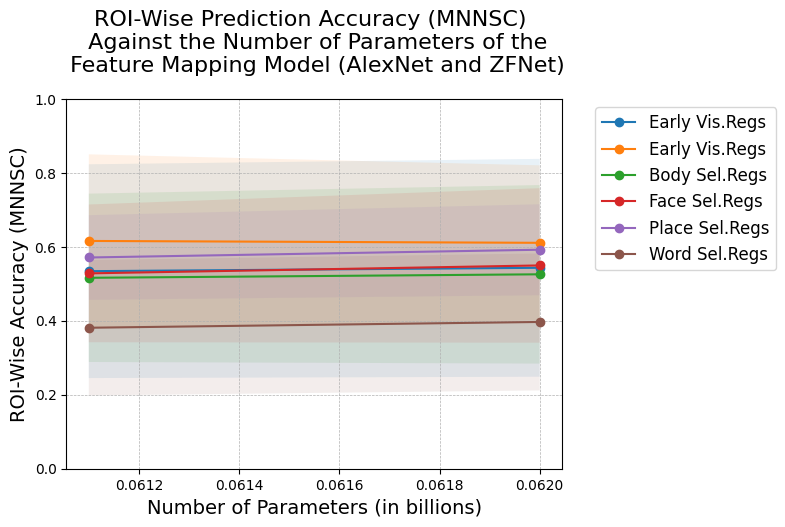

In [199]:
model = dict2["AlexNet, ZFNet"] #.sort_values(by='Params')
row_names = model.index
params = model['Params']

points = np.array(model["All Vertices"])
points1 = np.array(model["Early\n Vis.\nRegs"])
points2 = np.array(model["Body\nSel.\nRegs"])
points3 = np.array(model["Face\nSel.\nRegs"])
points4 = np.array(model["Place\nSel.\nRegs"])
points5 = np.array(model["Word\nSel.\nRegs"])

std_dev_points = np.array(model["All Vertices IQR"])/3
std_dev_points1 = np.array(model["Early\n Vis.\nRegs IQR"])/2
std_dev_points2 = np.array(model["Body\nSel.\nRegs IQR"])/2
std_dev_points3 = np.array(model["Face\nSel.\nRegs IQR"])/2
std_dev_points4 = np.array(model["Place\nSel.\nRegs IQR"])/2
std_dev_points5 = np.array(model["Word\nSel.\nRegs IQR"])/2

plt.plot(params, points, '-o', label="Early Vis.Regs")
plt.fill_between(params, points - std_dev_points, points + std_dev_points, alpha=0.1)
plt.plot(params, points1, '-o', label="Early Vis.Regs")
plt.fill_between(params, points1 - std_dev_points1, points1 + std_dev_points1, alpha=0.1)
plt.plot(params, points2, '-o', label="Body Sel.Regs")
plt.fill_between(params, points2 - std_dev_points2, points2 + std_dev_points2, alpha=0.1)
plt.plot(params, points3, '-o', label="Face Sel.Regs")
plt.fill_between(params, points3 - std_dev_points3, points3 + std_dev_points3, alpha=0.1)
plt.plot(params, points4, '-o', label="Place Sel.Regs")
plt.fill_between(params, points4 - std_dev_points4, points4 + std_dev_points4, alpha=0.1)
plt.plot(params, points5, '-o', label="Word Sel.Regs")
plt.fill_between(params, points5 - std_dev_points5, points5 + std_dev_points5, alpha=0.1)


plt.xlabel('Number of Parameters (in billions)', fontsize=14)
plt.ylabel('ROI-Wise Accuracy (MNNSC) and IQR', fontsize=14)
plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) \n Against the Number of Parameters of the\n Feature Mapping Model (AlexNet and ZFNet)', fontsize=16, y=1.05)    
plt.grid(linestyle='--', linewidth=0.5)
plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.show()



In [208]:
std_dev_points

array([0.14825574, 0.14776972, 0.15628065])

In [209]:
points

array([0.6235131 , 0.64209852, 0.59433509])

In [210]:
params

ResNet-50             0.0256
ResNet-50 (DINOv1)    0.0230
RetinaNet             0.0340
Name: Params, dtype: float64

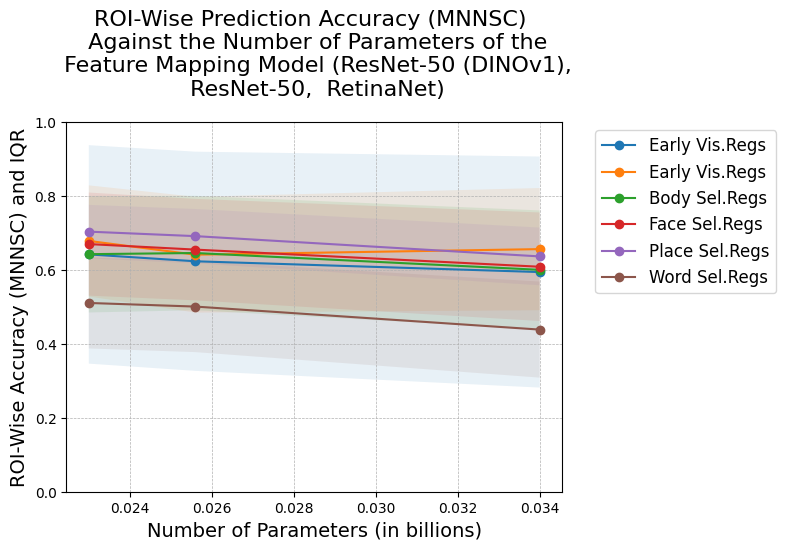

In [217]:

model = dict2["ResNet-50 (DINOv1), ResNet-50, RetinaNet"] #.sort_values(by='Params')
row_names = model.index
params = model['Params']

points = np.array(model["All Vertices"])
points1 = np.array(model["Early\n Vis.\nRegs"])
points2 = np.array(model["Body\nSel.\nRegs"])
points3 = np.array(model["Face\nSel.\nRegs"])
points4 = np.array(model["Place\nSel.\nRegs"])
points5 = np.array(model["Word\nSel.\nRegs"])

std_dev_points = np.array(model["All Vertices IQR"])/3
std_dev_points1 = np.array(model["Early\n Vis.\nRegs IQR"])/3
std_dev_points2 = np.array(model["Body\nSel.\nRegs IQR"])/3
std_dev_points3 = np.array(model["Face\nSel.\nRegs IQR"])/3
std_dev_points4 = np.array(model["Place\nSel.\nRegs IQR"])/3
std_dev_points5 = np.array(model["Word\nSel.\nRegs IQR"])/3

plt.plot(params, points, '-o', label="Early Vis.Regs")
plt.fill_between(params, points - std_dev_points, points + std_dev_points, alpha=0.1)
plt.plot(params, points1, '-o', label="Early Vis.Regs")
plt.fill_between(params, points1 - std_dev_points1, points1 + std_dev_points1, alpha=0.1)
plt.plot(params, points2, '-o', label="Body Sel.Regs")
plt.fill_between(params, points2 - std_dev_points2, points2 + std_dev_points2, alpha=0.1)
plt.plot(params, points3, '-o', label="Face Sel.Regs")
plt.fill_between(params, points3 - std_dev_points3, points3 + std_dev_points3, alpha=0.1)
plt.plot(params, points4, '-o', label="Place Sel.Regs")
plt.fill_between(params, points4 - std_dev_points4, points4 + std_dev_points4, alpha=0.1)
plt.plot(params, points5, '-o', label="Word Sel.Regs")
plt.fill_between(params, points5 - std_dev_points5, points5 + std_dev_points5, alpha=0.1)


plt.xlabel('Number of Parameters (in billions)', fontsize=14)
plt.ylabel('ROI-Wise Accuracy (MNNSC) and IQR', fontsize=14)
plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) \n Against the Number of Parameters of the\n Feature Mapping Model (ResNet-50 (DINOv1),\n ResNet-50,  RetinaNet)', fontsize=16, y=1.05)    
plt.grid(linestyle='--', linewidth=0.5)
plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.show()

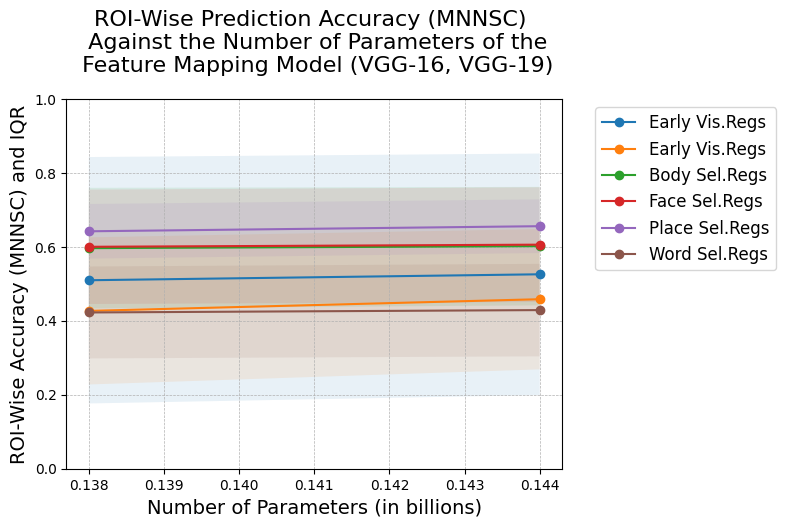

In [218]:
model = dict2['VGG-16, VGG-19'] #.sort_values(by='Params')
row_names = model.index
params = model['Params']
points = np.array(model["All Vertices"])
points1 = np.array(model["Early\n Vis.\nRegs"])
points2 = np.array(model["Body\nSel.\nRegs"])
points3 = np.array(model["Face\nSel.\nRegs"])
points4 = np.array(model["Place\nSel.\nRegs"])
points5 = np.array(model["Word\nSel.\nRegs"])

std_dev_points = np.array(model["All Vertices IQR"])/3
std_dev_points1 = np.array(model["Early\n Vis.\nRegs IQR"])/3
std_dev_points2 = np.array(model["Body\nSel.\nRegs IQR"])/3
std_dev_points3 = np.array(model["Face\nSel.\nRegs IQR"])/3
std_dev_points4 = np.array(model["Place\nSel.\nRegs IQR"])/3
std_dev_points5 = np.array(model["Word\nSel.\nRegs IQR"])/3

plt.plot(params, points, '-o', label="Early Vis.Regs")
plt.fill_between(params, points - std_dev_points, points + std_dev_points, alpha=0.1)
plt.plot(params, points1, '-o', label="Early Vis.Regs")
plt.fill_between(params, points1 - std_dev_points1, points1 + std_dev_points1, alpha=0.1)
plt.plot(params, points2, '-o', label="Body Sel.Regs")
plt.fill_between(params, points2 - std_dev_points2, points2 + std_dev_points2, alpha=0.1)
plt.plot(params, points3, '-o', label="Face Sel.Regs")
plt.fill_between(params, points3 - std_dev_points3, points3 + std_dev_points3, alpha=0.1)
plt.plot(params, points4, '-o', label="Place Sel.Regs")
plt.fill_between(params, points4 - std_dev_points4, points4 + std_dev_points4, alpha=0.1)
plt.plot(params, points5, '-o', label="Word Sel.Regs")
plt.fill_between(params, points5 - std_dev_points5, points5 + std_dev_points5, alpha=0.1)


plt.xlabel('Number of Parameters (in billions)', fontsize=14)
plt.ylabel('ROI-Wise Accuracy (MNNSC) and IQR', fontsize=14)
plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) \n Against the Number of Parameters of the\n Feature Mapping Model (VGG-16, VGG-19)', fontsize=16, y=1.05)    
plt.grid(linestyle='--', linewidth=0.5)
plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.show()

In [201]:
model = dict2['ViT-S/14 (DINOv2), ViT-B/14 (DINOv2), ViT-B/16-GPT2, ViT-L/14 (DINOv2)']
# drop third row
model = model.drop(model.index[2])

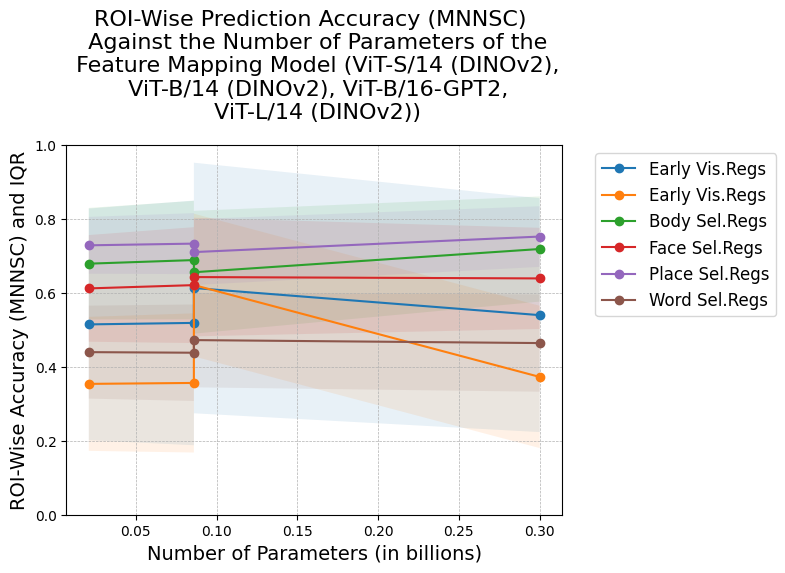

In [220]:

model = dict2['ViT-S/14 (DINOv2), ViT-B/14 (DINOv2), ViT-B/16-GPT2, ViT-L/14 (DINOv2)'] #.sort_values(by='Params')
row_names = model.index
params = model['Params']

points = np.array(model["All Vertices"])
points1 = np.array(model["Early\n Vis.\nRegs"])
points2 = np.array(model["Body\nSel.\nRegs"])
points3 = np.array(model["Face\nSel.\nRegs"])
points4 = np.array(model["Place\nSel.\nRegs"])
points5 = np.array(model["Word\nSel.\nRegs"])

std_dev_points = np.array(model["All Vertices IQR"])/3
std_dev_points1 = np.array(model["Early\n Vis.\nRegs IQR"])/3
std_dev_points2 = np.array(model["Body\nSel.\nRegs IQR"])/3
std_dev_points3 = np.array(model["Face\nSel.\nRegs IQR"])/3
std_dev_points4 = np.array(model["Place\nSel.\nRegs IQR"])/3
std_dev_points5 = np.array(model["Word\nSel.\nRegs IQR"])/3

plt.plot(params, points, '-o', label="Early Vis.Regs")
plt.fill_between(params, points - std_dev_points, points + std_dev_points, alpha=0.1)
plt.plot(params, points1, '-o', label="Early Vis.Regs")
plt.fill_between(params, points1 - std_dev_points1, points1 + std_dev_points1, alpha=0.1)
plt.plot(params, points2, '-o', label="Body Sel.Regs")
plt.fill_between(params, points2 - std_dev_points2, points2 + std_dev_points2, alpha=0.1)
plt.plot(params, points3, '-o', label="Face Sel.Regs")
plt.fill_between(params, points3 - std_dev_points3, points3 + std_dev_points3, alpha=0.1)
plt.plot(params, points4, '-o', label="Place Sel.Regs")
plt.fill_between(params, points4 - std_dev_points4, points4 + std_dev_points4, alpha=0.1)
plt.plot(params, points5, '-o', label="Word Sel.Regs")
plt.fill_between(params, points5 - std_dev_points5, points5 + std_dev_points5, alpha=0.1)


plt.xlabel('Number of Parameters (in billions)', fontsize=14)
plt.ylabel('ROI-Wise Accuracy (MNNSC) and IQR', fontsize=14)
plt.title(f'ROI-Wise Prediction Accuracy (MNNSC) \n Against the Number of Parameters of the\n Feature Mapping Model (ViT-S/14 (DINOv2),\n ViT-B/14 (DINOv2), ViT-B/16-GPT2,\n ViT-L/14 (DINOv2))', fontsize=16, y=1.05)    
plt.grid(linestyle='--', linewidth=0.5)
plt.ylim(0.0, 1.0)  # Imposta i limiti dell'asse y
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.show()

# MIXED MODELS

## Best Models Subj-Specific Tables

In [65]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json


config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
data_dir = "D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj01"
import matplotlib.pyplot as plt

from matplotlib.patches import Patch
import pickle
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

In [66]:
file_list = [
    '1_config_0.65567.json',
    '2_config_0.63208.json',
    '3_config_0.65337.json',
    '4_config_0.67977.json',
    '5_config_0.66019.json',
    '6_config_0.55831.json',
    '7_config_0.57815.json',
    '8_config_0.59902.json'
]

config_dir = osp.join(global_config_dir, 'miglior_modello')

In [67]:
pd.set_option('display.max_colwidth', None)

def group_words(dataset, regions_dict):
    for index, row in dataset.iterrows():
        rois = row['ROI'].split(',')
        new_rois = []
        for key, values in regions_dict.items():
            matching_rois = [roi for roi in rois if roi in values]
            if matching_rois:
                new_rois.append(f"({', '.join(matching_rois)}) {key}")
        dataset.at[index, 'ROI'] = ', '.join(new_rois)
    return dataset

for extraction_config_file in file_list:
    print("\n\n")
    print(extraction_config_file)
    print("\n\n")
    with open(os.path.join(config_dir, extraction_config_file), 'r') as json_file:
        final_extraction_config = json.load(json_file)

    nuovo_dizionario_stringhe = {}

    for chiave, valori in final_extraction_config.items():
        # check if the value is a list
        if not isinstance(valori, list):
            continue
        #print(chiave)
        nuovo_valore = '+'.join(str(v) if not isinstance(v, list) else '&'.join(v) for v in valori)
        nuovo_dizionario_stringhe[chiave] = nuovo_valore
        
    df_conf = pd.DataFrame(list(nuovo_dizionario_stringhe.items()), columns=['ROI', 'Conf. Name'])
    TM2_main_scores_FULL = pd.read_csv(os.path.join(global_config_dir, "TM2_main_scores_FULL.csv"), index_col=0)[["Conf. Name", "Conf. ID"]]
    df_conf = df_conf.merge(TM2_main_scores_FULL, on="Conf. Name")
    df_conf.drop("Conf. Name", axis=1, inplace=True)
    
    #regions_dict = {
    #"Early Vis. Regs": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    #"Body Sel. Regs": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    #"Face Sel. Regs": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    #"Place Sel. Regs": ["OPA", "PPA", "RSC"],
    #"Word Sel. Regs": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"],
    #"Anatomical Streams": ["early", "midventral", "midlateral", "midparietal", 
    #                       "ventral", "lateral", "parietal"],
    #"Unknown": ["Unknown ROI", "Unknown Stream", "Unknown"]}
    
    regions_dict = {
        "Early Vis.": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
        "Body Sel.": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
        "Face Sel.": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
        "Place Sel.": ["OPA", "PPA", "RSC"],
        "Word Sel.": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"],
        "Anatomical": ["early", "midventral", "midlateral", "midparietal", 
                               "ventral", "lateral", "parietal"],
        "Unknown": ["Unknown ROI", "Unknown Stream", "Unknown"]}
    # group by Functional Class and Conf. ID and sum the string values of ROI using a , as separator
    df_conf = df_conf.groupby(['Conf. ID']).agg(lambda x: ','.join(x)).reset_index()
    df_conf_grouped = group_words(df_conf, regions_dict)
    # print latex table
    print(df_conf_grouped.to_latex(index=False)) 
    




1_config_0.65567.json



\begin{tabular}{ll}
\toprule
                             Conf. ID &                                                                                                                                              ROI \\
\midrule
                ResNet-50 (DINOv1) 20 &                                                                                                                                 (V1v) Early Vis. \\
 ResNet-50 (DINOv1) 23+26+29+32+35+38 &                                                                                                                       (V2v, V3v, V3d) Early Vis. \\
       ResNet-50 (DINOv1) 41+44+47+50 &                                                         (hV4) Early Vis., (OFA) Face Sel., (OWFA) Word Sel., (midventral, midlateral) Anatomical \\
     ResNet-50 (DINOv1) 8+20+38+47+50 &                                                                                   (V1d) Early Vis., (early) Anatomical, (Unknown Stream) Unkno

C:\Users\giorg\AppData\Local\Temp\ipykernel_332060\2836114994.py:59: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_conf_grouped.to_latex(index=False))
C:\Users\giorg\AppData\Local\Temp\ipykernel_332060\2836114994.py:59: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_conf_grouped.to_latex(index=False))
C:\Users\giorg\AppData\Local\Temp\ipykernel_332060\2836114994.py:59: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base im

# GENERATE ROI-WISE CONFIGURATIONS FROM BEST ROI .CSV (SUBJ1)

In [47]:
import os 
import pandas as pd
config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Patch
import pickle
import json
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

In [48]:
# import TM3_roiwise_score.csv file
TM3_roiwise_score = pd.read_csv(os.path.join(global_config_dir, 'TM3_roiwise_score.csv'), index_col=0)

In [49]:
# trova valori unici colonna Pre-Trained Model Name
TM3_roiwise_score['Pre-Trained Model Name'].unique()

array(['AlexNet', 'ZFNet', 'VGG-16', 'VGG-19', 'VGG-19_BN', 'ResNet-50',
       'ResNet-50 (DINOv1)', 'RetinaNet', 'EfficientNet-B2',
       'ViT-S/14 (DINOv2)', 'ViT-B/14 (DINOv2)', 'ViT-L/14 (DINOv2)',
       'ViT-B/16-GPT2'], dtype=object)

In [55]:
# crea un dizionario che abbia come chiavi i valori unici della colonna Pre-Trained Model Name e come valori i dataframe corrispondenti
dizionario_dataset = {k: v for k, v in TM3_roiwise_score.groupby('Pre-Trained Model Name')}
dizionario_dataset.keys()
# remove 'Pre-Trained Model Name' and 'Conf. ID' columns from each dataframe
for key, value in dizionario_dataset.items():
    dizionario_dataset[key] = value.drop(columns=['Pre-Trained Model Name'])
    # remove 'Conf. ID' columns from each dataframe
    dizionario_dataset[key] = dizionario_dataset[key].drop(columns=['Conf. ID'])
    # Set Conf. Name as index
    dizionario_dataset[key].set_index('Conf. Name', inplace=True)
    # remove name of the index
    dizionario_dataset[key].index.name = None
    

In [56]:
dizionario_dataset["ViT-B/14 (DINOv2)"]

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown
DINOv2b+0&1&2&3&4&5+dinov2_transform_V2+ridge+2048+concat_pca,0.310990,0.314170,0.310847,0.317844,0.319863,0.329200,0.407589,0.523153,0.550248,0.620163,...,0.341705,0.349912,0.454965,0.552145,0.527646,0.471386,0.451188,0.462935,0.364913,0.581325
DINOv2b+0&1&2&3+dinov2_transform_V2+ridge+2048+concat_pca,0.337579,0.328542,0.319667,0.320651,0.316830,0.327616,0.360045,0.396494,0.428113,0.474682,...,0.305202,0.296742,0.373682,0.415392,0.399904,0.357100,0.370358,0.348210,0.347788,0.438878
DINOv2b+0&1&2+dinov2_transform_V2+ridge+2048+concat_pca,0.279671,0.270697,0.230014,0.239292,0.229375,0.253590,0.271541,0.311632,0.335811,0.378094,...,0.227838,0.230656,0.292356,0.339640,0.317239,0.291550,0.297360,0.284099,0.281324,0.378379
DINOv2b+0+dinov2_transform_V2+ridge+9999999+concat_pca,0.266179,0.248682,0.189783,0.190938,0.181309,0.199831,0.199758,0.174350,0.206620,0.217194,...,0.173177,0.164255,0.183702,0.224348,0.179182,0.182834,0.202188,0.186594,0.233977,0.286449
DINOv2b+1+dinov2_transform_V2+ridge+9999999+concat_pca,0.259703,0.243082,0.196797,0.203770,0.195731,0.215527,0.230465,0.260663,0.295587,0.316141,...,0.191997,0.190014,0.252539,0.301571,0.266310,0.258290,0.260382,0.253912,0.251108,0.347675
DINOv2b+2&3&4+dinov2_transform_V2+ridge+2048+concat_pca,0.336851,0.335400,0.338122,0.335898,0.343660,0.344426,0.403780,0.463316,0.490012,0.551785,...,0.343809,0.335386,0.414874,0.481501,0.465414,0.406720,0.416441,0.403239,0.369033,0.523916
DINOv2b+2+dinov2_transform_V2+ridge+9999999+concat_pca,0.281934,0.278702,0.238858,0.255027,0.234175,0.263116,0.281577,0.319737,0.348014,0.392858,...,0.234326,0.235626,0.312692,0.355023,0.323872,0.303472,0.308540,0.294826,0.291098,0.379535
DINOv2b+3&4&5+dinov2_transform_V2+ridge+2048+concat_pca,0.328050,0.332341,0.333553,0.339890,0.334638,0.345897,0.425184,0.518308,0.528455,0.614661,...,0.354300,0.350077,0.458438,0.536250,0.519700,0.451958,0.448402,0.446308,0.363271,0.549801
DINOv2b+3+dinov2_transform_V2+ridge+9999999+concat_pca,0.335772,0.330272,0.331103,0.334520,0.330535,0.336418,0.380124,0.399538,0.434216,0.475624,...,0.321055,0.304157,0.384439,0.426023,0.400958,0.362290,0.378339,0.356549,0.350827,0.450953
DINOv2b+4&5&6+dinov2_transform_V2+ridge+2048+concat_pca,0.286363,0.296273,0.297710,0.316552,0.295944,0.335947,0.427340,0.585338,0.592501,0.680882,...,0.341652,0.372312,0.484803,0.594969,0.590449,0.504803,0.482185,0.500144,0.353465,0.624573


In [58]:
# save dizionario_dataset
with open(os.path.join(global_config_dir, 'DIZIONARIO-MODELLO-REAL-ROIWISE_SCORE_allROI_allLayers.pkl'), 'wb') as file:
    pickle.dump(dizionario_dataset, file)

In [49]:
parent_config_dir1 = f'./files/0_analysis/{extraction_config_folder}/global/configurazioni_test'
save = True

In [60]:
import json
def find_best_performing_layer(median_roi_correlation_df, parent_config_dir, save, model):
    """
        Find the best performing layer for each ROI and save it in a dictionary
    """	
    # find the index, for each roi, associated with the maximum value (model+layer)
    max_indices = median_roi_correlation_df.idxmax()
    final_dict = {col: idx.split('+') if not pd.isna(idx) else np.NaN for col, idx in max_indices.items()}
    # If a layer is a concatenation of more than one layer, split it into a list instead of a string
    for chiave, valore in final_dict.items():
        # Se il valore non è una lista, continuiamo senza apportare modifiche
        if not isinstance(valore, list):
            continue
        # Controlliamo se il secondo elemento contiene "&" (quindi è sono più di un layer concatenati)
        if valore is not np.NaN:
            print(valore)
            if '&' in str(valore[1]):
                # Se contiene "&", splittiamolo in una lista di stringhe
                final_dict[chiave][1] = str(valore[1]).split('&')
    if save:
        average_value = median_roi_correlation_df.max().mean()
        model = model.replace("/", " ")
        filename = f"{model}" + "_config_" + str(average_value.round(5)) + ".json"
        full_path = os.path.join(parent_config_dir, filename)

        # Salvataggio come JSON
        with open(full_path, 'w') as file:
            json.dump(final_dict, file, indent=4)
     
    #print(median_roi_correlation_df)
    #print('\n')
    #print(json.dumps(final_dict, indent=4))
    return final_dict

In [276]:
for key, value in dizionario_dataset.items():
    find_best_performing_layer(value, parent_config_dir1, save, key)

['alexnet', 'features.4', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.4', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.9', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.10&features.11&features.12', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.12', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.12', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.9', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.10&features.11&features.12', 'imagenet_V2_tra

In [230]:
dizionario_dataset["ResNet-50"]


,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
ResNet-50 2 (v1),0.641774,0.754366,0.442940,0.697559,0.553282,0.649308,0.609834,0.684885,0.666555,0.636372,...,0.039243,0.152840,0.197387,0.050707,-0.024603,0.133409,0.086023,0.094819,0.103364,0.167854
ResNet-50 5 (v1),0.503107,0.448795,0.475731,0.589328,0.534307,0.520469,0.555331,0.491707,0.639449,0.415331,...,0.330963,0.176764,0.250452,0.012392,0.050017,0.095399,0.193759,0.170791,0.174989,0.237649
ResNet-50 8 (v1),0.489490,0.341989,0.447866,0.452015,0.497867,0.566721,0.432096,0.489806,0.529438,0.452097,...,-0.011842,0.175865,0.148764,0.254270,0.193477,0.024198,0.231920,0.020584,0.152682,0.210649
ResNet-50 14 (v1),0.642883,0.697153,0.628159,0.531959,0.629791,0.611134,0.602670,0.731376,0.615015,0.859330,...,0.228683,0.097519,0.183087,0.287146,0.149978,0.257290,0.191689,0.189790,0.235217,0.188492
ResNet-50 17 (v1),0.469318,0.419011,0.509034,0.450221,0.455623,0.483496,0.434081,0.613641,0.471469,0.475527,...,0.388490,0.242220,0.178203,0.265886,0.218381,0.159890,0.116976,0.136964,0.203630,0.231246
ResNet-50 20 (v1),0.521008,0.525752,0.582446,0.596253,0.587856,0.390348,0.504999,0.610637,0.550284,0.552590,...,0.162213,0.162455,0.091940,0.250155,0.132996,0.201904,0.196752,0.275879,0.156609,0.023011
ResNet-50 23 (v1),0.392848,0.454640,0.420119,0.459409,0.606723,0.499060,0.548806,0.577164,0.563219,0.498888,...,0.379515,0.229618,0.209252,0.230392,0.365392,0.146058,0.294438,0.249452,0.348478,0.274244
ResNet-50 26 (v1),0.727758,0.776323,0.782181,0.767242,0.738776,0.726425,0.709510,0.589232,0.720483,0.598113,...,0.291643,0.334389,0.312496,0.397628,0.366467,0.322336,0.271748,0.406252,0.347941,0.212665
ResNet-50 29 (v1),0.610169,0.562219,0.542382,0.462787,0.469437,0.581692,0.553343,0.458879,0.520961,0.600318,...,0.202554,0.246941,0.124636,0.257487,0.212983,0.408698,0.285227,0.273398,0.233214,0.087976


In [229]:
dizionario_dataset["AlexNet"]

,V1v-1,V1v-2,V1v-3,V1v-4,V1v-5,V1v-6,V1v-7,V1v-8,V1v-9,V1v-10,...,mfs-words-400,mfs-words-401,mfs-words-402,mfs-words-403,mfs-words-404,mfs-words-405,mfs-words-406,mfs-words-407,mfs-words-408,mfs-words-409
Conf. ID,,,,,,,,,,,,,,,,,,,,,
AlexNet 1 (v1),0.462550,0.612202,0.516913,0.532288,0.540962,0.556870,0.594854,0.443730,0.640432,0.485890,...,0.178569,0.063786,0.119019,0.156697,0.201811,0.162109,0.191776,0.249505,0.051677,0.111267
AlexNet 4 (v1),0.781374,0.675548,0.514289,0.651993,0.655480,0.696218,0.660601,0.664516,0.774520,0.721727,...,0.198190,0.212179,0.150815,0.210662,0.206514,0.079668,0.198824,0.227099,0.190159,0.391902
AlexNet 7 (v1),0.571752,0.518388,0.400100,0.695219,0.514123,0.577335,0.615762,0.803270,0.613717,0.643703,...,0.308948,0.152619,0.347872,0.372118,0.154455,0.362957,0.199551,0.254439,0.354488,0.291084
AlexNet 9 (v1),0.559715,0.511280,0.443197,0.642481,0.592738,0.539342,0.531965,0.487656,0.575334,0.528094,...,0.333827,0.425635,0.260605,0.526685,0.203539,0.173030,0.230963,0.315921,0.261816,0.240248
AlexNet 11 (v1),0.447367,0.438533,0.324548,0.406928,0.372361,0.499823,0.379766,0.341692,0.361540,0.354501,...,0.282457,0.378962,0.335539,0.194408,0.391270,0.305692,0.346781,0.321261,0.266254,0.263365
AlexNet 12 (v1),0.401404,0.301933,0.257903,0.466106,0.436308,0.292366,0.338011,0.482588,0.344546,0.447995,...,0.339360,0.330086,0.279597,0.428192,0.382695,0.387683,0.427316,0.318018,0.298851,0.406336


## Dizionari best config single layer

In [57]:
dizionario_dataset = {k: v for k, v in TM3_roiwise_score.groupby('Pre-Trained Model Name')}
dizionario_dataset.keys()
# remove 'Pre-Trained Model Name' and 'Conf. ID' columns from each dataframe
for key, value in dizionario_dataset.items():
    dizionario_dataset[key] = value.drop(columns=['Pre-Trained Model Name'])
    # remove 'Conf. ID' columns from each dataframe
    dizionario_dataset[key] = dizionario_dataset[key].drop(columns=['Conf. ID'])
    # Set Conf. Name as index
    dizionario_dataset[key].set_index('Conf. Name', inplace=True)
    # remove name of the index
    dizionario_dataset[key].index.name = None
    
nuovo_dizionario = {}
for chiave, dataset in dizionario_dataset.items():
    nuovo_dizionario[chiave] = dataset[~dataset.index.str.contains('&')]

In [63]:
parent_config_dir1 = f'./files/0_analysis/{extraction_config_folder}/global/configurazioni_test'
save = True

In [58]:
nuovo_dizionario.keys()

dict_keys(['AlexNet', 'EfficientNet-B2', 'ResNet-50', 'ResNet-50 (DINOv1)', 'RetinaNet', 'VGG-16', 'VGG-19', 'VGG-19_BN', 'ViT-B/14 (DINOv2)', 'ViT-B/16-GPT2', 'ViT-L/14 (DINOv2)', 'ViT-S/14 (DINOv2)', 'ZFNet'])

In [59]:
nuovo_dizionario["AlexNet"]

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,midventral,midlateral,midparietal,ventral,lateral,parietal,All vertices,Unknown ROI,Unknown Stream,Unknown
alexnet+features.1+imagenet_V2_transform+ridge+2048+concat_pca,0.538577,0.553363,0.428184,0.444634,0.386019,0.366665,0.316478,0.149680,0.190226,0.190429,...,0.313933,0.248831,0.247567,0.204338,0.152544,0.174628,0.238305,0.187443,0.401713,0.247728
alexnet+features.1+imagenet_transform_alt+linear+2048+concat_pca,0.563160,0.566226,0.394381,0.395572,0.327206,0.311764,0.236219,0.103001,0.142359,0.154012,...,0.241028,0.168885,0.162728,0.128678,0.102810,0.097513,0.160448,0.105408,0.327358,0.152064
alexnet+features.1+imagenet_transform_alt+ridge+2048+concat_pca,0.520751,0.542786,0.409111,0.434152,0.366544,0.352328,0.307270,0.145468,0.187698,0.190582,...,0.302714,0.240130,0.242257,0.200989,0.148854,0.171967,0.231697,0.183279,0.384972,0.238772
alexnet+features.4+imagenet_V2_transform+ridge+2048+concat_pca,0.669543,0.689302,0.595133,0.597439,0.551912,0.512983,0.423227,0.292030,0.313262,0.349793,...,0.440444,0.379252,0.370234,0.331580,0.292153,0.290925,0.366939,0.297883,0.537331,0.380067
alexnet+features.4+imagenet_transform_alt+linear+2048+concat_pca,0.667685,0.682451,0.571627,0.568817,0.514976,0.492871,0.347527,0.197041,0.210674,0.238895,...,0.372671,0.305566,0.271351,0.221384,0.194936,0.176903,0.264025,0.189563,0.477353,0.251589
alexnet+features.4+imagenet_transform_alt+ridge+2048+concat_pca,0.587628,0.608515,0.549597,0.572252,0.520876,0.492393,0.421140,0.245318,0.275698,0.293705,...,0.429210,0.365527,0.350302,0.299830,0.247646,0.266134,0.335190,0.276443,0.510322,0.372414
alexnet+features.7+imagenet_V2_transform+ridge+2048+concat_pca,0.613060,0.657029,0.602623,0.625962,0.574400,0.549523,0.493110,0.398226,0.422337,0.471173,...,0.495335,0.447460,0.443707,0.423251,0.396638,0.362679,0.449733,0.380210,0.571525,0.477474
alexnet+features.7+imagenet_transform_alt+linear+2048+concat_pca,0.633204,0.653106,0.592122,0.602966,0.541801,0.505993,0.396666,0.285450,0.274874,0.330045,...,0.409903,0.346328,0.328086,0.271049,0.275007,0.229856,0.321485,0.237625,0.486694,0.311045
alexnet+features.7+imagenet_transform_alt+ridge+2048+concat_pca,0.660368,0.682803,0.638066,0.656567,0.599700,0.564088,0.474506,0.349306,0.366709,0.415416,...,0.484978,0.430029,0.409291,0.360843,0.344524,0.313627,0.407798,0.325846,0.568230,0.415562
alexnet+features.9+imagenet_V2_transform+ridge+2048+concat_pca,0.524504,0.572533,0.550819,0.592322,0.532659,0.522999,0.496604,0.442781,0.477512,0.522318,...,0.483184,0.463211,0.483347,0.476536,0.441998,0.410948,0.474379,0.425700,0.536130,0.517735


In [61]:
import json
def find_best_performing_layer(median_roi_correlation_df, parent_config_dir, save, model):
    """
        Find the best performing layer for each ROI and save it in a dictionary
    """	
    # find the index, for each roi, associated with the maximum value (model+layer)
    max_indices = median_roi_correlation_df.idxmax()
    final_dict = {col: idx.split('+') if not pd.isna(idx) else np.NaN for col, idx in max_indices.items()}
    # If a layer is a concatenation of more than one layer, split it into a list instead of a string
    for chiave, valore in final_dict.items():
        # Se il valore non è una lista, continuiamo senza apportare modifiche
        if not isinstance(valore, list):
            continue
        # Controlliamo se il secondo elemento contiene "&" (quindi è sono più di un layer concatenati)
        if valore is not np.NaN:
            print(valore)
            if '&' in str(valore[1]):
                # Se contiene "&", splittiamolo in una lista di stringhe
                final_dict[chiave][1] = str(valore[1]).split('&')
    if save:
        average_value = median_roi_correlation_df.max().mean()
        model = model.replace("/", " ")
        filename = f"{model}" + "_config_BESTSINGLELAYER_" + str(average_value.round(5)) + ".json"
        full_path = os.path.join(parent_config_dir, filename)

        # Salvataggio come JSON
        with open(full_path, 'w') as file:
            json.dump(final_dict, file, indent=4)
     
    #print(median_roi_correlation_df)
    #print('\n')
    #print(json.dumps(final_dict, indent=4))
    return final_dict

In [64]:
for key, value in dizionario_dataset.items():
    find_best_performing_layer(value, parent_config_dir1, save, key)

['alexnet', 'features.4', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.4', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.7', 'imagenet_transform_alt', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.9', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.10&features.11&features.12', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.12', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.12', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.9', 'imagenet_V2_transform', 'ridge', '2048', 'concat_pca']
['alexnet', 'features.10&features.11&features.12', 'imagenet_V2_tra

# Mixed Models

## Tabella Risultati Validation

In [19]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json


config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
#data_dir = "D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj01"
import matplotlib.pyplot as plt

from matplotlib.patches import Patch
import pickle
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

In [20]:
correlation_dict = {}

for subj in range(1,9):
    
    # open correlation file
    cartella_submission = f".\\files\\0_analysis\config_subj1\global\miglior_modello\ValResults\\val_correlations\\subj0{subj}" 
    file_correlation_lh = os.path.join(cartella_submission, 'lh_corr_val.npy')
    file_correlation_rh = os.path.join(cartella_submission, 'rh_corr_val.npy')
    file_correlation_full = np.concatenate((np.load(file_correlation_lh), np.load(file_correlation_rh)), axis=0)
    correlation_dict[f"subj0{subj}_LH"] = np.load(file_correlation_lh)
    correlation_dict[f"subj0{subj}_RH"] = np.load(file_correlation_rh)
    
# Inizializza le liste per contenere gli array LH e RH
lista_LH = []
lista_RH = []

# Itera sulle chiavi e i valori del dizionario
for chiave, valore in correlation_dict.items():
    if "_LH" in chiave:
        lista_LH.append(valore)
    elif "_RH" in chiave:
        lista_RH.append(valore)

# Crea le nuove chiavi nel dizionario
#correlation_dict["All_LH"] = np.vstack(lista_LH)
#correlation_dict["All_RH"] = np.vstack(lista_RH)

In [21]:
def classiy_correlation_by_roi(roi_path, lh_correlation, rh_correlation):
    # Load the ROI classes mapping dictionaries
    roi_mapping_files = ['mapping_prf-visualrois.npy', 'mapping_floc-bodies.npy',
                         'mapping_floc-faces.npy', 'mapping_floc-places.npy',
                         'mapping_floc-words.npy', 'mapping_streams.npy']
    roi_name_maps = []
    for r in roi_mapping_files:
        roi_name_maps.append(np.load(osp.join(roi_path, 'roi_masks', r),
                                     allow_pickle=True).item())

    # Load the ROI brain surface maps
    lh_challenge_roi_files = ['lh.prf-visualrois_challenge_space.npy',
                              'lh.floc-bodies_challenge_space.npy', 'lh.floc-faces_challenge_space.npy',
                              'lh.floc-places_challenge_space.npy', 'lh.floc-words_challenge_space.npy',
                              'lh.streams_challenge_space.npy']
    rh_challenge_roi_files = ['rh.prf-visualrois_challenge_space.npy',
                              'rh.floc-bodies_challenge_space.npy', 'rh.floc-faces_challenge_space.npy',
                              'rh.floc-places_challenge_space.npy', 'rh.floc-words_challenge_space.npy',
                              'rh.streams_challenge_space.npy']
    lh_challenge_rois = []
    rh_challenge_rois = []
    for l, r in zip(lh_challenge_roi_files, rh_challenge_roi_files):
        lh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', l)))
        rh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', r)))

    # Select the correlation results vertices of each ROI
    roi_names = []
    lh_roi_correlation = []
    rh_roi_correlation = []
    for r1 in range(len(lh_challenge_rois)):
        for r2 in roi_name_maps[r1].items():
            if r2[0] != 0:  # zeros indicate to vertices falling outside the ROI of interest
                roi_names.append(r2[1])
                lh_roi_idx = np.where(lh_challenge_rois[r1] == r2[0])[0]
                rh_roi_idx = np.where(rh_challenge_rois[r1] == r2[0])[0]
                lh_roi_correlation.append(lh_correlation[lh_roi_idx])
                rh_roi_correlation.append(rh_correlation[rh_roi_idx])
    
    # Add All Vertices Correlations
    
    roi_names.append('All vertices')
    lh_roi_correlation.append(lh_correlation)
    rh_roi_correlation.append(rh_correlation)
    
    # Add Unknown Functional/Stream/Both ROIs Correlations (using the generated files)
        
    lh_unknown_roi_files = ['lh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'lh.unknown_streams_ROI_masks_challenge_space.npy',
                            'lh.unknown_ROI_masks_challenge_space.npy']
    rh_unknown_roi_files = ['rh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'rh.unknown_streams_ROI_masks_challenge_space.npy',
                            'rh.unknown_ROI_masks_challenge_space.npy']
    
    roi_names.append('Unknown ROI')
    roi_names.append('Unknown Stream')
    roi_names.append('Unknown')
    
    for l, r in zip(lh_unknown_roi_files, rh_unknown_roi_files):
        lh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', l))
        lh_roi_correlation.append(lh_correlation[lh_challenge_unknown != 0])
        rh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', r))
        rh_roi_correlation.append(rh_correlation[rh_challenge_unknown != 0])

    
    return roi_names, lh_roi_correlation, rh_roi_correlation

In [264]:
def noise_norm_corr_ROI_df(roi_path, lh_correlation, rh_correlation, model_layer_id):
    """
        Create a dataframe with the correlation results classified by ROI
    """
    roi_names, lh_roi_correlation, rh_roi_correlation = classiy_correlation_by_roi(
        roi_path, lh_correlation, rh_correlation)
    # I concatenate lh and rh correlation for each ROI to choose a single layer for each ROI
    roi_correlation = []
    if len(lh_roi_correlation) == len(rh_roi_correlation):
        # Ciclo per concatenare gli elementi corrispondenti delle due liste
        for vettore1, vettore2 in zip(lh_roi_correlation, rh_roi_correlation):
            vettore_concatenato = np.concatenate((vettore1, vettore2), axis=0)
            roi_correlation.append(vettore_concatenato)
    else:
        print("Lists have different length")
    print(type(roi_correlation[0]))
    median_roi_correlation = [[
        np.nanmedian(corr) if len(corr) > 0 else np.nan for corr in roi_correlation]]

    # Save the median correlation for each ROI
    median_roi_correlation_df = pd.DataFrame(median_roi_correlation, columns=roi_names, index=[model_layer_id])

    return median_roi_correlation_df

In [22]:
functional_classes = ["Early Vis. Regs", "Body Sel. Regs", "Face Sel. Regs", "Place Sel. Regs", "Word Sel. Regs", "Anatomical Streams", "Unknown Label"]

colonne_dataset = ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown'] 

regions_dict = {
    "Early Vis. Regs": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    "Body Sel. Regs": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    "Face Sel. Regs": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    "Place Sel. Regs": ["OPA", "PPA", "RSC"],
    "Word Sel. Regs": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"],
    "Anatomical Streams": ["early", "midventral", "midlateral", "midparietal", 
                            "ventral", "lateral", "parietal"],
    "Unknown Label": ["Unknown ROI", "Unknown Stream", "Unknown"]}
    
# Inizializza il nuovo dizionario
dizionario_classe_indiceroi = {}

# Itera sulle chiavi e i valori del dizionario regions_dict
for chiave, valori in regions_dict.items():
    # Sostituisci ogni stringa con il suo indice in colonne_dataset
    dizionario_classe_indiceroi[chiave] = [colonne_dataset.index(valore) for valore in valori]
    
dizionario_classe_indiceroi

{'Early Vis. Regs': [0, 1, 2, 3, 4, 5, 6],
 'Body Sel. Regs': [7, 8, 9, 10],
 'Face Sel. Regs': [11, 12, 13, 14, 15],
 'Place Sel. Regs': [16, 17, 18],
 'Word Sel. Regs': [19, 20, 21, 22, 23],
 'Anatomical Streams': [24, 25, 26, 27, 28, 29, 30],
 'Unknown Label': [32, 33, 34]}

In [23]:
def noise_norm_corr_ROI_df_DICT(correlation_dict):
    """
        Create a dataframe with the correlation results classified by ROI
    """
    # Creo vettore delle label della functional classes
    functional_classes = ["Early Vis. Regs", "Body Sel. Regs", "Face Sel. Regs", "Place Sel. Regs", "Word Sel. Regs", "Anatomical Streams", "Unknown Label"]    
    # dizionario che associa ogni classe all'indice nella lista dei array dei ROI
    dizionario_classe_indiceroi = {'Early Vis. Regs': [0, 1, 2, 3, 4, 5, 6],
        'Body Sel. Regs': [7, 8, 9, 10],
        'Face Sel. Regs': [11, 12, 13, 14, 15],
        'Place Sel. Regs': [16, 17, 18],
        'Word Sel. Regs': [19, 20, 21, 22, 23],
        'Anatomical Streams': [24, 25, 26, 27, 28, 29, 30],
        'Unknown Label': [32, 33, 34]}
    # Creo vettore per tenere poi i vertici di tutti i soggetti (per fare boxplot o conti) -> 35 ROI + 7 classi
    all_subjs_roi_correlation = [np.array([]) for _ in range(42)]                                         
    # Itero sui singoli soggetti e a mano a mano creo il dataset dei risultati
    for subj in range(1,9):
        roi_path = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}"
        model_layer_id = f'Subj. {subj}'
        lh_correlation = correlation_dict[f"subj0{subj}_LH"]
        rh_correlation = correlation_dict[f"subj0{subj}_RH"]
        
        roi_names, lh_roi_correlation, rh_roi_correlation = classiy_correlation_by_roi(
            roi_path, lh_correlation, rh_correlation)
        #print(roi_names)
        # I concatenate lh and rh correlation for each ROI to choose a single layer for each ROI
        roi_correlation = []
        if len(lh_roi_correlation) == len(rh_roi_correlation):
            # Ciclo per concatenare gli elementi corrispondenti delle due liste
            for vettore1, vettore2 in zip(lh_roi_correlation, rh_roi_correlation):
                vettore_concatenato = np.concatenate((vettore1, vettore2), axis=0)
                roi_correlation.append(vettore_concatenato)
        else:
            print("Lists have different length")
        # Aggiungo alle liste di correlazioni dei ROI delle liste relative alle classe funzionali combinando liste di correlazioni diverse CLASSI FUNZIONALI
        for chiave, indici in dizionario_classe_indiceroi.items():
            # Filtra gli indici per cui l'array corrispondente in roi_correlation non è vuoto
            indici_non_vuoti = [indice for indice in indici if roi_correlation[indice].size > 0]
            if indici_non_vuoti:
                #print(indici_non_vuoti)
            # Concatena gli array corrispondenti
                array_concatenato = np.concatenate([roi_correlation[indice] for indice in indici_non_vuoti])
                roi_correlation.append(array_concatenato)
        # Salvo le correlazioni dei singoli vertici nei 35 array relativi ai 35 ROI  
        print("Numero di ROI:" + str(len(roi_correlation)))
        for i in range(len(roi_correlation)):
            all_subjs_roi_correlation[i] = np.concatenate((all_subjs_roi_correlation[i], roi_correlation[i]))
        
        # mediane
        median_roi_correlation = [[
            np.nanmedian(corr) if len(corr) > 0 else np.nan for corr in roi_correlation]]
        # Calcola il primo quartile (25° percentile)
        first_quartile_roi_correlation = [[
            np.nanpercentile(corr, 25) if len(corr) > 0 else np.nan for corr in roi_correlation]]

        # Calcola il terzo quartile (75° percentile)
        third_quartile_roi_correlation = [[
            np.nanpercentile(corr, 75) if len(corr) > 0 else np.nan for corr in roi_correlation]]
        
        # Save the median correlation for each ROI
        if subj == 1:
            median_roi_correlation_df = pd.DataFrame(median_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])  
            # Dataset Quartili
            first_quartile_roi_correlation_df = pd.DataFrame(first_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])
            third_quartile_roi_correlation_df = pd.DataFrame(third_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])
        else: 
            median_roi_correlation_df = pd.concat([median_roi_correlation_df, pd.DataFrame(median_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])])
            # Dataset Quartili
            first_quartile_roi_correlation_df = pd.concat([first_quartile_roi_correlation_df, pd.DataFrame(first_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])])
            third_quartile_roi_correlation_df = pd.concat([third_quartile_roi_correlation_df, pd.DataFrame(third_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])])
    # creo la riga rilativa a tutti i soggetti 
    median_roi_correlation = [[
        np.nanmedian(corr) if len(corr) > 0 else np.nan for corr in all_subjs_roi_correlation]]
    # Calcola il primo quartile (25° percentile)
    first_quartile_roi_correlation = [[
        np.nanpercentile(corr, 25) if len(corr) > 0 else np.nan for corr in all_subjs_roi_correlation]]
    third_quartile_roi_correlation = [[
        np.nanpercentile(corr, 75) if len(corr) > 0 else np.nan for corr in all_subjs_roi_correlation]]
    
    # Crea df
    median_roi_correlation_df = pd.concat([median_roi_correlation_df, pd.       DataFrame(median_roi_correlation, columns=roi_names+functional_classes, index=["All Subj."])])
    
    # Dataset Quartili
    first_quartile_roi_correlation_df = pd.concat([first_quartile_roi_correlation_df, pd.DataFrame(first_quartile_roi_correlation, columns=roi_names+functional_classes, index=["All Subj."])])
    
    third_quartile_roi_correlation_df = pd.concat([third_quartile_roi_correlation_df, pd.DataFrame(third_quartile_roi_correlation, columns=roi_names+functional_classes, index=["All Subj."])])
    
    
    return median_roi_correlation_df, first_quartile_roi_correlation_df, third_quartile_roi_correlation_df

In [267]:
correlation_dict.keys()


dict_keys(['subj01_LH', 'subj01_RH', 'subj02_LH', 'subj02_RH', 'subj03_LH', 'subj03_RH', 'subj04_LH', 'subj04_RH', 'subj05_LH', 'subj05_RH', 'subj06_LH', 'subj06_RH', 'subj07_LH', 'subj07_RH', 'subj08_LH', 'subj08_RH'])

In [281]:
#functional_classes = ["Early Vis. Regs", "Body Sel. Regs", "Face Sel. Regs", "Place Sel. Regs", "Word Sel. Regs", "Anatomical Streams", "Unknown Label"]
#
#colonne_dataset = ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown'] 
#
#regions_dict = {
#    "Early Vis. Regs": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
#    "Body Sel. Regs": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
#    "Face Sel. Regs": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
#    "Place Sel. Regs": ["OPA", "PPA", "RSC"],
#    "Word Sel. Regs": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"],
#    "Anatomical Streams": ["early", "midventral", "midlateral", "midparietal", 
#                            "ventral", "lateral", "parietal"],
#    "Unknown Label": ["Unknown ROI", "Unknown Stream", "Unknown"]}
#    
## Inizializza il nuovo dizionario
#nuovo_dizionario = {}
#
## Itera sulle chiavi e i valori del dizionario regions_dict
#for chiave, valori in regions_dict.items():
#    # Sostituisci ogni stringa con il suo indice in colonne_dataset
#    nuovo_dizionario[chiave] = [colonne_dataset.index(valore) for valore in valori]
#    
#nuovo_dizionario

{'Early Vis. Regs': [0, 1, 2, 3, 4, 5, 6],
 'Body Sel. Regs': [7, 8, 9, 10],
 'Face Sel. Regs': [11, 12, 13, 14, 15],
 'Place Sel. Regs': [16, 17, 18],
 'Word Sel. Regs': [19, 20, 21, 22, 23],
 'Anatomical Streams': [24, 25, 26, 27, 28, 29, 30],
 'Unknown Label': [32, 33, 34]}

In [24]:
risultati, risultati_pq, risultati_tq  = noise_norm_corr_ROI_df_DICT(correlation_dict)
risultati

Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42


,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,Unknown ROI,Unknown Stream,Unknown,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs,Anatomical Streams,Unknown Label
Subj. 1,0.725525,0.721103,0.700899,0.703860,0.673662,0.629433,0.608214,0.695043,0.674965,0.784835,...,0.580587,0.664357,0.728762,0.675470,0.696924,0.692306,0.685542,0.545334,0.633730,0.621856
Subj. 2,0.741093,0.780926,0.661007,0.642932,0.692222,0.687820,0.705149,0.673202,NaN,0.670477,...,0.567305,0.670755,0.285057,0.697990,0.672431,0.603475,0.756868,0.595404,0.654599,0.615373
Subj. 3,0.779050,0.753595,0.691437,0.658396,0.630849,0.608616,0.628497,0.684552,0.649990,0.813768,...,0.588413,0.641029,0.383066,0.670544,0.687046,0.709289,0.688402,0.572015,0.645344,0.612700
Subj. 4,0.773486,0.739568,0.715842,0.649176,0.619089,0.606166,0.562006,0.726383,0.689378,0.702195,...,0.656662,0.645728,0.752701,0.657356,0.720012,0.678378,0.749991,0.633012,0.671194,0.652135
Subj. 5,0.669266,0.612393,0.637544,0.561677,0.570807,0.554920,0.570284,0.684317,0.660315,0.708396,...,0.607096,0.600967,0.722587,0.596692,0.685318,0.710967,0.791544,0.635860,0.647919,0.605540
Subj. 6,0.623660,0.607448,0.579538,0.571827,0.507961,0.469705,0.468803,0.582593,0.588188,0.533003,...,0.475368,0.539313,0.534994,0.544675,0.580366,0.611813,0.607136,0.509110,0.536354,0.512539
Subj. 7,0.692691,0.687848,0.705534,0.619436,0.650148,0.579719,0.556493,0.635449,NaN,0.652028,...,0.457625,0.560160,0.157688,0.643810,0.636612,0.603151,0.710095,0.532718,0.564107,0.497869
Subj. 8,0.571005,0.622819,0.598260,0.554042,0.562257,0.536342,0.602016,0.639791,0.656306,0.714401,...,0.525820,0.551735,0.637765,0.575099,0.650223,0.663276,0.672739,0.537843,0.594057,0.542256
All Subj.,0.704406,0.669119,0.663452,0.611897,0.615935,0.584860,0.595875,0.666193,0.641703,0.696675,...,0.547489,0.605522,0.558000,0.632038,0.666935,0.663532,0.704308,0.563508,0.619459,0.580380


In [25]:
risultati_pq

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,Unknown ROI,Unknown Stream,Unknown,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs,Anatomical Streams,Unknown Label
Subj. 1,0.569028,0.613195,0.566576,0.545713,0.593833,0.563460,0.540602,0.592653,0.530041,0.555384,...,0.466948,0.484030,0.531541,0.570223,0.585169,0.565750,0.582246,0.437342,0.509616,0.474399
Subj. 2,0.579503,0.656744,0.493751,0.550111,0.520524,0.610075,0.639573,0.569269,NaN,0.572844,...,0.422628,0.463003,0.127309,0.581249,0.569918,0.496564,0.654941,0.503186,0.520924,0.431754
Subj. 3,0.637730,0.628295,0.555378,0.556513,0.505016,0.521184,0.536000,0.584368,0.524686,0.746844,...,0.468391,0.433229,0.106501,0.551477,0.576074,0.598106,0.571585,0.469268,0.514225,0.447591
Subj. 4,0.635302,0.615805,0.584375,0.555315,0.551259,0.517653,0.468622,0.604820,0.568387,0.573346,...,0.508462,0.502804,0.486314,0.545473,0.599519,0.537040,0.594640,0.484878,0.536930,0.504639
Subj. 5,0.605686,0.559660,0.561270,0.492249,0.501404,0.480228,0.505027,0.566121,0.534808,0.610010,...,0.454186,0.510585,0.629609,0.517439,0.568332,0.596887,0.684586,0.548144,0.541113,0.497137
Subj. 6,0.505362,0.508908,0.487069,0.484885,0.412225,0.373912,0.401264,0.497678,0.507004,0.412281,...,0.352333,0.429054,0.420750,0.449748,0.492851,0.470617,0.489902,0.415723,0.424986,0.395499
Subj. 7,0.557343,0.572276,0.561514,0.515369,0.553827,0.493120,0.456073,0.505136,NaN,0.497642,...,0.296387,0.330006,0.086270,0.521479,0.504178,0.470083,0.566915,0.433563,0.408092,0.302558
Subj. 8,0.425248,0.426670,0.470003,0.443681,0.451994,0.413444,0.493664,0.510591,0.562533,0.587941,...,0.347323,0.352694,0.235831,0.446274,0.522345,0.548254,0.559340,0.437007,0.439661,0.348393
All Subj.,0.557717,0.565086,0.526869,0.514227,0.505910,0.487796,0.495280,0.549136,0.527189,0.558177,...,0.404203,0.441557,0.243738,0.517458,0.547139,0.539111,0.585972,0.456447,0.484135,0.421378


In [26]:
risultati_tq

,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,Unknown ROI,Unknown Stream,Unknown,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs,Anatomical Streams,Unknown Label
Subj. 1,0.780873,0.796006,0.768019,0.758332,0.730852,0.685374,0.669079,0.772208,0.774842,0.852322,...,0.685568,0.769086,0.843859,0.752194,0.782824,0.811177,0.788191,0.636373,0.734282,0.743745
Subj. 2,0.830772,0.852044,0.792109,0.742877,0.771922,0.742333,0.757338,0.758240,NaN,0.744674,...,0.674374,0.798777,0.571276,0.786177,0.755118,0.686359,0.869582,0.684115,0.756573,0.755139
Subj. 3,0.837803,0.821428,0.788244,0.733864,0.693389,0.684066,0.712440,0.769382,0.753758,0.863301,...,0.683619,0.770726,0.674226,0.769721,0.775660,0.806807,0.766952,0.656757,0.745459,0.736611
Subj. 4,0.832366,0.800308,0.807407,0.738546,0.684301,0.688428,0.653340,0.833204,0.744478,0.800427,...,0.821903,0.791891,0.996244,0.769071,0.827858,0.803728,0.880252,0.731202,0.799046,0.802010
Subj. 5,0.751665,0.658085,0.710784,0.624331,0.644037,0.622436,0.627013,0.773146,0.745466,0.803523,...,0.714519,0.681294,0.768506,0.662019,0.773494,0.798463,0.853843,0.707743,0.755877,0.697621
Subj. 6,0.716132,0.673093,0.671503,0.653781,0.590734,0.547656,0.535011,0.685220,0.697843,0.695738,...,0.572407,0.644722,0.635663,0.641769,0.687742,0.740676,0.693022,0.593448,0.642343,0.616042
Subj. 7,0.774754,0.759902,0.763841,0.737296,0.707884,0.650648,0.660579,0.745647,NaN,0.823862,...,0.566098,0.713115,0.357208,0.731827,0.752636,0.753452,0.795386,0.656458,0.705145,0.647404
Subj. 8,0.700986,0.745928,0.706131,0.633477,0.672924,0.620440,0.699573,0.762046,0.773541,0.793415,...,0.673554,0.703733,0.817156,0.683566,0.769276,0.770491,0.775912,0.656348,0.721662,0.698584
All Subj.,0.796031,0.771375,0.759008,0.712538,0.700364,0.668627,0.682565,0.766417,0.746521,0.802783,...,0.670365,0.735849,0.755363,0.731133,0.768559,0.778024,0.809383,0.668730,0.735161,0.713206


In [295]:
risultati.columns

Index(['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1',
       'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces',
       'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2',
       'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral',
       'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices',
       'Unknown ROI', 'Unknown Stream', 'Unknown', 'Early Vis. Regs',
       'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs',
       'Anatomical Streams', 'Unknown Label'],
      dtype='object')

In [294]:
#for subj in range(1,9):
#    print(f"subj0{subj}")
#    data_dir = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}"
#    if subj == 1:
#        risultati = noise_norm_corr_ROI_df(data_dir, correlation_dict[f'subj0{subj}_LH'], correlation_dict[f'subj0{subj}_RH'], f'subj0{subj}')
#    else: 
#        risultati = pd.concat([risultati, noise_norm_corr_ROI_df(data_dir, correlation_dict[f'subj0{subj}_LH'], correlation_dict[f'subj0{subj}_RH'], f'subj0{subj}')])
#                              
#risultati

In [27]:
risultati_print = risultati[['All vertices','Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs']].round(2)
risultati_print_pq = risultati_pq[['All vertices','Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs']].round(2)
risultati_print_tq = risultati_tq[['All vertices','Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs']].round(2)
risultati_print

,All vertices,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs
Subj. 1,0.64,0.68,0.70,0.69,0.69,0.55
Subj. 2,0.66,0.70,0.67,0.60,0.76,0.60
Subj. 3,0.65,0.67,0.69,0.71,0.69,0.57
Subj. 4,0.68,0.66,0.72,0.68,0.75,0.63
Subj. 5,0.65,0.60,0.69,0.71,0.79,0.64
Subj. 6,0.54,0.54,0.58,0.61,0.61,0.51
Subj. 7,0.57,0.64,0.64,0.60,0.71,0.53
Subj. 8,0.60,0.58,0.65,0.66,0.67,0.54
All Subj.,0.62,0.63,0.67,0.66,0.70,0.56


In [58]:
risultati_print_pq

,All vertices,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs
Subj. 1,0.51,0.57,0.59,0.57,0.58,0.44
Subj. 2,0.52,0.58,0.57,0.50,0.65,0.50
Subj. 3,0.51,0.55,0.58,0.60,0.57,0.47
Subj. 4,0.54,0.55,0.60,0.54,0.59,0.48
Subj. 5,0.54,0.52,0.57,0.60,0.68,0.55
Subj. 6,0.43,0.45,0.49,0.47,0.49,0.42
Subj. 7,0.41,0.52,0.50,0.47,0.57,0.43
Subj. 8,0.44,0.45,0.52,0.55,0.56,0.44
All Subj.,0.49,0.52,0.55,0.54,0.59,0.46


In [59]:
risultati_print_tq

,All vertices,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs
Subj. 1,0.74,0.75,0.78,0.81,0.79,0.64
Subj. 2,0.77,0.79,0.76,0.69,0.87,0.68
Subj. 3,0.75,0.77,0.78,0.81,0.77,0.66
Subj. 4,0.81,0.77,0.83,0.80,0.88,0.73
Subj. 5,0.76,0.66,0.77,0.80,0.85,0.71
Subj. 6,0.65,0.64,0.69,0.74,0.69,0.59
Subj. 7,0.71,0.73,0.75,0.75,0.80,0.66
Subj. 8,0.73,0.68,0.77,0.77,0.78,0.66
All Subj.,0.74,0.73,0.77,0.78,0.81,0.67


In [300]:
print(risultati_print.to_latex(index=True))

\begin{tabular}{lrrrrrr}
\toprule
{} &  All vertices &  Early Vis. Regs &  Body Sel. Regs &  Face Sel. Regs &  Place Sel. Regs &  Word Sel. Regs \\
\midrule
Subj. 1   &          0.64 &             0.68 &            0.70 &            0.69 &             0.69 &            0.55 \\
Subj. 2   &          0.66 &             0.70 &            0.67 &            0.60 &             0.76 &            0.60 \\
Subj. 3   &          0.65 &             0.67 &            0.69 &            0.71 &             0.69 &            0.57 \\
Subj. 4   &          0.68 &             0.66 &            0.72 &            0.68 &             0.75 &            0.63 \\
Subj. 5   &          0.65 &             0.60 &            0.69 &            0.71 &             0.79 &            0.64 \\
Subj. 6   &          0.54 &             0.54 &            0.58 &            0.61 &             0.61 &            0.51 \\
Subj. 7   &          0.57 &             0.64 &            0.64 &            0.60 &             0.71 &            0.53

C:\Users\giorg\AppData\Local\Temp\ipykernel_332060\2597444684.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(risultati_print.to_latex(index=True))


## ISTOGRAMMA COMPLESSIVO

In [29]:
print(risultati_print.columns)
print(risultati_print.index)

Index(['All vertices', 'Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs',
       'Place Sel. Regs', 'Word Sel. Regs'],
      dtype='object')
Index(['Subj. 1', 'Subj. 2', 'Subj. 3', 'Subj. 4', 'Subj. 5', 'Subj. 6',
       'Subj. 7', 'Subj. 8', 'All Subj.'],
      dtype='object')


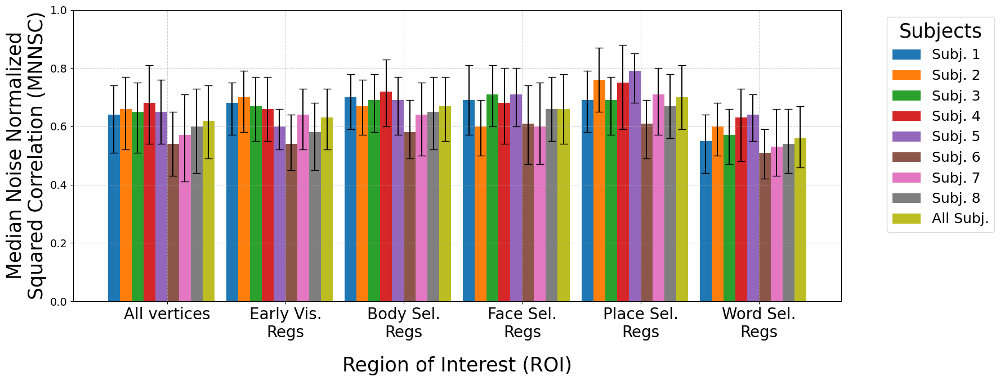

In [75]:
import matplotlib.pyplot as plt
import numpy as np

# Assumiamo che i tuoi DataFrame siano già definiti
# risultati_print, risultati_print_pq, risultati_print_tq

# Crea una figura e un asse
fig, ax = plt.subplots(figsize=(18, 7))  # Aggiungi le dimensioni desiderate qui

# Imposta la dimensione del testo
plt.rcParams.update({'font.size': 14})

# Ottieni il numero di gruppi e il numero di barre per gruppo
n_gruppi = len(risultati_print.columns)
n_barre = len(risultati_print.index)

# Definisci la larghezza delle barre e le posizioni delle barre per ogni gruppo
larghezza_barra = 0.1
posizioni_gruppi = np.arange(n_gruppi)

# Per ogni soggetto, aggiungi un set di barre al grafico
for i in range(n_barre):
    mediane = risultati_print.iloc[i]
    primo_quartile = risultati_print_pq.iloc[i]
    terzo_quartile = risultati_print_tq.iloc[i]
    posizioni_barre = posizioni_gruppi - larghezza_barra * (n_barre / 2) + larghezza_barra * i
    errore = [mediane - primo_quartile, terzo_quartile - mediane]
    ax.bar(posizioni_barre, mediane, larghezza_barra, yerr=errore, capsize=5, label=risultati_print.index[i])

# Imposta le etichette dell'asse x e mostra il grafico
ax.set_xticks(posizioni_gruppi)
titoli = ['All vertices', 'Early Vis.\nRegs', 'Body Sel.\nRegs', 'Face Sel.\nRegs',
       'Place Sel.\nRegs', 'Word Sel.\nRegs']
ax.set_xticklabels(titoli, fontsize=20)
plt.ylabel('Median Noise Normalized\nSquared Correlation (MNNSC)', fontsize=25)
plt.xlabel('Region of Interest (ROI)', fontsize=25, labelpad=20)
plt.legend(title='Subjects', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=18, title_fontsize = 25)
plt.grid(True,  linestyle='--', alpha=0.6)
plt.ylim(0, 1)
plt.tight_layout()
salvataggio = "D:\Projects\Thesis\\files\\0_analysis\config_subj1\global\miglior_modello\ValResults"
save_path = osp.join(salvataggio, 'FULL_HIST_ALL_SUBJT.png')
plt.savefig(save_path)
plt.show()


In [72]:
risultati_print.columns

Index(['All vertices', 'Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs',
       'Place Sel. Regs', 'Word Sel. Regs'],
      dtype='object')

## BOXPLOT COMPLESSIVO

In [16]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json


config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
#data_dir = "D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj01"
import matplotlib.pyplot as plt

from matplotlib.patches import Patch
import pickle
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

In [17]:
correlation_dict = {}

for subj in range(1,9):
    
    # open correlation file
    cartella_submission = f".\\files\\0_analysis\config_subj1\global\miglior_modello\ValResults\\val_correlations\\subj0{subj}" 
    file_correlation_lh = os.path.join(cartella_submission, 'lh_corr_val.npy')
    file_correlation_rh = os.path.join(cartella_submission, 'rh_corr_val.npy')
    file_correlation_full = np.concatenate((np.load(file_correlation_lh), np.load(file_correlation_rh)), axis=0)
    correlation_dict[f"subj0{subj}_LH"] = np.load(file_correlation_lh)
    correlation_dict[f"subj0{subj}_RH"] = np.load(file_correlation_rh)
    
# Inizializza le liste per contenere gli array LH e RH
lista_LH = []
lista_RH = []

# Itera sulle chiavi e i valori del dizionario
for chiave, valore in correlation_dict.items():
    if "_LH" in chiave:
        lista_LH.append(valore)
    elif "_RH" in chiave:
        lista_RH.append(valore)

# Crea le nuove chiavi nel dizionario
#correlation_dict["All_LH"] = np.vstack(lista_LH)
#correlation_dict["All_RH"] = np.vstack(lista_RH)

In [18]:
def classiy_correlation_by_roi(roi_path, lh_correlation, rh_correlation):
    # Load the ROI classes mapping dictionaries
    roi_mapping_files = ['mapping_prf-visualrois.npy', 'mapping_floc-bodies.npy',
                         'mapping_floc-faces.npy', 'mapping_floc-places.npy',
                         'mapping_floc-words.npy', 'mapping_streams.npy']
    roi_name_maps = []
    for r in roi_mapping_files:
        roi_name_maps.append(np.load(osp.join(roi_path, 'roi_masks', r),
                                     allow_pickle=True).item())

    # Load the ROI brain surface maps
    lh_challenge_roi_files = ['lh.prf-visualrois_challenge_space.npy',
                              'lh.floc-bodies_challenge_space.npy', 'lh.floc-faces_challenge_space.npy',
                              'lh.floc-places_challenge_space.npy', 'lh.floc-words_challenge_space.npy',
                              'lh.streams_challenge_space.npy']
    rh_challenge_roi_files = ['rh.prf-visualrois_challenge_space.npy',
                              'rh.floc-bodies_challenge_space.npy', 'rh.floc-faces_challenge_space.npy',
                              'rh.floc-places_challenge_space.npy', 'rh.floc-words_challenge_space.npy',
                              'rh.streams_challenge_space.npy']
    lh_challenge_rois = []
    rh_challenge_rois = []
    for l, r in zip(lh_challenge_roi_files, rh_challenge_roi_files):
        lh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', l)))
        rh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', r)))

    # Select the correlation results vertices of each ROI
    roi_names = []
    lh_roi_correlation = []
    rh_roi_correlation = []
    for r1 in range(len(lh_challenge_rois)):
        for r2 in roi_name_maps[r1].items():
            if r2[0] != 0:  # zeros indicate to vertices falling outside the ROI of interest
                roi_names.append(r2[1])
                lh_roi_idx = np.where(lh_challenge_rois[r1] == r2[0])[0]
                rh_roi_idx = np.where(rh_challenge_rois[r1] == r2[0])[0]
                lh_roi_correlation.append(lh_correlation[lh_roi_idx])
                rh_roi_correlation.append(rh_correlation[rh_roi_idx])
    
    # Add All Vertices Correlations
    
    roi_names.append('All vertices')
    lh_roi_correlation.append(lh_correlation)
    rh_roi_correlation.append(rh_correlation)
    
    # Add Unknown Functional/Stream/Both ROIs Correlations (using the generated files)
        
    lh_unknown_roi_files = ['lh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'lh.unknown_streams_ROI_masks_challenge_space.npy',
                            'lh.unknown_ROI_masks_challenge_space.npy']
    rh_unknown_roi_files = ['rh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'rh.unknown_streams_ROI_masks_challenge_space.npy',
                            'rh.unknown_ROI_masks_challenge_space.npy']
    
    roi_names.append('Unknown ROI')
    roi_names.append('Unknown Stream')
    roi_names.append('Unknown')
    
    for l, r in zip(lh_unknown_roi_files, rh_unknown_roi_files):
        lh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', l))
        lh_roi_correlation.append(lh_correlation[lh_challenge_unknown != 0])
        rh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', r))
        rh_roi_correlation.append(rh_correlation[rh_challenge_unknown != 0])

    
    return roi_names, lh_roi_correlation, rh_roi_correlation

In [19]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json
import plotly.io as pio
import matplotlib.image as mpimg

column_order = ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words', 'Unknown ROI', 'All vertices']


def box_plot(correlation_dict, save=None):
    """
        Visualize the correlation result
        Args:
            roi_path,           str, path to ROI masks
            lh_correlation,     np.ndarray, left hemisphere correlation
            rh_correlation,     np.ndarray, right hemishphere correlation
            title,              str, title of the figure
            save,               str, where to save the graph
    """
    # Creo vettore per tenere poi i vertici di tutti i soggetti (per fare boxplot o conti) -> 35 ROI + 7 classi
    all_subjs_roi_correlation = [np.array([]) for _ in range(35)] 
    
    # Itero sui singoli soggetti e a mano a mano creo il dataset dei risultati
    for subj in range(1,9):
        roi_path = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}"
        model_layer_id = f'Subj. {subj}'
        lh_correlation = correlation_dict[f"subj0{subj}_LH"]
        rh_correlation = correlation_dict[f"subj0{subj}_RH"]
        
        roi_names, lh_roi_correlation, rh_roi_correlation = classiy_correlation_by_roi(
            roi_path, lh_correlation, rh_correlation)
        r = list()
        p = list()
        h = list()
        for i in range(len(roi_names)):
            r += [roi_names[i]] * len(lh_roi_correlation[i])
            p += lh_roi_correlation[i].tolist()
            h += ["Left"] * len(lh_roi_correlation[i])

            r += [roi_names[i]] * len(rh_roi_correlation[i])
            p += rh_roi_correlation[i].tolist()
            h += ["Right"] * len(rh_roi_correlation[i])

        df = pd.DataFrame({"ROIs": r, "Noise Normalized Encoding Accuracy": p, "Hemisphere": h})
        if subj == 1:
            df_all = df
        else:
            df_all = pd.concat([df_all, df])
            

    # draw the diagram
    fig = px.box(df_all, x="ROIs", y="Noise Normalized Encoding Accuracy", color="Hemisphere",
                 hover_data=df_all.columns.tolist(), width=1500, height=500)
    fig.update_xaxes(categoryorder='array',
                     categoryarray=column_order, tickangle=45)
    fig.update_xaxes(title_text='Region of Interest (ROI)')
    fig.update_yaxes(title_text='Voxel-Wise Noise Normalized\nSquared Correlation (NNSC)')
    save_path = osp.join(save, 'FULL_BOXPLOT_AL_SUBJT.png')
    pio.write_image(fig, save_path, scale=2.5)
    img = mpimg.imread(save_path)
    imgplot = plt.imshow(img)
    plt.show()
    #if save is not None:
#
    #    # if not osp.isdir(save):
    #    #     os.makedirs(save)
#
    #    to_save = osp.join(save, "box_pearson_{}".format(
    #        strftime("%Y%m%d%H%M%S")))
#
    #    fig.write_html(to_save+ str([filename if filename is not None else ""][0])+".html")
    #    fig.write_image(to_save+ str([filename if filename is not None else ""][0])+".png")
    #    # pio.write_image(fig, to_save+".png")

    return fig, df_all


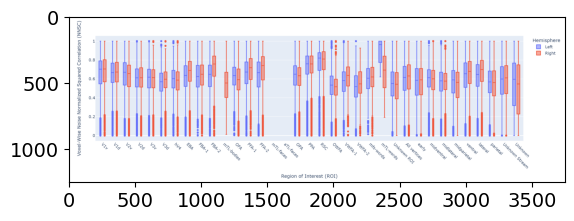

In [21]:
salvataggio = "D:\Projects\Thesis\\files\\0_analysis\config_subj1\global\miglior_modello\ValResults"
fig, df = box_plot(correlation_dict, save = salvataggio)

In [25]:
# find unique values di ROIs  
df["ROIs"].unique()

array(['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1',
       'FBA-2', 'OFA', 'FFA-1', 'FFA-2', 'OPA', 'PPA', 'RSC', 'OWFA',
       'VWFA-1', 'VWFA-2', 'mfs-words', 'early', 'midventral',
       'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal',
       'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown',
       'mTL-bodies', 'mTL-words'], dtype=object)

In [32]:
# group around ROIs and Hemisphere column and find median value of Noise Normalized Encoding Accuracy
df_grouped = df.groupby(['ROIs']).median().reset_index()
df_grouped
# delete ROIs with ROIs value All vertices 'early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal','All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown'
df_grouped = df_grouped[~df_grouped['ROIs'].isin(['early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal','All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown'])]
# order rows based on ROIs values: 'V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words', 'Unknown ROI', 'All vertices'                     
roi_order = ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words']
# Convert the 'ROIs' column to a categorical type with the specified order
df_grouped['ROIs'] = pd.Categorical(df_grouped['ROIs'], categories=roi_order, ordered=True)

# Sort the DataFrame based on the 'ROIs' column
df_sorted = df_grouped.sort_values(by='ROIs')

C:\Users\giorg\AppData\Local\Temp\ipykernel_26712\2774600677.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [33]:
df_sorted
                                

,ROIs,Noise Normalized Encoding Accuracy
15,V1v,0.704406
14,V1d,0.669119
17,V2v,0.663452
16,V2d,0.611897
19,V3v,0.615935
18,V3d,0.584860
23,hV4,0.595875
1,EBA,0.666193
2,FBA-1,0.641703
3,FBA-2,0.696675


In [35]:
# print to latex the dataset with indentation 
print(df_sorted.to_latex(index=False))

\begin{tabular}{lr}
\toprule
      ROIs &  Noise Normalized Encoding Accuracy \\
\midrule
       V1v &                            0.704406 \\
       V1d &                            0.669119 \\
       V2v &                            0.663452 \\
       V2d &                            0.611897 \\
       V3v &                            0.615935 \\
       V3d &                            0.584860 \\
       hV4 &                            0.595875 \\
       EBA &                            0.666193 \\
     FBA-1 &                            0.641703 \\
     FBA-2 &                            0.696675 \\
mTL-bodies &                            0.556919 \\
       OFA &                            0.613449 \\
     FFA-1 &                            0.695676 \\
     FFA-2 &                            0.711645 \\
       OPA &                            0.641447 \\
       PPA &                            0.759310 \\
       RSC &                            0.814247 \\
      OWFA &              

C:\Users\giorg\AppData\Local\Temp\ipykernel_26712\208951518.py:2: FutureWarning:

In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.



In [9]:
df.columns.tolist()

['ROIs', 'Noise Normalized Encoding Accuracy', 'Hemisphere']

In [ ]:
for subj in range(1,9):
    print(f"subj0{subj}")
    data_dir = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}"

    box_plot(data_dir, correlation_dict[f'subj0{subj}_LH'], correlation_dict[f'subj0{subj}_RH'], f'subj0{subj}')
       
risultati

## Baseline BOXPLOT, HISTOGRAM, RISULTATI

In [1]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json


config_subj = subj = 1
extraction_config_folder = f'config_subj{config_subj}'
global_config_dir = f'./files/0_analysis/{extraction_config_folder}/global'
#data_dir = "D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj01"
import matplotlib.pyplot as plt

from matplotlib.patches import Patch
import pickle
# Importing the df containing ROI_wise accuracy for all the layers tested in the past    

In [2]:
correlation_dict = {}

for subj in range(1,9):
    
    # open correlation file
    cartella_submission = f".\\files\\0_analysis\config_subj1\global\modello_baseline\ValResults\\val_correlations\\subj0{subj}" 
    file_correlation_lh = os.path.join(cartella_submission, 'lh_corr_val.npy')
    file_correlation_rh = os.path.join(cartella_submission, 'rh_corr_val.npy')
    file_correlation_full = np.concatenate((np.load(file_correlation_lh), np.load(file_correlation_rh)), axis=0)
    correlation_dict[f"subj0{subj}_LH"] = np.load(file_correlation_lh)
    correlation_dict[f"subj0{subj}_RH"] = np.load(file_correlation_rh)
    
# Inizializza le liste per contenere gli array LH e RH
lista_LH = []
lista_RH = []

# Itera sulle chiavi e i valori del dizionario
for chiave, valore in correlation_dict.items():
    if "_LH" in chiave:
        lista_LH.append(valore)
    elif "_RH" in chiave:
        lista_RH.append(valore)

# Crea le nuove chiavi nel dizionario
#correlation_dict["All_LH"] = np.vstack(lista_LH)
#correlation_dict["All_RH"] = np.vstack(lista_RH)

In [3]:
def classiy_correlation_by_roi(roi_path, lh_correlation, rh_correlation):
    # Load the ROI classes mapping dictionaries
    roi_mapping_files = ['mapping_prf-visualrois.npy', 'mapping_floc-bodies.npy',
                         'mapping_floc-faces.npy', 'mapping_floc-places.npy',
                         'mapping_floc-words.npy', 'mapping_streams.npy']
    roi_name_maps = []
    for r in roi_mapping_files:
        roi_name_maps.append(np.load(osp.join(roi_path, 'roi_masks', r),
                                     allow_pickle=True).item())

    # Load the ROI brain surface maps
    lh_challenge_roi_files = ['lh.prf-visualrois_challenge_space.npy',
                              'lh.floc-bodies_challenge_space.npy', 'lh.floc-faces_challenge_space.npy',
                              'lh.floc-places_challenge_space.npy', 'lh.floc-words_challenge_space.npy',
                              'lh.streams_challenge_space.npy']
    rh_challenge_roi_files = ['rh.prf-visualrois_challenge_space.npy',
                              'rh.floc-bodies_challenge_space.npy', 'rh.floc-faces_challenge_space.npy',
                              'rh.floc-places_challenge_space.npy', 'rh.floc-words_challenge_space.npy',
                              'rh.streams_challenge_space.npy']
    lh_challenge_rois = []
    rh_challenge_rois = []
    for l, r in zip(lh_challenge_roi_files, rh_challenge_roi_files):
        lh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', l)))
        rh_challenge_rois.append(
            np.load(osp.join(roi_path, 'roi_masks', r)))

    # Select the correlation results vertices of each ROI
    roi_names = []
    lh_roi_correlation = []
    rh_roi_correlation = []
    for r1 in range(len(lh_challenge_rois)):
        for r2 in roi_name_maps[r1].items():
            if r2[0] != 0:  # zeros indicate to vertices falling outside the ROI of interest
                roi_names.append(r2[1])
                lh_roi_idx = np.where(lh_challenge_rois[r1] == r2[0])[0]
                rh_roi_idx = np.where(rh_challenge_rois[r1] == r2[0])[0]
                lh_roi_correlation.append(lh_correlation[lh_roi_idx])
                rh_roi_correlation.append(rh_correlation[rh_roi_idx])
    
    # Add All Vertices Correlations
    
    roi_names.append('All vertices')
    lh_roi_correlation.append(lh_correlation)
    rh_roi_correlation.append(rh_correlation)
    
    # Add Unknown Functional/Stream/Both ROIs Correlations (using the generated files)
        
    lh_unknown_roi_files = ['lh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'lh.unknown_streams_ROI_masks_challenge_space.npy',
                            'lh.unknown_ROI_masks_challenge_space.npy']
    rh_unknown_roi_files = ['rh.unknown_functional_ROI_masks_challenge_space.npy', 
                            'rh.unknown_streams_ROI_masks_challenge_space.npy',
                            'rh.unknown_ROI_masks_challenge_space.npy']
    
    roi_names.append('Unknown ROI')
    roi_names.append('Unknown Stream')
    roi_names.append('Unknown')
    
    for l, r in zip(lh_unknown_roi_files, rh_unknown_roi_files):
        lh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', l))
        lh_roi_correlation.append(lh_correlation[lh_challenge_unknown != 0])
        rh_challenge_unknown = np.load(osp.join(roi_path, 'roi_masks_enhanced', 
                                                'unknown_masks', r))
        rh_roi_correlation.append(rh_correlation[rh_challenge_unknown != 0])

    
    return roi_names, lh_roi_correlation, rh_roi_correlation

In [4]:
functional_classes = ["Early Vis. Regs", "Body Sel. Regs", "Face Sel. Regs", "Place Sel. Regs", "Word Sel. Regs", "Anatomical Streams", "Unknown Label"]

colonne_dataset = ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words', 'early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal', 'All vertices', 'Unknown ROI', 'Unknown Stream', 'Unknown'] 

regions_dict = {
    "Early Vis. Regs": ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"],
    "Body Sel. Regs": ["EBA", "FBA-1", "FBA-2", "mTL-bodies"],
    "Face Sel. Regs": ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"],
    "Place Sel. Regs": ["OPA", "PPA", "RSC"],
    "Word Sel. Regs": ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"],
    "Anatomical Streams": ["early", "midventral", "midlateral", "midparietal", 
                            "ventral", "lateral", "parietal"],
    "Unknown Label": ["Unknown ROI", "Unknown Stream", "Unknown"]}
    
# Inizializza il nuovo dizionario
dizionario_classe_indiceroi = {}

# Itera sulle chiavi e i valori del dizionario regions_dict
for chiave, valori in regions_dict.items():
    # Sostituisci ogni stringa con il suo indice in colonne_dataset
    dizionario_classe_indiceroi[chiave] = [colonne_dataset.index(valore) for valore in valori]
    
dizionario_classe_indiceroi

{'Early Vis. Regs': [0, 1, 2, 3, 4, 5, 6],
 'Body Sel. Regs': [7, 8, 9, 10],
 'Face Sel. Regs': [11, 12, 13, 14, 15],
 'Place Sel. Regs': [16, 17, 18],
 'Word Sel. Regs': [19, 20, 21, 22, 23],
 'Anatomical Streams': [24, 25, 26, 27, 28, 29, 30],
 'Unknown Label': [32, 33, 34]}

In [5]:
def noise_norm_corr_ROI_df_DICT(correlation_dict):
    """
        Create a dataframe with the correlation results classified by ROI
    """
    # Creo vettore delle label della functional classes
    functional_classes = ["Early Vis. Regs", "Body Sel. Regs", "Face Sel. Regs", "Place Sel. Regs", "Word Sel. Regs", "Anatomical Streams", "Unknown Label"]    
    # dizionario che associa ogni classe all'indice nella lista dei array dei ROI
    dizionario_classe_indiceroi = {'Early Vis. Regs': [0, 1, 2, 3, 4, 5, 6],
        'Body Sel. Regs': [7, 8, 9, 10],
        'Face Sel. Regs': [11, 12, 13, 14, 15],
        'Place Sel. Regs': [16, 17, 18],
        'Word Sel. Regs': [19, 20, 21, 22, 23],
        'Anatomical Streams': [24, 25, 26, 27, 28, 29, 30],
        'Unknown Label': [32, 33, 34]}
    # Creo vettore per tenere poi i vertici di tutti i soggetti (per fare boxplot o conti) -> 35 ROI + 7 classi
    all_subjs_roi_correlation = [np.array([]) for _ in range(42)]                                         
    # Itero sui singoli soggetti e a mano a mano creo il dataset dei risultati
    for subj in range(1,9):
        roi_path = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}"
        model_layer_id = f'Subj. {subj}'
        lh_correlation = correlation_dict[f"subj0{subj}_LH"]
        rh_correlation = correlation_dict[f"subj0{subj}_RH"]
        
        roi_names, lh_roi_correlation, rh_roi_correlation = classiy_correlation_by_roi(
            roi_path, lh_correlation, rh_correlation)
        #print(roi_names)
        # I concatenate lh and rh correlation for each ROI to choose a single layer for each ROI
        roi_correlation = []
        if len(lh_roi_correlation) == len(rh_roi_correlation):
            # Ciclo per concatenare gli elementi corrispondenti delle due liste
            for vettore1, vettore2 in zip(lh_roi_correlation, rh_roi_correlation):
                vettore_concatenato = np.concatenate((vettore1, vettore2), axis=0)
                roi_correlation.append(vettore_concatenato)
        else:
            print("Lists have different length")
        # Aggiungo alle liste di correlazioni dei ROI delle liste relative alle classe funzionali combinando liste di correlazioni diverse CLASSI FUNZIONALI
        for chiave, indici in dizionario_classe_indiceroi.items():
            # Filtra gli indici per cui l'array corrispondente in roi_correlation non è vuoto
            indici_non_vuoti = [indice for indice in indici if roi_correlation[indice].size > 0]
            if indici_non_vuoti:
                #print(indici_non_vuoti)
            # Concatena gli array corrispondenti
                array_concatenato = np.concatenate([roi_correlation[indice] for indice in indici_non_vuoti])
                roi_correlation.append(array_concatenato)
        # Salvo le correlazioni dei singoli vertici nei 35 array relativi ai 35 ROI  
        print("Numero di ROI:" + str(len(roi_correlation)))
        for i in range(len(roi_correlation)):
            all_subjs_roi_correlation[i] = np.concatenate((all_subjs_roi_correlation[i], roi_correlation[i]))
        
        # mediane
        median_roi_correlation = [[
            np.nanmedian(corr) if len(corr) > 0 else np.nan for corr in roi_correlation]]
        # Calcola il primo quartile (25° percentile)
        first_quartile_roi_correlation = [[
            np.nanpercentile(corr, 25) if len(corr) > 0 else np.nan for corr in roi_correlation]]

        # Calcola il terzo quartile (75° percentile)
        third_quartile_roi_correlation = [[
            np.nanpercentile(corr, 75) if len(corr) > 0 else np.nan for corr in roi_correlation]]
        
        # Save the median correlation for each ROI
        if subj == 1:
            median_roi_correlation_df = pd.DataFrame(median_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])  
            # Dataset Quartili
            first_quartile_roi_correlation_df = pd.DataFrame(first_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])
            third_quartile_roi_correlation_df = pd.DataFrame(third_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])
        else: 
            median_roi_correlation_df = pd.concat([median_roi_correlation_df, pd.DataFrame(median_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])])
            # Dataset Quartili
            first_quartile_roi_correlation_df = pd.concat([first_quartile_roi_correlation_df, pd.DataFrame(first_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])])
            third_quartile_roi_correlation_df = pd.concat([third_quartile_roi_correlation_df, pd.DataFrame(third_quartile_roi_correlation, columns=roi_names+functional_classes, index=[model_layer_id])])
    # creo la riga rilativa a tutti i soggetti 
    median_roi_correlation = [[
        np.nanmedian(corr) if len(corr) > 0 else np.nan for corr in all_subjs_roi_correlation]]
    # Calcola il primo quartile (25° percentile)
    first_quartile_roi_correlation = [[
        np.nanpercentile(corr, 25) if len(corr) > 0 else np.nan for corr in all_subjs_roi_correlation]]
    third_quartile_roi_correlation = [[
        np.nanpercentile(corr, 75) if len(corr) > 0 else np.nan for corr in all_subjs_roi_correlation]]
    
    # Crea df
    median_roi_correlation_df = pd.concat([median_roi_correlation_df, pd.       DataFrame(median_roi_correlation, columns=roi_names+functional_classes, index=["All Subj."])])
    
    # Dataset Quartili
    first_quartile_roi_correlation_df = pd.concat([first_quartile_roi_correlation_df, pd.DataFrame(first_quartile_roi_correlation, columns=roi_names+functional_classes, index=["All Subj."])])
    
    third_quartile_roi_correlation_df = pd.concat([third_quartile_roi_correlation_df, pd.DataFrame(third_quartile_roi_correlation, columns=roi_names+functional_classes, index=["All Subj."])])
    
    
    return median_roi_correlation_df, first_quartile_roi_correlation_df, third_quartile_roi_correlation_df

In [6]:
correlation_dict.keys()


dict_keys(['subj01_LH', 'subj01_RH', 'subj02_LH', 'subj02_RH', 'subj03_LH', 'subj03_RH', 'subj04_LH', 'subj04_RH', 'subj05_LH', 'subj05_RH', 'subj06_LH', 'subj06_RH', 'subj07_LH', 'subj07_RH', 'subj08_LH', 'subj08_RH'])

In [7]:
risultati, risultati_pq, risultati_tq  = noise_norm_corr_ROI_df_DICT(correlation_dict)
risultati

Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42
Numero di ROI:42


,V1v,V1d,V2v,V2d,V3v,V3d,hV4,EBA,FBA-1,FBA-2,...,Unknown ROI,Unknown Stream,Unknown,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs,Anatomical Streams,Unknown Label
Subj. 1,0.379088,0.397305,0.396450,0.439122,0.392632,0.429543,0.469322,0.470463,0.509852,0.563714,...,0.436204,0.428696,0.530601,0.416000,0.481163,0.506976,0.525167,0.365124,0.448825,0.434869
Subj. 2,0.471582,0.556456,0.372388,0.351356,0.474422,0.443060,0.543339,0.537298,NaN,0.507399,...,0.438552,0.452821,0.163719,0.473544,0.532028,0.455903,0.637749,0.434353,0.505914,0.439882
Subj. 3,0.582491,0.533316,0.516430,0.454684,0.472933,0.465297,0.506384,0.514212,0.472468,0.611316,...,0.475027,0.478415,0.309824,0.503178,0.513535,0.574343,0.547907,0.423165,0.502771,0.475951
Subj. 4,0.570621,0.557479,0.530634,0.476315,0.484792,0.455352,0.455334,0.534460,0.556233,0.481617,...,0.514936,0.496858,0.566217,0.506099,0.531481,0.541591,0.563599,0.441077,0.511521,0.505522
Subj. 5,0.617190,0.538407,0.563729,0.473218,0.483910,0.463623,0.467625,0.495487,0.493301,0.500467,...,0.443253,0.513109,0.511348,0.519155,0.495514,0.521300,0.632989,0.435932,0.514527,0.494291
Subj. 6,0.450172,0.469250,0.409882,0.415447,0.382642,0.367624,0.382390,0.384585,0.395728,0.330401,...,0.321697,0.412965,0.381257,0.415737,0.383829,0.464177,0.421832,0.365389,0.386263,0.384194
Subj. 7,0.513768,0.501557,0.517403,0.434219,0.502996,0.394856,0.452789,0.482771,NaN,0.497734,...,0.350687,0.431643,0.097062,0.478594,0.483698,0.485142,0.546105,0.405680,0.445458,0.390647
Subj. 8,0.430903,0.482950,0.451320,0.418590,0.431723,0.385902,0.519022,0.480098,0.422961,0.557678,...,0.371789,0.423049,0.452200,0.442762,0.481558,0.540234,0.505717,0.351610,0.437072,0.402293
All Subj.,0.518129,0.500282,0.479328,0.439896,0.456426,0.424860,0.477838,0.490792,0.467431,0.511768,...,0.417804,0.454711,0.408142,0.469556,0.490260,0.515781,0.548034,0.398738,0.468497,0.439594


In [8]:
risultati_print = risultati[['All vertices','Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs']].round(2)
risultati_print_pq = risultati_pq[['All vertices','Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs']].round(2)
risultati_print_tq = risultati_tq[['All vertices','Early Vis. Regs', 'Body Sel. Regs', 'Face Sel. Regs', 'Place Sel. Regs', 'Word Sel. Regs']].round(2)
risultati_print

,All vertices,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs
Subj. 1,0.45,0.42,0.48,0.51,0.53,0.37
Subj. 2,0.51,0.47,0.53,0.46,0.64,0.43
Subj. 3,0.50,0.50,0.51,0.57,0.55,0.42
Subj. 4,0.52,0.51,0.53,0.54,0.56,0.44
Subj. 5,0.52,0.52,0.50,0.52,0.63,0.44
Subj. 6,0.39,0.42,0.38,0.46,0.42,0.37
Subj. 7,0.45,0.48,0.48,0.49,0.55,0.41
Subj. 8,0.44,0.44,0.48,0.54,0.51,0.35
All Subj.,0.47,0.47,0.49,0.52,0.55,0.40


In [9]:
risultati_print_pq

,All vertices,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs
Subj. 1,0.34,0.31,0.36,0.37,0.45,0.29
Subj. 2,0.36,0.31,0.43,0.34,0.54,0.35
Subj. 3,0.39,0.41,0.41,0.48,0.45,0.34
Subj. 4,0.40,0.41,0.42,0.40,0.44,0.33
Subj. 5,0.40,0.43,0.39,0.42,0.55,0.36
Subj. 6,0.29,0.35,0.28,0.35,0.33,0.28
Subj. 7,0.32,0.38,0.37,0.35,0.46,0.32
Subj. 8,0.30,0.34,0.34,0.41,0.38,0.27
All Subj.,0.35,0.36,0.37,0.40,0.44,0.31


In [10]:
risultati_print_tq

,All vertices,Early Vis. Regs,Body Sel. Regs,Face Sel. Regs,Place Sel. Regs,Word Sel. Regs
Subj. 1,0.55,0.51,0.59,0.62,0.60,0.46
Subj. 2,0.62,0.60,0.61,0.56,0.75,0.53
Subj. 3,0.60,0.60,0.60,0.65,0.63,0.51
Subj. 4,0.63,0.59,0.64,0.66,0.67,0.54
Subj. 5,0.61,0.59,0.59,0.61,0.68,0.51
Subj. 6,0.48,0.49,0.50,0.57,0.50,0.45
Subj. 7,0.56,0.55,0.59,0.60,0.61,0.54
Subj. 8,0.58,0.55,0.62,0.64,0.61,0.45
All Subj.,0.58,0.56,0.59,0.62,0.64,0.50


In [11]:
print(risultati_print.to_latex(index=True))

\begin{tabular}{lrrrrrr}
\toprule
{} &  All vertices &  Early Vis. Regs &  Body Sel. Regs &  Face Sel. Regs &  Place Sel. Regs &  Word Sel. Regs \\
\midrule
Subj. 1   &          0.45 &             0.42 &            0.48 &            0.51 &             0.53 &            0.37 \\
Subj. 2   &          0.51 &             0.47 &            0.53 &            0.46 &             0.64 &            0.43 \\
Subj. 3   &          0.50 &             0.50 &            0.51 &            0.57 &             0.55 &            0.42 \\
Subj. 4   &          0.52 &             0.51 &            0.53 &            0.54 &             0.56 &            0.44 \\
Subj. 5   &          0.52 &             0.52 &            0.50 &            0.52 &             0.63 &            0.44 \\
Subj. 6   &          0.39 &             0.42 &            0.38 &            0.46 &             0.42 &            0.37 \\
Subj. 7   &          0.45 &             0.48 &            0.48 &            0.49 &             0.55 &            0.41

C:\Users\giorg\AppData\Local\Temp\ipykernel_26712\2597444684.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(risultati_print.to_latex(index=True))


In [15]:
risultati_print["All vertices"]

Subj. 1      0.45
Subj. 2      0.51
Subj. 3      0.50
Subj. 4      0.52
Subj. 5      0.52
Subj. 6      0.39
Subj. 7      0.45
Subj. 8      0.44
All Subj.    0.47
Name: All vertices, dtype: float64

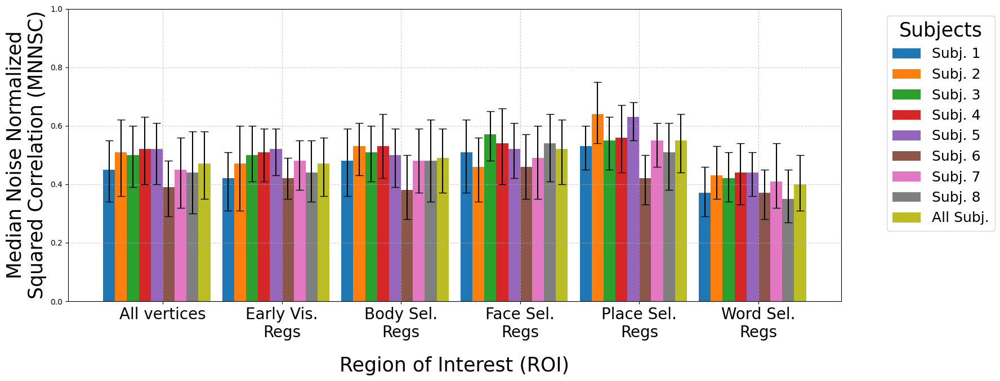

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Assumiamo che i tuoi DataFrame siano già definiti
# risultati_print, risultati_print_pq, risultati_print_tq

# Crea una figura e un asse
fig, ax = plt.subplots(figsize=(18, 7))  # Aggiungi le dimensioni desiderate qui

# Imposta la dimensione del testo
plt.rcParams.update({'font.size': 14})

# Ottieni il numero di gruppi e il numero di barre per gruppo
n_gruppi = len(risultati_print.columns)
n_barre = len(risultati_print.index)

# Definisci la larghezza delle barre e le posizioni delle barre per ogni gruppo
larghezza_barra = 0.1
posizioni_gruppi = np.arange(n_gruppi)

# Per ogni soggetto, aggiungi un set di barre al grafico
for i in range(n_barre):
    mediane = risultati_print.iloc[i]
    primo_quartile = risultati_print_pq.iloc[i]
    terzo_quartile = risultati_print_tq.iloc[i]
    posizioni_barre = posizioni_gruppi - larghezza_barra * (n_barre / 2) + larghezza_barra * i
    errore = [mediane - primo_quartile, terzo_quartile - mediane]
    ax.bar(posizioni_barre, mediane, larghezza_barra, yerr=errore, capsize=5, label=risultati_print.index[i])

# Imposta le etichette dell'asse x e mostra il grafico
ax.set_xticks(posizioni_gruppi)
titoli = ['All vertices', 'Early Vis.\nRegs', 'Body Sel.\nRegs', 'Face Sel.\nRegs',
       'Place Sel.\nRegs', 'Word Sel.\nRegs']
ax.set_xticklabels(titoli, fontsize=20)
plt.ylabel('Median Noise Normalized\nSquared Correlation (MNNSC)', fontsize=25)
plt.xlabel('Region of Interest (ROI)', fontsize=25, labelpad=20)
plt.legend(title='Subjects', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=18, title_fontsize = 25)
plt.grid(True,  linestyle='--', alpha=0.6)
plt.ylim(0, 1)
plt.tight_layout()
salvataggio = "D:\Projects\Thesis\\files\\0_analysis\config_subj1\global\modello_baseline\ValResults"
save_path = osp.join(salvataggio, 'FULL_HIST_ALL_SUBJT.png')
plt.savefig(save_path)
plt.show()


In [13]:
from time import strftime
import os
import os.path as osp

import numpy as np
import pandas as pd
# import kaleido
import plotly.express as px
#import plotly.io as pio
import json
import plotly.io as pio
import matplotlib.image as mpimg

column_order = ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'EBA', 'FBA-1', 'FBA-2', 'mTL-bodies', 'OFA', 'FFA-1', 'FFA-2', 'mTL-faces', 'aTL-faces', 'OPA', 'PPA', 'RSC', 'OWFA', 'VWFA-1', 'VWFA-2', 'mfs-words', 'mTL-words', 'Unknown ROI', 'All vertices']


def box_plot(correlation_dict, save=None):
    """
        Visualize the correlation result
        Args:
            roi_path,           str, path to ROI masks
            lh_correlation,     np.ndarray, left hemisphere correlation
            rh_correlation,     np.ndarray, right hemishphere correlation
            title,              str, title of the figure
            save,               str, where to save the graph
    """
    # Creo vettore per tenere poi i vertici di tutti i soggetti (per fare boxplot o conti) -> 35 ROI + 7 classi
    all_subjs_roi_correlation = [np.array([]) for _ in range(35)] 
    
    # Itero sui singoli soggetti e a mano a mano creo il dataset dei risultati
    for subj in range(1,9):
        roi_path = f"D:\\Projects\\Datasets\\Biomedical\\algonauts_2023_challenge_data\\subj0{subj}"
        model_layer_id = f'Subj. {subj}'
        lh_correlation = correlation_dict[f"subj0{subj}_LH"]
        rh_correlation = correlation_dict[f"subj0{subj}_RH"]
        
        roi_names, lh_roi_correlation, rh_roi_correlation = classiy_correlation_by_roi(
            roi_path, lh_correlation, rh_correlation)
        r = list()
        p = list()
        h = list()
        for i in range(len(roi_names)):
            r += [roi_names[i]] * len(lh_roi_correlation[i])
            p += lh_roi_correlation[i].tolist()
            h += ["Left"] * len(lh_roi_correlation[i])

            r += [roi_names[i]] * len(rh_roi_correlation[i])
            p += rh_roi_correlation[i].tolist()
            h += ["Right"] * len(rh_roi_correlation[i])

        df = pd.DataFrame({"ROIs": r, "Noise Normalized Encoding Accuracy": p, "Hemisphere": h})
        if subj == 1:
            df_all = df
        else:
            df_all = pd.concat([df_all, df])
            

    # draw the diagram
    fig = px.box(df_all, x="ROIs", y="Noise Normalized Encoding Accuracy", color="Hemisphere",
                 hover_data=df_all.columns.tolist(), width=1500, height=500)
    fig.update_xaxes(categoryorder='array',
                     categoryarray=column_order, tickangle=45)
    fig.update_xaxes(title_text='Region of Interest (ROI)')
    fig.update_yaxes(title_text='Voxel-Wise Noise Normalized\nSquared Correlation (NNSC)')
    save_path = osp.join(save, 'FULL_BOXPLOT_AL_SUBJT.png')
    pio.write_image(fig, save_path, scale=2.5)
    img = mpimg.imread(save_path)
    imgplot = plt.imshow(img)
    plt.show()
    #if save is not None:
#
    #    # if not osp.isdir(save):
    #    #     os.makedirs(save)
#
    #    to_save = osp.join(save, "box_pearson_{}".format(
    #        strftime("%Y%m%d%H%M%S")))
#
    #    fig.write_html(to_save+ str([filename if filename is not None else ""][0])+".html")
    #    fig.write_image(to_save+ str([filename if filename is not None else ""][0])+".png")
    #    # pio.write_image(fig, to_save+".png")

    return fig, df_all


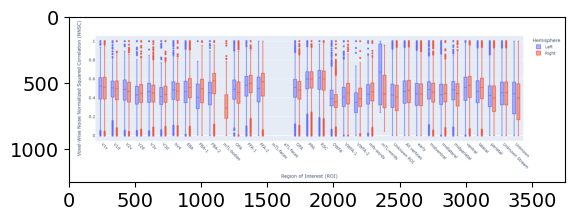

In [14]:
salvataggio = "D:\Projects\Thesis\\files\\0_analysis\config_subj1\global\modello_baseline\ValResults"
fig, df = box_plot(correlation_dict, save = salvataggio)